# Monte Carlo : Voyageur du Commerce

#### Modules nécessaires

In [2]:
import numpy as np
import pandas as pd
import geopy
import time
from scipy.stats import chisquare
from matplotlib import pyplot as plt
from tsp_solver.greedy import solve_tsp
from bokeh.plotting import figure, show
from bokeh.io import output_notebook, push_notebook, show
%matplotlib inline


# Question n°1

## Création de la loi multinomiale

D'abord, il faut une fonction qui choisit une des villes possibles, selon des probabilités choisies en amont. Cela est réalisé grâce à une loi uniforme sur $[0;1]$ et à une segmentation choisie sur $[0;1]$ à partir de la probabilité de choisir une ville.

In [2]:
def assign(M,suplimits,rand):
    """
        suplimits : Liste des proba cumulées
        rand      : Liste des probabilités uniformes sur [0;1]
        M         : Nombres de ville
    """
    sample = []
    for i in range(len(rand)):
        if rand[i]<suplimits[0]:
            sample.append(1)
        for j in range(len(suplimits)):
            if rand[i]>= suplimits[j] and rand[i]<=suplimits[j+1]:
                sample.append(j+2)
    return sample  

In [3]:
#Exemple
assign(3,[0.1,0.5,1],np.random.uniform(0,1,10))

[1, 2, 1, 3, 1, 3, 2, 3, 3, 2]

Ensuite, il faut réitérer cette étape plusieurs fois, mais il faut en plus compter dans ce nombre d'itérations le nombre de fois qu'une ville a été sélectionné. Nous prenons le soin de vérifier que les probabilités données en entrée sont bien normées à $1$.

In [4]:
def Nmulti(N,n,proba):
    """
        N : Nombre de "dés" multinomiales
        n : Nombre de Simulations (nombre de fois qu'on va jeter les N dès)
        proba  : Les poids attribués à chaque ville ~ les probabilités de tomber dessus
    """
    proba_norm = [float(i)/sum(proba) for i in proba]
    if abs(1-sum(proba_norm))<=10^-10:
        return "Somme de proba différent de 1"
    else:
        p = proba_norm
        suplimits = np.cumsum(p)

        matrix = [] #Liste vide où l'on va ajouté des listes
        for i in range(1,n+1):
            matrix.append(assign(len(proba),suplimits,np.random.uniform(0,1,N)))

        res =[]
        for i in range(n):
            l=[]
            for j in range(1,len(proba)+1):
                l.append(matrix[i].count(j))
            res.append(l)
        return np.array(res)

In [5]:
#Exemple
Nmulti(100,10,[1/2,1/4,1/4])

array([[48, 24, 28],
       [40, 26, 34],
       [44, 27, 29],
       [52, 19, 29],
       [51, 24, 25],
       [50, 33, 17],
       [60, 19, 21],
       [49, 28, 23],
       [52, 24, 24],
       [49, 23, 28]])

## Génération aléatoires de villes pour le TSP

Afin d'éviter de créer $n$ villes manuellement, le programme suivant s'en occupe.

In [19]:
def gen_villes(nb):
    x = np.random.uniform(0,1,nb)
    y = np.random.uniform(0,1,nb)
    villes = []
    for i in range(len(x)):
        villes.append([str(i+1),(x[i],y[i])])
    return(villes)

Ensuite, nous avons deux fonctions pour tracer les villes dans un plan. L'un avec juste le nombre de villes souhaité, l'autre avec déjà une liste de ville établie.

In [20]:
def plot_villes(nb):
    villes = gen_villes(nb)

    fig = plt.figure()
    ax = fig.add_subplot(111)

    A = [villes[i][1][0] for i in range(len(villes))]
    B = [villes[i][1][1] for i in range(len(villes))]
    n=[villes[i][0] for i in range(len(villes))]

    for i, txt in enumerate(n):
        ax.annotate(txt, (A[i],B[i]))
    plt.scatter(A,B)
    plt.grid()
    plt.axis('equal')
    plt.show()

def plot_villes_connus(villes):
    fig = plt.figure()
    ax = fig.add_subplot(111)

    A = [villes[i][1][0] for i in range(len(villes))]
    B = [villes[i][1][1] for i in range(len(villes))]
    n=[villes[i][0] for i in range(len(villes))]

    for i, txt in enumerate(n):
        ax.annotate(txt, (A[i],B[i]))
    plt.scatter(A,B)
    plt.grid()
    plt.axis('equal')
    plt.show()

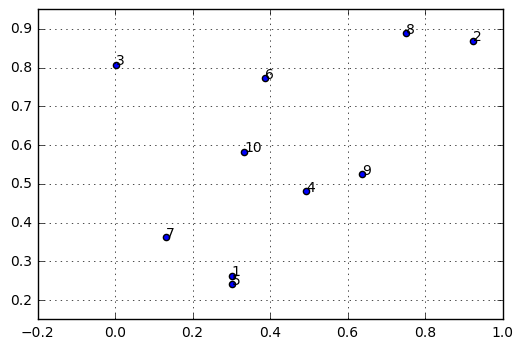

In [21]:
villes = gen_villes(10)
plot_villes_connus(villes)

L'algorithme générant une matrice de distances à partir de coordonnées est le suivant :

In [22]:
def matrice_distances(villes):
    matrice_des_distances = [[0 for i in range(len(villes))]for j in range(0,len(villes))]
    for i in range(0,len(villes)):
        for j in range(0,len(villes)):
            matrice_des_distances[i][j]=np.sqrt(((villes[i][1][0]-villes[j][1][0])**2) + ((villes[i][1][1]-villes[j][1][1])**2))
    return(matrice_des_distances)

Par rapport à notre exemple :

In [23]:
matrice_distance = matrice_distances(villes) 
pd.DataFrame(matrice_distance ,
             columns = range(1,len(matrice_distance)+1),
            index = range(1,len(matrice_distance )+1))  

,1,2,3,4,5,6,7,8,9,10
1,0.000000,0.869356,0.622055,0.290220,0.022274,0.516730,0.196459,0.770389,0.425575,0.322232
2,0.869356,0.000000,0.924274,0.580445,0.884977,0.545325,0.939890,0.173499,0.448758,0.655391
3,0.622055,0.924274,0.000000,0.590087,0.641711,0.387273,0.463801,0.753973,0.695372,0.401358
4,0.290220,0.580445,0.590087,0.000000,0.307246,0.309974,0.379365,0.482342,0.150458,0.188755
5,0.022274,0.884977,0.641711,0.307246,0.000000,0.538690,0.208770,0.788518,0.439558,0.344387
6,0.516730,0.545325,0.387273,0.309974,0.538690,0.000000,0.482366,0.382022,0.351481,0.196276
7,0.196459,0.939890,0.463801,0.379365,0.208770,0.482366,0.000000,0.811843,0.529801,0.299025
8,0.770389,0.173499,0.753973,0.482342,0.788518,0.382022,0.811843,0.000000,0.381000,0.516524
9,0.425575,0.448758,0.695372,0.150458,0.439558,0.351481,0.529801,0.381000,0.000000,0.308075
10,0.322232,0.655391,0.401358,0.188755,0.344387,0.196276,0.299025,0.516524,0.308075,0.000000


## Solving the TSP

Cet algorithme génére une matrice de probabilité finale à partir d'une matrice de probabilité initiale. Il s'agit de la chaîne de Markov optimale pour effectuer le trajet en une distance minimale.

In [24]:
def traveling_salesman_problem_CE_algorithm(matrice_des_distances,matrice_proba_init,nb_simulations, pourcentage_meilleurs_scores):
    res = []
    score = []
    meilleurs_scores = []
    réccurence = {}
    matrice_proba_finale = []
    for j in range(0,nb_simulations):
        matrice_proba = [[None]*len(matrice_proba_init) for _ in range(len(matrice_proba_init))]
        for k in range(len(matrice_proba_init)):
            for l in range(len(matrice_proba_init)):
                matrice_proba[k][l]=matrice_proba_init[k][l]
        scénario = []
        for k in range(0,len(matrice_des_distances)-1):
            scénario.append(Nmulti(1,1,[matrice_proba[k][i] for i in range(0,len(matrice_des_distances))]).argmax())
            for l in range(k+1,len(matrice_des_distances)):
                matrice_proba[l][scénario[k]]=0
            s = sum(matrice_proba[k+1][i] for i in range(0,len(matrice_des_distances)))
            for p in range(0,len(matrice_des_distances)):
                matrice_proba[k+1][p]*=1/s
        scénario.append(Nmulti(1,1,[matrice_proba[-1][i] for i in range(0,len(matrice_des_distances))]).argmax())
        res.append(scénario)
    for i in range(len(res)):
        score.append((sum(matrice_des_distances[res[i][j]][res[i][j+1]] for j in range(0,len(matrice_des_distances)-1)),res[i]))
    score.sort()
    meilleurs_scores=score[:int(nb_simulations*pourcentage_meilleurs_scores)]
    for f in range(0,len(matrice_des_distances)):
        for g in range(0,len(matrice_des_distances)):
            réccurence[(f,g)]=0
    for h in range(len(meilleurs_scores)):
        for j in range(0,len(matrice_des_distances)):
            for k in range(0,len(matrice_des_distances)):
                if meilleurs_scores[h][1][j]==k:
                    réccurence[(j,k)]+=1
    matrice_proba_finale = [[None]*len(matrice_proba_init) for _ in range(len(matrice_proba_init))]             
    for i in range(0,len(matrice_des_distances)):
        for j in range(0,len(matrice_des_distances)):
            if réccurence[(i,j)]/(nb_simulations*pourcentage_meilleurs_scores)<0.05:
                 matrice_proba_finale[i][j] = 0.0001
            elif réccurence[(i,j)]/(nb_simulations*pourcentage_meilleurs_scores)>0.95:
                 matrice_proba_finale[i][j] = 0.9999
            else: 
                matrice_proba_finale[i][j] = réccurence[(i,j)]/(nb_simulations*pourcentage_meilleurs_scores)
    for i in range(len(matrice_proba_finale)):
        matrice_proba_finale[i] = [float(j)/sum(matrice_proba_finale[i]) for j in matrice_proba_finale[i]]
    return(matrice_proba_finale)

In [25]:
m = matrice_distances(villes)
matrice_proba_init=[[1/len(m) for i in range(0,len(m))] for j in range(0,len(m))]


start_time = time.time()
print(traveling_salesman_problem_CE_algorithm(m,matrice_proba_init,10000,0.05))
print("--- %s seconds ---" % (time.time() - start_time))

[[0.092, 0.152, 0.174, 0.06, 0.062, 0.092, 0.094, 0.108, 0.1, 0.066], [0.10200000000000001, 0.10800000000000001, 0.05000000000000001, 0.10600000000000001, 0.12200000000000001, 0.10800000000000001, 0.08600000000000001, 0.13800000000000004, 0.07800000000000001, 0.10200000000000001], [0.09200000000000001, 0.08200000000000002, 0.08800000000000001, 0.11600000000000002, 0.11800000000000001, 0.08400000000000002, 0.10400000000000001, 0.10000000000000002, 0.10800000000000001, 0.10800000000000001], [0.12400000000000001, 0.07400000000000001, 0.06400000000000002, 0.12400000000000001, 0.10800000000000001, 0.09800000000000002, 0.08800000000000001, 0.10400000000000001, 0.09800000000000002, 0.11800000000000001], [0.114, 0.106, 0.092, 0.098, 0.08, 0.104, 0.106, 0.076, 0.106, 0.118], [0.084, 0.068, 0.082, 0.112, 0.112, 0.114, 0.106, 0.086, 0.118, 0.118], [0.10200000000000001, 0.07000000000000002, 0.07400000000000001, 0.09600000000000002, 0.10000000000000002, 0.11600000000000002, 0.10800000000000001, 0.0

Exemple:

In [26]:
matrice_proba_init = [[1/len(matrice_distance) for i in range(0,len(matrice_distance))] for j in range(0,len(matrice_distance))]

df = traveling_salesman_problem_CE_algorithm(matrice_distance,
                                        matrice_proba_init,
                                        1000,
                                        0.05)

pd.DataFrame(df,
             columns = range(1,len(df)+1),
          index = range(1,len(df)+1)) 


,1,2,3,4,5,6,7,8,9,10
1,0.090878,0.159037,0.272634,0.000114,0.090878,0.000114,0.113598,0.068159,0.204476,0.000114
2,0.166632,0.000104,0.000104,0.124974,0.145803,0.145803,0.083316,0.083316,0.124974,0.124974
3,0.108672,0.000109,0.152141,0.000109,0.130406,0.086938,0.086938,0.108672,0.152141,0.173875
4,0.104145,0.124974,0.104145,0.166632,0.104145,0.166632,0.124974,0.000104,0.000104,0.104145
5,0.085088,0.106360,0.000106,0.127632,0.085088,0.106360,0.000106,0.191449,0.106360,0.191449
6,0.122436,0.142843,0.122436,0.061218,0.000102,0.122436,0.163249,0.102030,0.061218,0.102030
7,0.000111,0.000111,0.088859,0.222148,0.199933,0.088859,0.111074,0.000111,0.222148,0.066644
8,0.102030,0.000102,0.061218,0.163249,0.061218,0.204061,0.081624,0.081624,0.081624,0.163249
9,0.063809,0.148889,0.085079,0.085079,0.170158,0.000106,0.191428,0.255238,0.000106,0.000106
10,0.191449,0.233993,0.170177,0.000106,0.063816,0.085088,0.063816,0.106360,0.085088,0.000106


In [27]:
def solution_traveling_salesman_problem(villes):
    matrice_des_distances = matrice_distances(villes)
    matrice_proba_init=[[1/len(matrice_des_distances) for i in range(0,len(matrice_des_distances))] for j in range(0,len(matrice_des_distances))]
    list_mat=[]
    list_mat.append(matrice_proba_init)
    count = 0 
    while True :
        matrice_proba_précisée = traveling_salesman_problem_CE_algorithm(matrice_des_distances,list_mat[-1],10000,0.05) 
        list_mat.append(matrice_proba_précisée)
        s=0
        for i in range(len(matrice_proba_précisée)):
            for j in range(len(matrice_proba_précisée)):
                if list_mat[-1][i][j]>0.99:
                    s+=1
        count = count + 1            
        if s==len(matrice_proba_précisée) : break
    res = []
    for i in range(len(matrice_proba_précisée)):
        res.append(np.argmax(list_mat[-1][i]))
    solution = []
    for i in range(0, len(res)): 
        solution.append(villes[res[i]][0])
    distance = sum(matrice_des_distances[res[i]][res[i+1]] for i in range(len(res)-1))
    solution.append(distance)
    solution.append(count)
    return(solution)

In [28]:
start_time = time.time()
S1 = solution_traveling_salesman_problem(villes)
print("--- %s seconds ---" % (time.time() - start_time))
print(S1)

--- 29.79387378692627 seconds ---
['3', '7', '5', '1', '4', '9', '10', '6', '8', '2', 2.195394954822389, 8]


Représentation graphique du chemin :

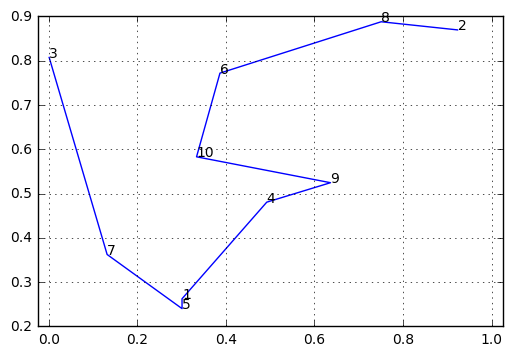

In [29]:
villes_sorted = []
for i in range(len(S1[:-2])):
    villes_sorted.append(villes[int(S1[:-2][i])-1])

fig2 = plt.figure()
ax = fig2.add_subplot(111)

C = [villes_sorted[i][1][0] for i in range(len(villes))]
D = [villes_sorted[i][1][1] for i in range(len(villes))]
n=[villes_sorted[i][0] for i in range(len(villes))]

plt.plot(C,D)
for i, txt in enumerate(n):
    ax.annotate(txt, (C[i],D[i]))
plt.axis('equal')
plt.grid()
plt.show()

## Solution donnée par le package TSP_Solver

Un module python résout le problème.

[1, 7, 8, 3, 9, 5, 2, 6, 0, 4]
--- 0.020014047622680664 seconds ---
2.15979451309


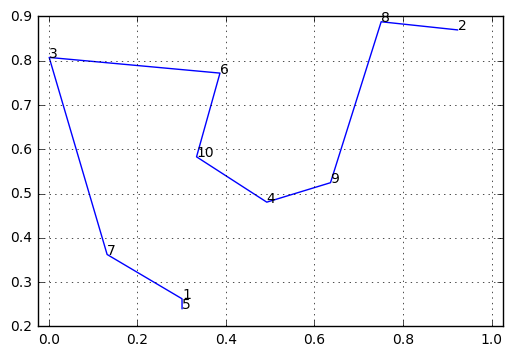

In [30]:
D = matrice_distances(villes)
start_time = time.time()
path = solve_tsp( D )
print (path)
print("--- %s seconds ---" % (time.time() - start_time))

villes_sorted_pack = []
for i in range(len(path)):
    villes_sorted_pack.append(villes[path[i]])

distance = 0
for i in range(0, len(path)-1): 
    distance += D[path[i]][path[i+1]]
print(distance)    

fig3 = plt.figure()
ax = fig3.add_subplot(111)

E = [villes_sorted_pack[i][1][0] for i in range(len(villes_sorted_pack))]
F = [villes_sorted_pack[i][1][1] for i in range(len(villes_sorted_pack))]
n=[villes_sorted_pack[i][0] for i in range(len(villes_sorted_pack))]

plt.plot(E,F)
for i, txt in enumerate(n):
    ax.annotate(txt, (E[i],F[i]))
plt.axis('equal')
plt.grid()
plt.show()

In [31]:
def tsp_solver(villes):
    D = matrice_distances(villes)
    start_time = time.time()
    path = solve_tsp(D)
    print("--- %s seconds ---" % (time.time() - start_time))

    villes_sorted_pack = []
    for i in range(len(path)):
        villes_sorted_pack.append(villes[path[i]])

    distance = 0
    for i in range(0, len(path)-1): 
        distance += D[path[i]][path[i+1]] 

    fig3 = plt.figure()
    ax = fig3.add_subplot(111)

    E = [villes_sorted_pack[i][1][0] for i in range(len(villes_sorted_pack))]
    F = [villes_sorted_pack[i][1][1] for i in range(len(villes_sorted_pack))]
    n=[villes_sorted_pack[i][0] for i in range(len(villes_sorted_pack))]

    plt.plot(E,F)
    for i, txt in enumerate(n):
        ax.annotate(txt, (E[i],F[i]))
    plt.axis('equal')
    plt.grid()
    plt.show()
    path = [x+1 for x in path] #car on ne commence à 1 pour le numéro des villes
    return distance, path

## Tests de vitesse

On fait varier le nombre de simulations pour des configurations de 3 à 30 villes.

In [ ]:
l_etape = []
l=[]
nb_villes = [i for i in range(3,31)]
nb_simul = [1000,10000,50000]

for i in nb_villes:
    villes = gen_villes(i)
    S_tsp = tsp_solver(villes)
    for j in nb_simul:
        start_time = time.time()
        S_etape = solution_traveling_salesman_problem(villes,j)
        timing_etape = time.time() - start_time
        l_etape.append(S_etape[-2])
        l_etape.append(timing_etape)
    l_etape.append(S_tsp[0])
    l.append(l_etape)
    l_etape=[]

In [33]:
df = pd.DataFrame(l, index =   [i for i in range(3,34)], columns = ["Distance 1 000 simulations","Temps 1 000 simulations","Distance 10 000 simulations","Temps 10 000 simulations","Distance 50 000 simulations","Temps 50 000 simulations","Distance TSP_Solver"])
df.index.names = ['Nombre de villes']
df

,Distance 1 000 simulations,Temps 1 000 simulations,Distance 10 000 simulations,Temps 10 000 simulations,Distance 50 000 simulations,Temps 50 000 simulations,Distance TSP_Solver
Nombre de villes,,,,,,,
3,1.104862,0.085589,1.104862,0.734284,1.104862,4.019303,1.104862
4,1.264013,0.224577,1.264013,2.052089,1.264013,11.186367,1.264013
5,1.464201,0.281036,1.464201,2.912190,1.464201,14.409805,1.464201
6,1.389879,0.751873,1.389879,5.370599,1.389879,36.276925,1.540977
7,1.610750,1.111721,1.617533,16.186191,1.610750,70.717173,1.614507
8,2.501557,1.657342,2.245589,14.297219,2.245589,79.815178,2.245589
9,3.227060,2.184281,3.082483,21.988114,2.908512,112.105399,3.102739
10,2.742728,2.574124,2.314368,30.137141,2.314368,165.500917,2.406720
11,2.540437,2.099184,2.445182,33.228577,2.425963,167.952480,2.571369


Tracé des graphes avec le module $bokeh$

In [34]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook, push_notebook, show



p1 = figure(title="1 000 simulations - Temps pour résoudre TSP")
p1.grid.grid_line_alpha=0.3
p1.xaxis.axis_label = 'Nombre de Villes'
p1.yaxis.axis_label = 'Temps en secondes'

p1.line(df.index, df["Temps 1 000 simulations"],color='red')



p2 = figure(title="10 000 simulations - Temps pour résoudre TSP")
p2.grid.grid_line_alpha=0.3
p2.xaxis.axis_label = 'Nombre de Villes'
p2.yaxis.axis_label = 'Temps en secondes'
p2.line(df.index, df["Temps 10 000 simulations"],color='blue')

p3 = figure(title="50 000 simulations - Temps pour résoudre TSP")
p3.grid.grid_line_alpha=0.3
p3.xaxis.axis_label = 'Nombre de Villes'
p3.yaxis.axis_label = 'Temps en secondes'
p3.line(df.index, df["Temps 50 000 simulations"],color='green')


p4 = figure(title="1 000, 10 000 et 50 000 simulations - Temps pour résoudre TSP")
p4.grid.grid_line_alpha=0.3
p4.xaxis.axis_label = 'Nombre de Villes'
p4.yaxis.axis_label = 'Temps en secondes'

p4.line(df.index, df["Temps 1 000 simulations"], color='red', legend='1 000 simulations')
p4.line(df.index, df["Temps 10 000 simulations"], color='blue', legend='10 000 simulations')
p4.line(df.index, df["Temps 50 000 simulations"], color='green', legend='50 000 simulations')

p4.legend.location = "top_left"

window_size = 30
window = np.ones(window_size)/float(window_size)

show(p1)
show(p2)
show(p3)
show(p4)
output_notebook()

Loading BokehJS ...

In [35]:
p5 = figure(title="1 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p5.grid.grid_line_alpha=0.3
p5.xaxis.axis_label = 'Nombre de Villes'
p5.yaxis.axis_label = 'Ecart en pourcentage'

p5.line(df.index, abs((df["Distance 1 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]), color ="red")

p6 = figure(title="10 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p6.grid.grid_line_alpha=0.3
p6.xaxis.axis_label = 'Nombre de Villes'
p6.yaxis.axis_label = 'Ecart en pourcentage'

p6.line(df.index, abs((df["Distance 10 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]), color ="blue")

p7 = figure(title="50 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p7.grid.grid_line_alpha=0.3
p7.xaxis.axis_label = 'Nombre de Villes'
p7.yaxis.axis_label = 'Ecart en pourcentage'

p7.line(df.index, abs((df["Distance 50 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]), color ="green")


p8 = figure(title="1 000, 10 000 et 50 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p8.grid.grid_line_alpha=0.3
p8.xaxis.axis_label = 'Nombre de Villes'
p8.yaxis.axis_label = 'Ecart en pourcentage'

p8.line(df.index, abs((df["Distance 1 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]),
        color='red', legend='1 000 simulations')
p8.line(df.index, abs((df["Distance 10 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]),
        color='blue', legend='10 000 simulations')
p8.line(df.index, abs((df["Distance 50 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]),
        color='green', legend='50 000 simulations')

p8.legend.location = "top_left"

window_size = 400
window = np.ones(window_size)/float(window_size)
show(p5)
show(p6)
show(p7)
show(p8)
output_notebook()

Loading BokehJS ...

## Loi de Dirichlet

Il s'agit désormais d'implémenter l'algorithme trouvant la solution du TSP en rajoutant une loi du Dirichlet.

In [36]:
np.random.dirichlet([100,100,100],1)

array([[ 0.32380311,  0.30164041,  0.37455647]])

In [37]:
def traveling_salesman_problem_CE_algorithm_dirichlet(matrice_des_distances,matrice_poids_init,nb_simulations, pourcentage_meilleurs_scores):
    res = []
    score = []
    meilleurs_scores = []
    réccurence = {}
    matrice_poids_finale = []
    matrice_proba_init = [np.random.dirichlet(matrice_poids_init[k],1)[0] for k in range(len(matrice_poids_init))]
    for i in range(len(matrice_proba_init)):
        for j in range(len(matrice_proba_init)):
            if matrice_proba_init[i][j]==0:
                matrice_proba_init[i][j] = 0.0001
    for i in range(len(matrice_proba_init)):
        matrice_proba_init[i] = [float(j)/sum(matrice_proba_init[i]) for j in matrice_proba_init[i]]            
    for j in range(0,nb_simulations):
        matrice_proba = [[None]*len(matrice_proba_init) for _ in range(len(matrice_proba_init))]
        for k in range(len(matrice_proba_init)):
            for l in range(len(matrice_proba_init)):
                matrice_proba[k][l]=matrice_proba_init[k][l]
        scénario = []
        for k in range(0,len(matrice_proba)-1):
            scénario.append(Nmulti(1,1,matrice_proba[k]).argmax())
            for l in range(k+1,len(matrice_proba)):
                matrice_proba[l][scénario[k]]=0
            s = sum(matrice_proba[k+1][i] for i in range(0,len(matrice_proba)))
            for p in range(0,len(matrice_proba)):
                matrice_proba[k+1][p]*=1/s    
        scénario.append(Nmulti(1,1,matrice_proba[-1]).argmax())
        res.append(scénario)
    for i in range(len(res)):
        score.append((sum(matrice_des_distances[res[i][j]][res[i][j+1]] for j in range(0,len(matrice_des_distances)-1)),res[i]))
    score.sort()
    meilleurs_scores=score[:int(nb_simulations*pourcentage_meilleurs_scores)]
    for f in range(0,len(matrice_des_distances)):
        for g in range(0,len(matrice_des_distances)):
            réccurence[(f,g)]=0
    for h in range(len(meilleurs_scores)):
        for j in range(0,len(matrice_des_distances)):
            for k in range(0,len(matrice_des_distances)):
                if meilleurs_scores[h][1][j]==k:
                    réccurence[(j,k)]+=1
    matrice_poids_finale = [[None]*len(matrice_poids_init) for _ in range(len(matrice_poids_init))]             
    for i in range(0,len(matrice_des_distances)):
        for j in range(0,len(matrice_des_distances)): 
            matrice_poids_finale[i][j]=100*réccurence[(i,j)]#matrice_poids_init[i][j]*réccurence[(i,j)]
    return(matrice_poids_finale)  

In [38]:
def solution_traveling_salesman_problem_dirichlet(villes,nb_simul):
    matrice_des_distances = matrice_distances(villes)
    matrice_poids_init=[[100]*len(matrice_des_distances) for _ in range(len(matrice_des_distances))]
    list_mat=[]
    list_mat.append(matrice_poids_init)
    list_mat_proba = []
    count = 0 
    while True :
        matrice_poids_précisée = traveling_salesman_problem_CE_algorithm_dirichlet(matrice_des_distances,list_mat[-1],nb_simul,0.05) 
        list_mat.append(matrice_poids_précisée)
        matrice_proba_correspondante = [np.random.dirichlet(matrice_poids_précisée[k],1)[0] for k in range(len(matrice_poids_précisée))]
        list_mat_proba.append(matrice_proba_correspondante)   
        s=0
        for i in range(len(matrice_proba_correspondante)):
            for j in range(len(matrice_proba_correspondante)):
                if list_mat[-1][i][j]>0.99:
                    s+=1
        count = count + 1            
        if s==len(matrice_proba_correspondante) : break
    res = []
    for i in range(len(list_mat_proba[-1])):
        res.append(np.argmax(list_mat_proba[-1][i]))
    solution = []
    for i in range(0, len(res)): 
        solution.append(villes[res[i]][0])
    distance = sum(matrice_des_distances[res[i]][res[i+1]] for i in range(len(res)-1))
    solution.append(distance)
    solution.append(count)
    return(solution)

In [40]:
start_time = time.time()
S2 = solution_traveling_salesman_problem_dirichlet(villes,10000)
print(S2)
print("--- %s seconds ---" % (time.time() - start_time))

['3', '7', '5', '1', '4', '9', '10', '6', '8', '2', 2.195394954822389, 9]
--- 44.205551862716675 seconds ---


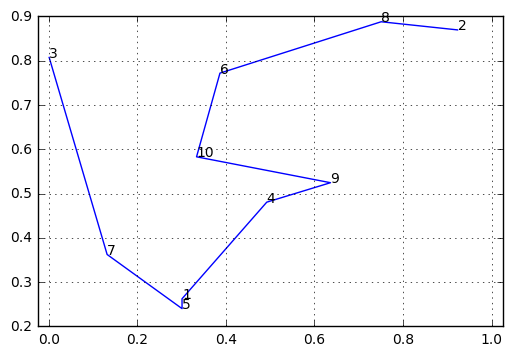

In [41]:
villes_sorted = []
for i in range(len(S2[:-1])):
    villes_sorted.append(villes[int(S2[:-1][i])-1])

fig2 = plt.figure()
ax = fig2.add_subplot(111)

G = [villes_sorted[i][1][0] for i in range(len(villes))]
H = [villes_sorted[i][1][1] for i in range(len(villes))]
n=[villes_sorted[i][0] for i in range(len(villes))]

plt.plot(G,H)
for i, txt in enumerate(n):
    ax.annotate(txt, (G[i],H[i]))
plt.axis('equal')
plt.grid()
plt.show()

## Tests de vitesse

On fait varier le nombre de simulations pour des configurations de 3 à 30 villes.

--- 0.0 seconds ---


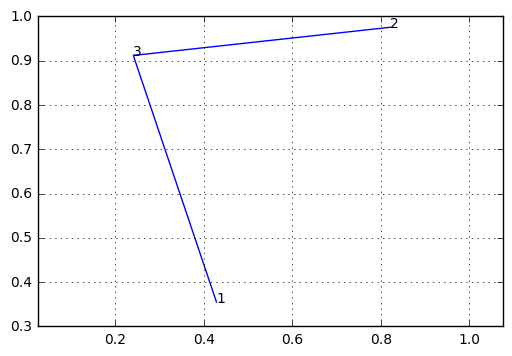

--- 0.0 seconds ---


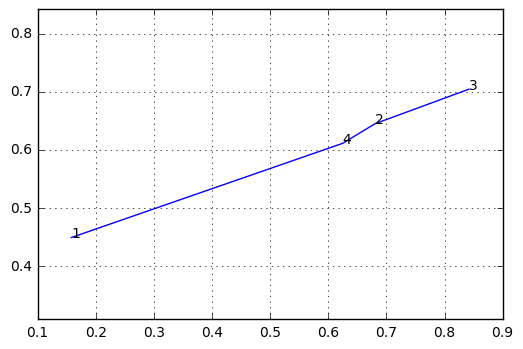

--- 0.0 seconds ---


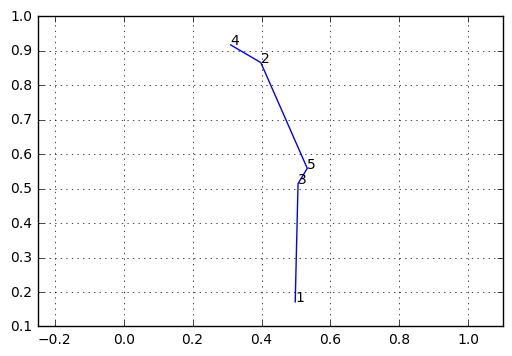

--- 0.0 seconds ---


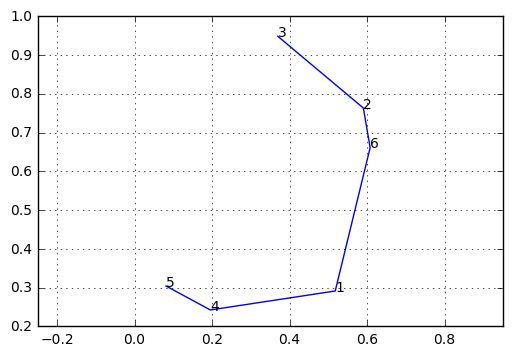

--- 0.0010006427764892578 seconds ---


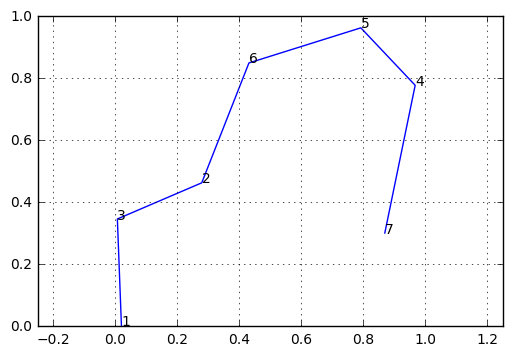

--- 0.0 seconds ---


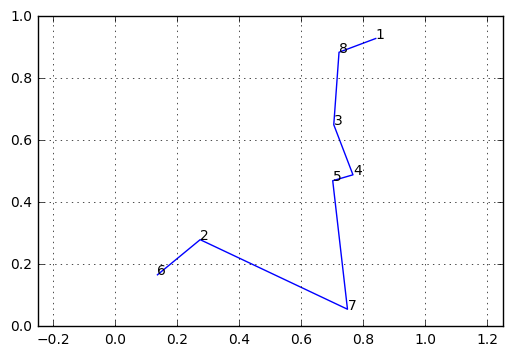

--- 0.0 seconds ---


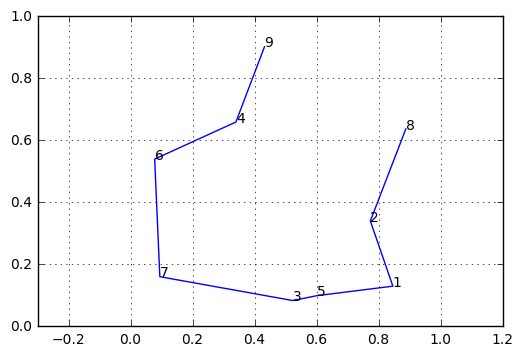

--- 0.0 seconds ---


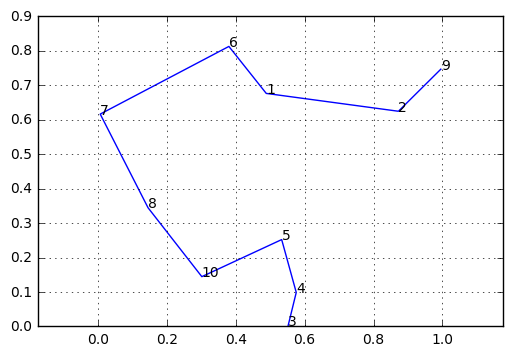

--- 0.0005004405975341797 seconds ---


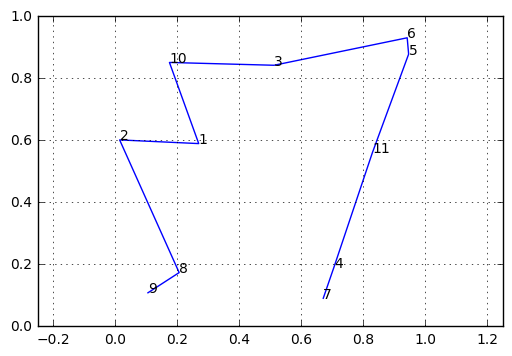

--- 0.0 seconds ---


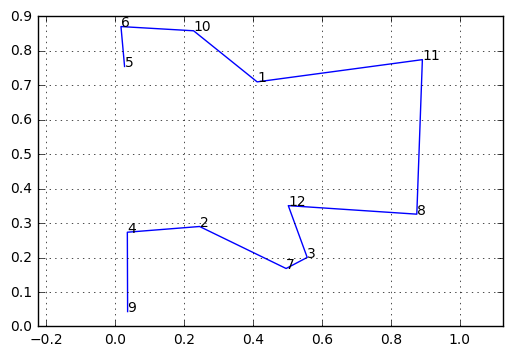

--- 0.0 seconds ---


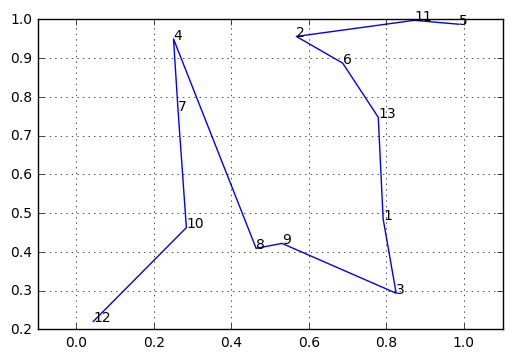

--- 0.05408787727355957 seconds ---


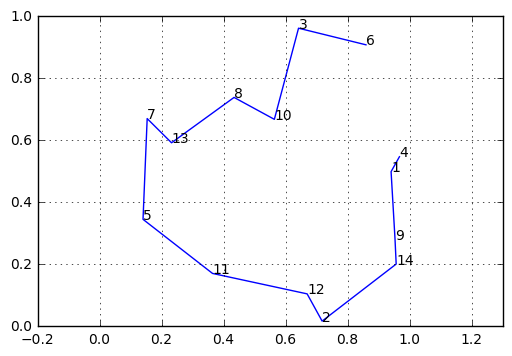

--- 0.0303494930267334 seconds ---


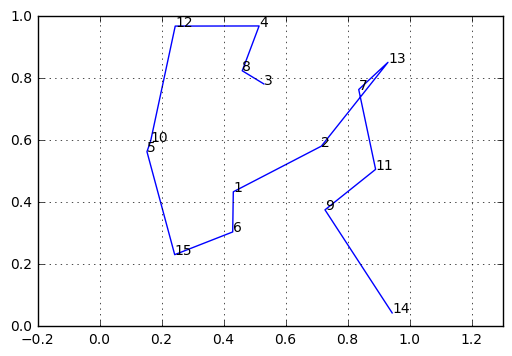

--- 0.02895331382751465 seconds ---


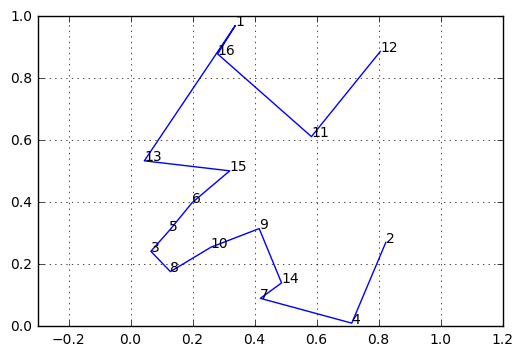

--- 0.002004384994506836 seconds ---


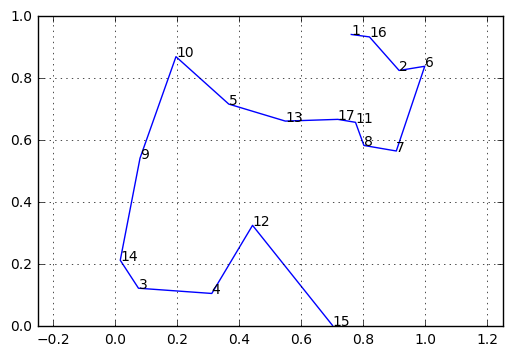

--- 0.0 seconds ---


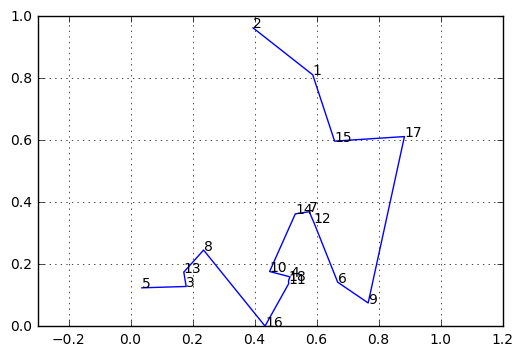

--- 0.0 seconds ---


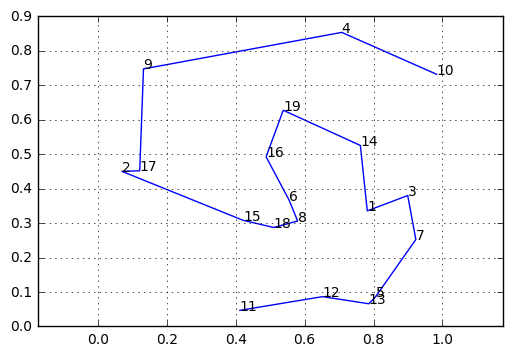

--- 0.0 seconds ---


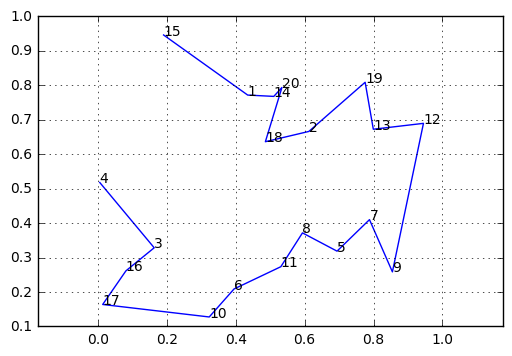

--- 0.031313180923461914 seconds ---


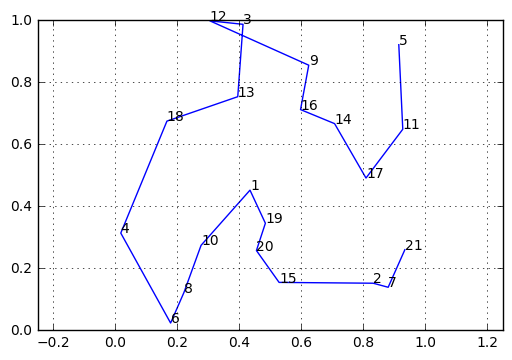

--- 0.0 seconds ---


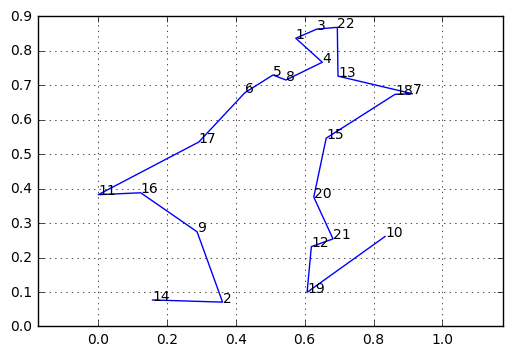

--- 0.0009822845458984375 seconds ---


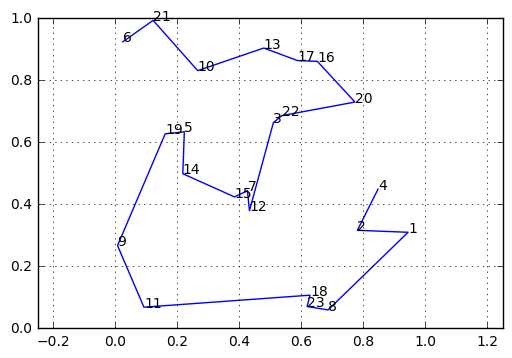

--- 0.03114628791809082 seconds ---


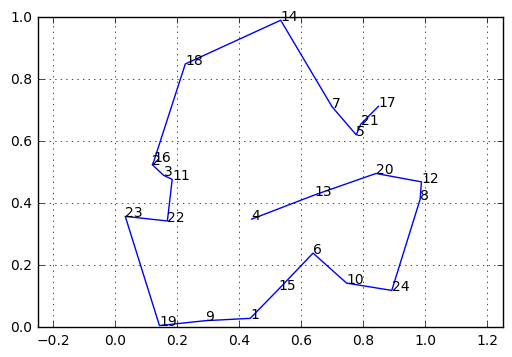

--- 0.0010008811950683594 seconds ---


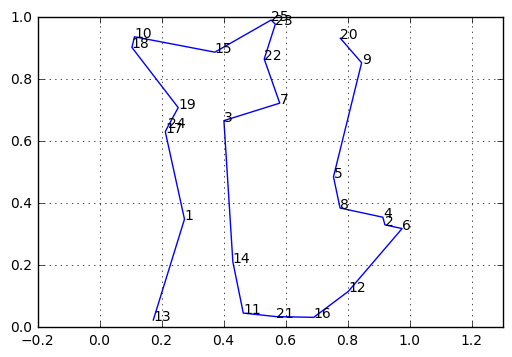

--- 0.0 seconds ---


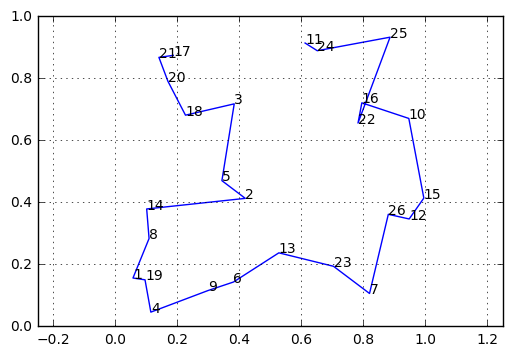

--- 0.023349523544311523 seconds ---


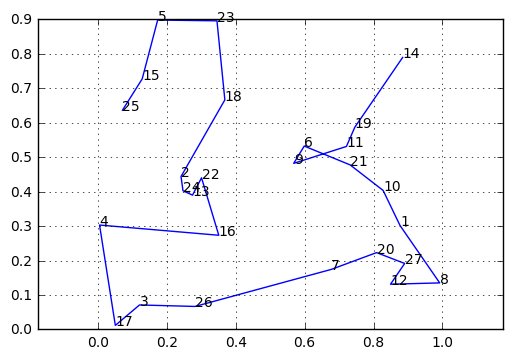

--- 0.039025068283081055 seconds ---


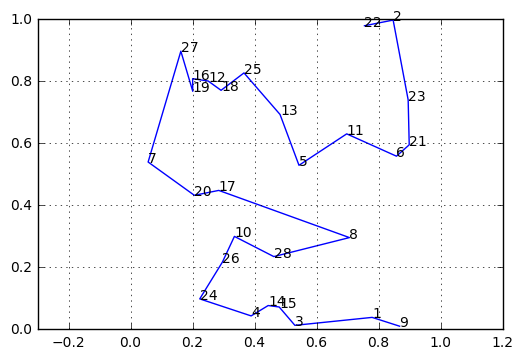

--- 0.13788819313049316 seconds ---


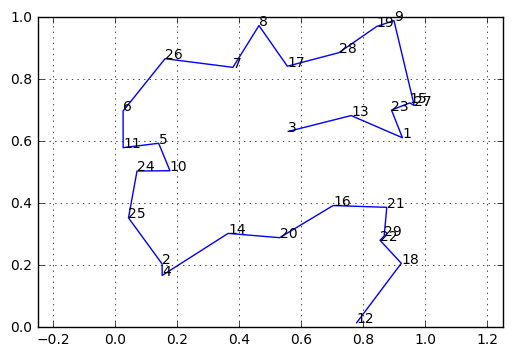

--- 0.1410822868347168 seconds ---


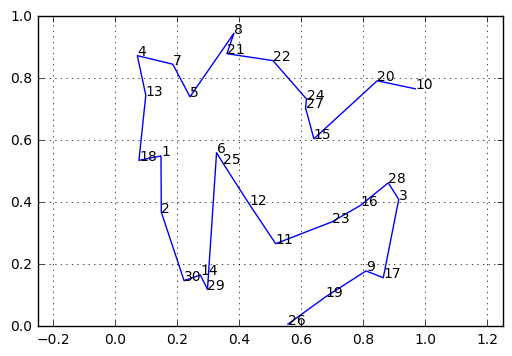

In [25]:
l_etape = []
l=[]
nb_villes = [i for i in range(3,31)]
nb_simul = [1000,10000,50000]

for i in nb_villes:
    villes = gen_villes(i)
    S_tsp = tsp_solver(villes)
    for j in nb_simul:
        start_time = time.time()
        S_etape = solution_traveling_salesman_problem_dirichlet(villes,j)
        timing_etape = time.time() - start_time
        l_etape.append(S_etape[-2])
        l_etape.append(timing_etape)
    l_etape.append(S_tsp[0])
    l.append(l_etape)
    l_etape=[]

In [26]:
dfD = pd.DataFrame(l, index =   [i for i in range(3,31)], columns = ["Distance 1 000 simulations","Temps 1 000 simulations","Distance 10 000 simulations","Temps 10 000 simulations","Distance 50 000 simulations","Temps 50 000 simulations","Distance TSP_Solver"])
dfD.index.names = ['Nombre de villes']
dfD

,Distance 1 000 simulations,Temps 1 000 simulations,Distance 10 000 simulations,Temps 10 000 simulations,Distance 50 000 simulations,Temps 50 000 simulations,Distance TSP_Solver
Nombre de villes,,,,,,,
3,1.171094,0.130705,1.171094,0.887441,1.171094,5.807445,1.171094
4,0.731379,0.243240,0.731379,2.674310,0.731379,12.819872,0.731379
5,0.831995,0.371262,0.831995,3.367139,0.831995,16.893431,0.831995
6,1.229202,0.669473,1.229202,6.578671,1.229202,44.600128,1.229202
7,2.175008,1.154835,2.175008,11.180923,2.371710,102.887780,2.175008
8,1.723185,2.051466,1.723185,21.457459,1.723185,121.948947,1.723185
9,2.617581,3.514497,2.321821,31.271712,2.321821,214.556121,2.229999
10,2.467601,4.103065,2.319845,55.995117,2.653681,384.431035,2.229183
11,3.265038,5.393859,3.035226,66.234607,3.237629,332.994533,2.786047


In [42]:
dfD = pd.read_csv('Liste2.txt', sep="\t")
dfD = dfD.drop(['Unnamed: 0','Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11', "Unnamed: 12", "Unnamed: 13","Unnamed: 14"], axis=1)
dfD

,Distance 1 000 simulations,Temps 1 000 simulations,Distance 10 000 simulations,Temps 10 000 simulations,Distance 50 000 simulations,Temps 50 000 simulations,Distance TSP_Solver
0,1.171094,0.130705,1.171094,0.887441,1.171094,5.807445,1.171094
1,0.731379,0.243240,0.731379,2.674310,0.731379,12.819872,0.731379
2,0.831995,0.371262,0.831995,3.367139,0.831995,16.893431,0.831995
3,1.229202,0.669473,1.229202,6.578671,1.229202,44.600128,1.229202
4,2.175008,1.154835,2.175008,11.180923,2.371710,102.887780,2.175008
5,1.723185,2.051466,1.723185,21.457459,1.723185,121.948947,1.723185
6,2.617581,3.514497,2.321821,31.271712,2.321821,214.556121,2.229999
7,2.467601,4.103065,2.319845,55.995117,2.653681,384.431035,2.229183
8,3.265038,5.393859,3.035226,66.234607,3.237629,332.994533,2.786047
9,2.820278,6.209898,3.247957,87.450950,3.026172,507.352025,2.820278


In [43]:
output_notebook()
p1 = figure(title="1 000 simulations - Temps pour résoudre TSP")
p1.grid.grid_line_alpha=0.3
p1.xaxis.axis_label = 'Nombre de Villes'
p1.yaxis.axis_label = 'Temps en secondes'

p1.line(dfD.index, dfD["Temps 1 000 simulations"],color='red')



p2 = figure(title="10 000 simulations - Temps pour résoudre TSP")
p2.grid.grid_line_alpha=0.3
p2.xaxis.axis_label = 'Nombre de Villes'
p2.yaxis.axis_label = 'Temps en secondes'
p2.line(dfD.index, dfD["Temps 10 000 simulations"],color='blue')

p3 = figure(title="50 000 simulations - Temps pour résoudre TSP")
p3.grid.grid_line_alpha=0.3
p3.xaxis.axis_label = 'Nombre de Villes'
p3.yaxis.axis_label = 'Temps en secondes'
p3.line(dfD.index, dfD["Temps 50 000 simulations"],color='green')


p4 = figure(title="1 000, 10 000 et 50 000 simulations - Temps pour résoudre TSP")
p4.grid.grid_line_alpha=0.3
p4.xaxis.axis_label = 'Nombre de Villes'
p4.yaxis.axis_label = 'Temps en secondes'

p4.line(dfD.index, dfD["Temps 1 000 simulations"], color='red', legend='1 000 simulations')
p4.line(dfD.index, dfD["Temps 10 000 simulations"], color='blue', legend='10 000 simulations')
p4.line(dfD.index, dfD["Temps 50 000 simulations"], color='green', legend='50 000 simulations')

p4.legend.location = "top_left"

window_size = 30
window = np.ones(window_size)/float(window_size)

show(p1)
show(p2)
show(p3)
show(p4)

Loading BokehJS ...

In [44]:
p5 = figure(title="1 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p5.grid.grid_line_alpha=0.3
p5.xaxis.axis_label = 'Nombre de Villes'
p5.yaxis.axis_label = 'Ecart en pourcentage'

p5.line(dfD.index, abs((dfD["Distance 1 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]), color ="red")

p6 = figure(title="10 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p6.grid.grid_line_alpha=0.3
p6.xaxis.axis_label = 'Nombre de Villes'
p6.yaxis.axis_label = 'Ecart en pourcentage'

p6.line(dfD.index, abs((dfD["Distance 10 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]), color ="blue")

p7 = figure(title="50 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p7.grid.grid_line_alpha=0.3
p7.xaxis.axis_label = 'Nombre de Villes'
p7.yaxis.axis_label = 'Ecart en pourcentage'

p7.line(dfD.index, abs((dfD["Distance 50 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]), color ="green")


p8 = figure(title="1 000, 10 000 et 50 000 simulations - Pourcentage d'écartement par rapport à TSP_Solver")
p8.grid.grid_line_alpha=0.3
p8.xaxis.axis_label = 'Nombre de Villes'
p8.yaxis.axis_label = 'Ecart en pourcentage'

p8.line(dfD.index, abs((dfD["Distance 1 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]),
        color='red', legend='1 000 simulations')
p8.line(dfD.index, abs((dfD["Distance 10 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]),
        color='blue', legend='10 000 simulations')
p8.line(dfD.index, abs((dfD["Distance 50 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]),
        color='green', legend='50 000 simulations')

p8.legend.location = "top_left"

window_size = 400
window = np.ones(window_size)/float(window_size)
show(p5)
show(p6)
show(p7)
show(p8)
output_notebook()

Loading BokehJS ...

Comparaison entre les méthodes: 

In [45]:
p9 = figure(title="1 000 simulations - Les deux méthodes comparés")
p9.grid.grid_line_alpha=0.3
p9.xaxis.axis_label = 'Nombre de Villes'
p9.yaxis.axis_label = 'Temps en secondes'

p9.line(df.index[:28], df["Temps 1 000 simulations"] ,
        color='red', legend='1 000 simulations Sans Dirichlet')
p9.line(df.index, dfD["Temps 1 000 simulations"]  ,
        color='blue', legend='1 000 simulations Avec Dirichlet')

p9.legend.location = "top_left"

p10=figure(title="10 000 simulations - Les deux méthodes comparés")
p10.grid.grid_line_alpha=0.3
p10.xaxis.axis_label = 'Nombre de Villes'
p10.yaxis.axis_label = 'Temps en secondes'

p10.line(df.index[:28], df["Temps 10 000 simulations"] ,
        color='red', legend='10 000 simulations Sans Dirichlet')
p10.line(df.index, dfD["Temps 10 000 simulations"]  ,
        color='blue', legend='10 000 simulations Avec Dirichlet')

p10.legend.location = "top_left"



p11=figure(title="50 000 simulations - Les deux méthodes comparés")
p11.grid.grid_line_alpha=0.3
p11.xaxis.axis_label = 'Nombre de Villes'
p11.yaxis.axis_label = 'Temps en secondes'

p11.line(df.index[:28], df["Temps 50 000 simulations"] ,
        color='red', legend='50 000 simulations Sans Dirichlet')
p11.line(df.index, dfD["Temps 50 000 simulations"]  ,
        color='blue', legend='50 000 simulations Avec Dirichlet')

p11.legend.location = "top_left"


window_size = 400
window = np.ones(window_size)/float(window_size)
show(p9)
show(p10)
show(p11)
output_notebook()

Loading BokehJS ...

In [46]:
p8 = figure(title="1 000 simulations- Deux méthodes - Pourcentage d'écartement par rapport à TSP_Solver")
p8.grid.grid_line_alpha=0.3
p8.xaxis.axis_label = 'Nombre de Villes'
p8.yaxis.axis_label = 'Ecart en pourcentage'

p8.line(df.index[:28], abs((df["Distance 1 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]),
        color='red', legend='1 000 simulations Sans Dirichlet')
p8.line(df.index, abs((dfD["Distance 1 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]),
        color='blue', legend='1 000 simulations Avec Dirichlet')


p8.legend.location = "top_left"

p9 = figure(title="10 000 simulations - Deux méthodes - Pourcentage d'écartement par rapport à TSP_Solver")
p9.grid.grid_line_alpha=0.3
p9.xaxis.axis_label = 'Nombre de Villes'
p9.yaxis.axis_label = 'Ecart en pourcentage'
p9.line(df.index[:28], abs((df["Distance 10 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]),
        color='red', legend='10 000 simulations Sans Dirichlet')
p9.line(df.index, abs((dfD["Distance 10 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]),
        color='blue', legend='10 000 simulations Avec Dirichlet')

p9.legend.location = "top_left"


p10 = figure(title="50 000 simulations - Deux méthodes - Pourcentage d'écartement par rapport à TSP_Solver")
p10.grid.grid_line_alpha=0.3
p10.xaxis.axis_label = 'Nombre de Villes'
p10.yaxis.axis_label = 'Ecart en pourcentage'
p10.line(df.index[:28], abs((df["Distance 50 000 simulations"]-df["Distance TSP_Solver"])/df["Distance TSP_Solver"]),
        color='red', legend='50 000 simulations Sans Dirichlet')
p10.line(df.index, abs((dfD["Distance 50 000 simulations"]-dfD["Distance TSP_Solver"])/dfD["Distance TSP_Solver"]),
        color='blue', legend='50 000 simulations Avec Dirichlet')

p10.legend.location = "top_left"


window_size = 400
window = np.ones(window_size)/float(window_size)
show(p8)
show(p9)
show(p10)
output_notebook()

Loading BokehJS ...

# Changement par rapport au premier code envoyé 

Test de 3 à 10 villes ! Avec 100 configurations des 100 villes, moyenne de distance, variance sans dirichlet, 10 000 simulations

--- 0.0010001659393310547 seconds ---


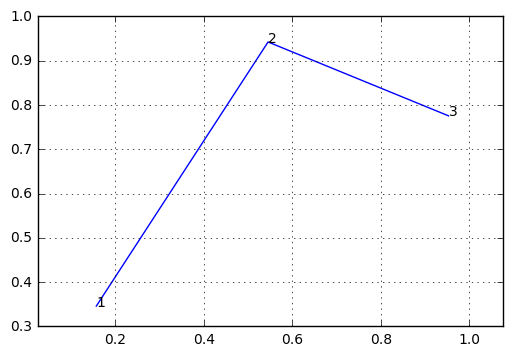

--- 0.0 seconds ---


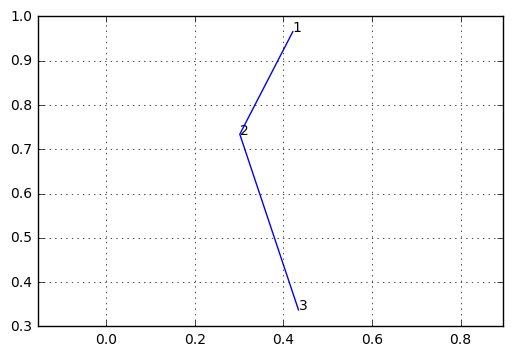

--- 0.0 seconds ---


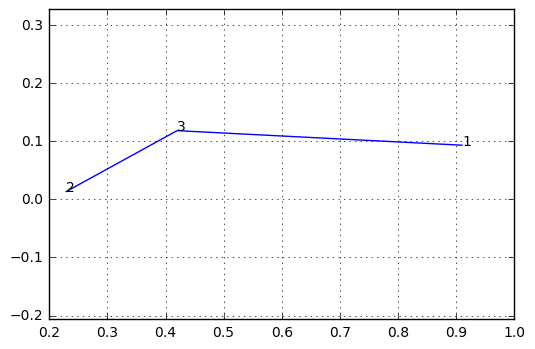

--- 0.0 seconds ---


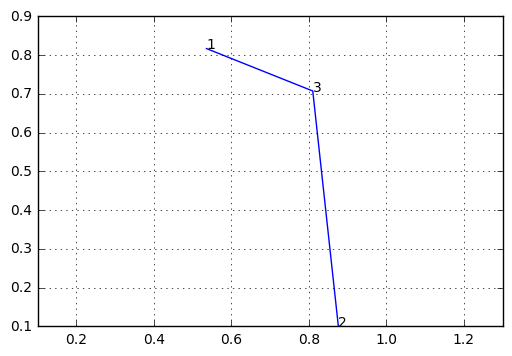

--- 0.0005059242248535156 seconds ---


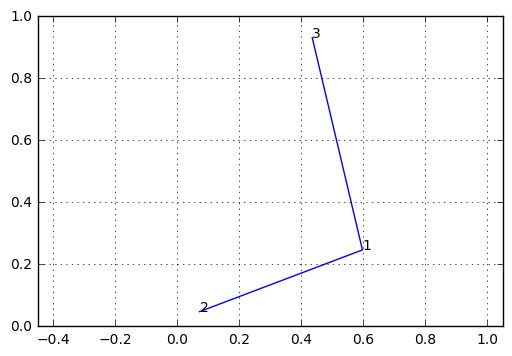

--- 0.0 seconds ---


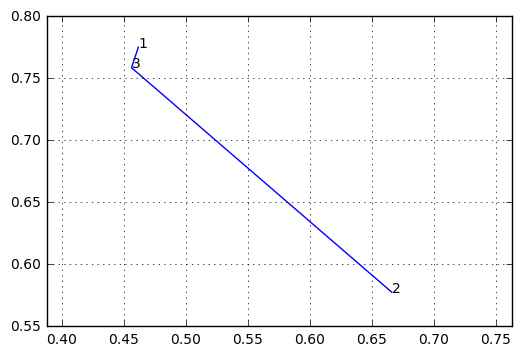

--- 0.0 seconds ---


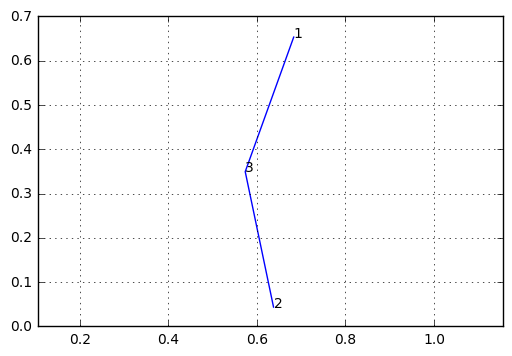

--- 0.0005047321319580078 seconds ---


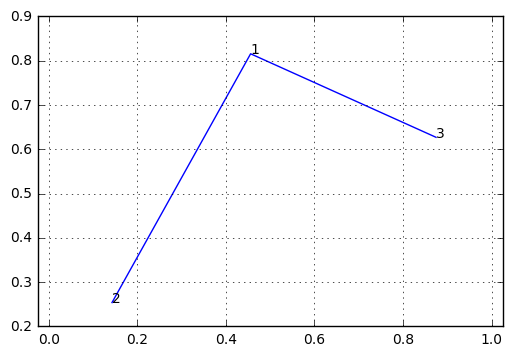

--- 0.0 seconds ---


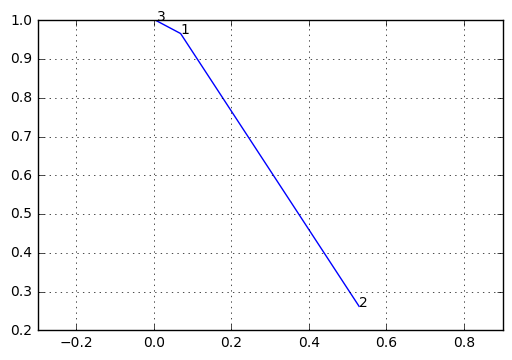

--- 0.0 seconds ---


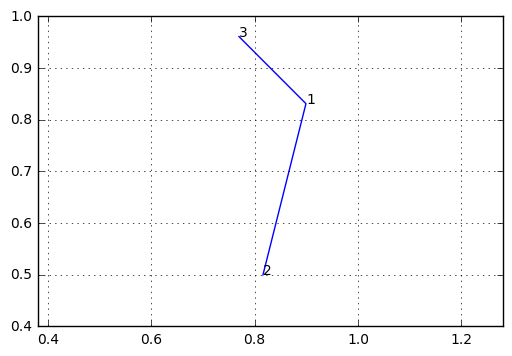

--- 0.0 seconds ---


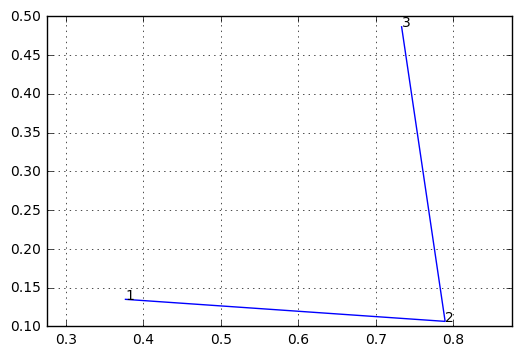

--- 0.0 seconds ---


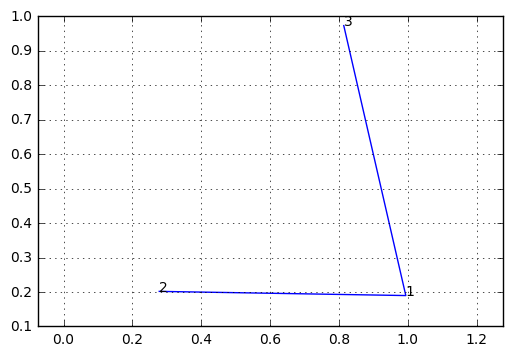

--- 0.0 seconds ---


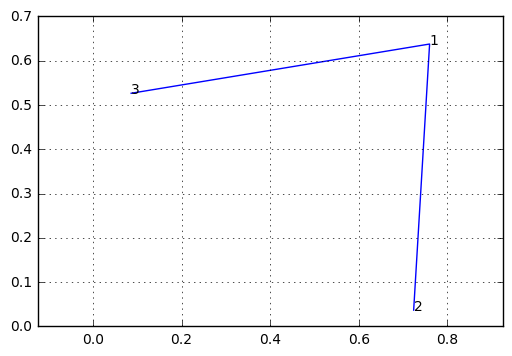

--- 0.0004999637603759766 seconds ---


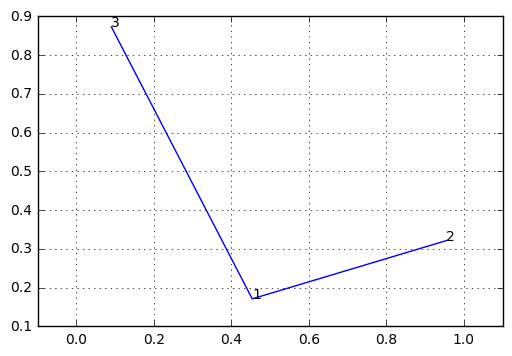

--- 0.0 seconds ---


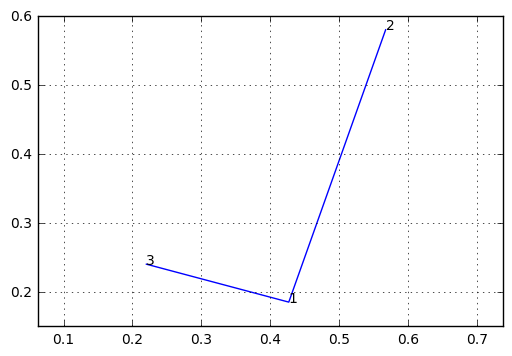

--- 0.0005002021789550781 seconds ---


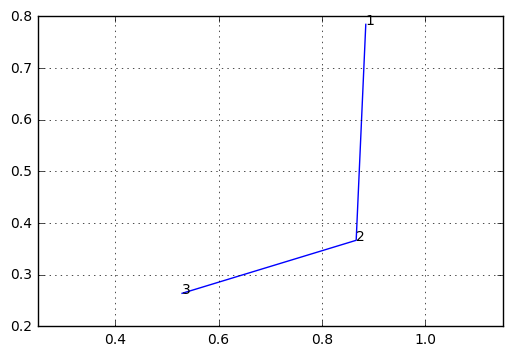

--- 0.0 seconds ---


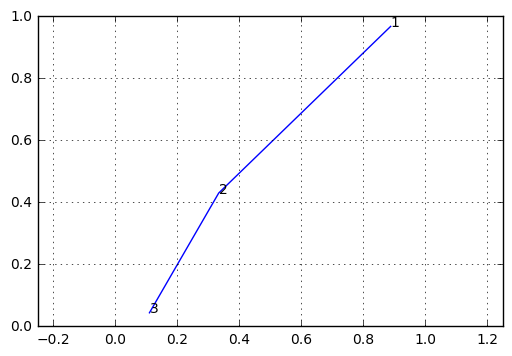

--- 0.0005002021789550781 seconds ---


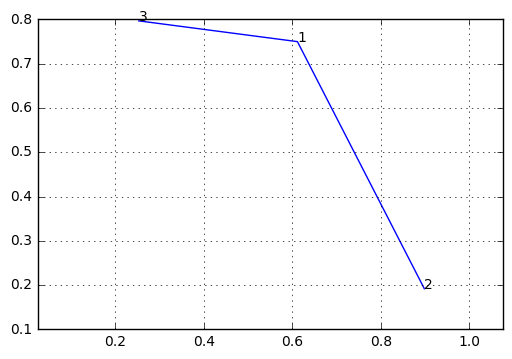

--- 0.0 seconds ---


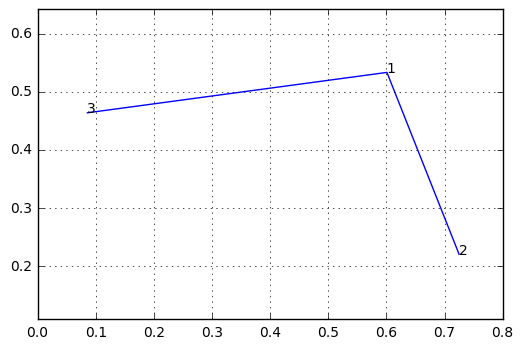

--- 0.0 seconds ---


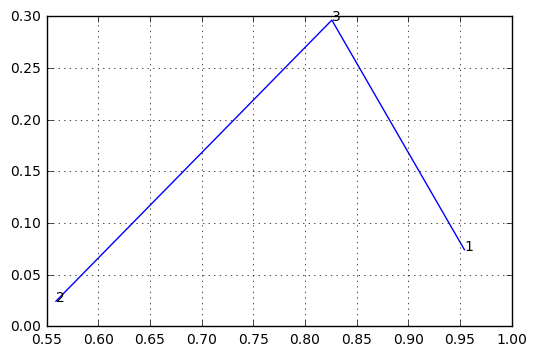

--- 0.0 seconds ---


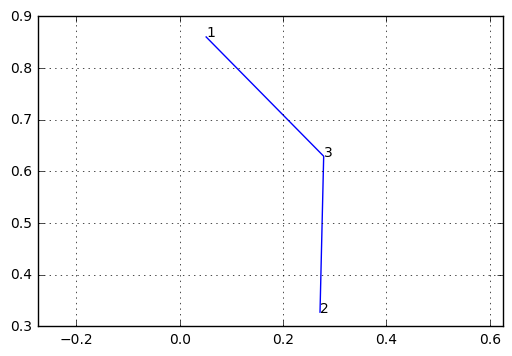

--- 0.0 seconds ---


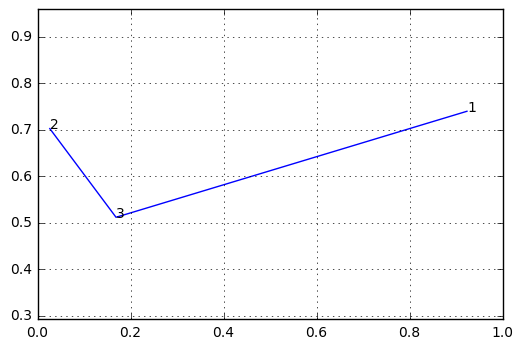

--- 0.0 seconds ---


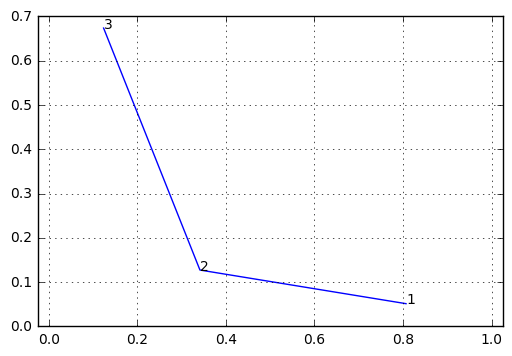

--- 0.0 seconds ---


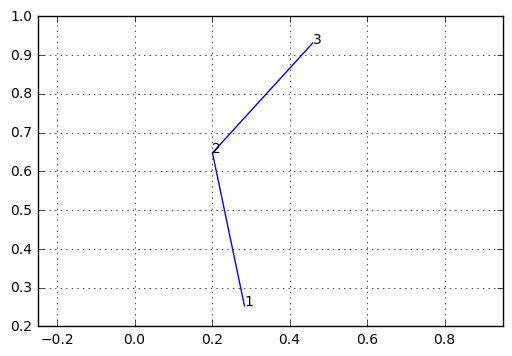

--- 0.0 seconds ---


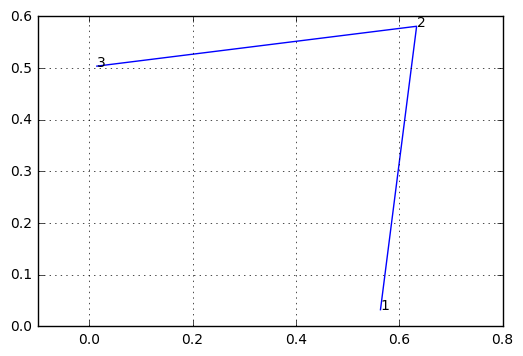

--- 0.0 seconds ---


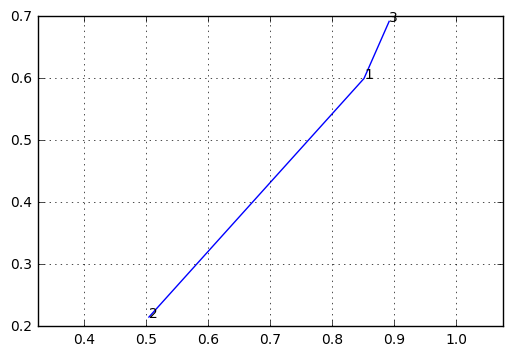

--- 0.0 seconds ---


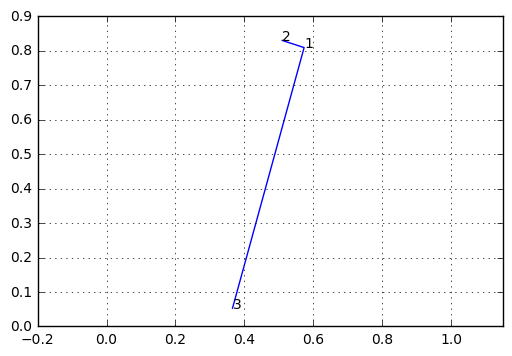

--- 0.0 seconds ---


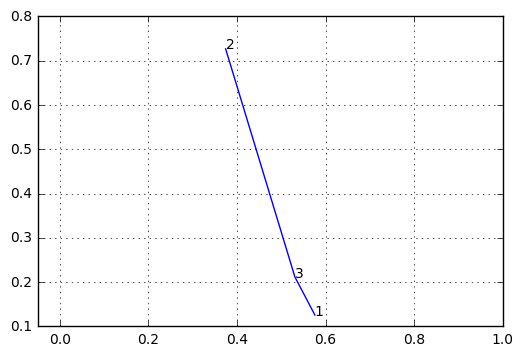

--- 0.0 seconds ---


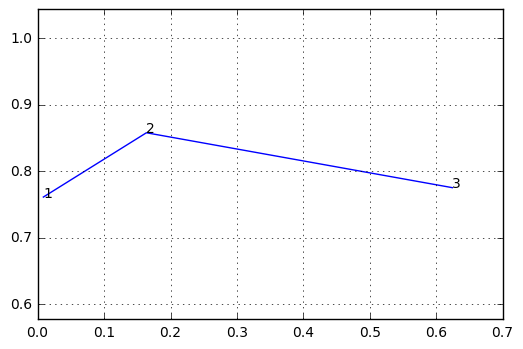

--- 0.0 seconds ---


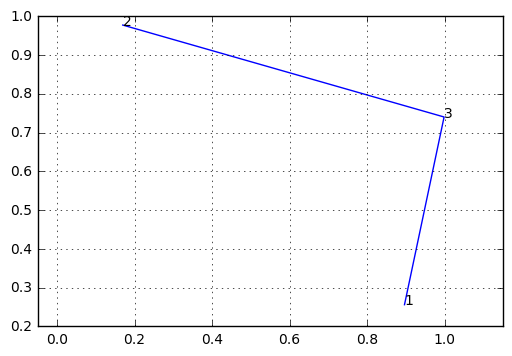

--- 0.0 seconds ---


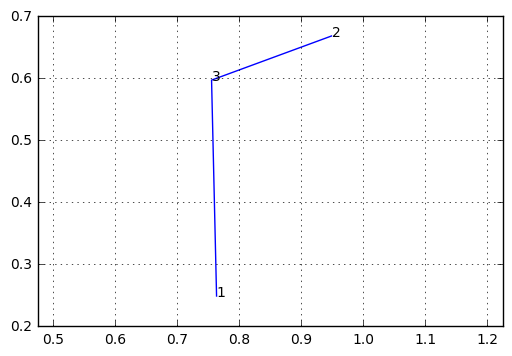

--- 0.0 seconds ---


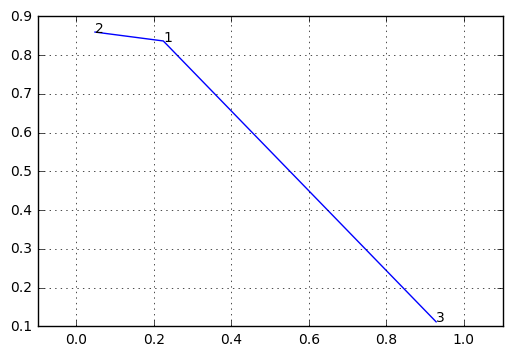

--- 0.0005004405975341797 seconds ---


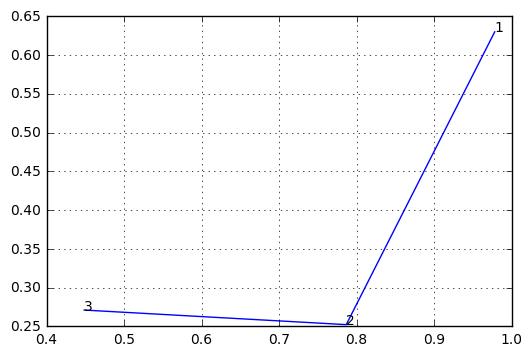

--- 0.0 seconds ---


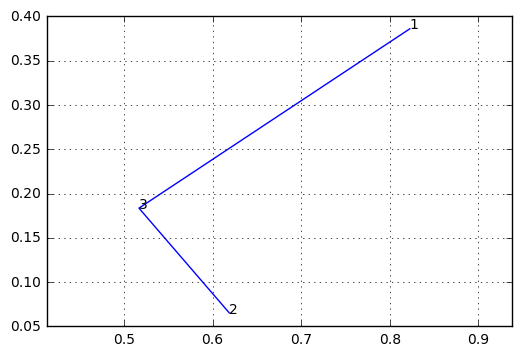

--- 0.0 seconds ---


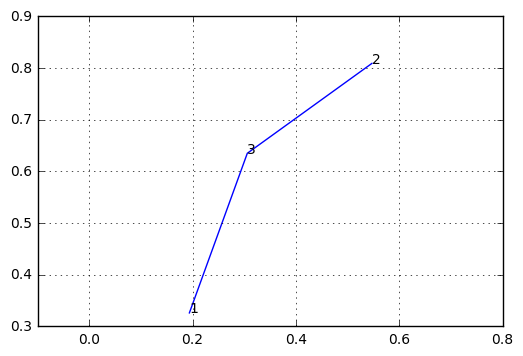

--- 0.0 seconds ---


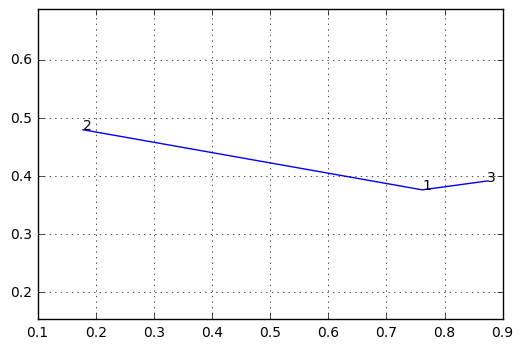

--- 0.0 seconds ---


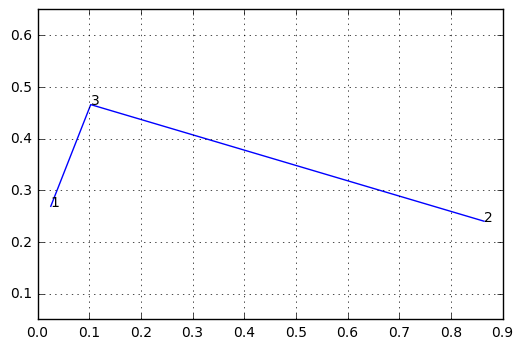

--- 0.0 seconds ---


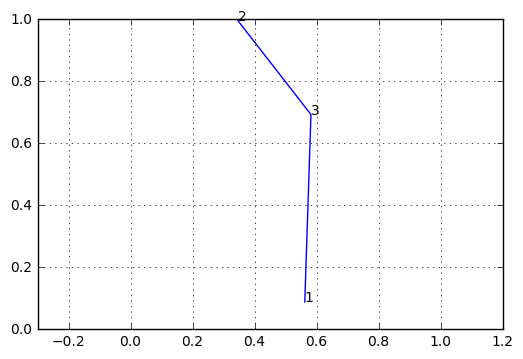

--- 0.0004990100860595703 seconds ---


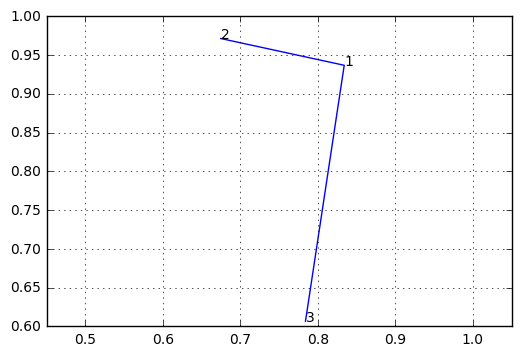

--- 0.0 seconds ---


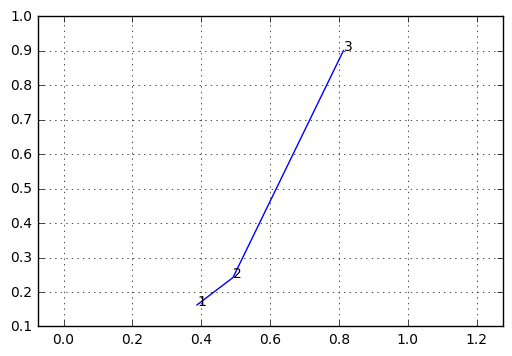

--- 0.0 seconds ---


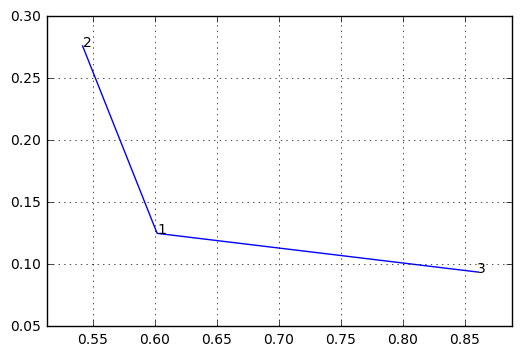

--- 0.0 seconds ---


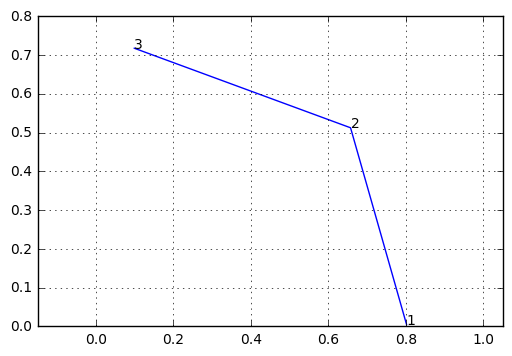

--- 0.0 seconds ---


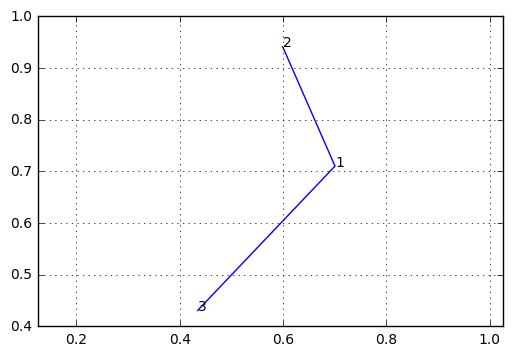

--- 0.0 seconds ---


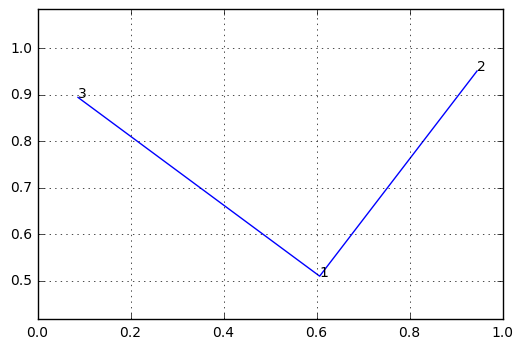

--- 0.0 seconds ---


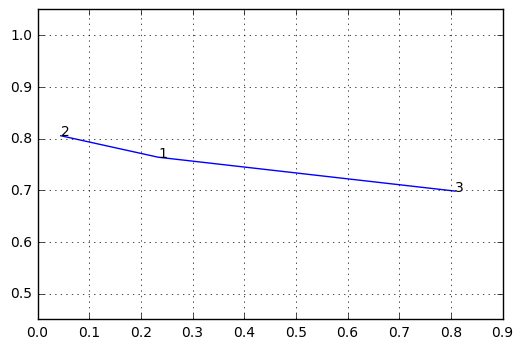

--- 0.0 seconds ---


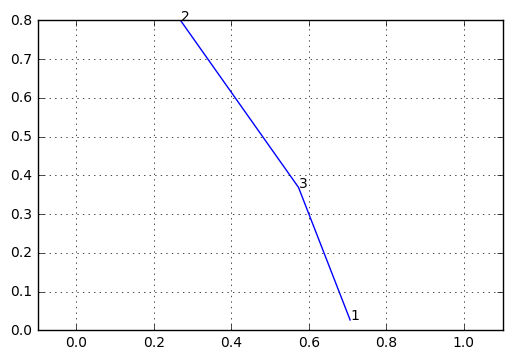

--- 0.0005047321319580078 seconds ---


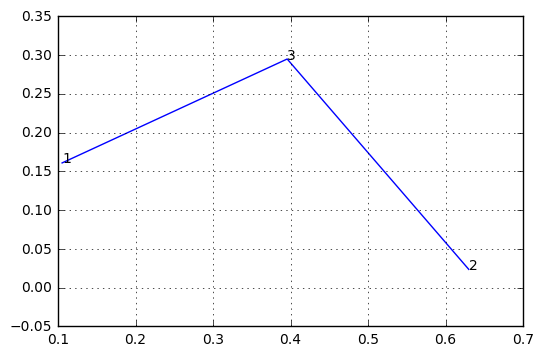

--- 0.0 seconds ---


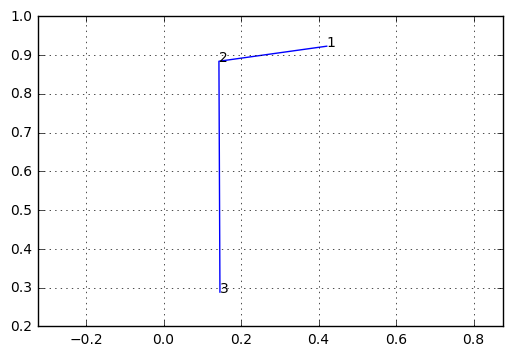

--- 0.0004999637603759766 seconds ---


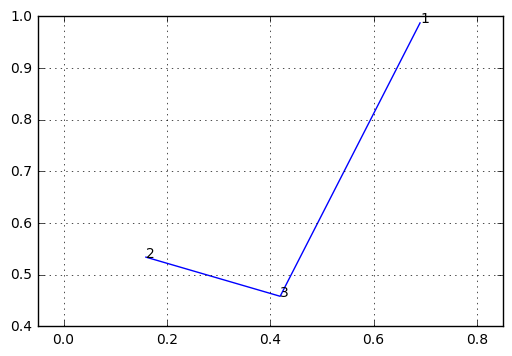

--- 0.0005009174346923828 seconds ---


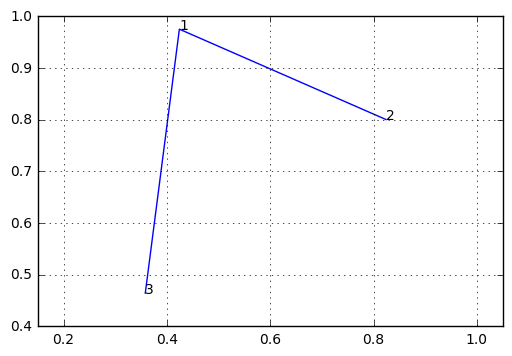

--- 0.0 seconds ---


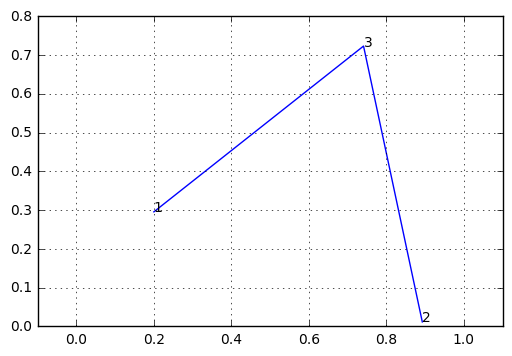

--- 0.0005004405975341797 seconds ---


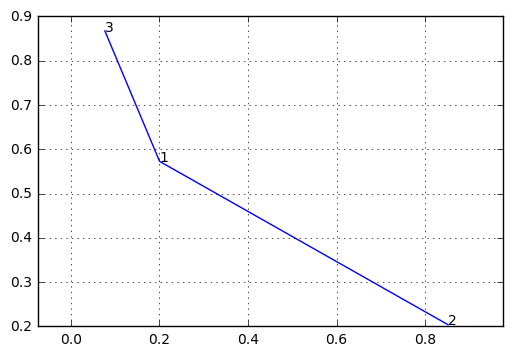

--- 0.0 seconds ---


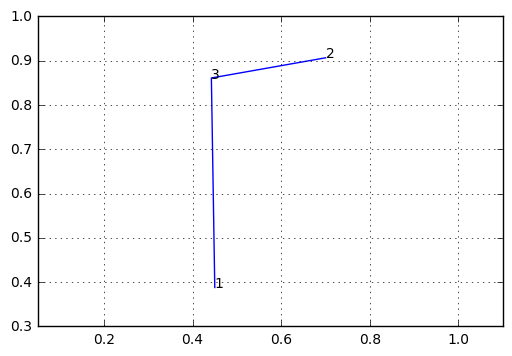

--- 0.0 seconds ---


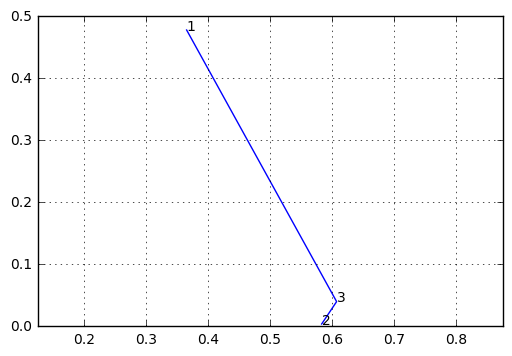

--- 0.0005183219909667969 seconds ---


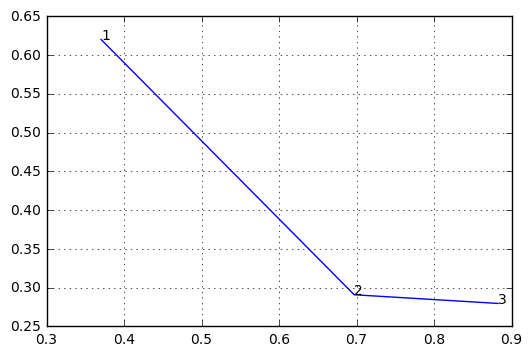

--- 0.0 seconds ---


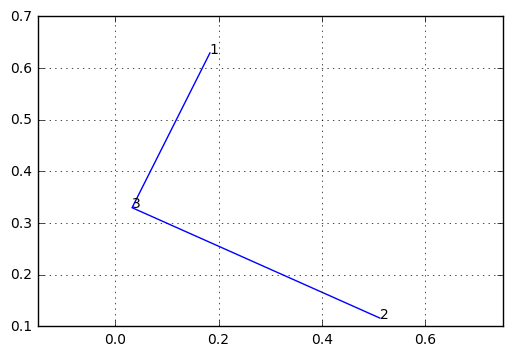

--- 0.0 seconds ---


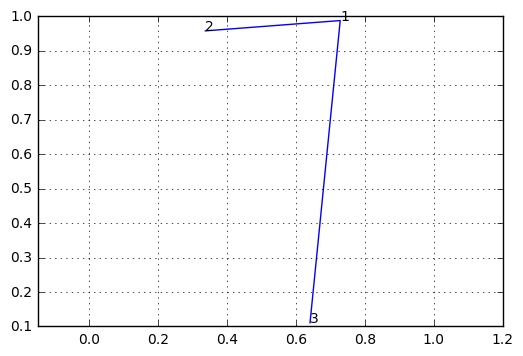

--- 0.0 seconds ---


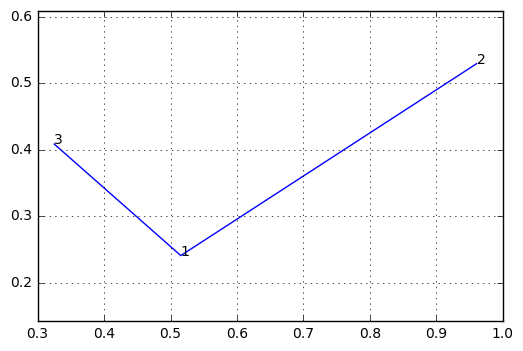

--- 0.0 seconds ---


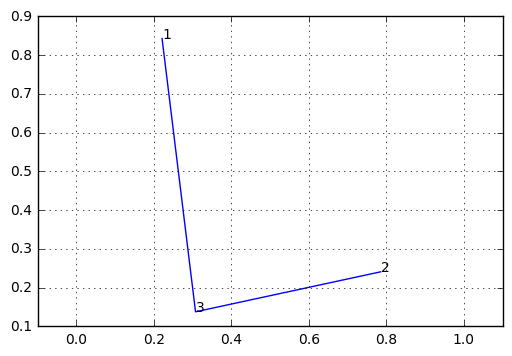

--- 0.0 seconds ---


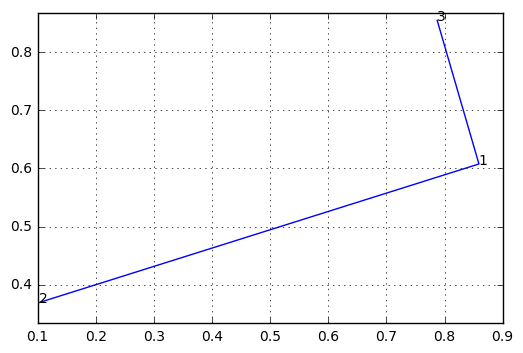

--- 0.0005006790161132812 seconds ---


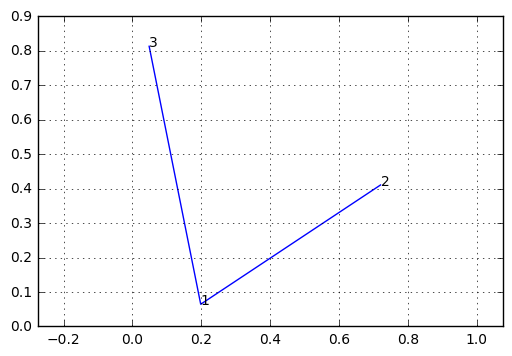

--- 0.0 seconds ---


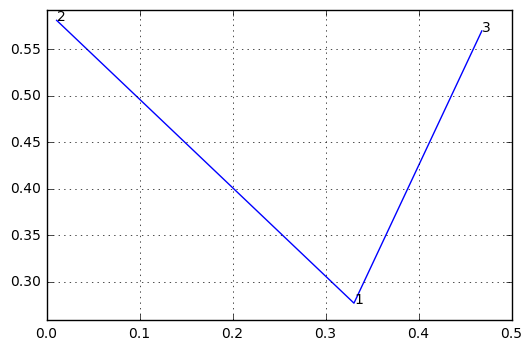

--- 0.0005009174346923828 seconds ---


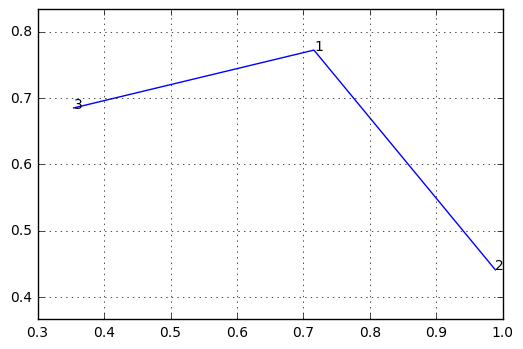

--- 0.0 seconds ---


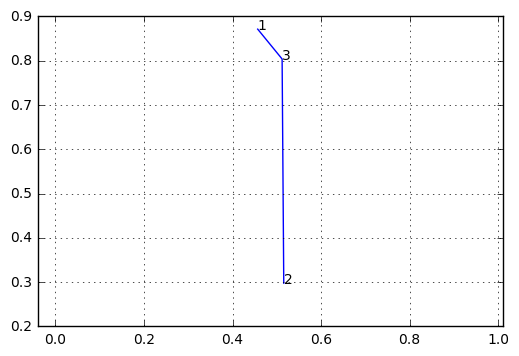

--- 0.0 seconds ---


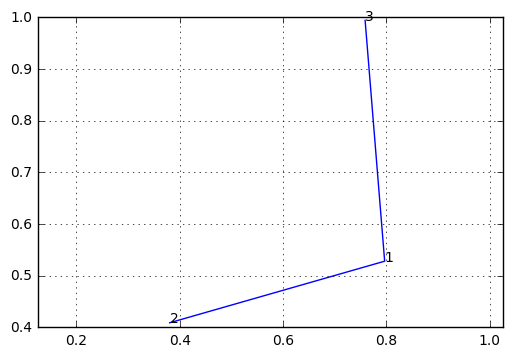

--- 0.0 seconds ---


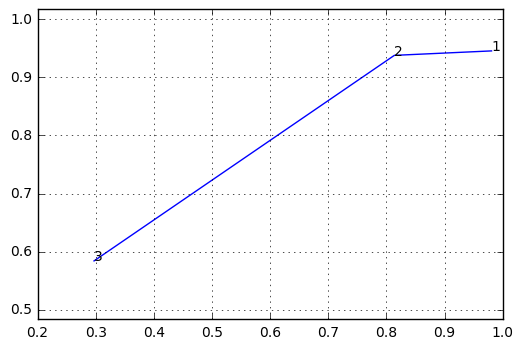

--- 0.0 seconds ---


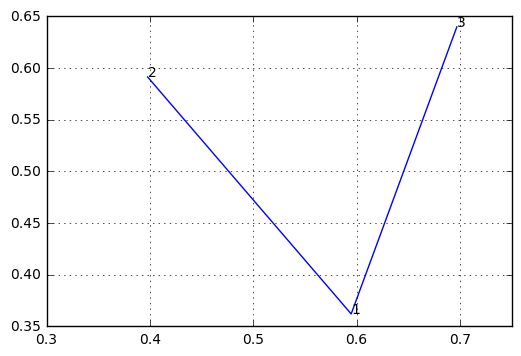

--- 0.0 seconds ---


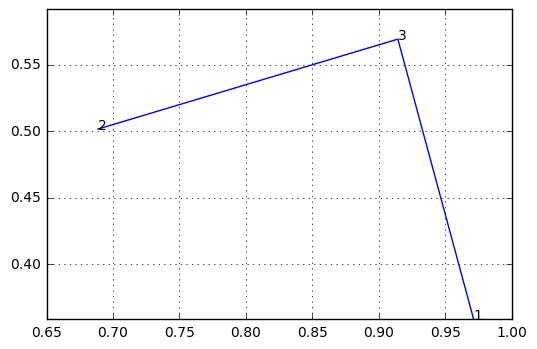

--- 0.0 seconds ---


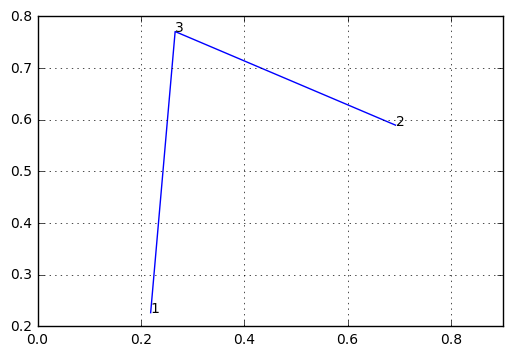

--- 0.0 seconds ---


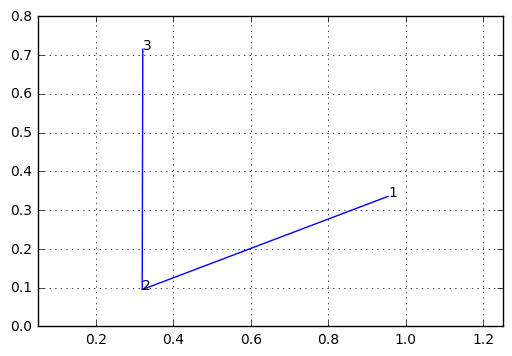

--- 0.0 seconds ---


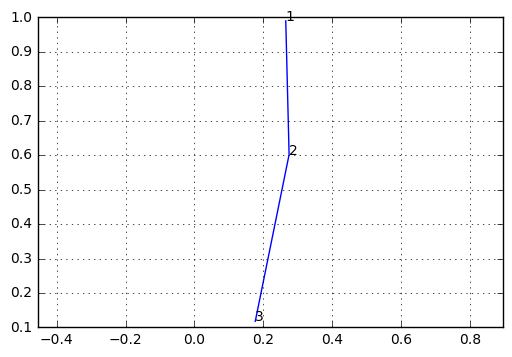

--- 0.0 seconds ---


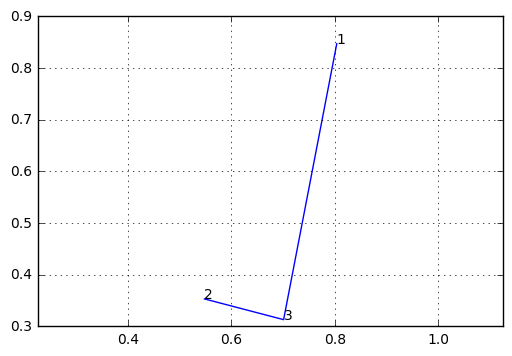

--- 0.0 seconds ---


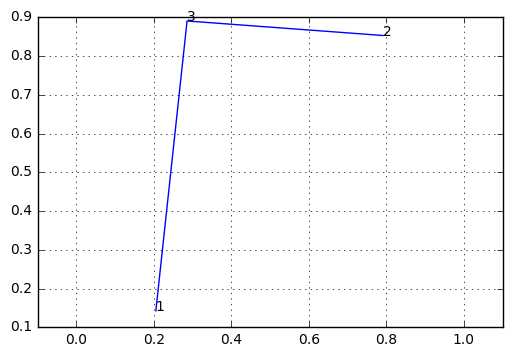

--- 0.0 seconds ---


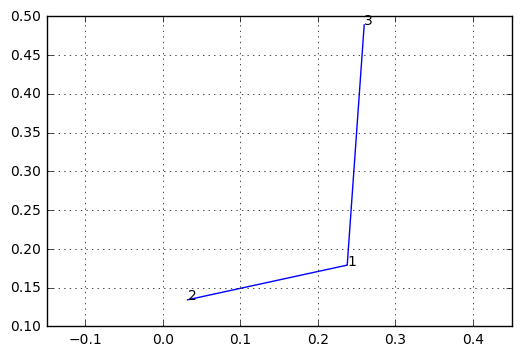

--- 0.0 seconds ---


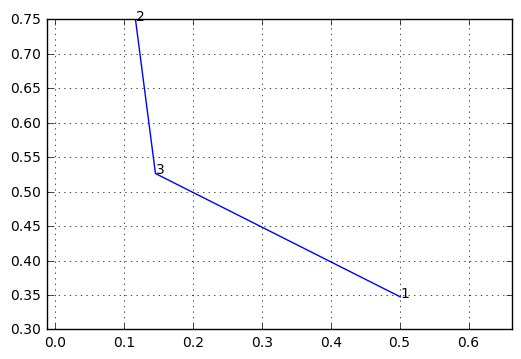

--- 0.0 seconds ---


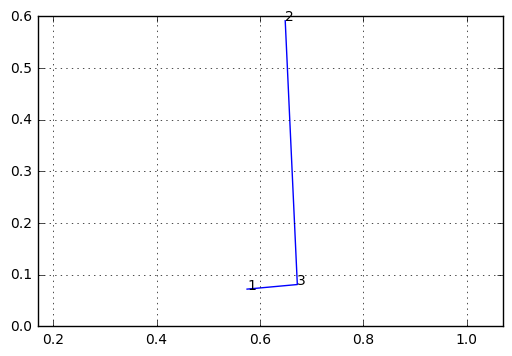

--- 0.0 seconds ---


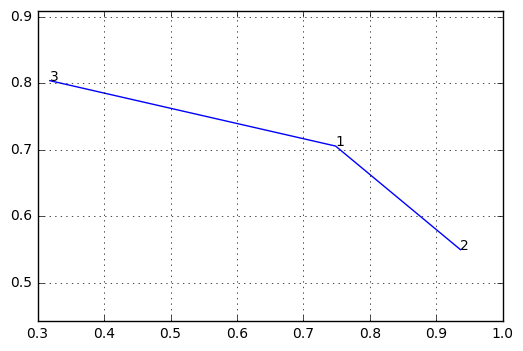

--- 0.0 seconds ---


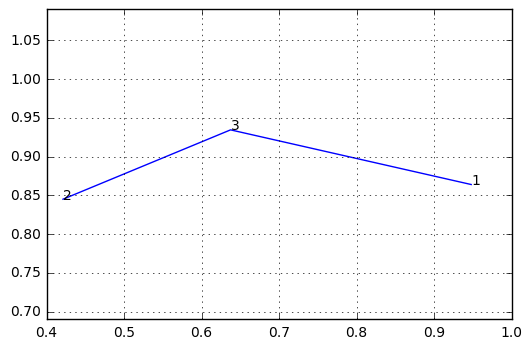

--- 0.0 seconds ---


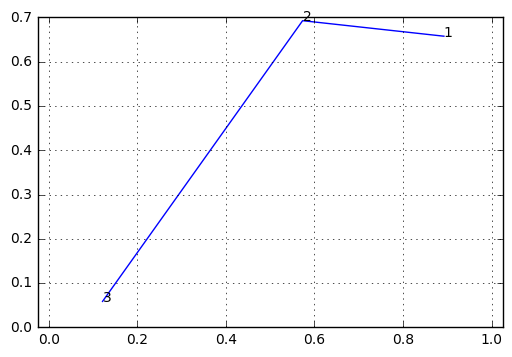

--- 0.0 seconds ---


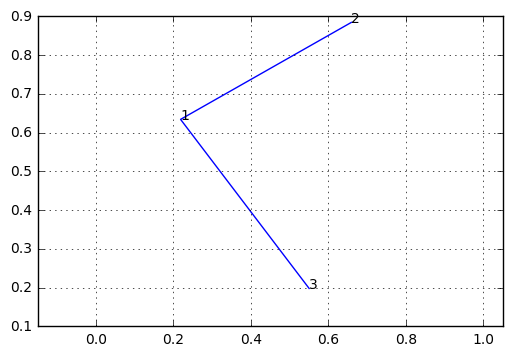

--- 0.0 seconds ---


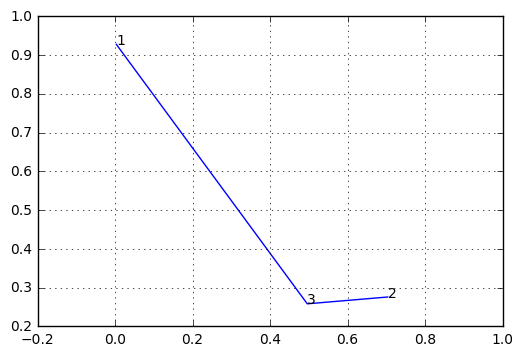

--- 0.0 seconds ---


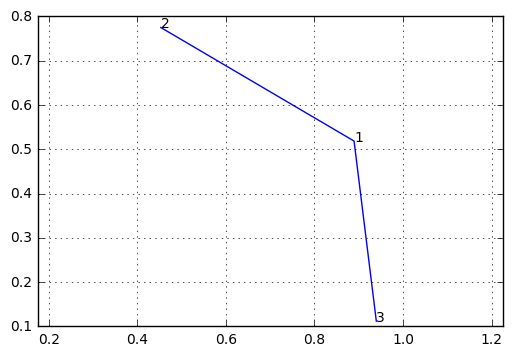

--- 0.0 seconds ---


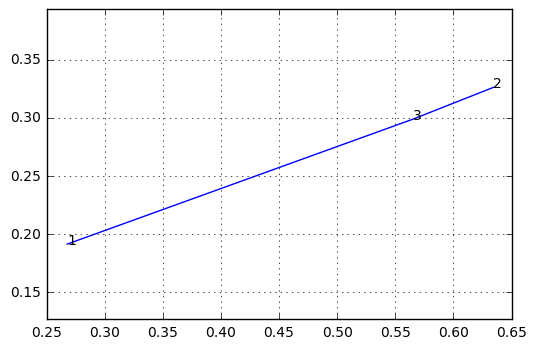

--- 0.0 seconds ---


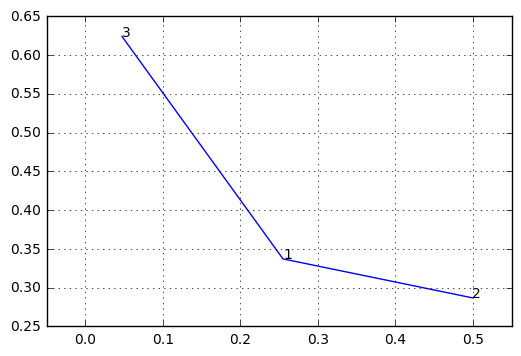

--- 0.0 seconds ---


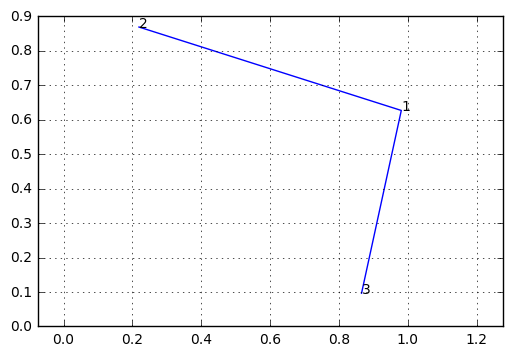

--- 0.0 seconds ---


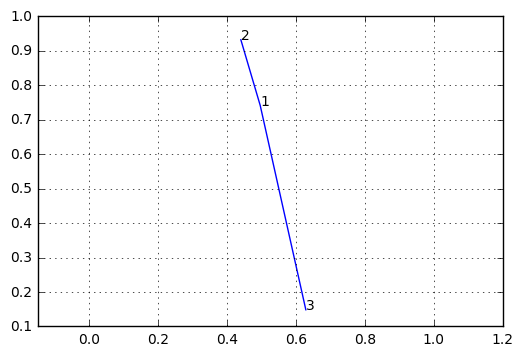

--- 0.000499725341796875 seconds ---


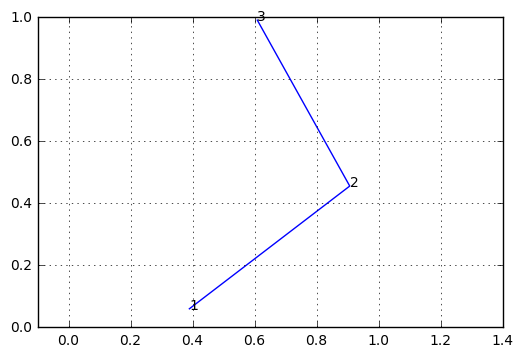

--- 0.0 seconds ---


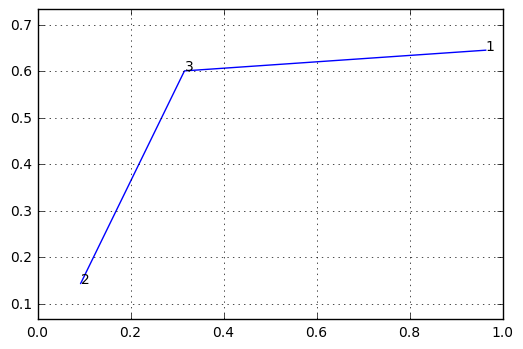

--- 0.0 seconds ---


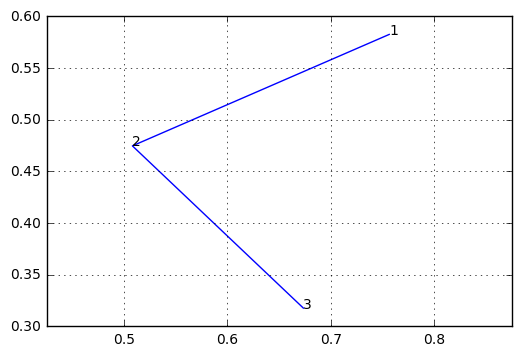

--- 0.0 seconds ---


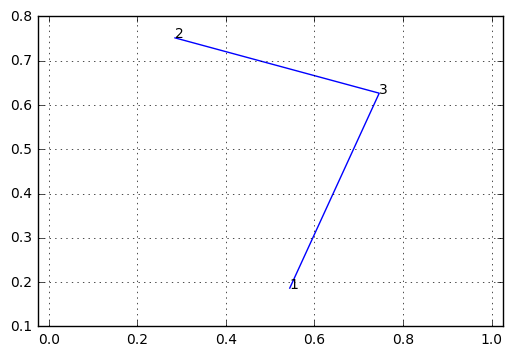

--- 0.0 seconds ---


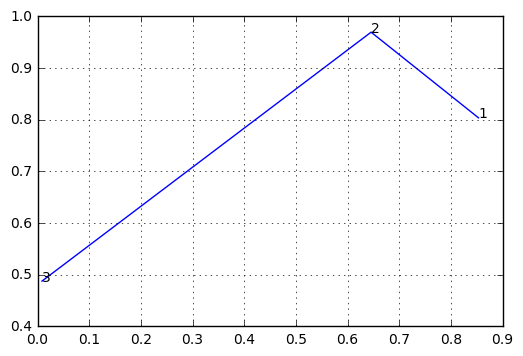

--- 0.0 seconds ---


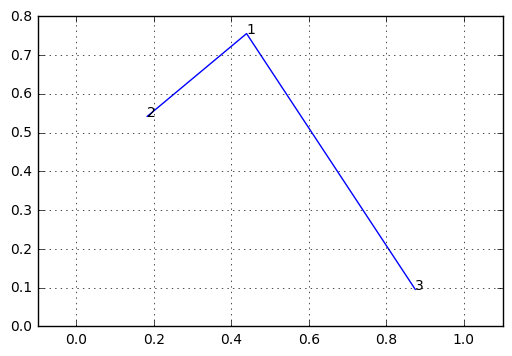

--- 0.0 seconds ---


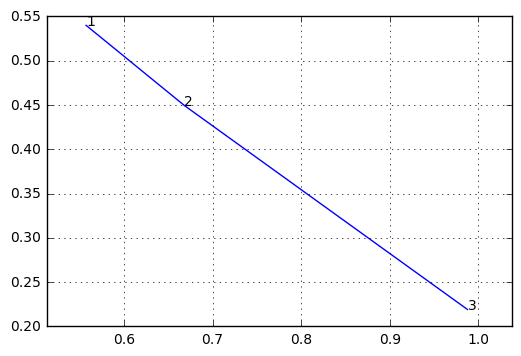

--- 0.0 seconds ---


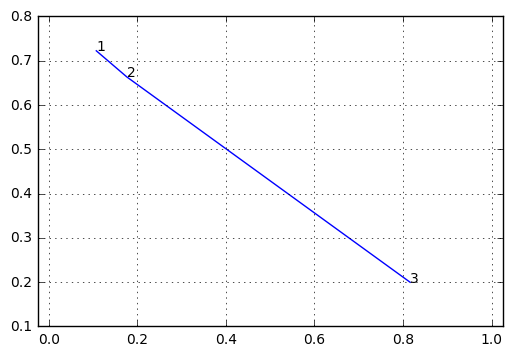

--- 0.0 seconds ---


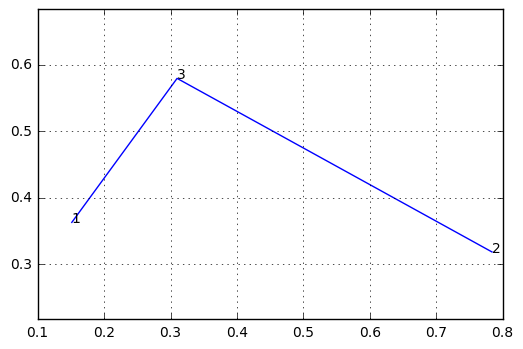

--- 0.0 seconds ---


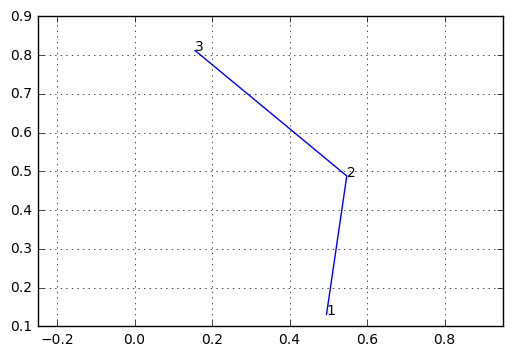

--- 0.0 seconds ---


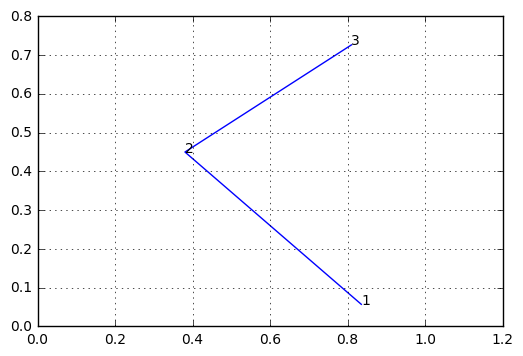

--- 0.0 seconds ---


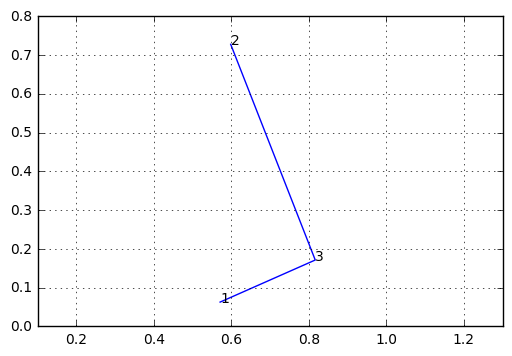

--- 0.0 seconds ---


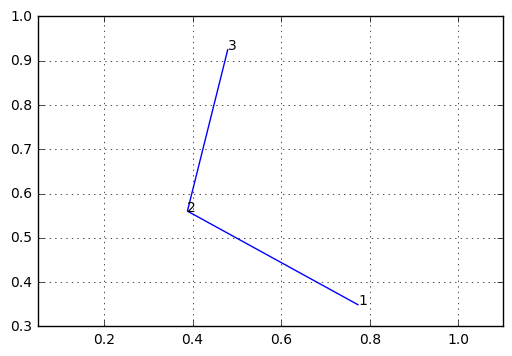

--- 0.0 seconds ---


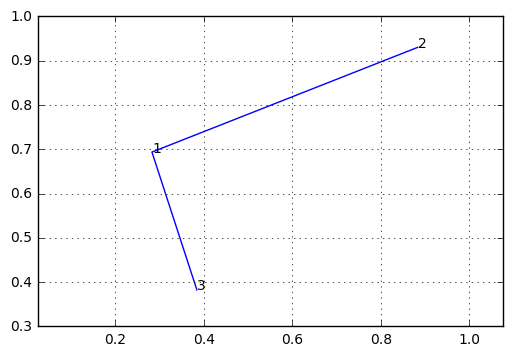

--- 0.0 seconds ---


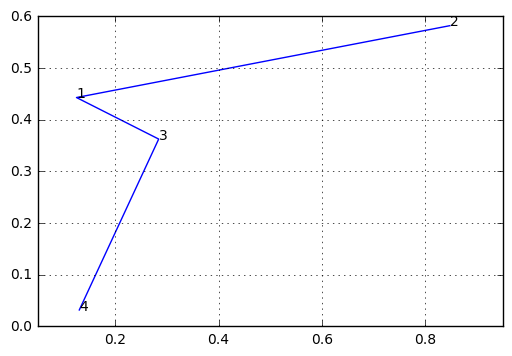

--- 0.0 seconds ---


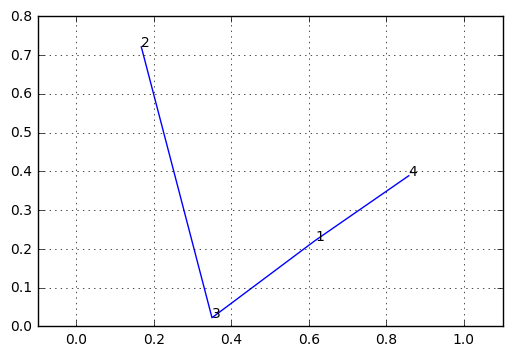

--- 0.0 seconds ---


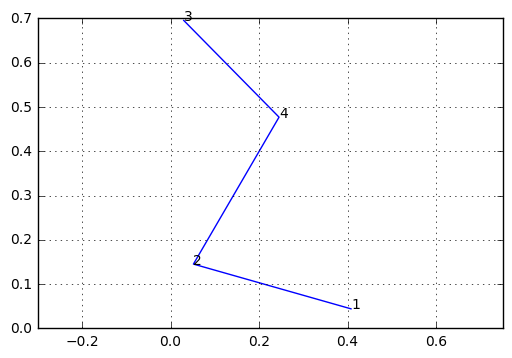

--- 0.0 seconds ---


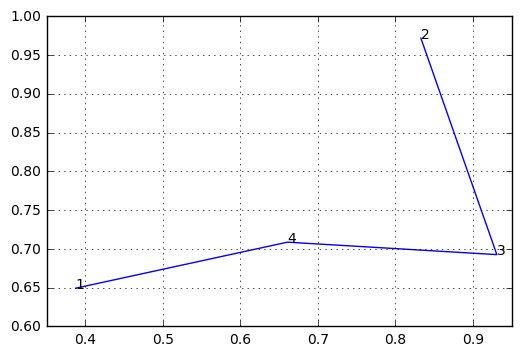

--- 0.0 seconds ---


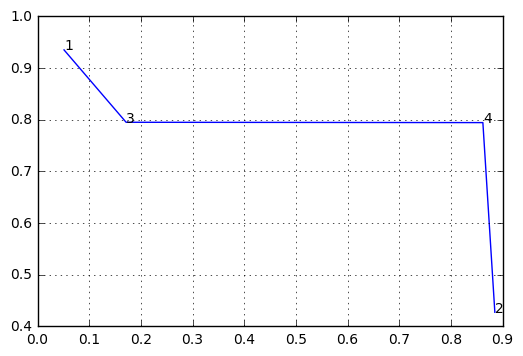

--- 0.0 seconds ---


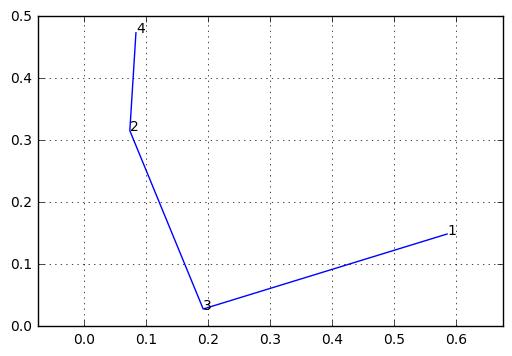

--- 0.0 seconds ---


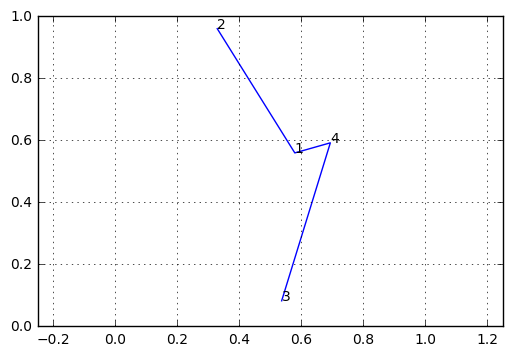

--- 0.0 seconds ---


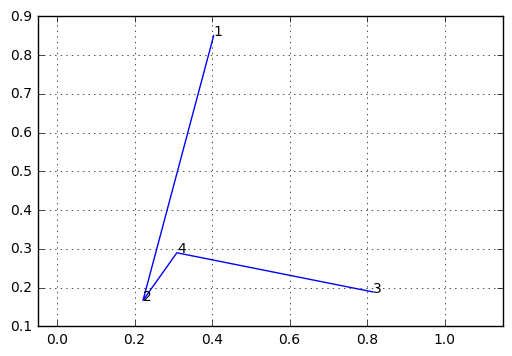

--- 0.0 seconds ---


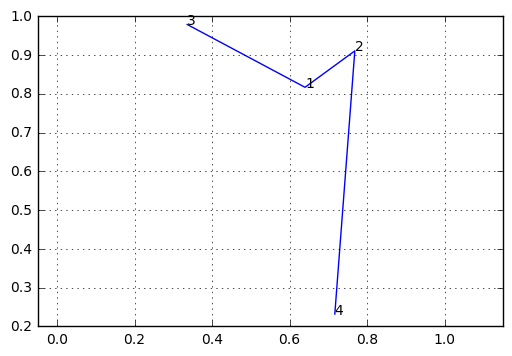

--- 0.0 seconds ---


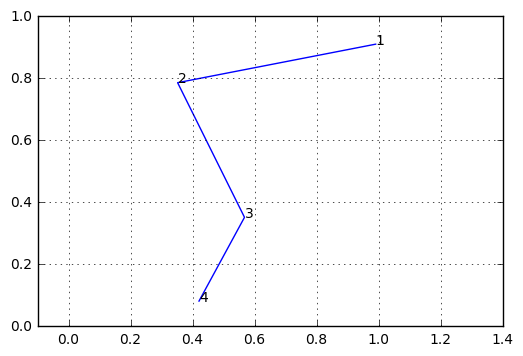

--- 0.0 seconds ---


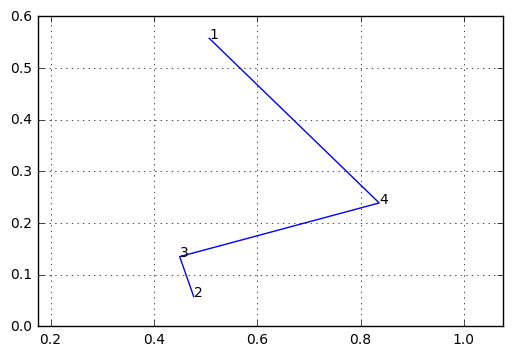

--- 0.0 seconds ---


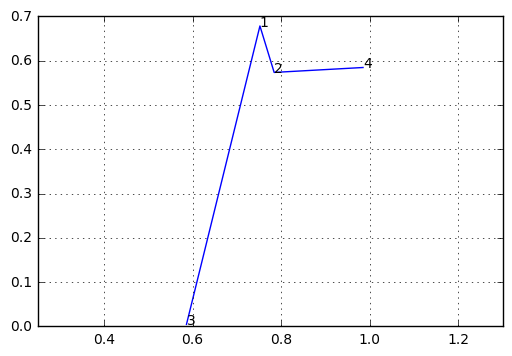

--- 0.0 seconds ---


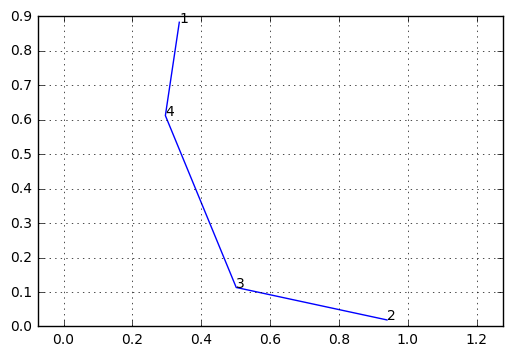

--- 0.0 seconds ---


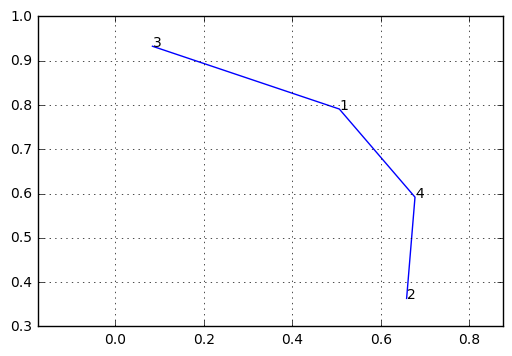

--- 0.0 seconds ---


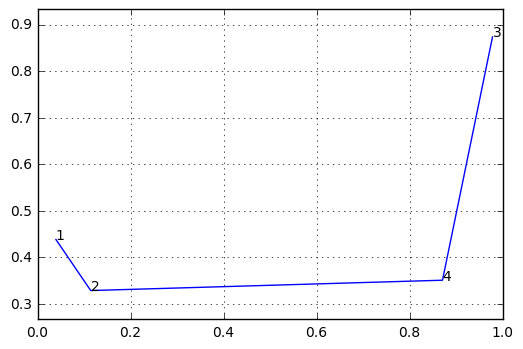

--- 0.0 seconds ---


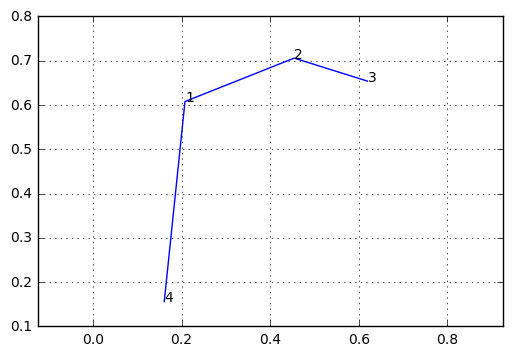

--- 0.0 seconds ---


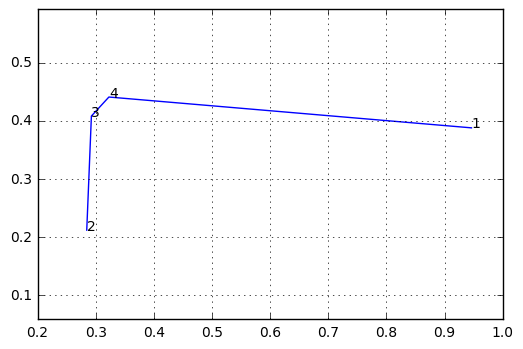

--- 0.0005002021789550781 seconds ---


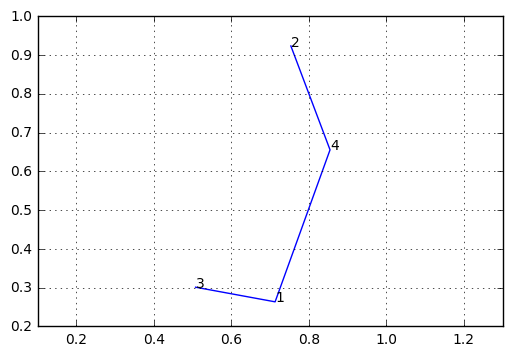

--- 0.0 seconds ---


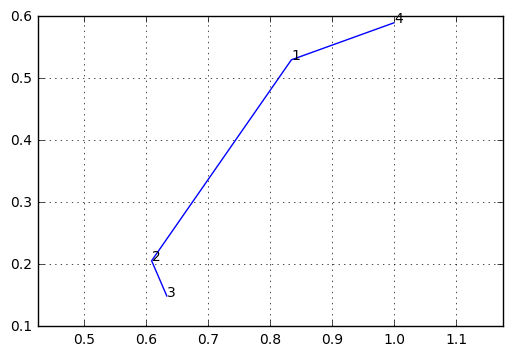

--- 0.0005013942718505859 seconds ---


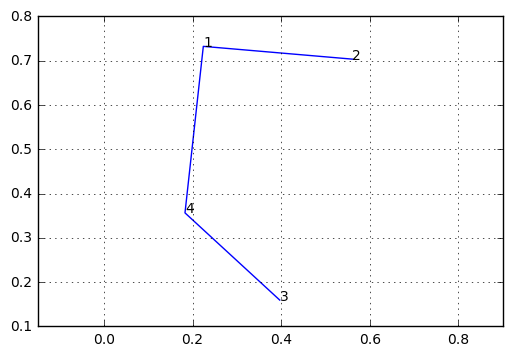

--- 0.0 seconds ---


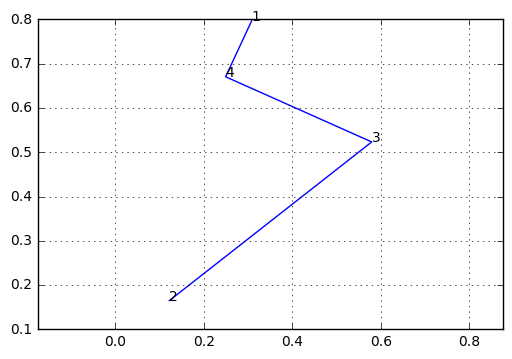

--- 0.0 seconds ---


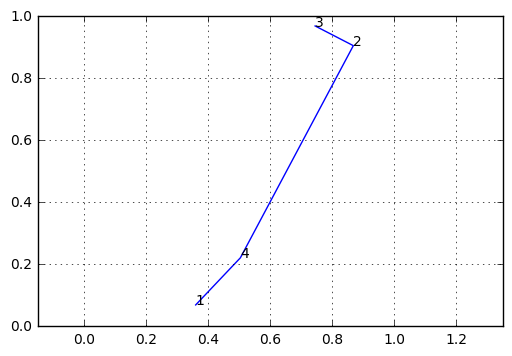

--- 0.0005002021789550781 seconds ---


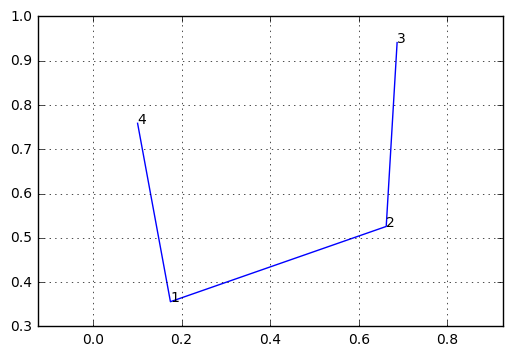

--- 0.0 seconds ---


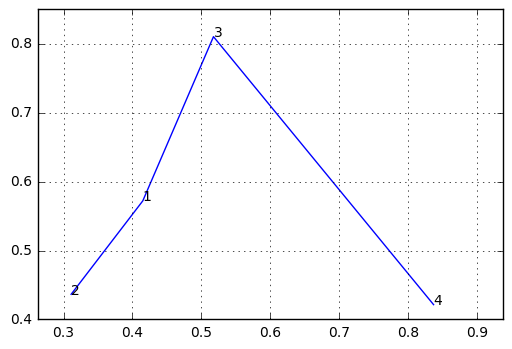

--- 0.0 seconds ---


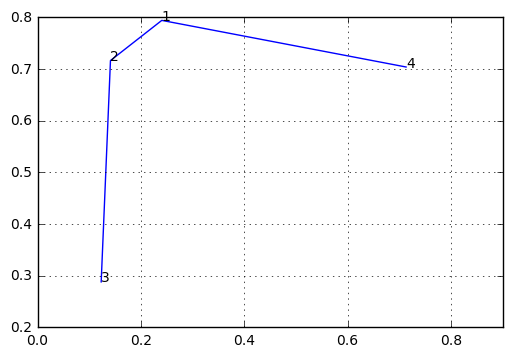

--- 0.0 seconds ---


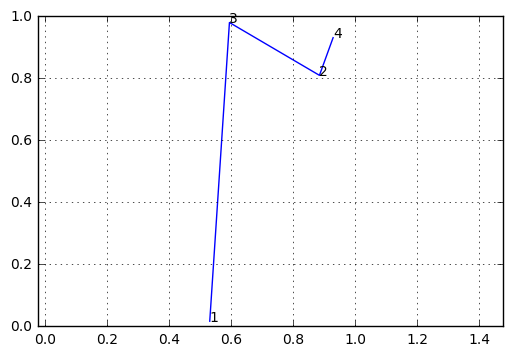

--- 0.0 seconds ---


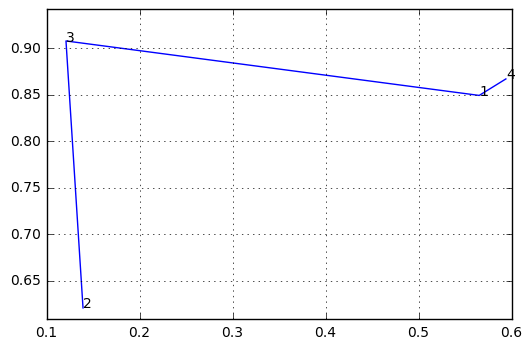

--- 0.0005009174346923828 seconds ---


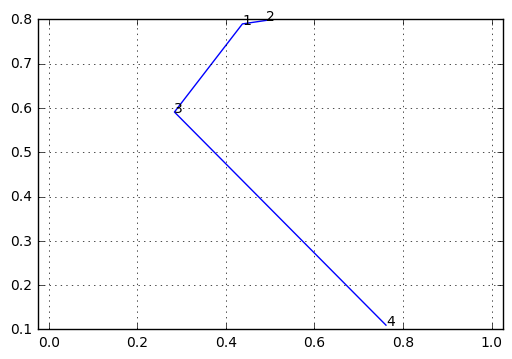

--- 0.0 seconds ---


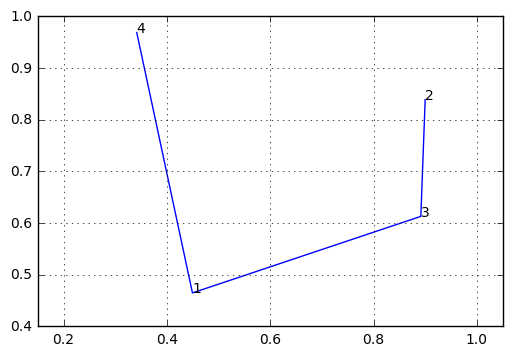

--- 0.0 seconds ---


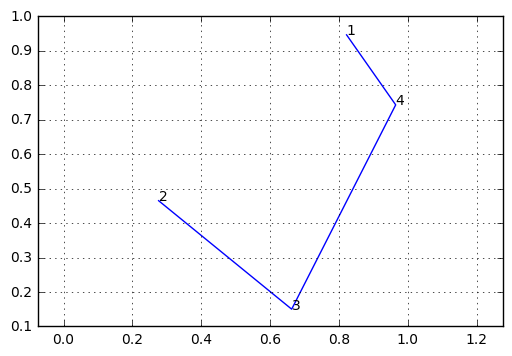

--- 0.0 seconds ---


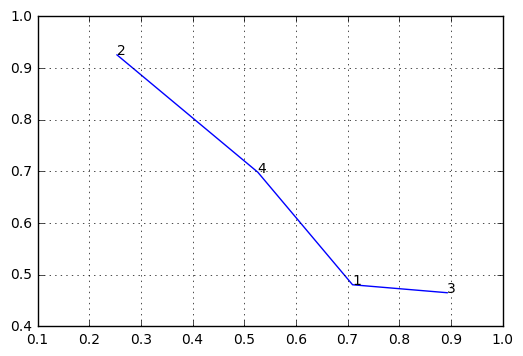

--- 0.0 seconds ---


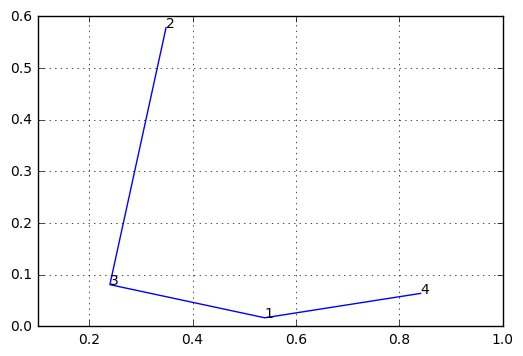

--- 0.0 seconds ---


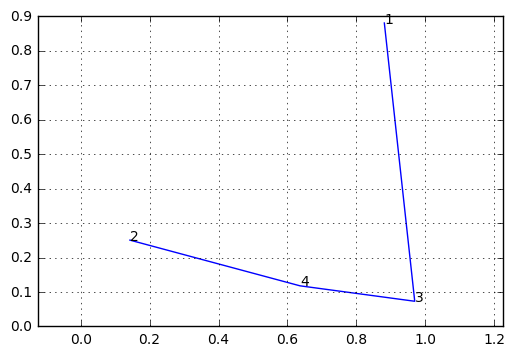

--- 0.0 seconds ---


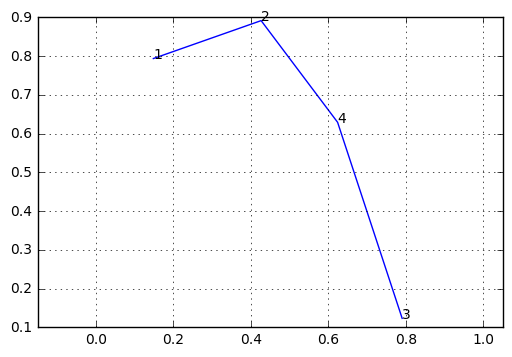

--- 0.0 seconds ---


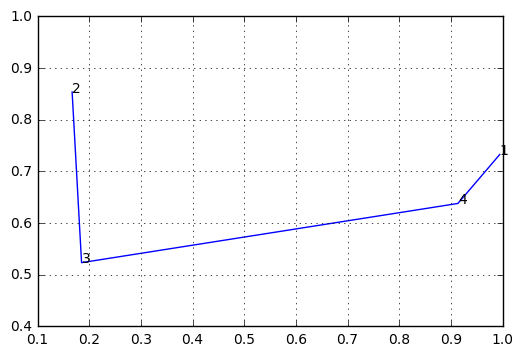

--- 0.0005004405975341797 seconds ---


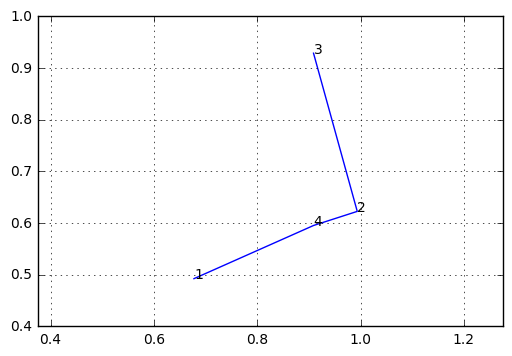

--- 0.0 seconds ---


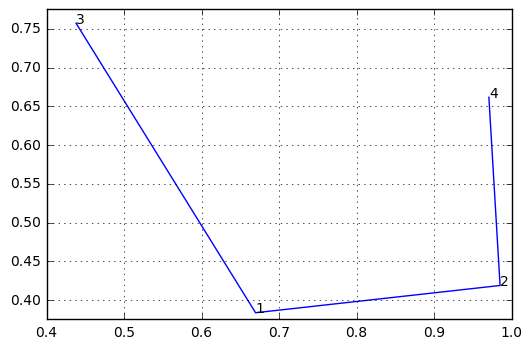

--- 0.0 seconds ---


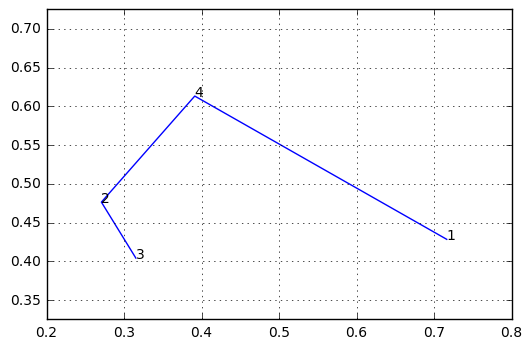

--- 0.0 seconds ---


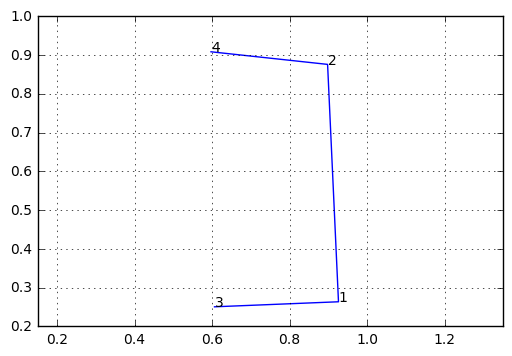

--- 0.0 seconds ---


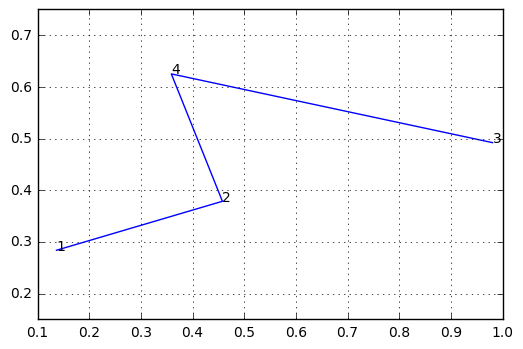

--- 0.0005002021789550781 seconds ---


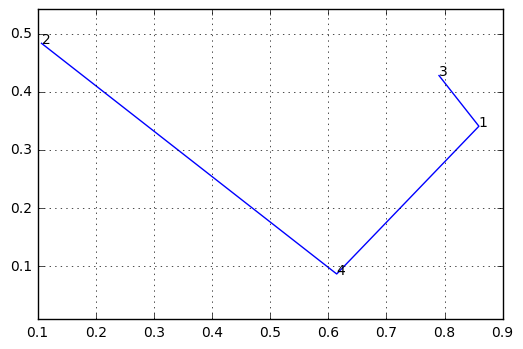

--- 0.0004999637603759766 seconds ---


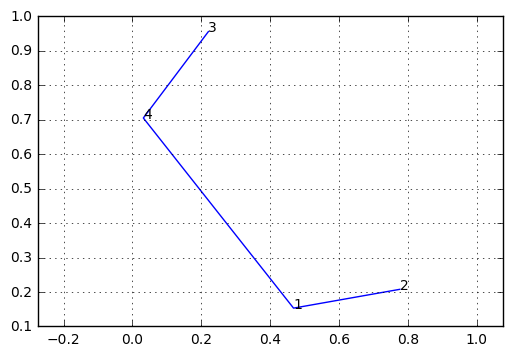

--- 0.0 seconds ---


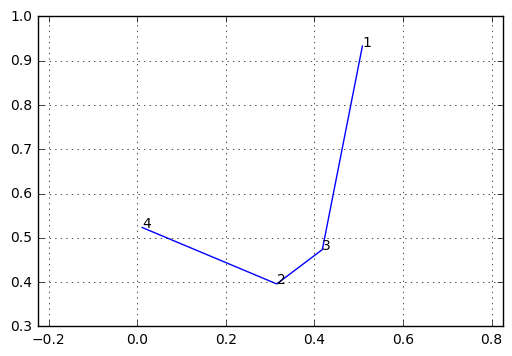

--- 0.0 seconds ---


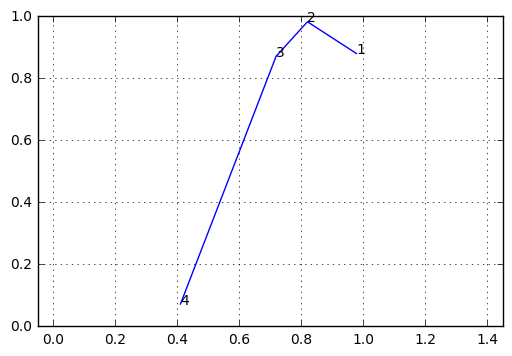

--- 0.0 seconds ---


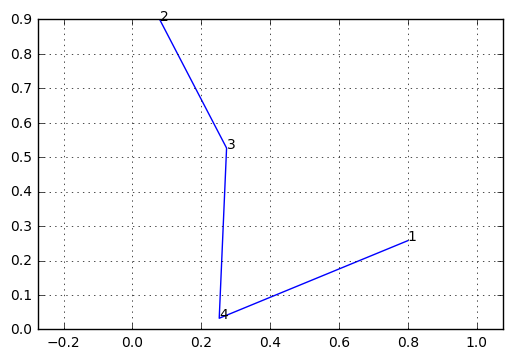

--- 0.0 seconds ---


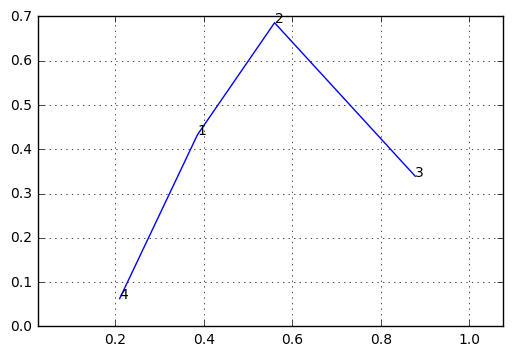

--- 0.0 seconds ---


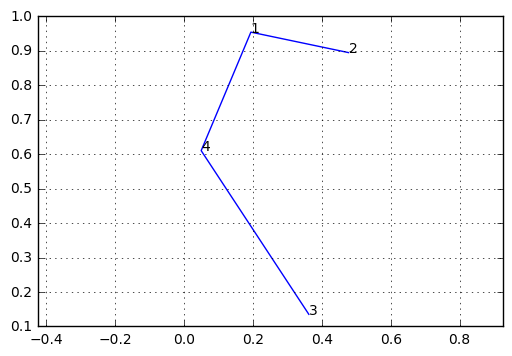

--- 0.0 seconds ---


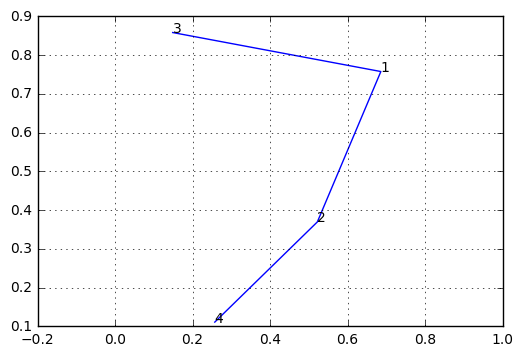

--- 0.0 seconds ---


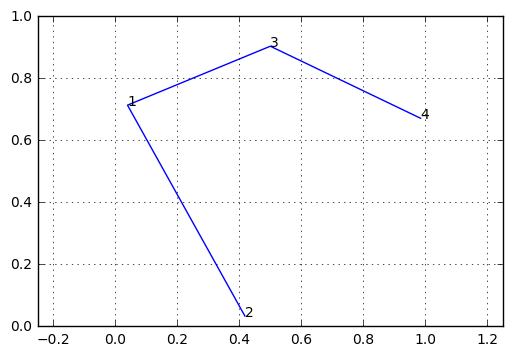

--- 0.0 seconds ---


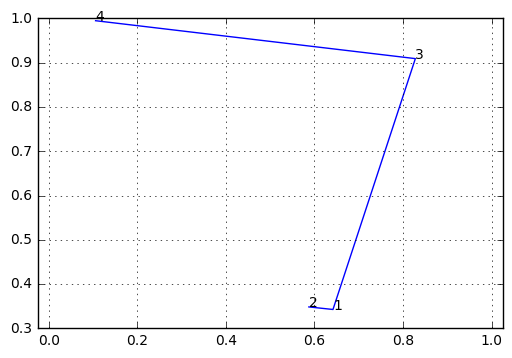

--- 0.0 seconds ---


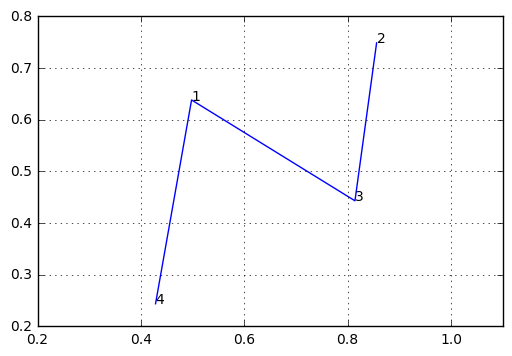

--- 0.0 seconds ---


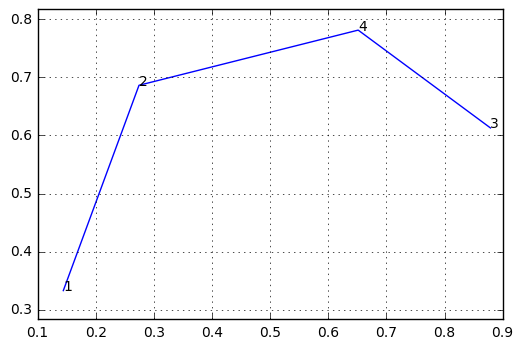

--- 0.0 seconds ---


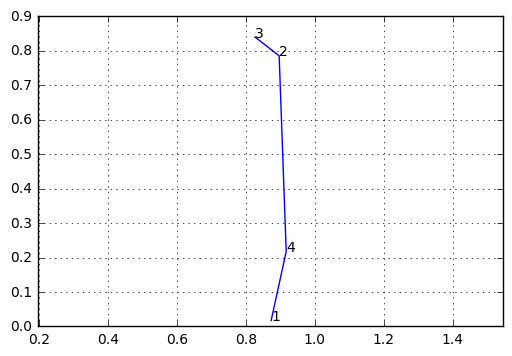

--- 0.0 seconds ---


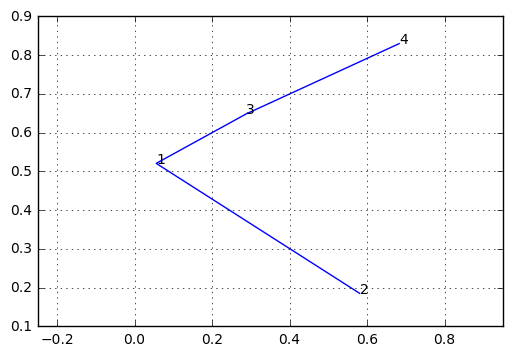

--- 0.0 seconds ---


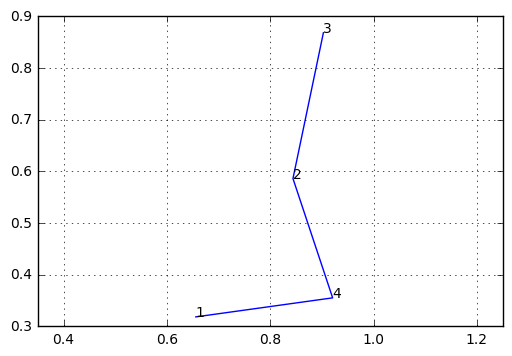

--- 0.0 seconds ---


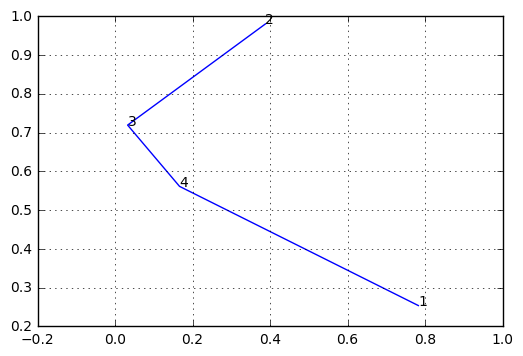

--- 0.0 seconds ---


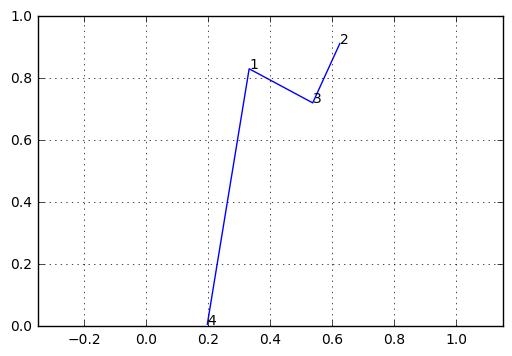

--- 0.0 seconds ---


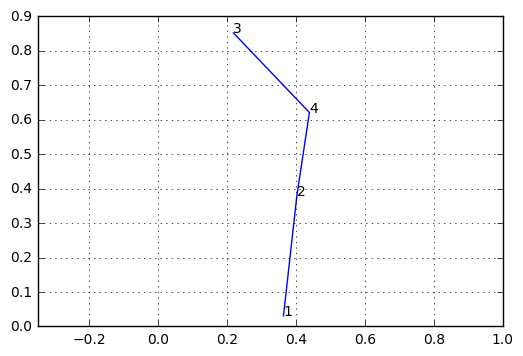

--- 0.0 seconds ---


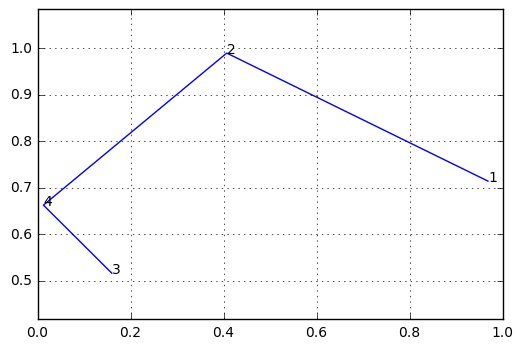

--- 0.0 seconds ---


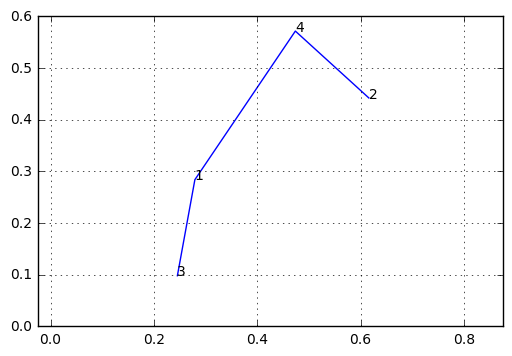

--- 0.0 seconds ---


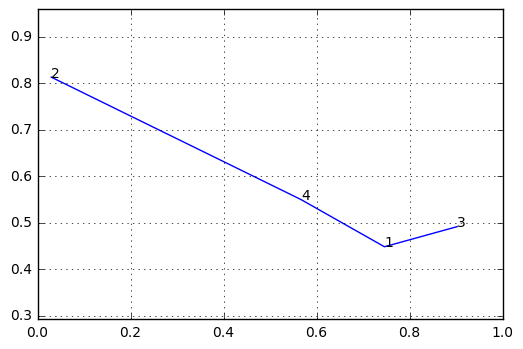

--- 0.0 seconds ---


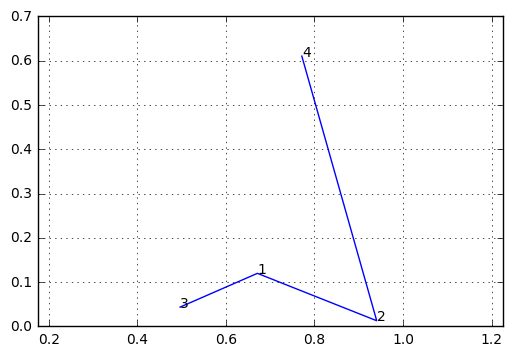

--- 0.0 seconds ---


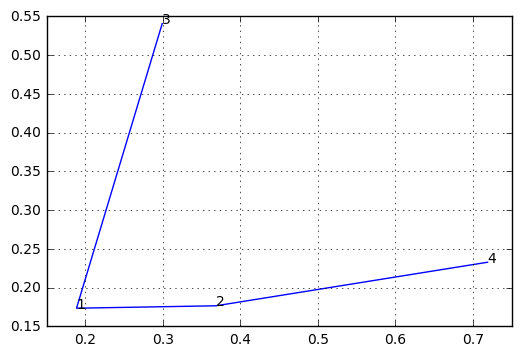

--- 0.0005021095275878906 seconds ---


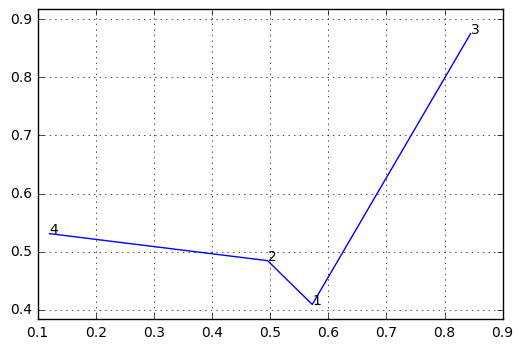

--- 0.0 seconds ---


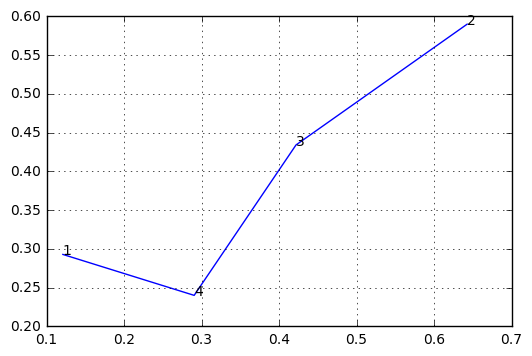

--- 0.0 seconds ---


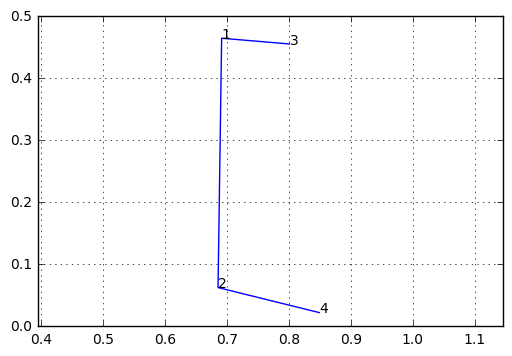

--- 0.0 seconds ---


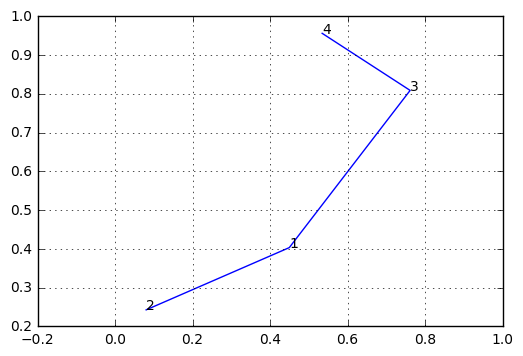

--- 0.0 seconds ---


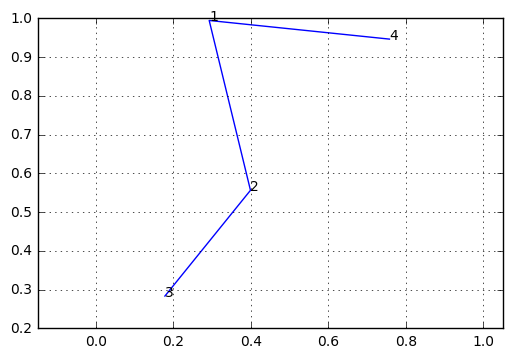

--- 0.0 seconds ---


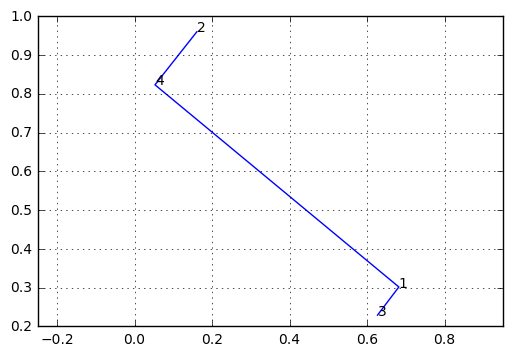

--- 0.0 seconds ---


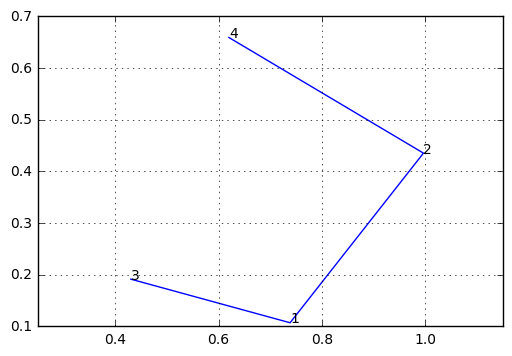

--- 0.0 seconds ---


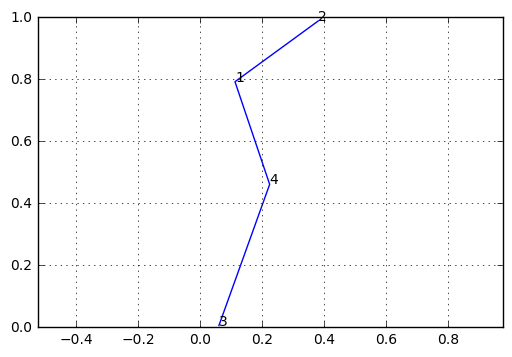

--- 0.0 seconds ---


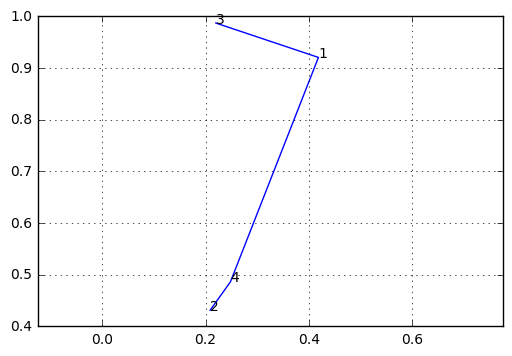

--- 0.0 seconds ---


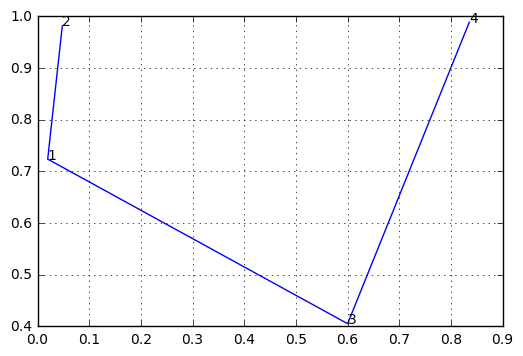

--- 0.0 seconds ---


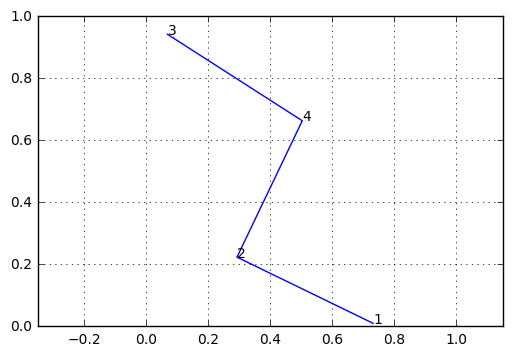

--- 0.0005004405975341797 seconds ---


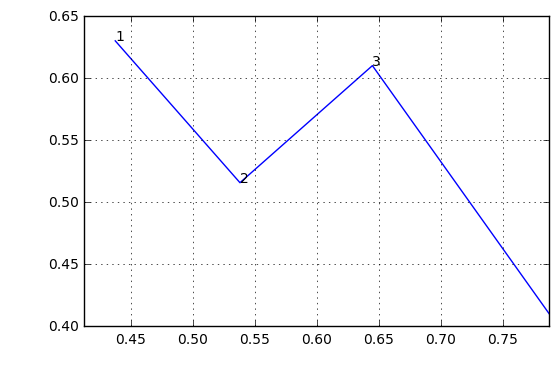

--- 0.0 seconds ---


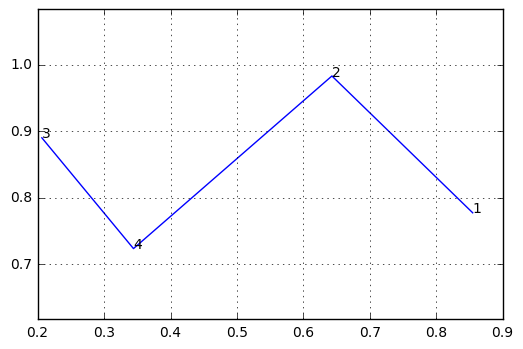

--- 0.0005004405975341797 seconds ---


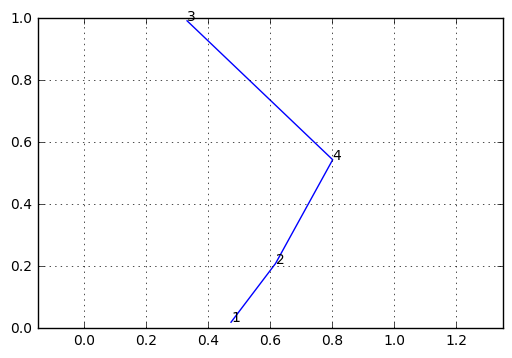

--- 0.0 seconds ---


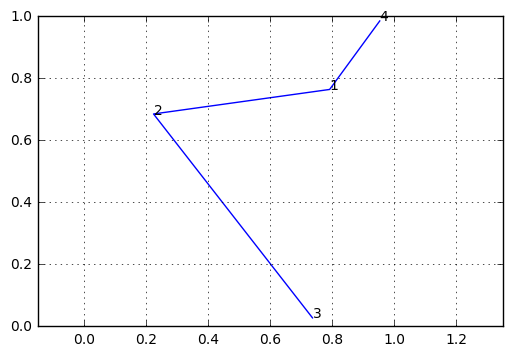

--- 0.0 seconds ---


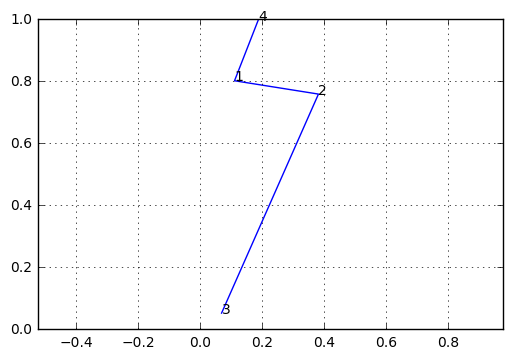

--- 0.0 seconds ---


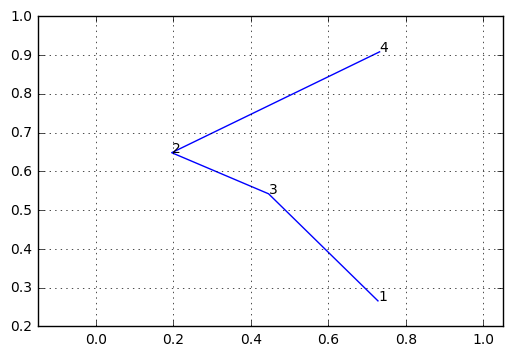

--- 0.0 seconds ---


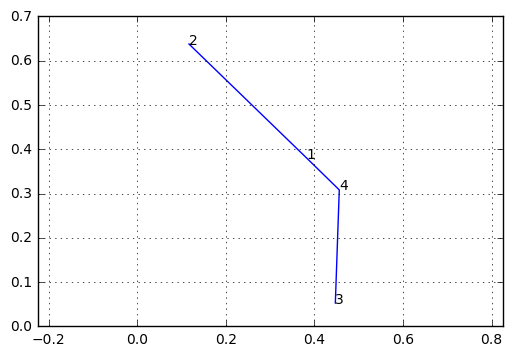

--- 0.0 seconds ---


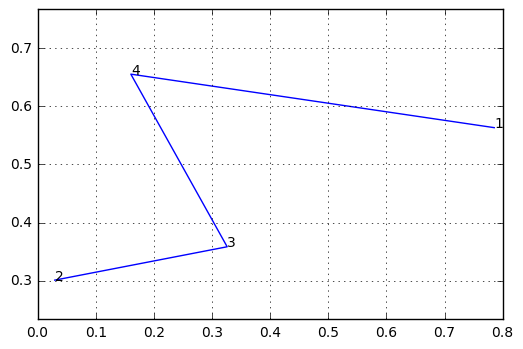

--- 0.0 seconds ---


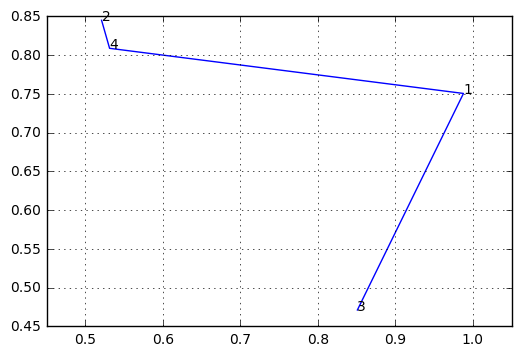

--- 0.0 seconds ---


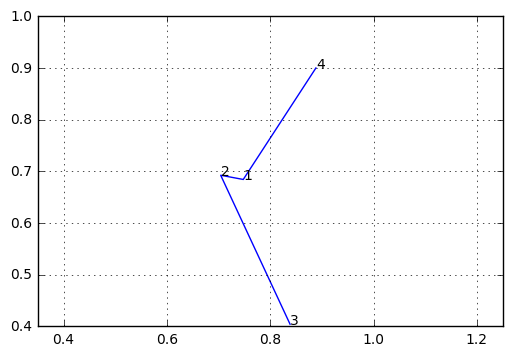

--- 0.0 seconds ---


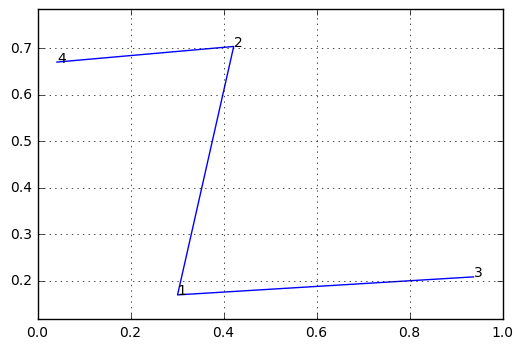

--- 0.0 seconds ---


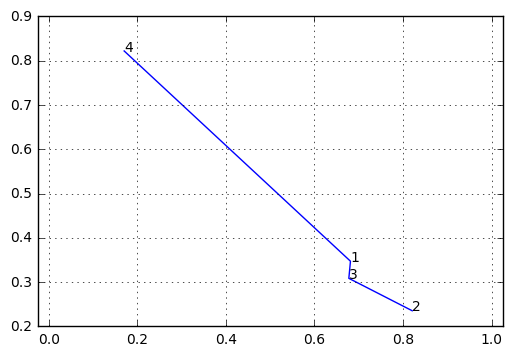

--- 0.0 seconds ---


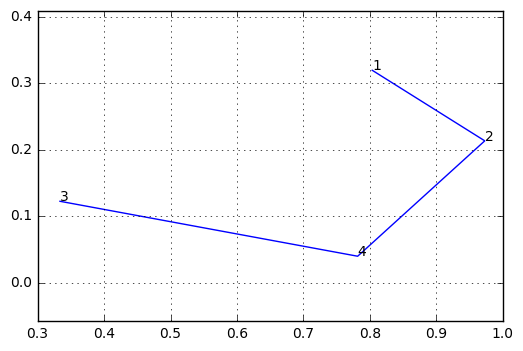

--- 0.0 seconds ---


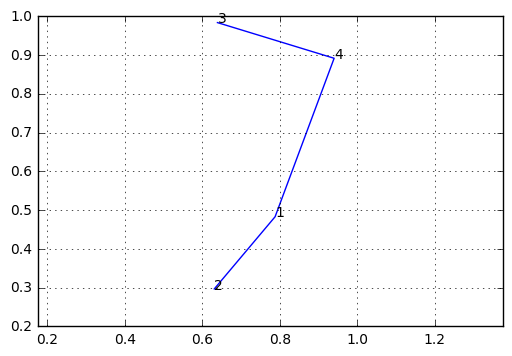

--- 0.0 seconds ---


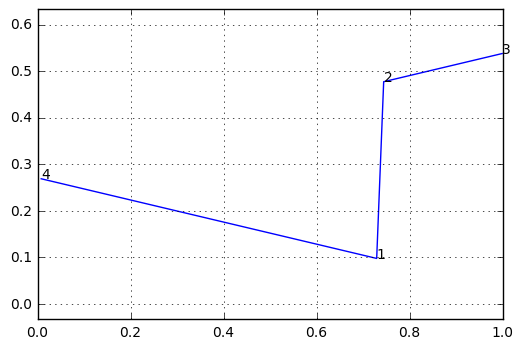

--- 0.0 seconds ---


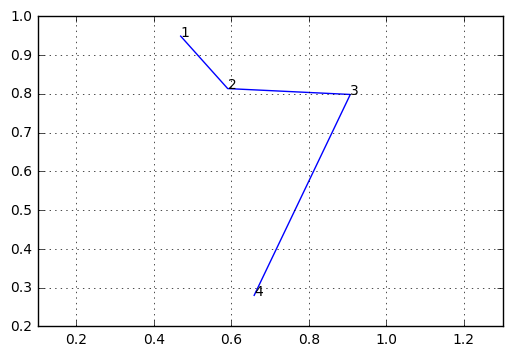

--- 0.0 seconds ---


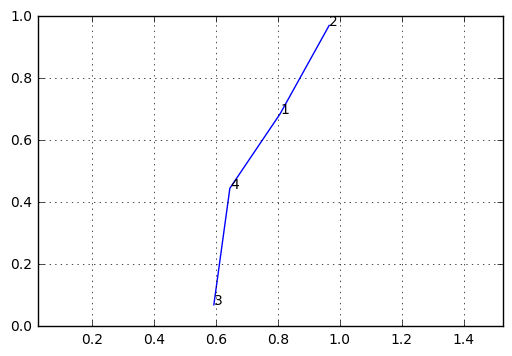

--- 0.0 seconds ---


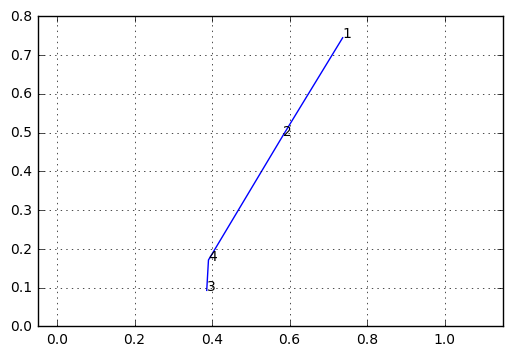

--- 0.0005016326904296875 seconds ---


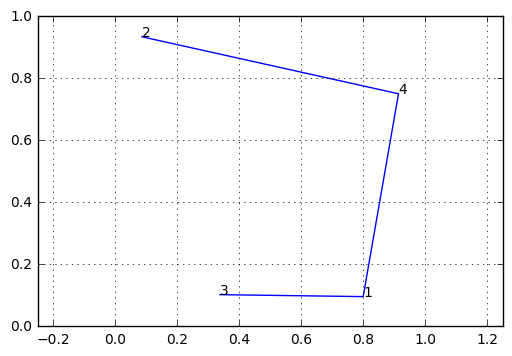

--- 0.0 seconds ---


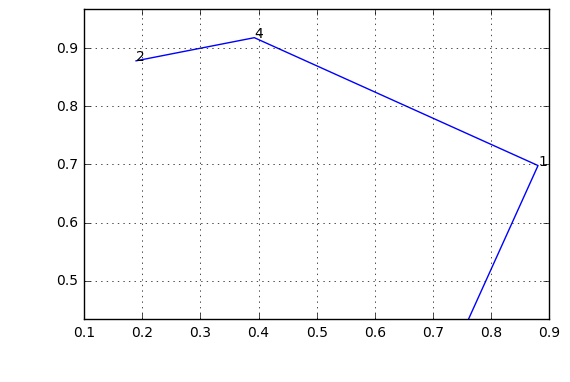

--- 0.0 seconds ---


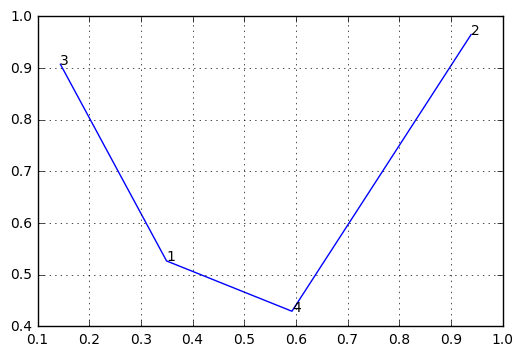

--- 0.0004999637603759766 seconds ---


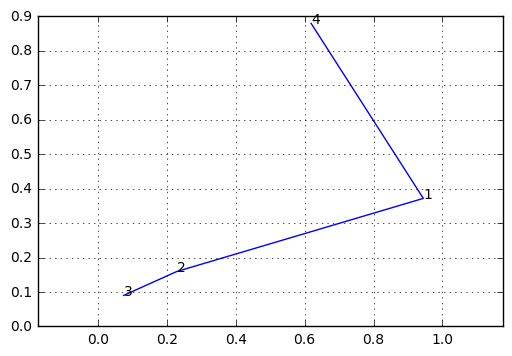

--- 0.0 seconds ---


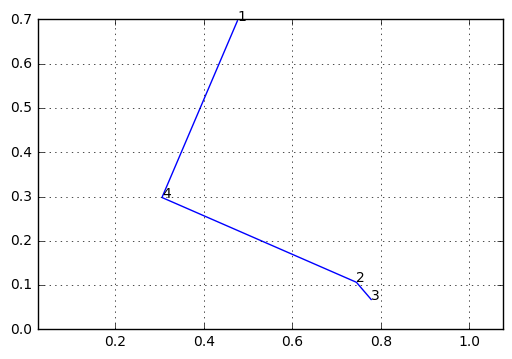

--- 0.0 seconds ---


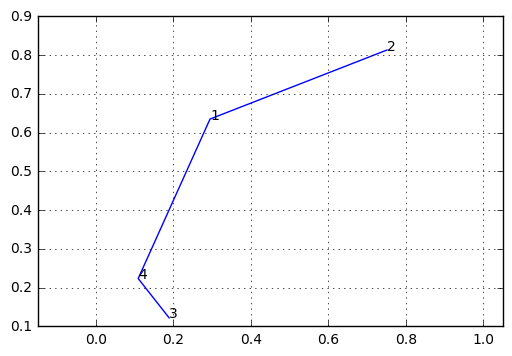

--- 0.0 seconds ---


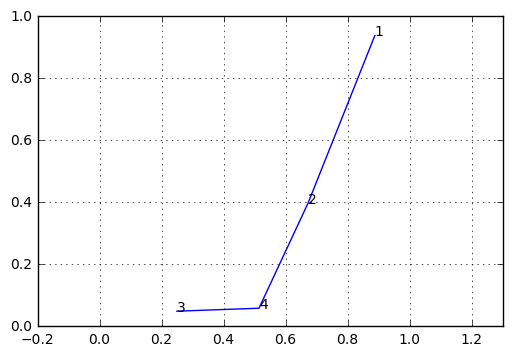

--- 0.0 seconds ---


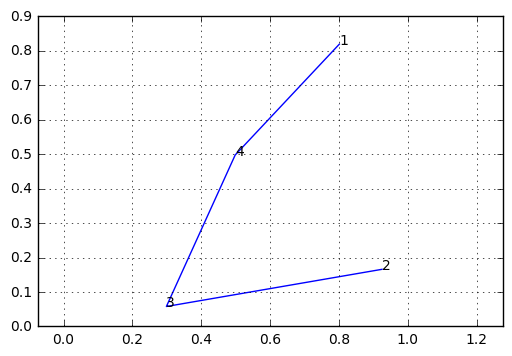

--- 0.000484466552734375 seconds ---


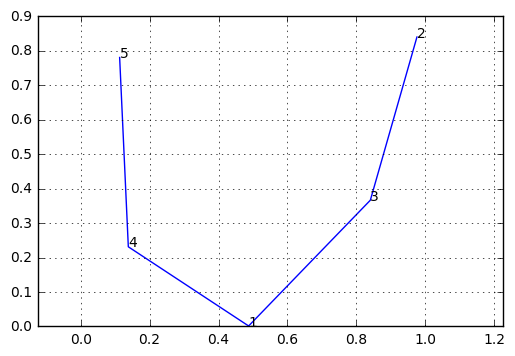

--- 0.0 seconds ---


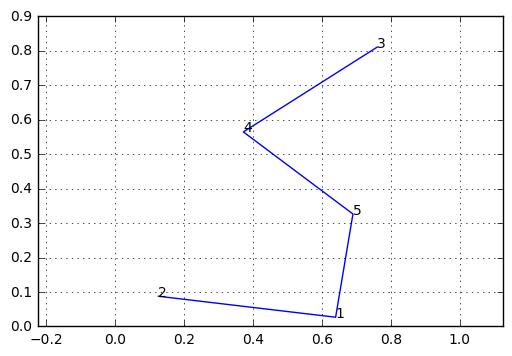

--- 0.0 seconds ---


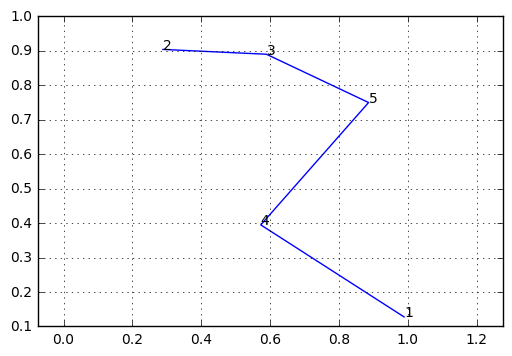

--- 0.0 seconds ---


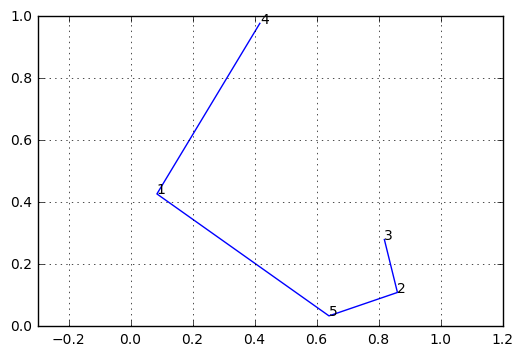

--- 0.0 seconds ---


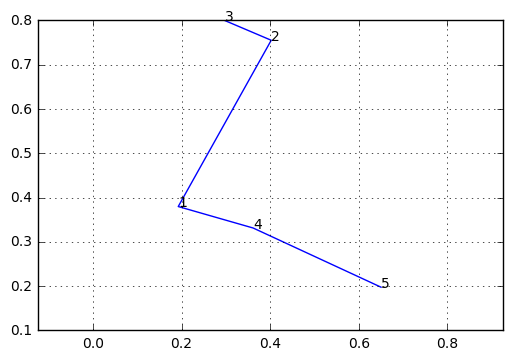

--- 0.0 seconds ---


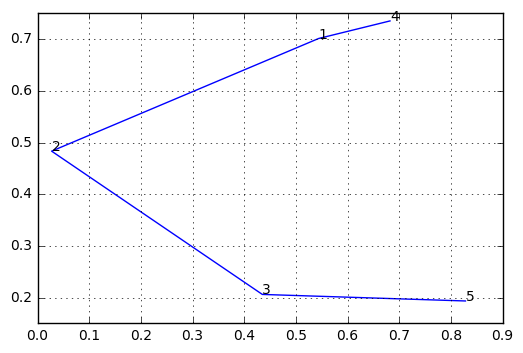

--- 0.0 seconds ---


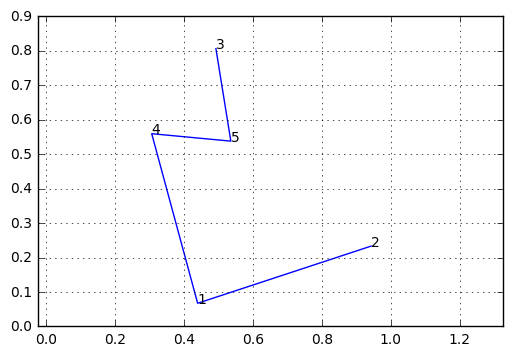

--- 0.0 seconds ---


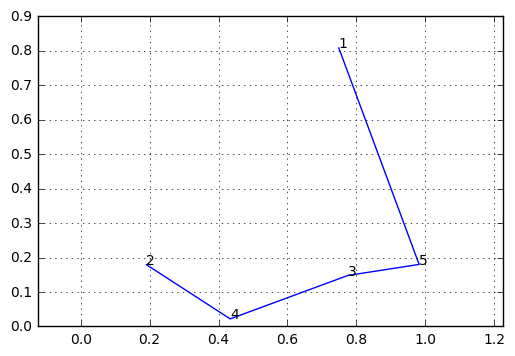

--- 0.0 seconds ---


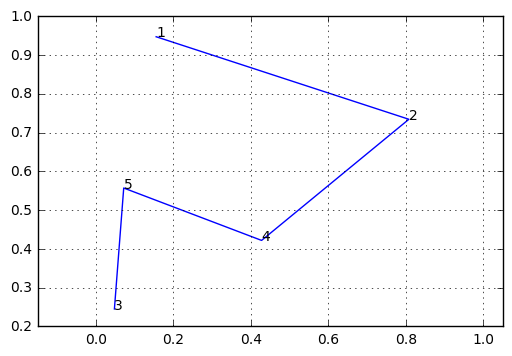

--- 0.0 seconds ---


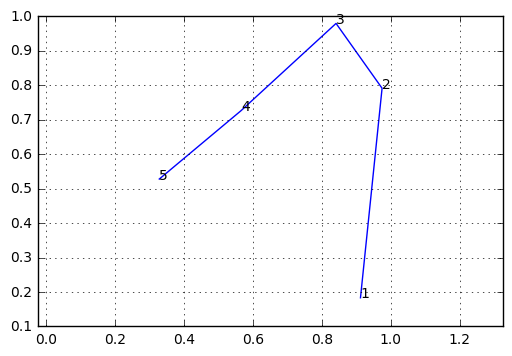

--- 0.0 seconds ---


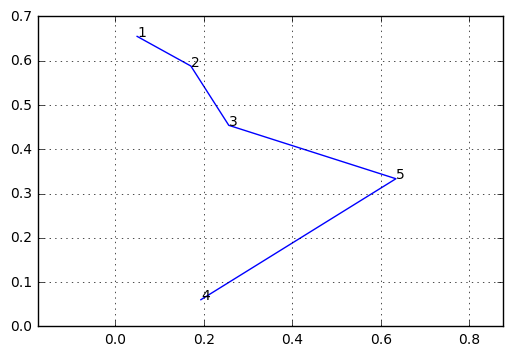

--- 0.0 seconds ---


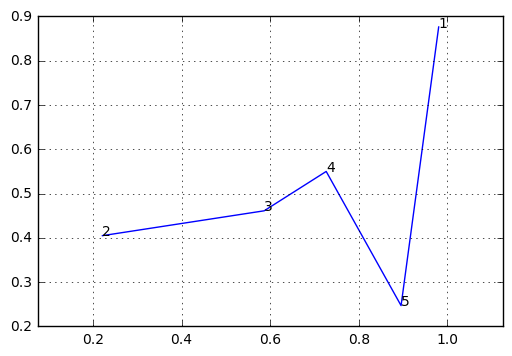

--- 0.0 seconds ---


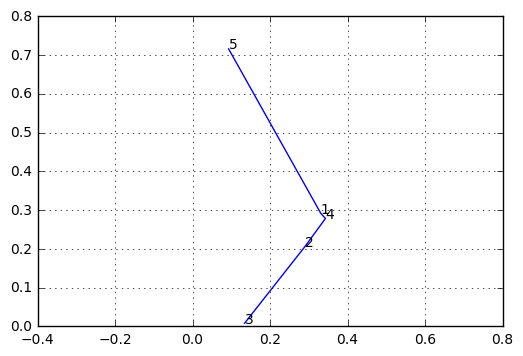

--- 0.0 seconds ---


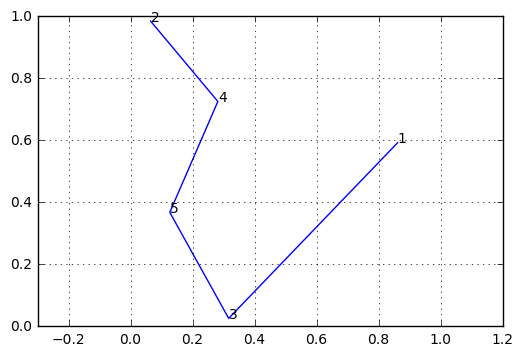

--- 0.0 seconds ---


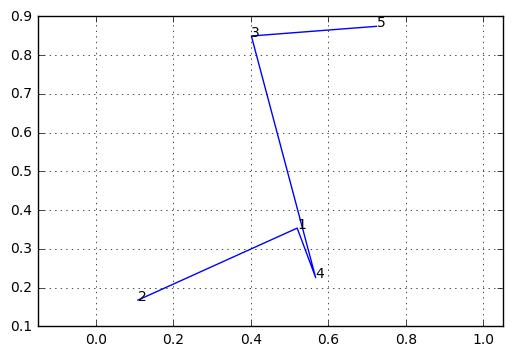

--- 0.0 seconds ---


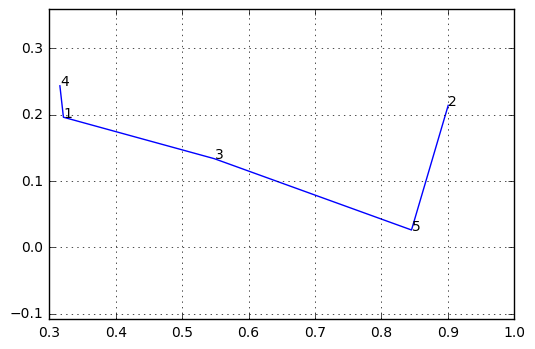

--- 0.0 seconds ---


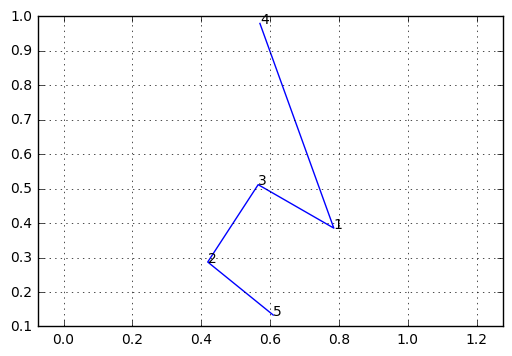

--- 0.0 seconds ---


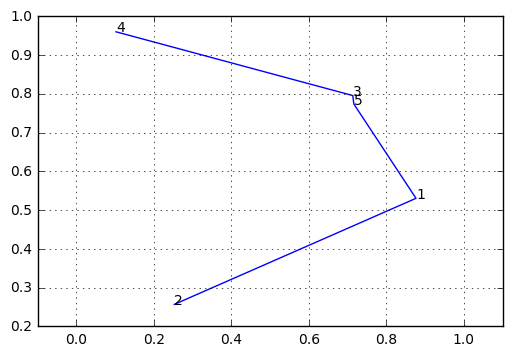

--- 0.0 seconds ---


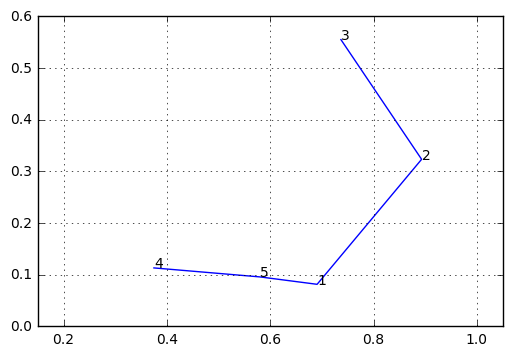

--- 0.0 seconds ---


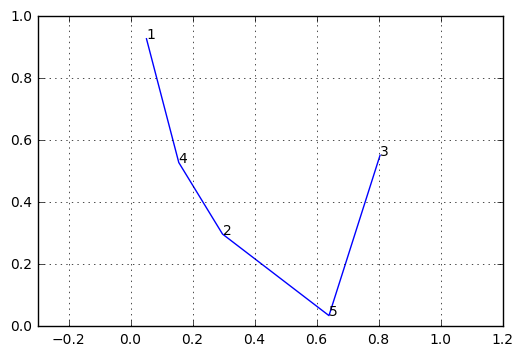

--- 0.0 seconds ---


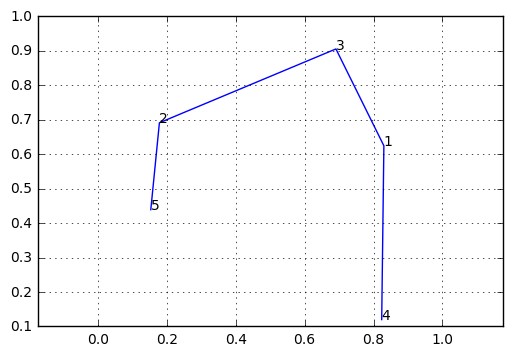

--- 0.0 seconds ---


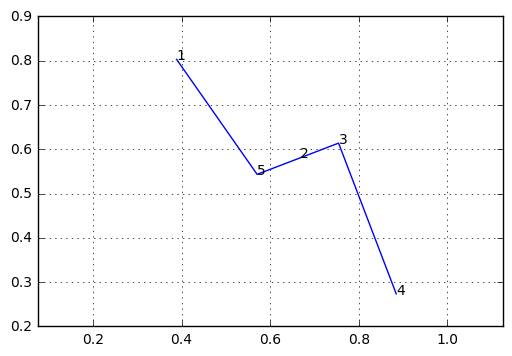

--- 0.0 seconds ---


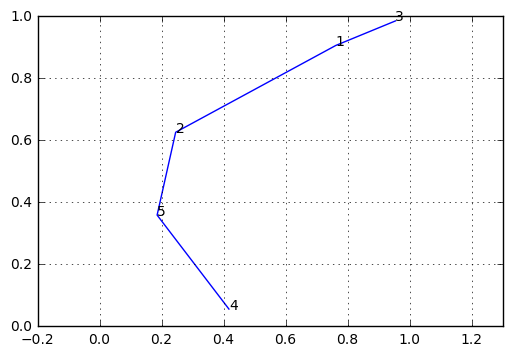

--- 0.0005009174346923828 seconds ---


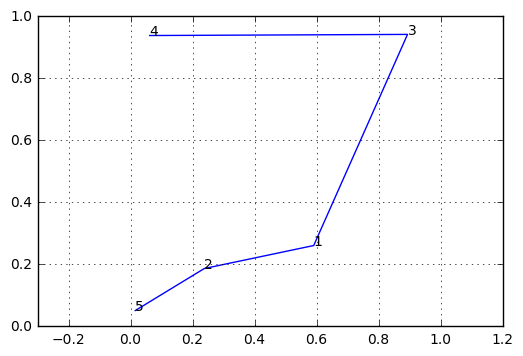

--- 0.0005002021789550781 seconds ---


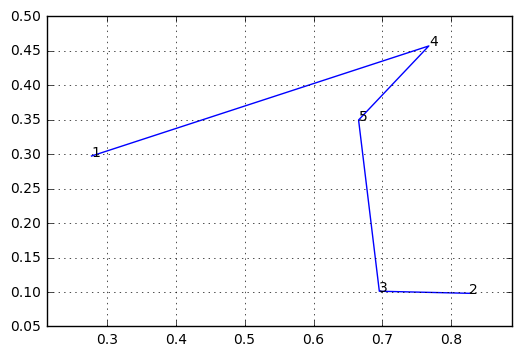

--- 0.0 seconds ---


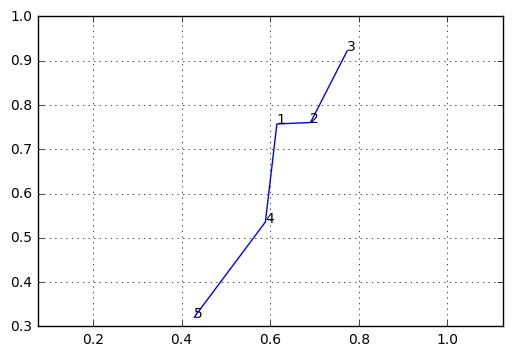

--- 0.0 seconds ---


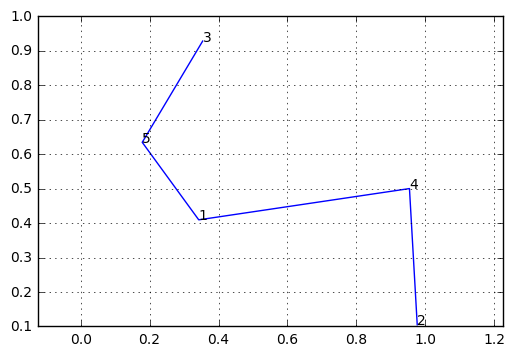

--- 0.0005011558532714844 seconds ---


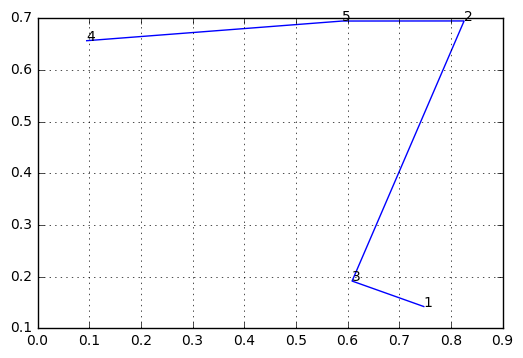

--- 0.0 seconds ---


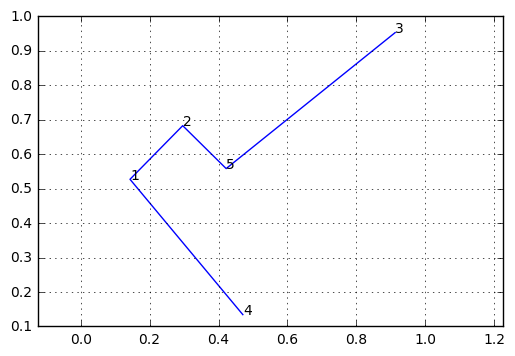

--- 0.0005002021789550781 seconds ---


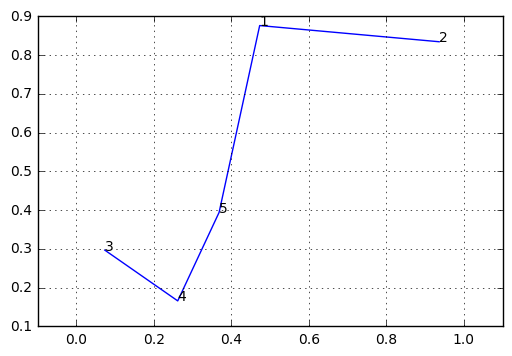

--- 0.0 seconds ---


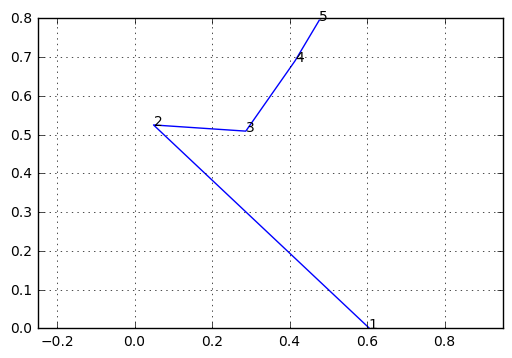

--- 0.0 seconds ---


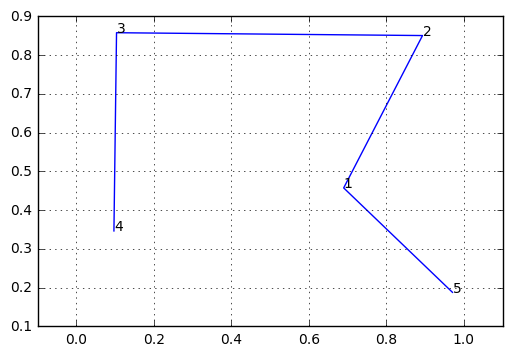

--- 0.0004999637603759766 seconds ---


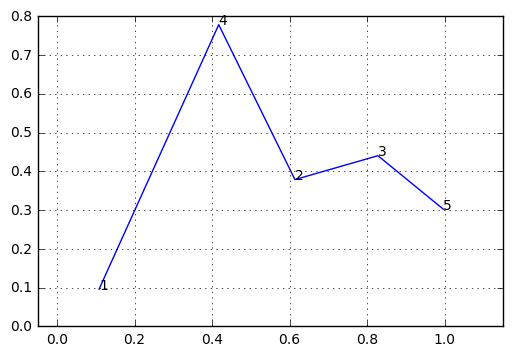

--- 0.0 seconds ---


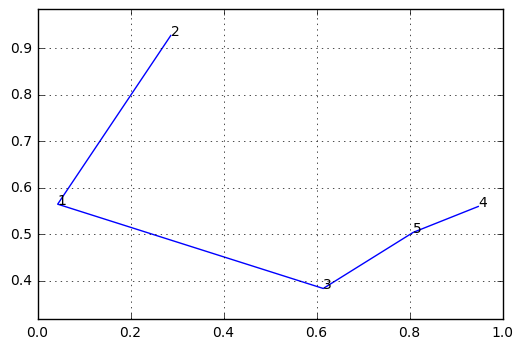

--- 0.0 seconds ---


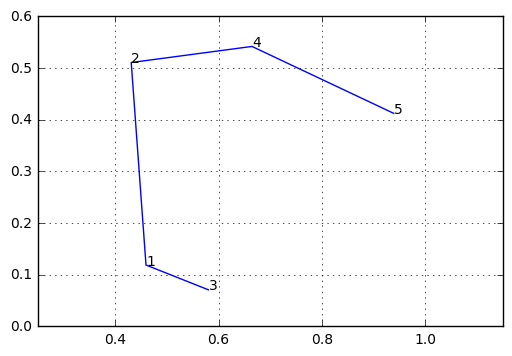

--- 0.0 seconds ---


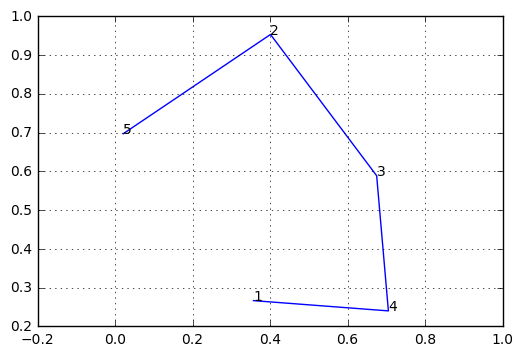

--- 0.0 seconds ---


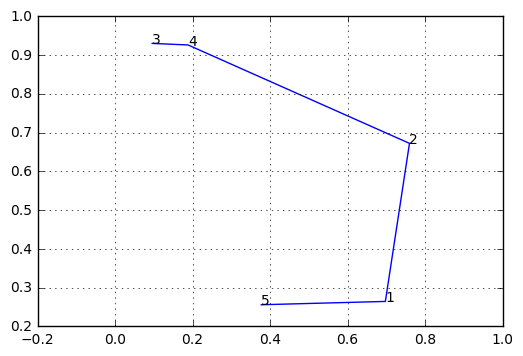

--- 0.0 seconds ---


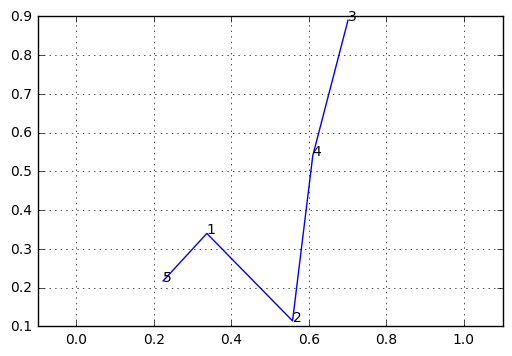

--- 0.0 seconds ---


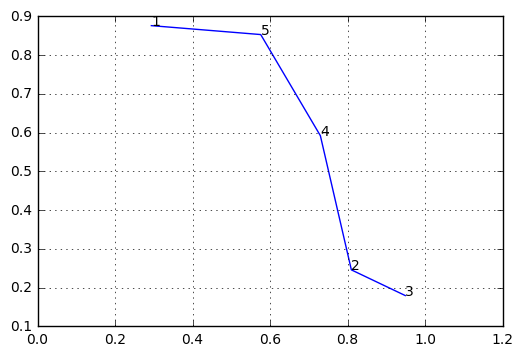

--- 0.0 seconds ---


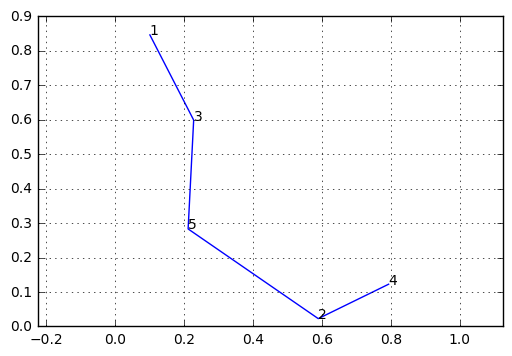

--- 0.0 seconds ---


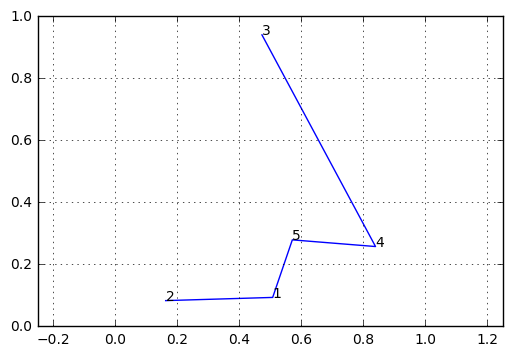

--- 0.0 seconds ---


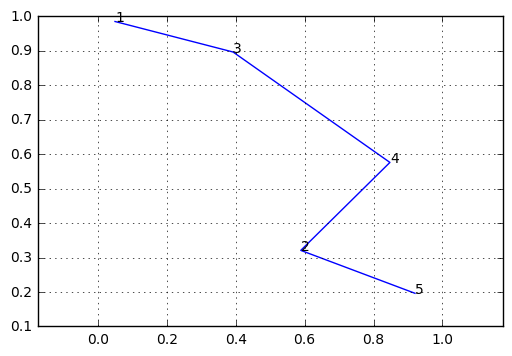

--- 0.0004999637603759766 seconds ---


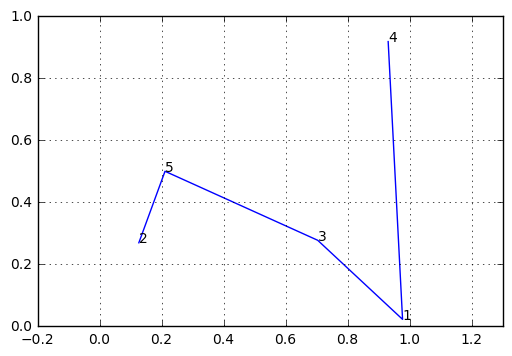

--- 0.0005011558532714844 seconds ---


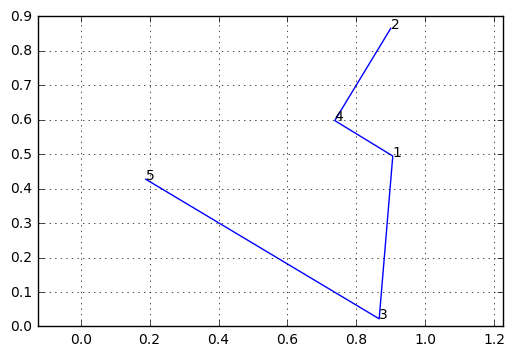

--- 0.0 seconds ---


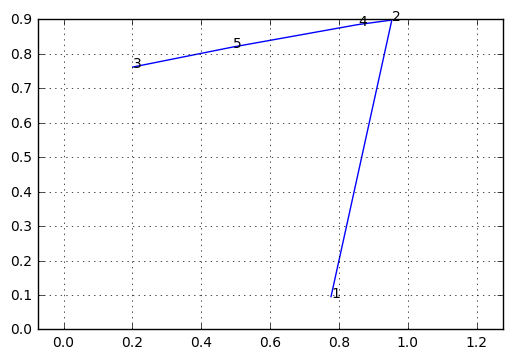

--- 0.0 seconds ---


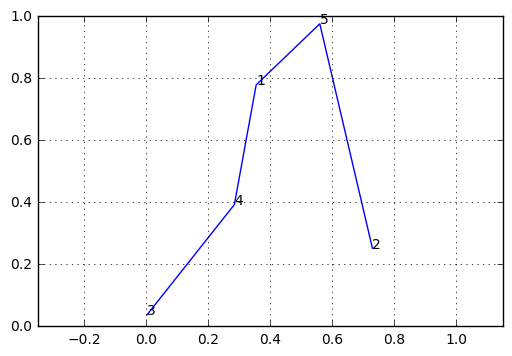

--- 0.0005002021789550781 seconds ---


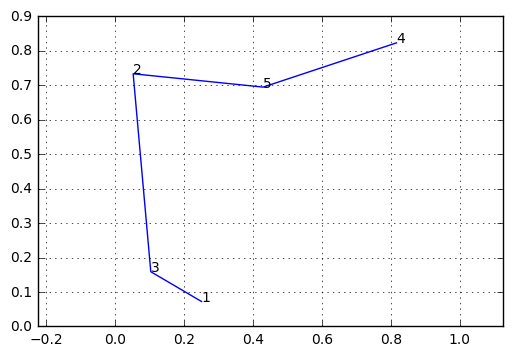

--- 0.0 seconds ---


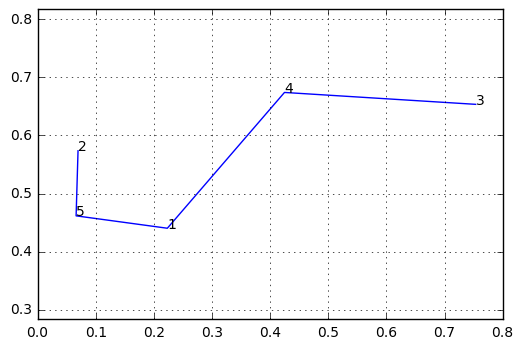

--- 0.0 seconds ---


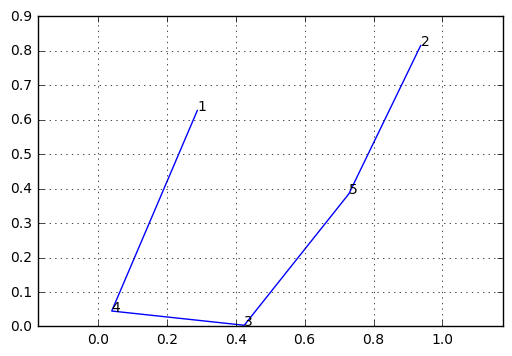

--- 0.0 seconds ---


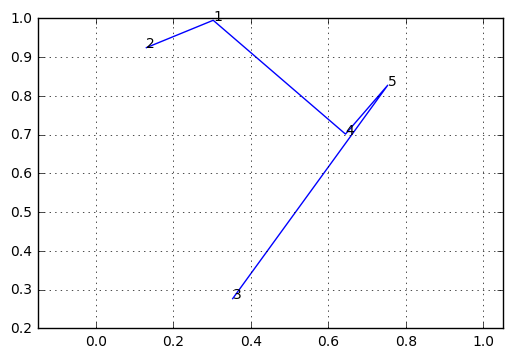

--- 0.0 seconds ---


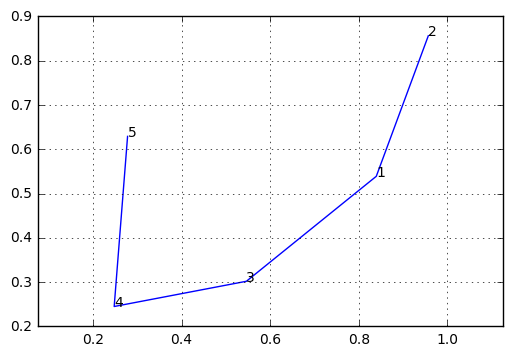

--- 0.0 seconds ---


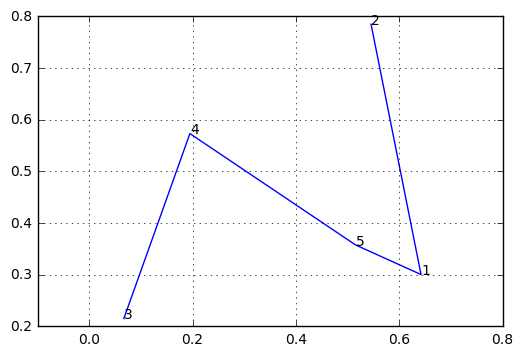

--- 0.0 seconds ---


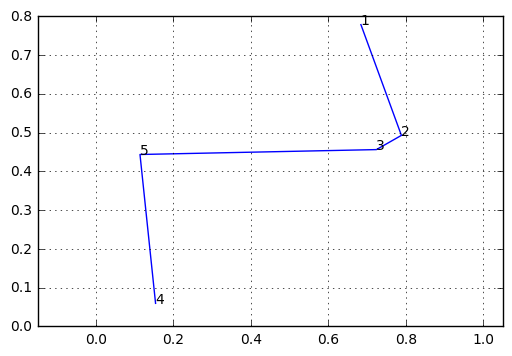

--- 0.0 seconds ---


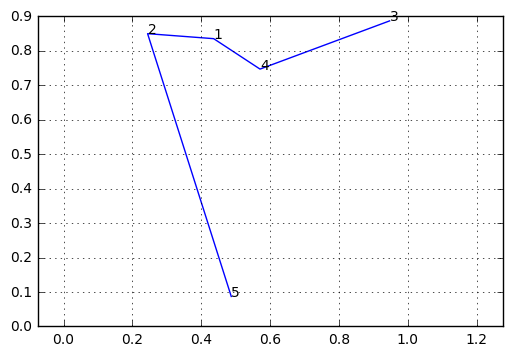

--- 0.0 seconds ---


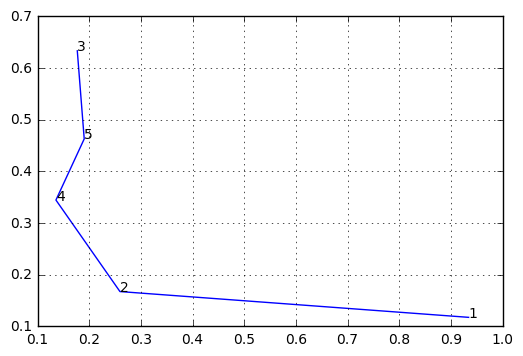

--- 0.0 seconds ---


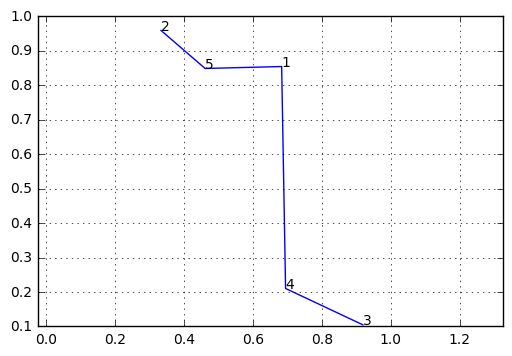

--- 0.0 seconds ---


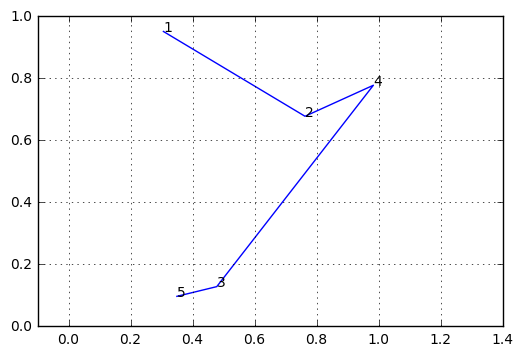

--- 0.0 seconds ---


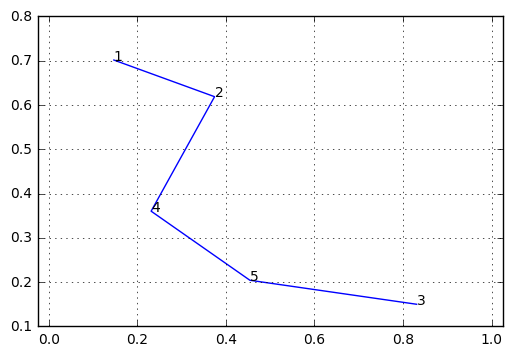

--- 0.0 seconds ---


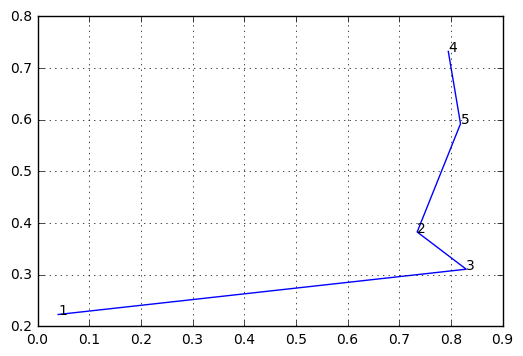

--- 0.0 seconds ---


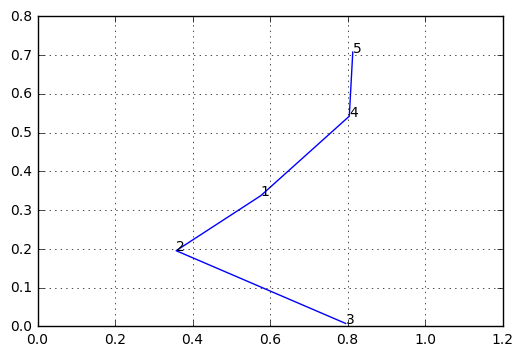

--- 0.0 seconds ---


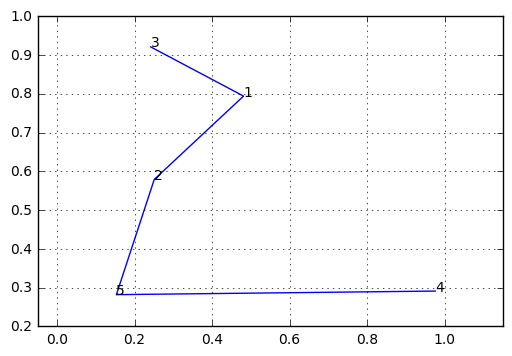

--- 0.0 seconds ---


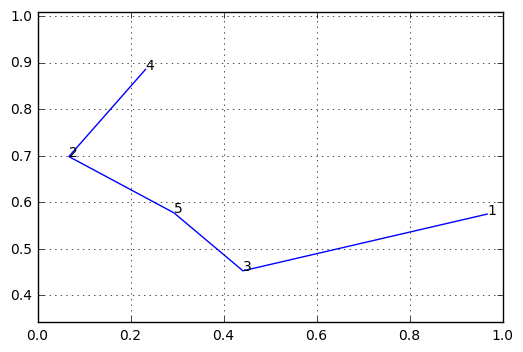

--- 0.0 seconds ---


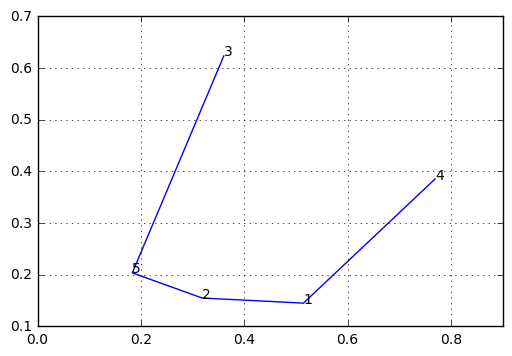

--- 0.0 seconds ---


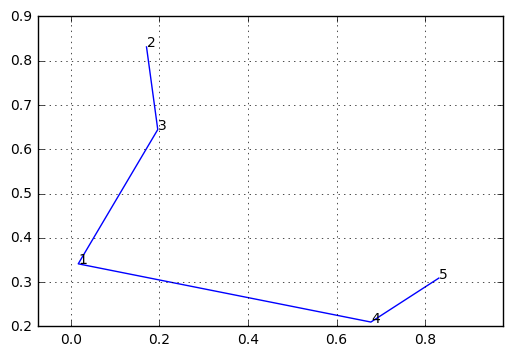

--- 0.0 seconds ---


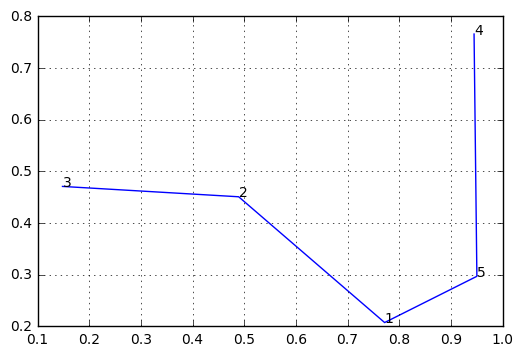

--- 0.0 seconds ---


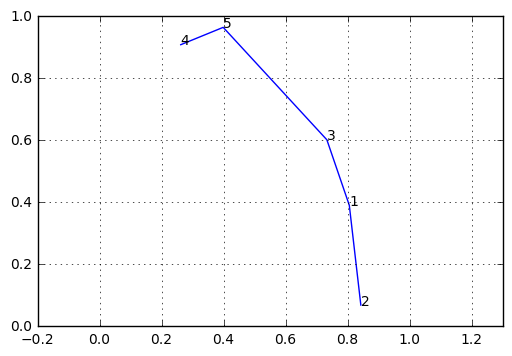

--- 0.0005009174346923828 seconds ---


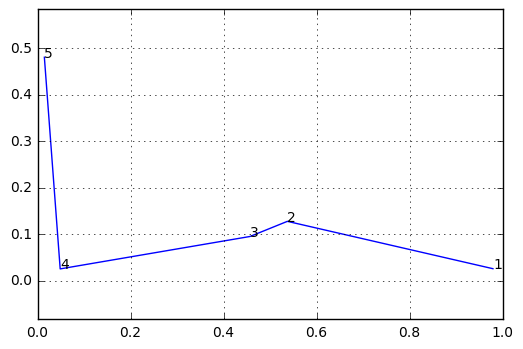

--- 0.0 seconds ---


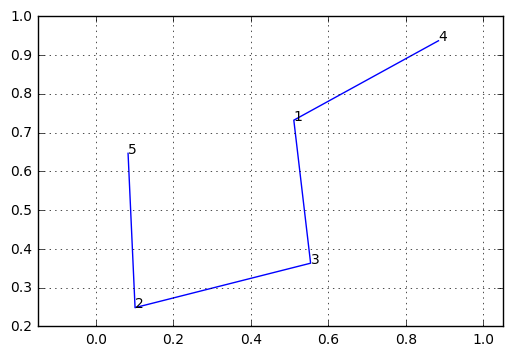

--- 0.0 seconds ---


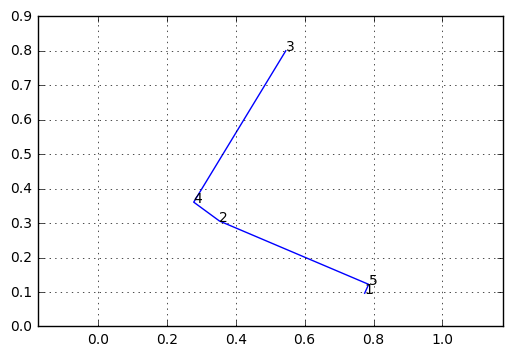

--- 0.0 seconds ---


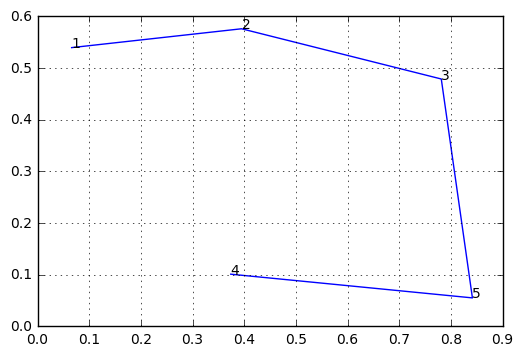

--- 0.0005009174346923828 seconds ---


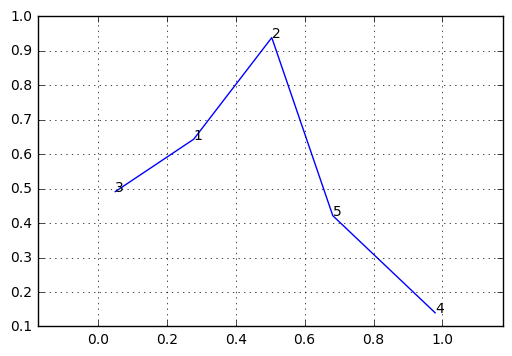

--- 0.0 seconds ---


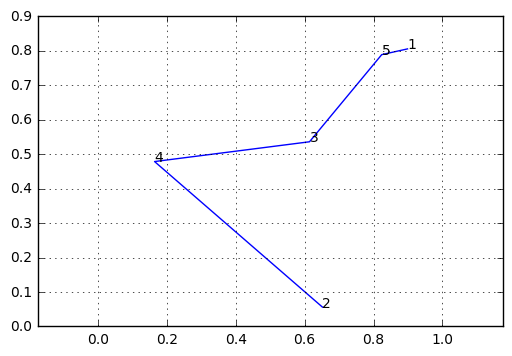

--- 0.0 seconds ---


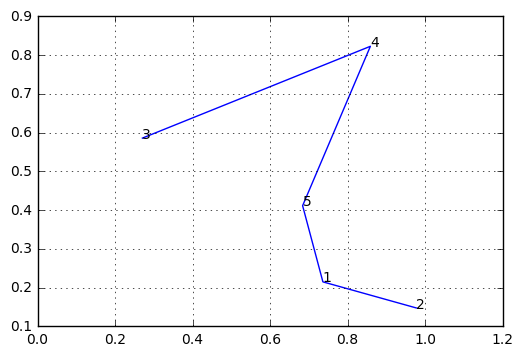

--- 0.0 seconds ---


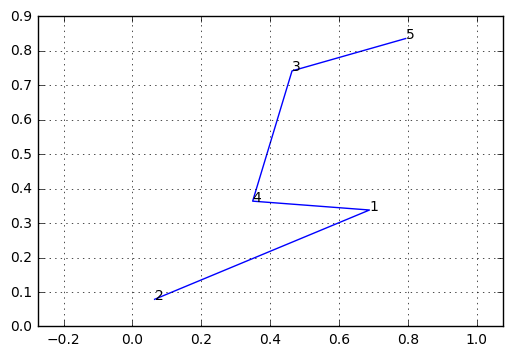

--- 0.0 seconds ---


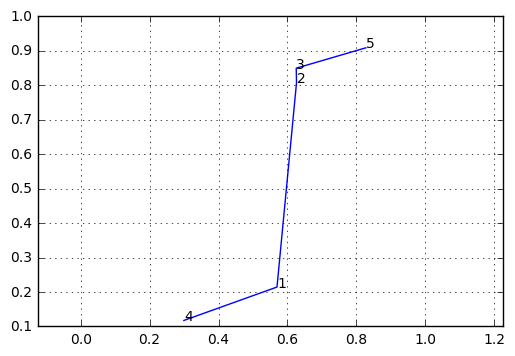

--- 0.0 seconds ---


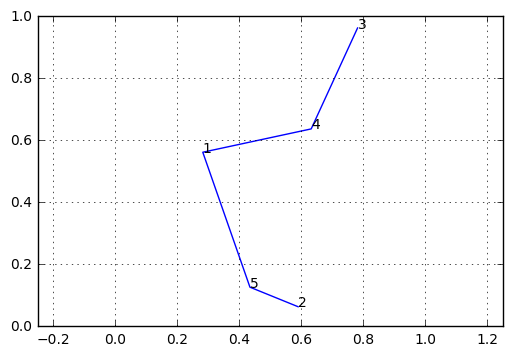

--- 0.0 seconds ---


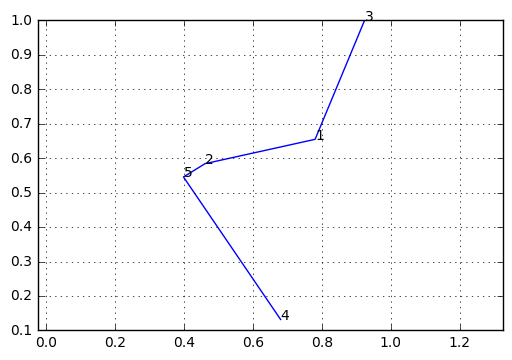

--- 0.0 seconds ---


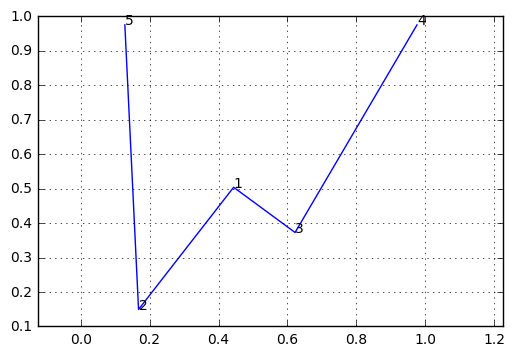

--- 0.0 seconds ---


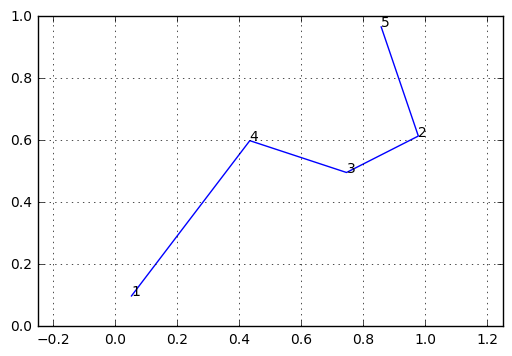

--- 0.0 seconds ---


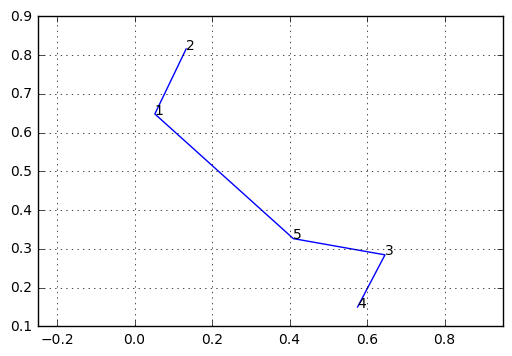

--- 0.0 seconds ---


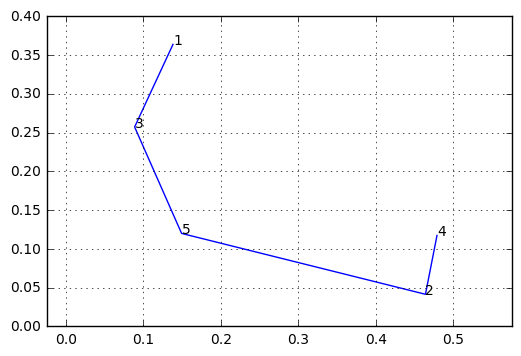

--- 0.0 seconds ---


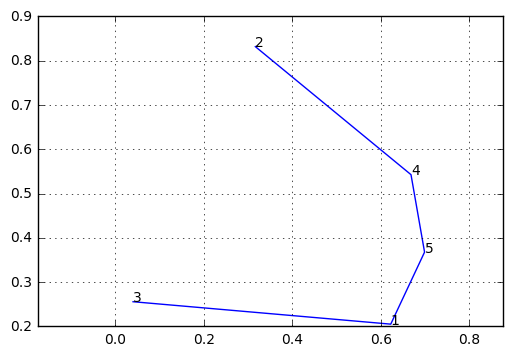

--- 0.0 seconds ---


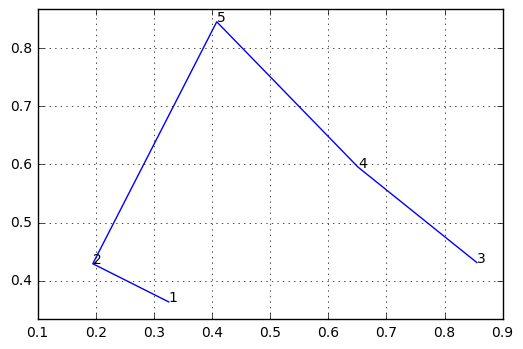

--- 0.0 seconds ---


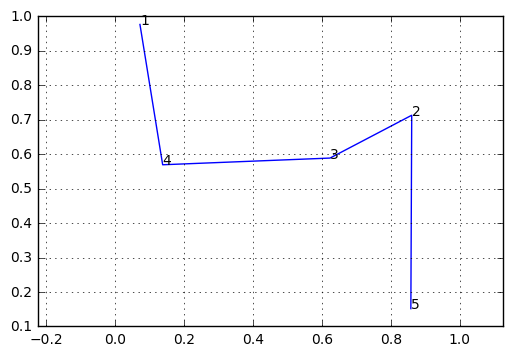

--- 0.0 seconds ---


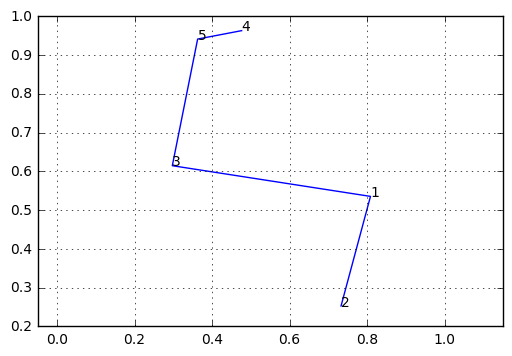

--- 0.0 seconds ---


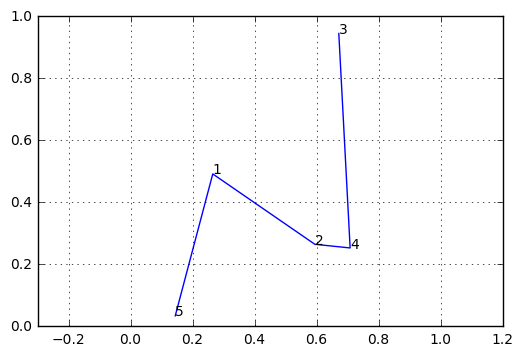

--- 0.0005004405975341797 seconds ---


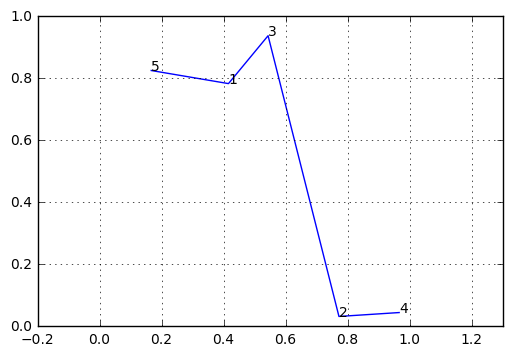

--- 0.0 seconds ---


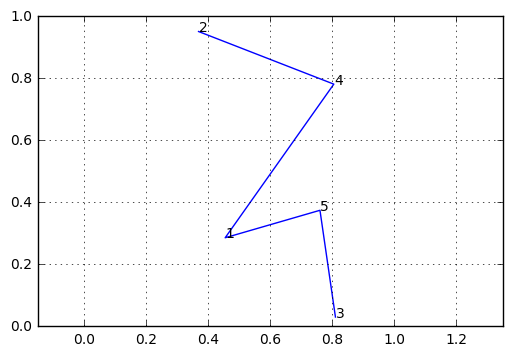

--- 0.000499725341796875 seconds ---


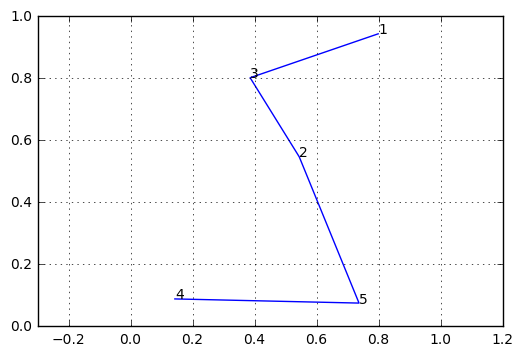

--- 0.0 seconds ---


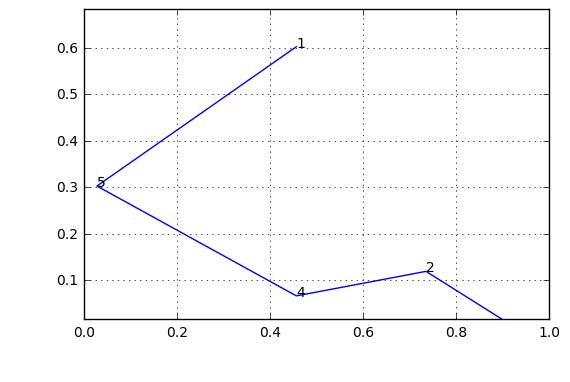

--- 0.0 seconds ---


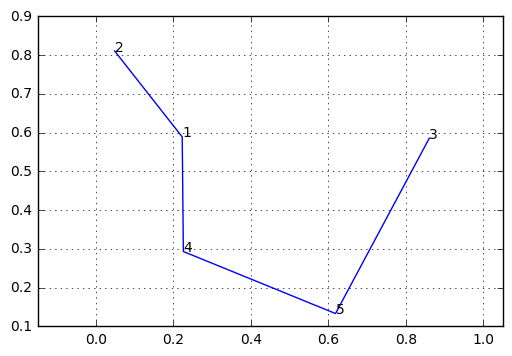

--- 0.0 seconds ---


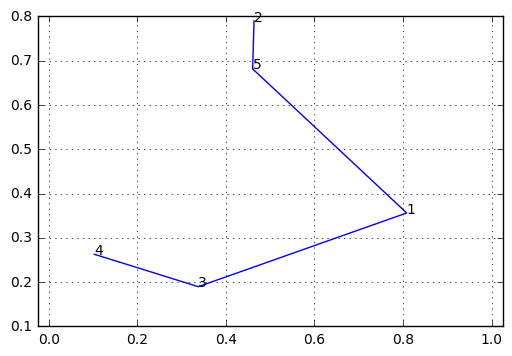

--- 0.0 seconds ---


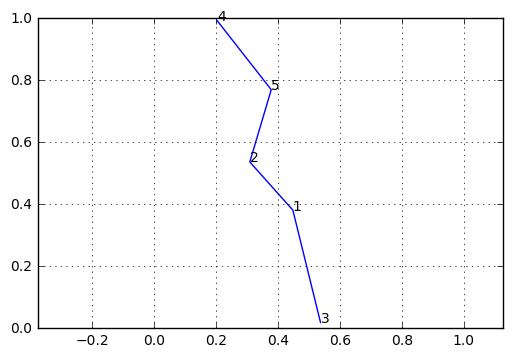

--- 0.0 seconds ---


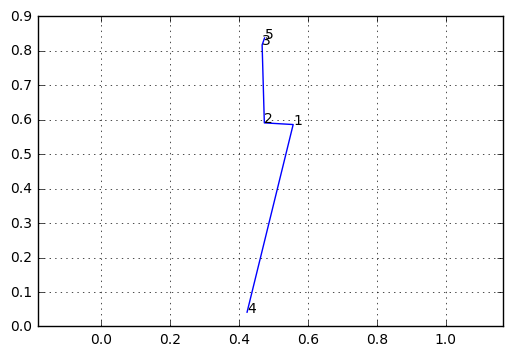

--- 0.0 seconds ---


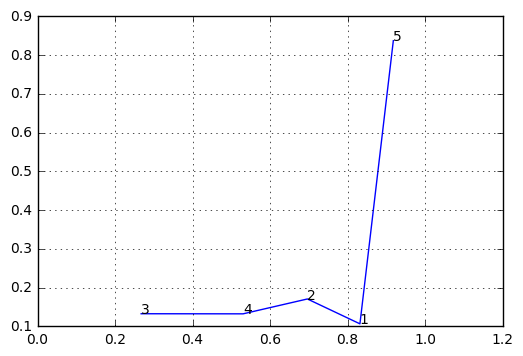

--- 0.0 seconds ---


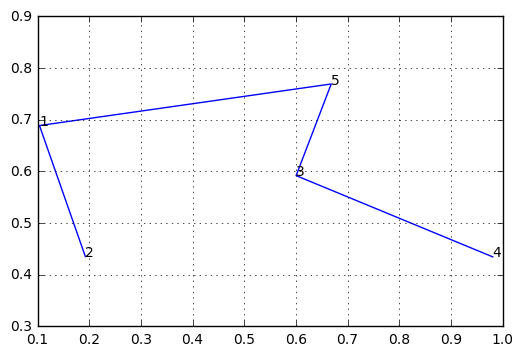

--- 0.0 seconds ---


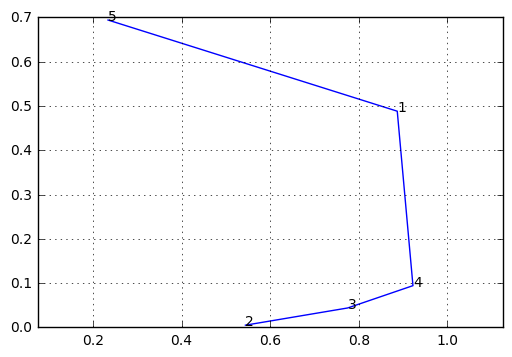

--- 0.0 seconds ---


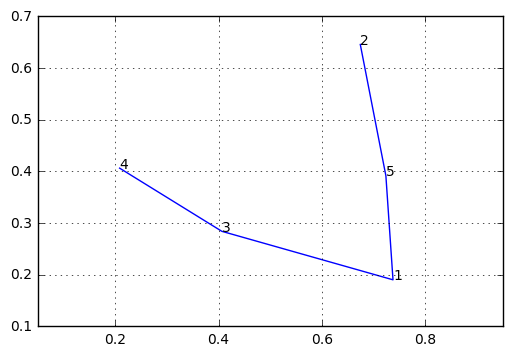

--- 0.0 seconds ---


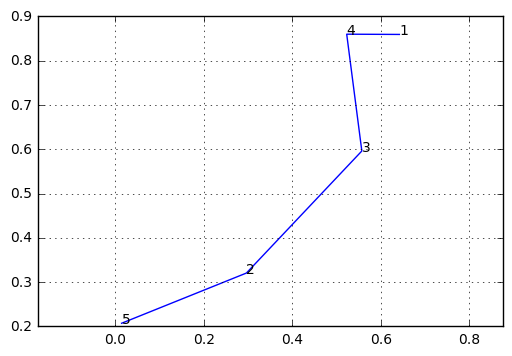

--- 0.0 seconds ---


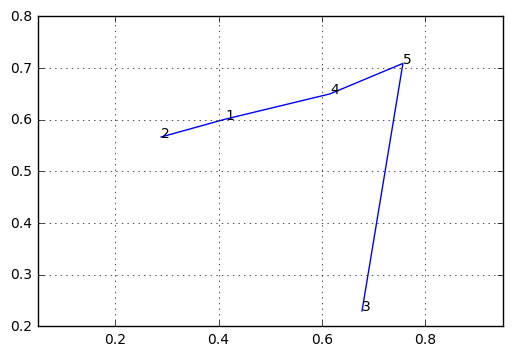

--- 0.0 seconds ---


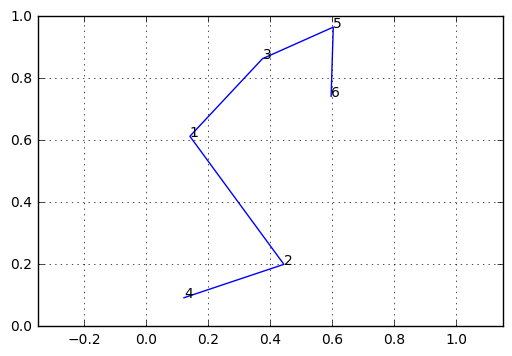

--- 0.0 seconds ---


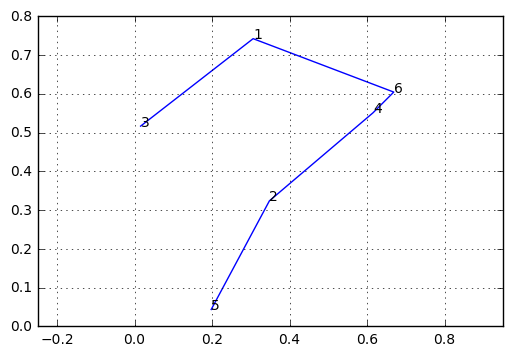

--- 0.0004999637603759766 seconds ---


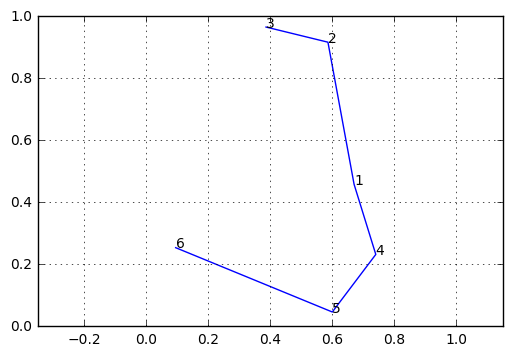

--- 0.0 seconds ---


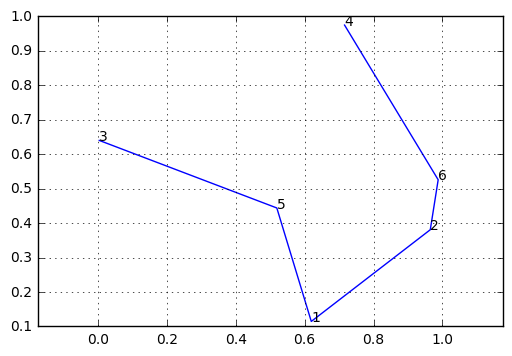

--- 0.0 seconds ---


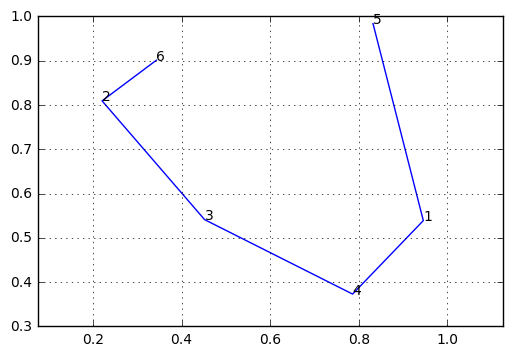

--- 0.0 seconds ---


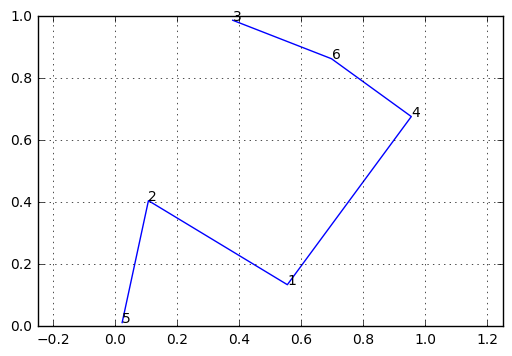

--- 0.0 seconds ---


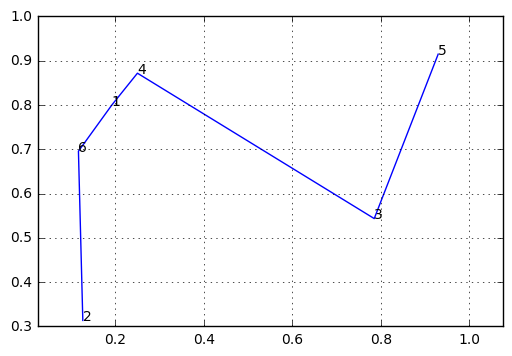

--- 0.0 seconds ---


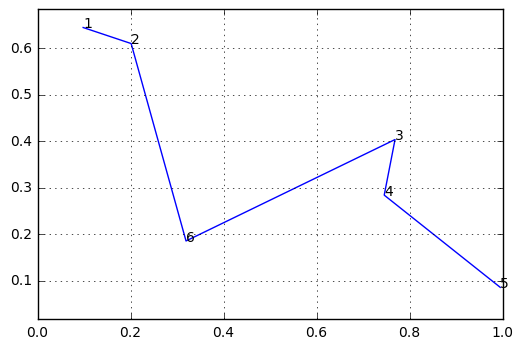

--- 0.0005002021789550781 seconds ---


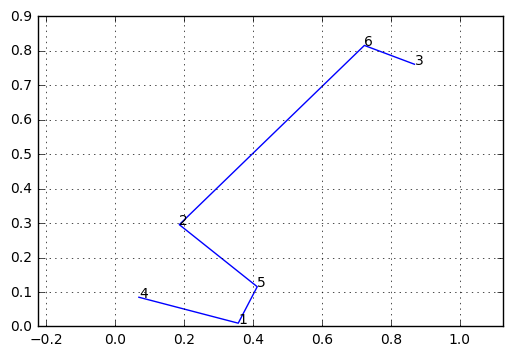

--- 0.0 seconds ---


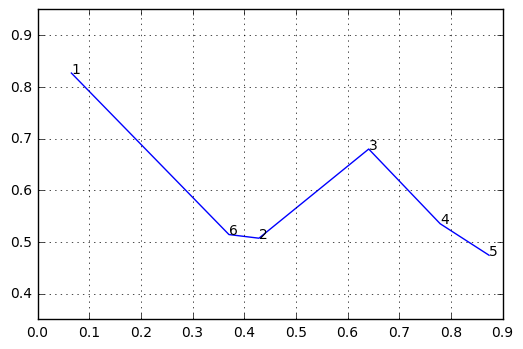

--- 0.0 seconds ---


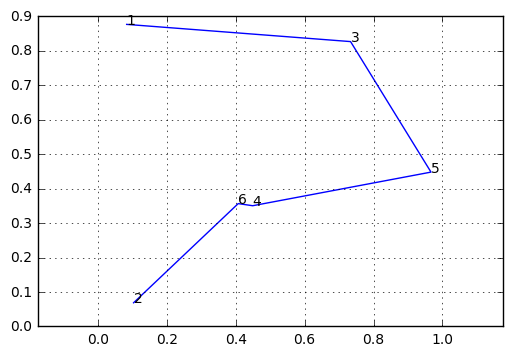

--- 0.0 seconds ---


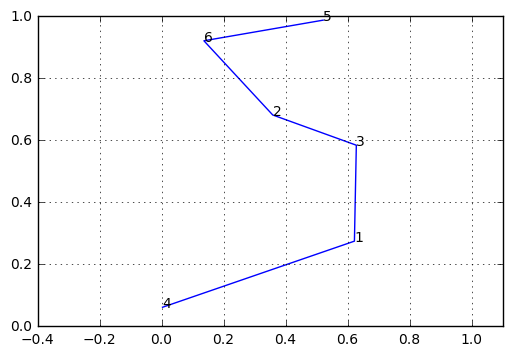

--- 0.000499725341796875 seconds ---


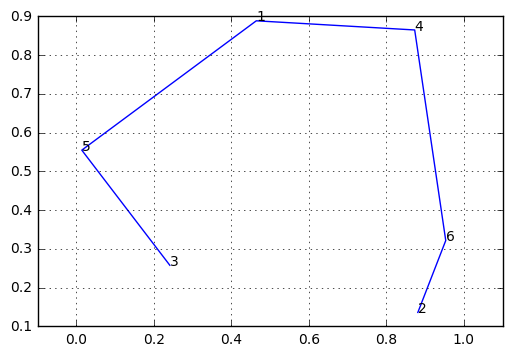

--- 0.0 seconds ---


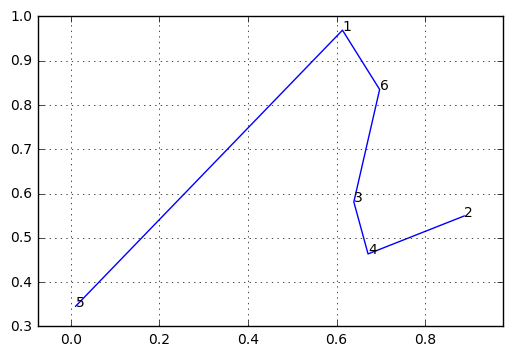

--- 0.0 seconds ---


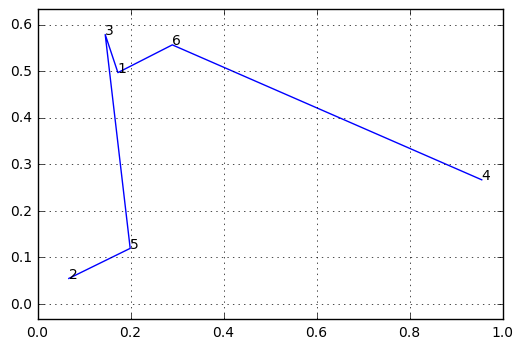

--- 0.0 seconds ---


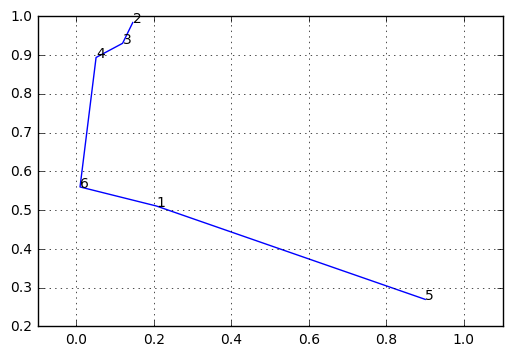

--- 0.0 seconds ---


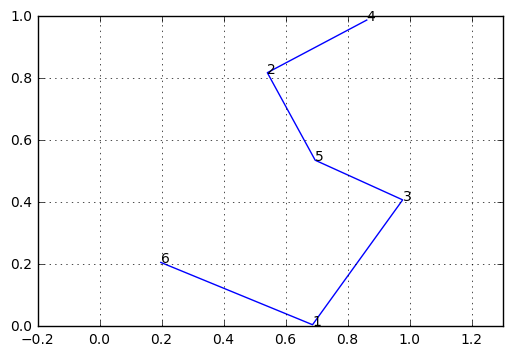

--- 0.0 seconds ---


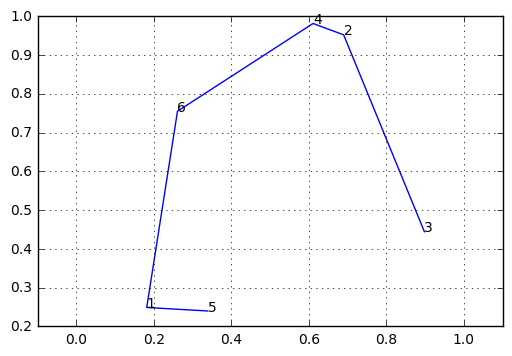

--- 0.0 seconds ---


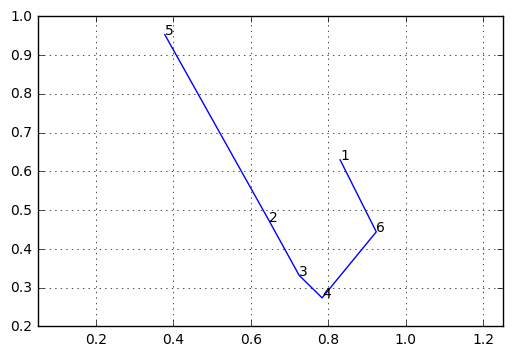

--- 0.0 seconds ---


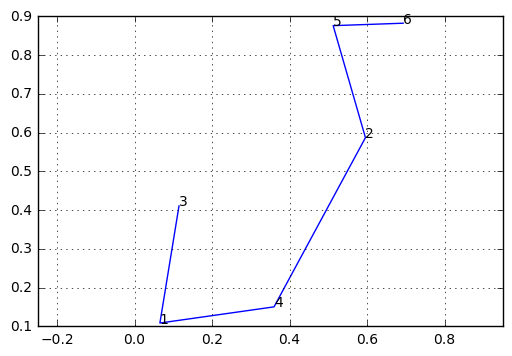

--- 0.0 seconds ---


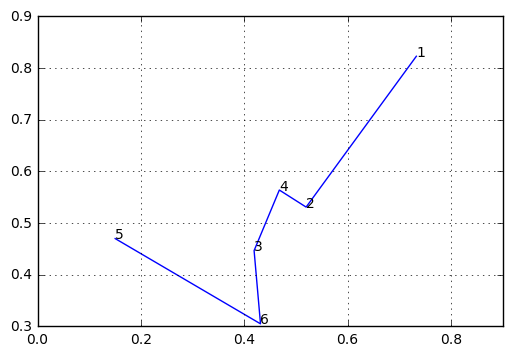

--- 0.0 seconds ---


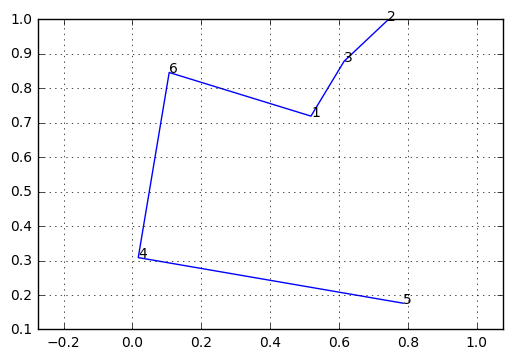

--- 0.0 seconds ---


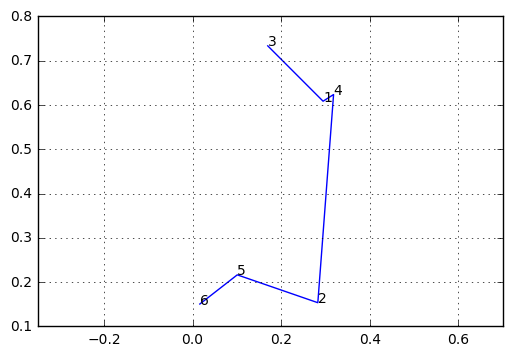

--- 0.0005173683166503906 seconds ---


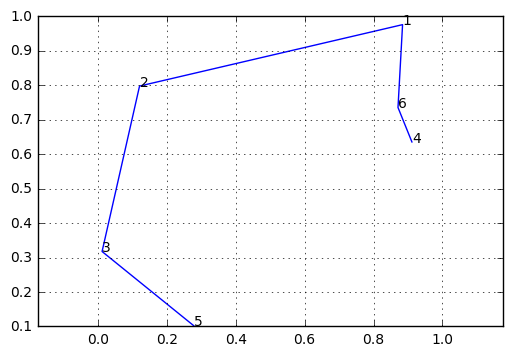

--- 0.0 seconds ---


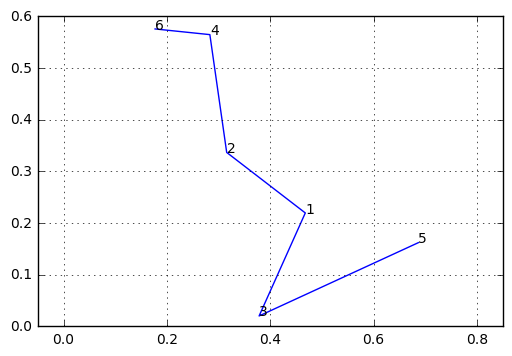

--- 0.0 seconds ---


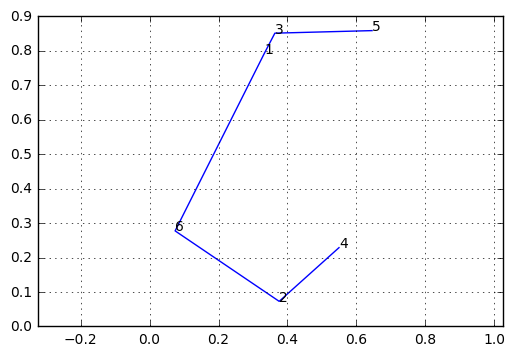

--- 0.0 seconds ---


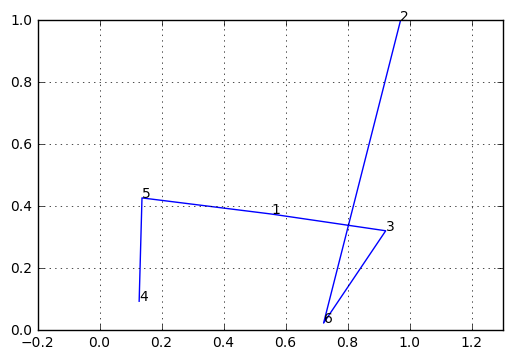

--- 0.0 seconds ---


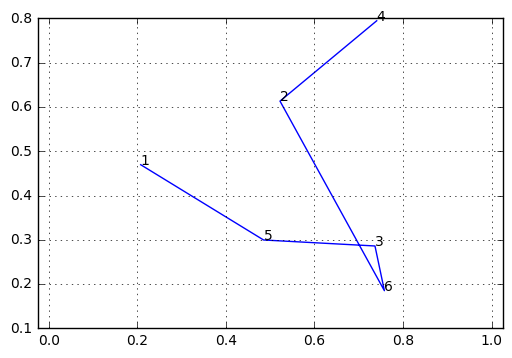

--- 0.0 seconds ---


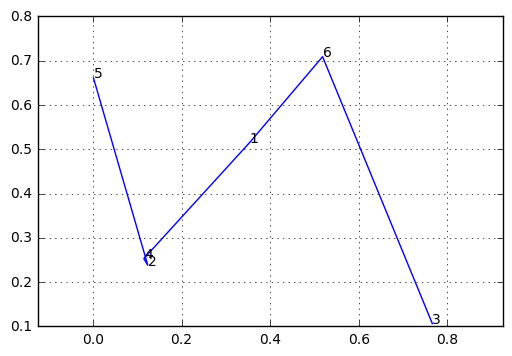

--- 0.0 seconds ---


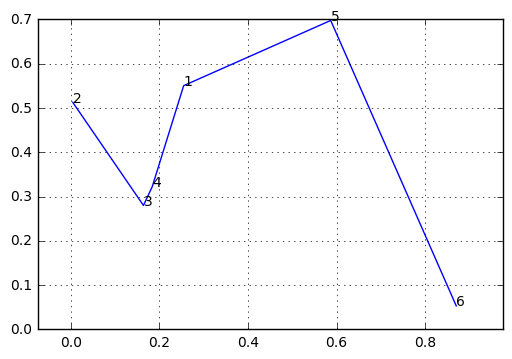

--- 0.0 seconds ---


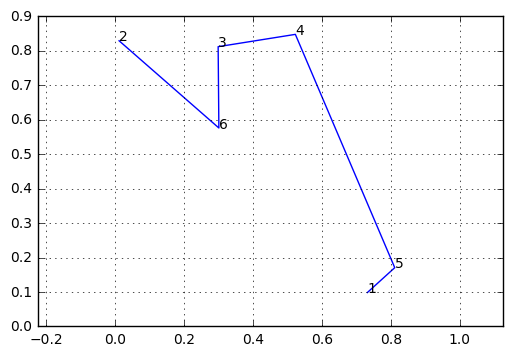

--- 0.0 seconds ---


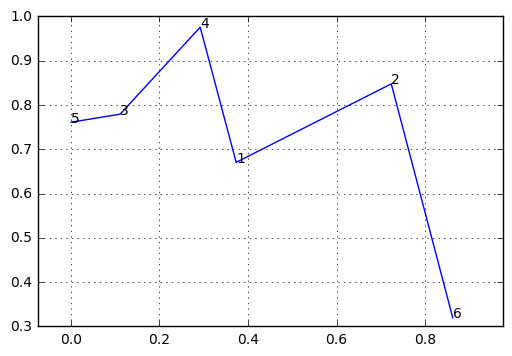

--- 0.0 seconds ---


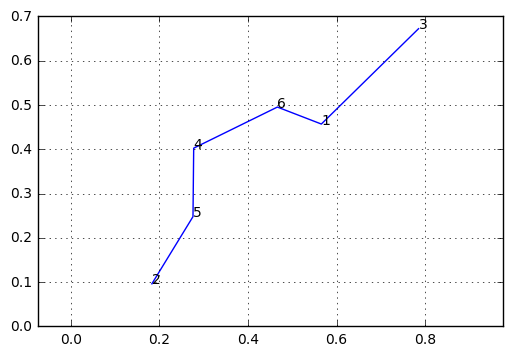

--- 0.0005004405975341797 seconds ---


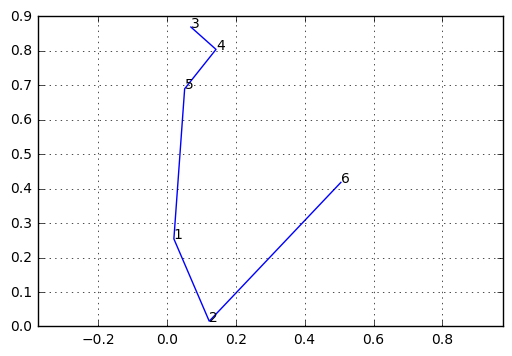

--- 0.0 seconds ---


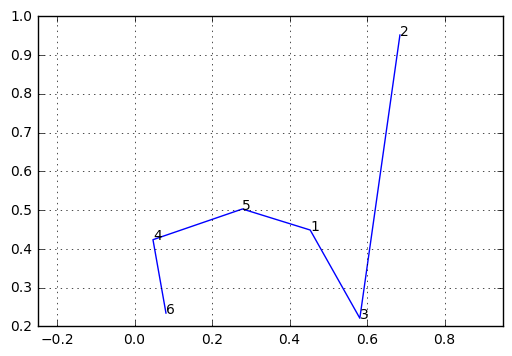

--- 0.0 seconds ---


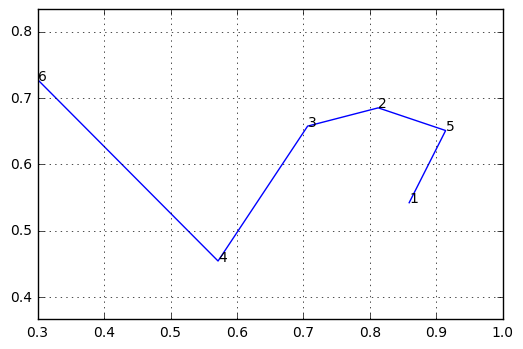

--- 0.0 seconds ---


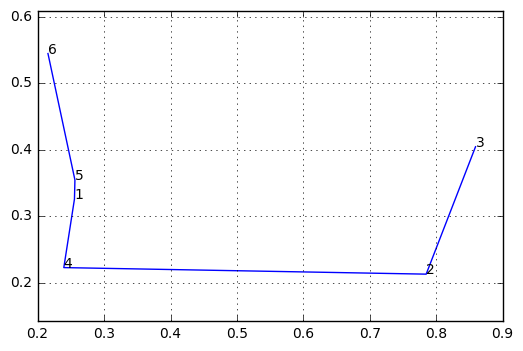

--- 0.0 seconds ---


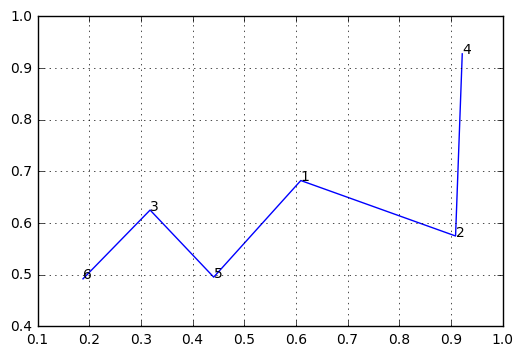

--- 0.0 seconds ---


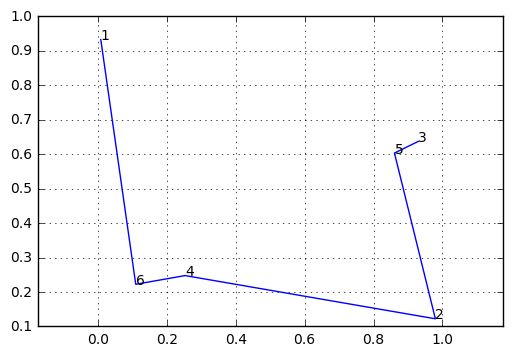

--- 0.0 seconds ---


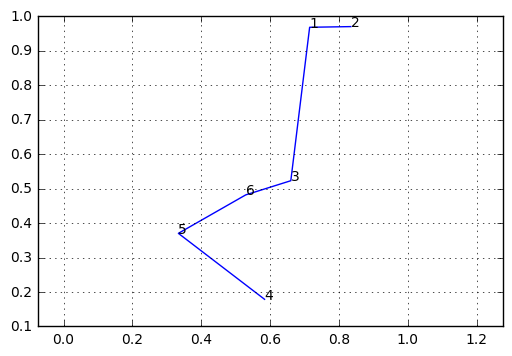

--- 0.0005006790161132812 seconds ---


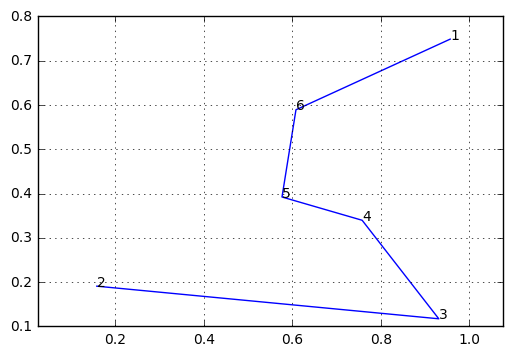

--- 0.0 seconds ---


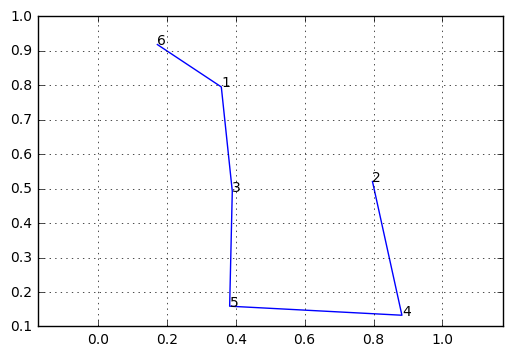

--- 0.0 seconds ---


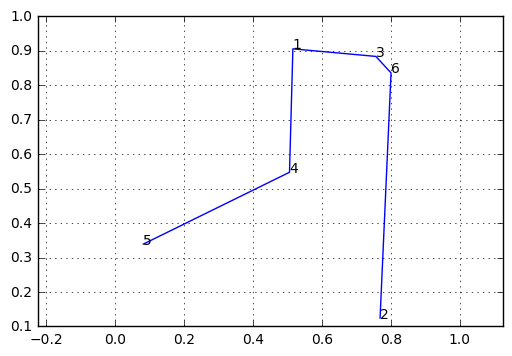

--- 0.0005004405975341797 seconds ---


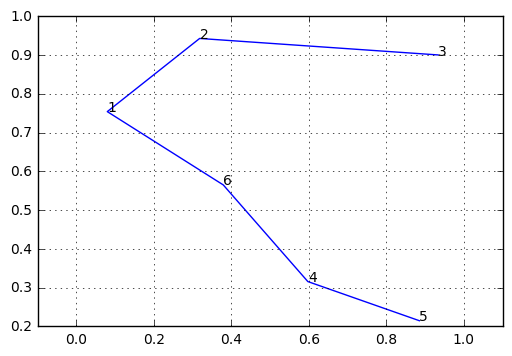

--- 0.0005006790161132812 seconds ---


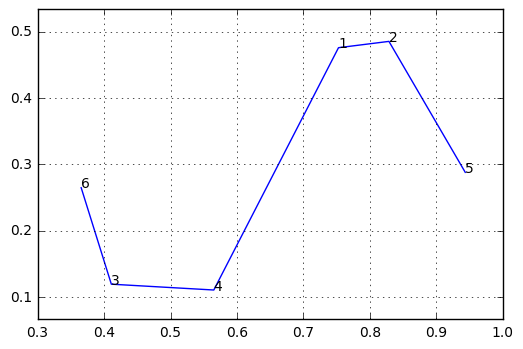

--- 0.0 seconds ---


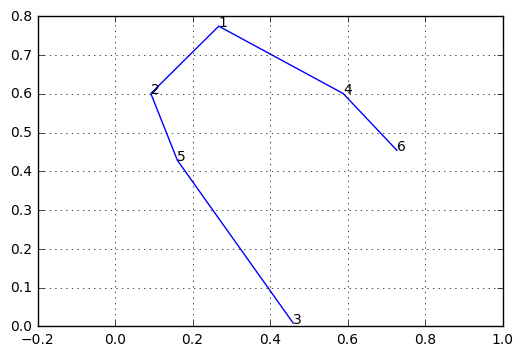

--- 0.0 seconds ---


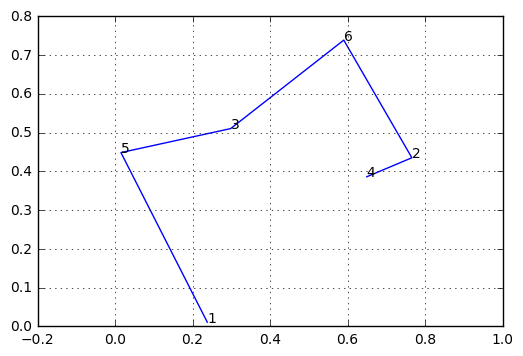

--- 0.0 seconds ---


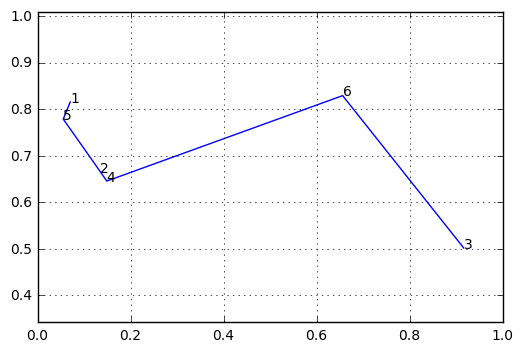

--- 0.0 seconds ---


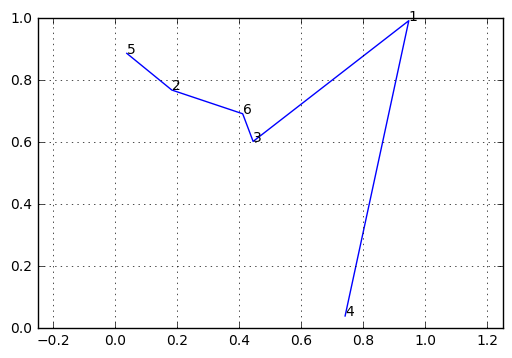

--- 0.0 seconds ---


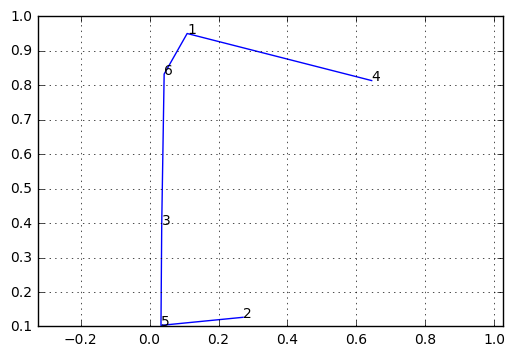

--- 0.0005009174346923828 seconds ---


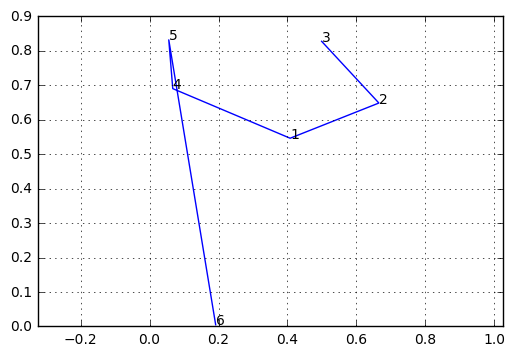

--- 0.0 seconds ---


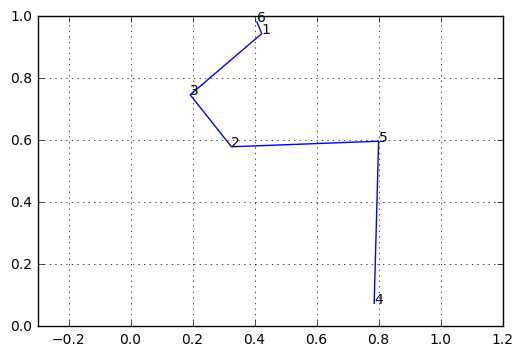

--- 0.0 seconds ---


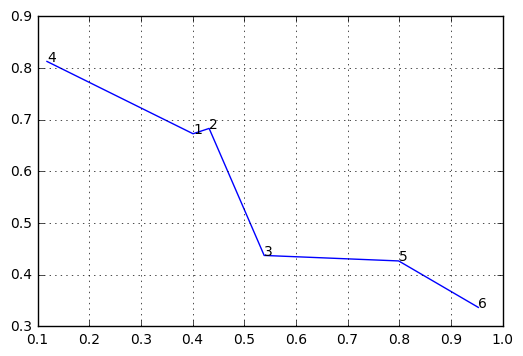

--- 0.0 seconds ---


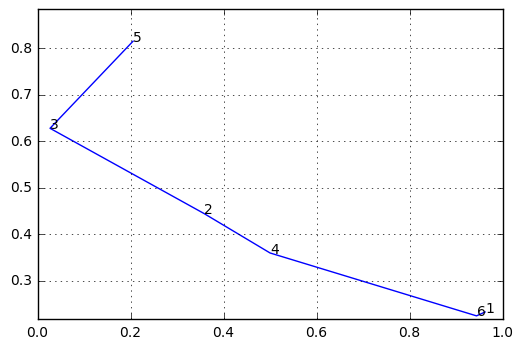

--- 0.0 seconds ---


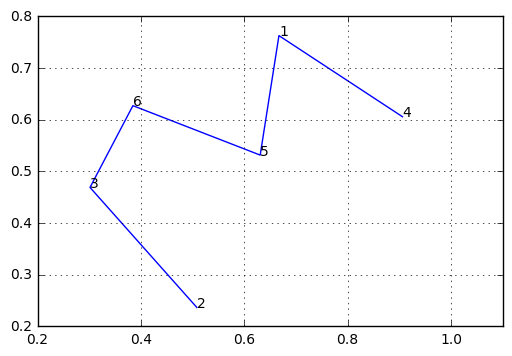

--- 0.0 seconds ---


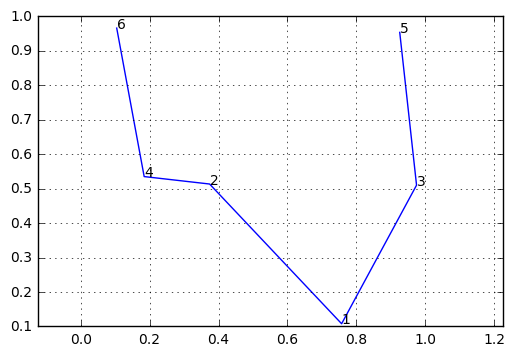

--- 0.0 seconds ---


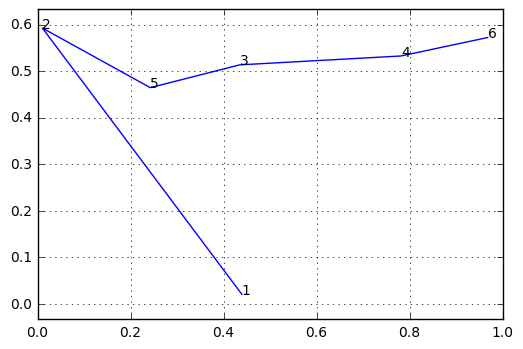

--- 0.0 seconds ---


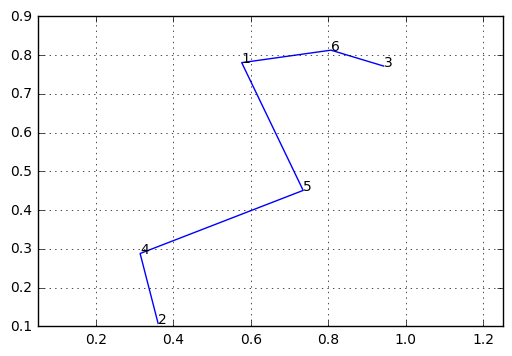

--- 0.0 seconds ---


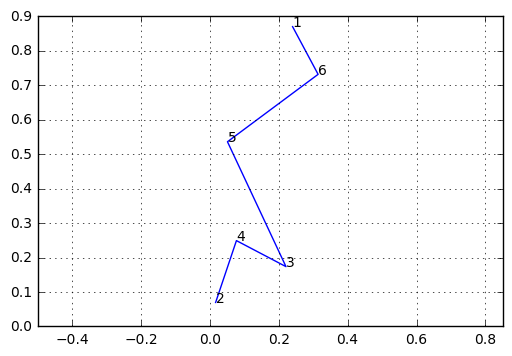

--- 0.0 seconds ---


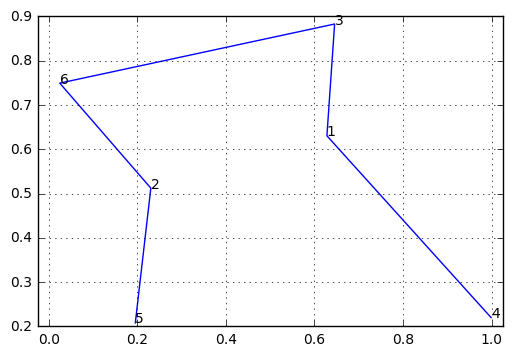

--- 0.0 seconds ---


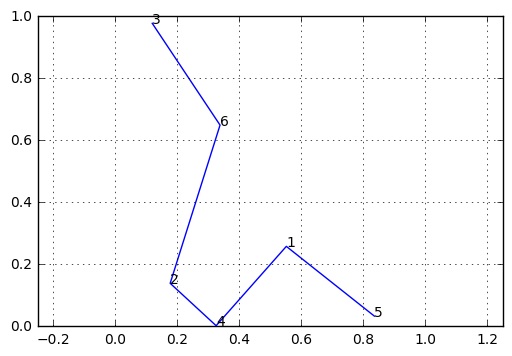

--- 0.0005006790161132812 seconds ---


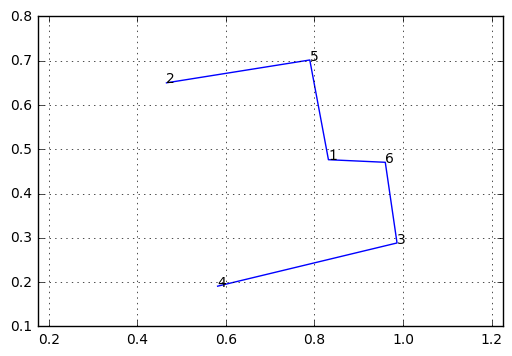

--- 0.0 seconds ---


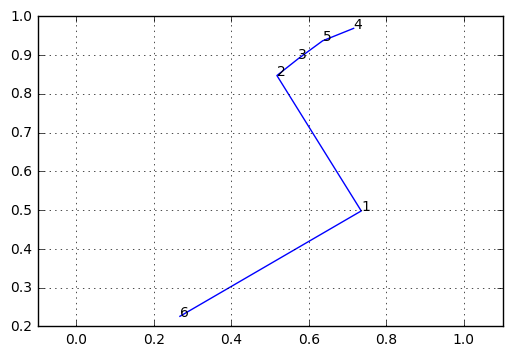

--- 0.0 seconds ---


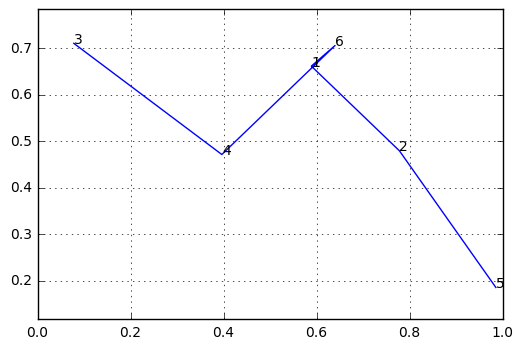

--- 0.0 seconds ---


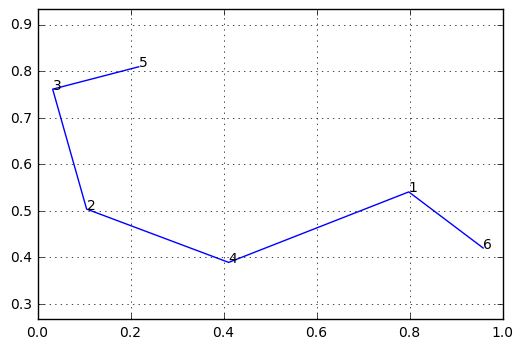

--- 0.0 seconds ---


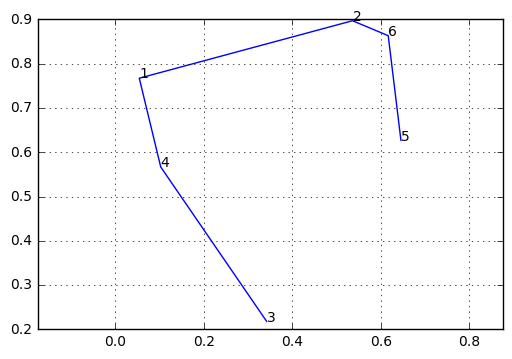

--- 0.0 seconds ---


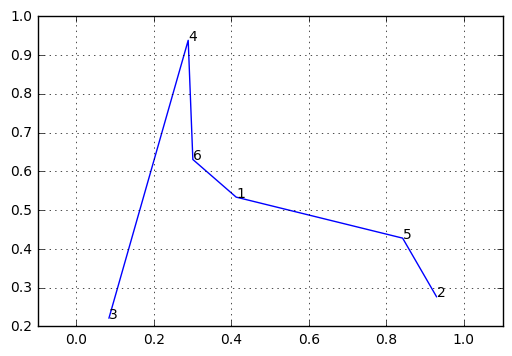

--- 0.0 seconds ---


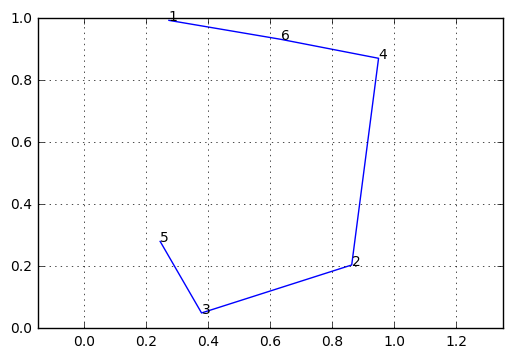

--- 0.0005002021789550781 seconds ---


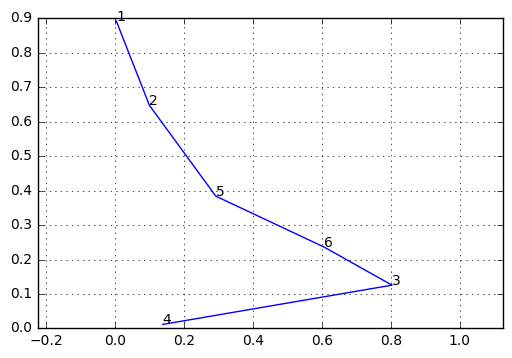

--- 0.0 seconds ---


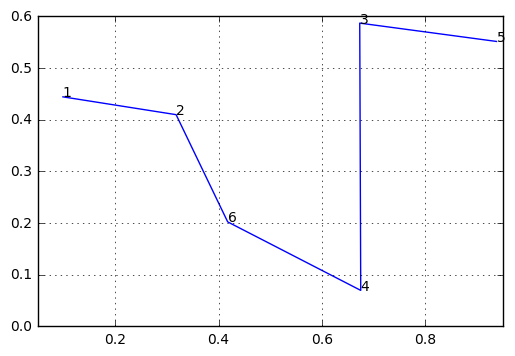

--- 0.0 seconds ---


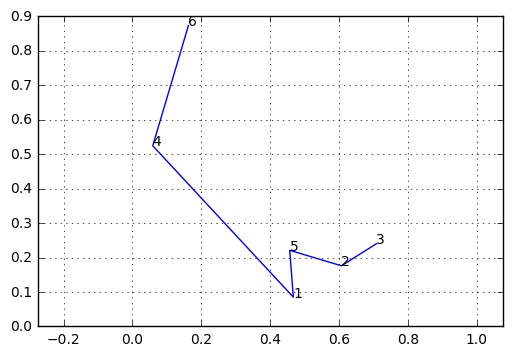

--- 0.0 seconds ---


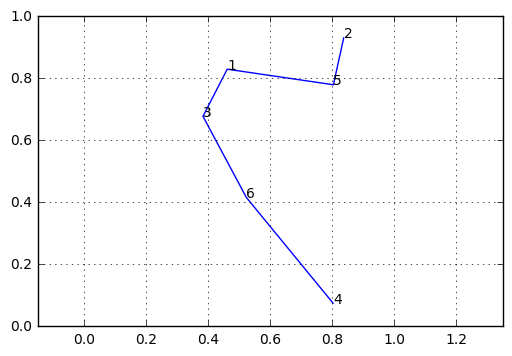

--- 0.0 seconds ---


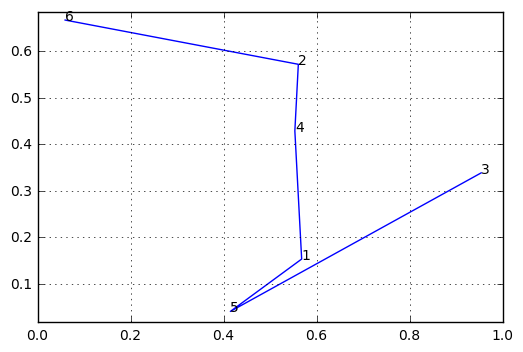

--- 0.0 seconds ---


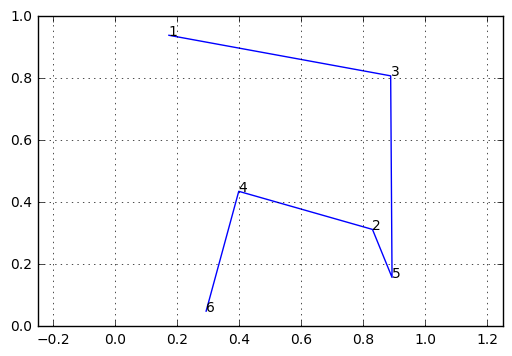

--- 0.0 seconds ---


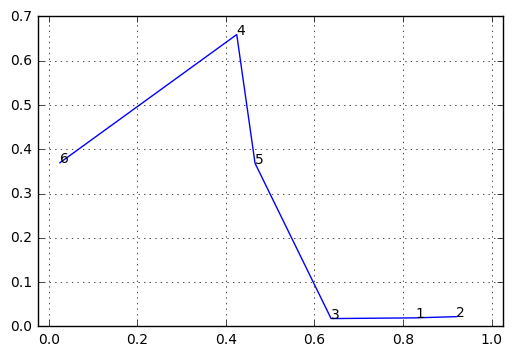

--- 0.0 seconds ---


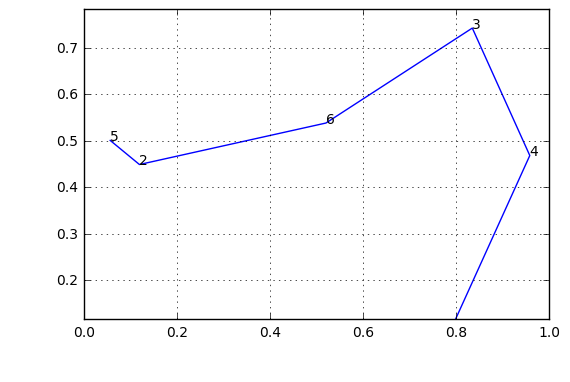

--- 0.0 seconds ---


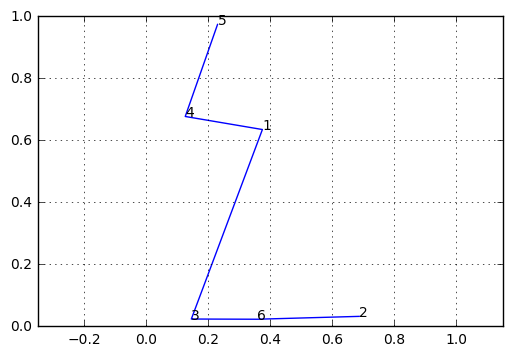

--- 0.0 seconds ---


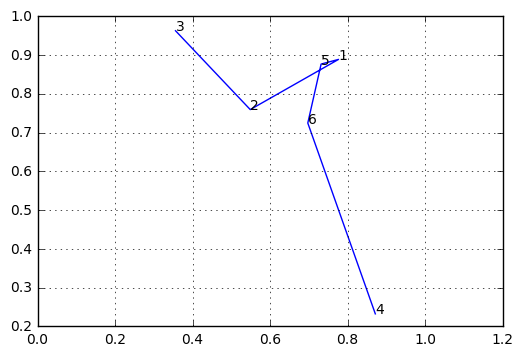

--- 0.0 seconds ---


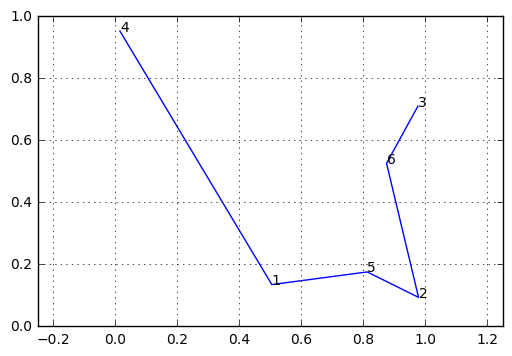

--- 0.0 seconds ---


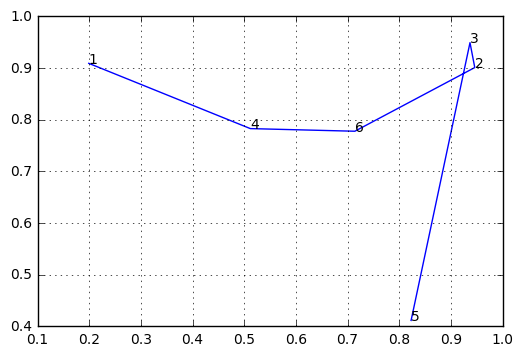

--- 0.0 seconds ---


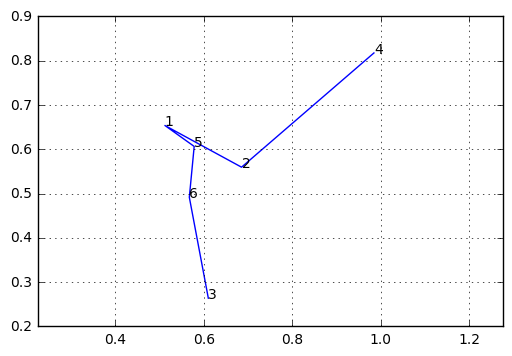

--- 0.0005004405975341797 seconds ---


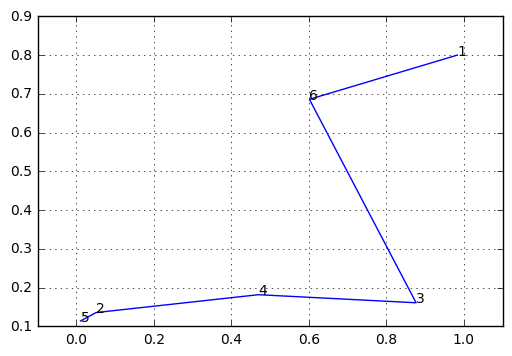

--- 0.0 seconds ---


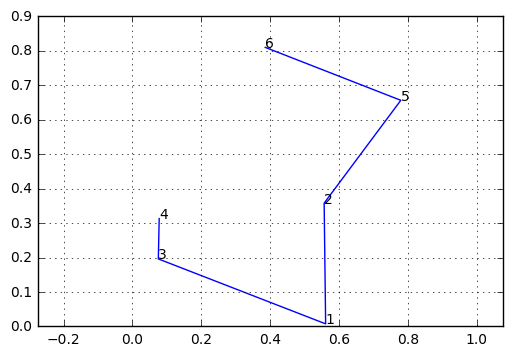

--- 0.0 seconds ---


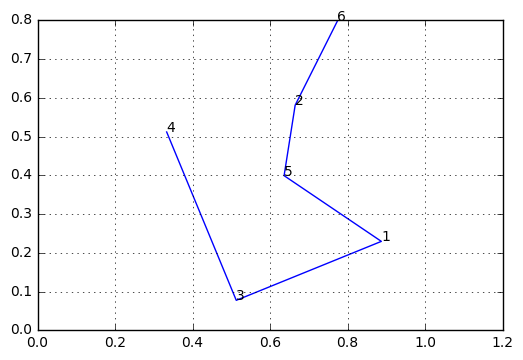

--- 0.0 seconds ---


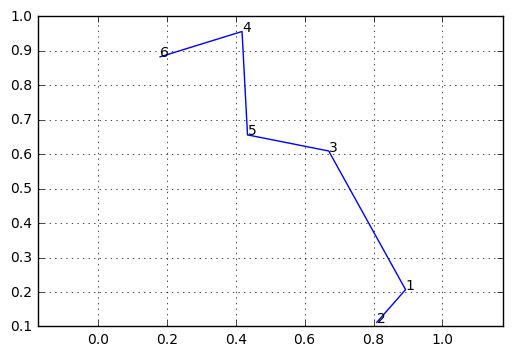

--- 0.0005090236663818359 seconds ---


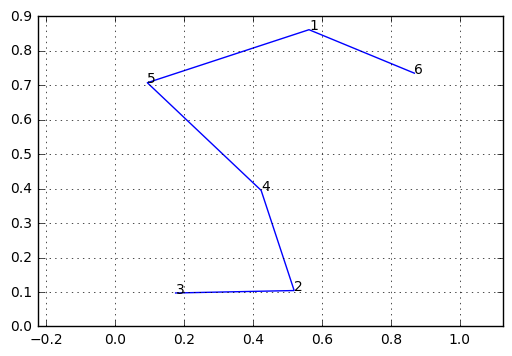

--- 0.0 seconds ---


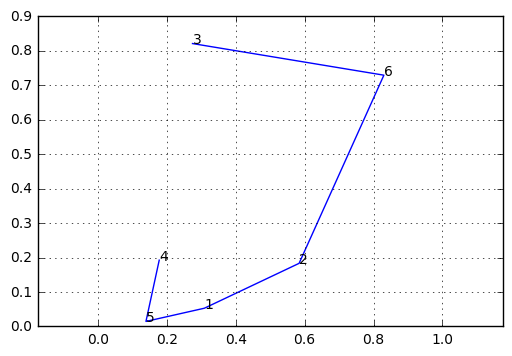

--- 0.0 seconds ---


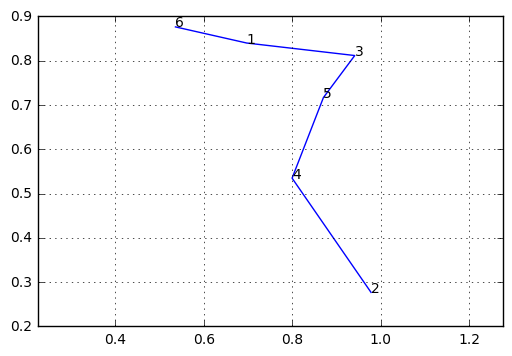

--- 0.0 seconds ---


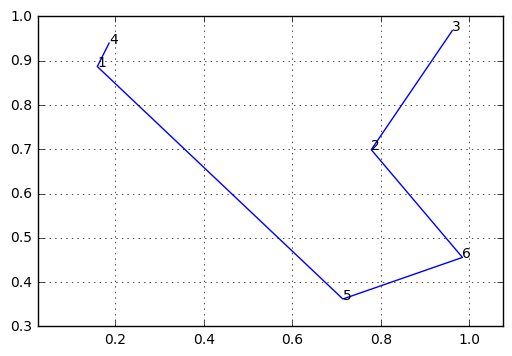

--- 0.0005013942718505859 seconds ---


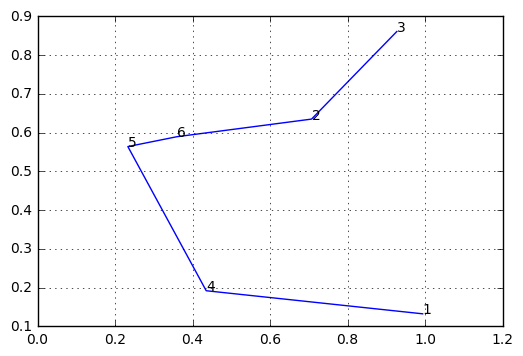

--- 0.0 seconds ---


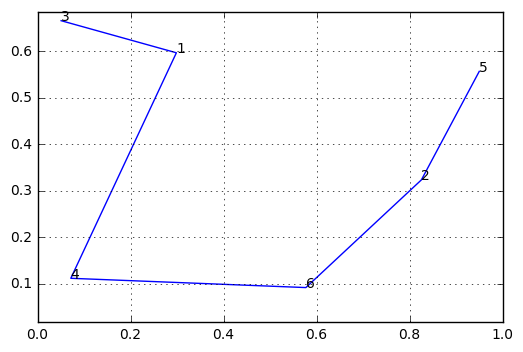

--- 0.0 seconds ---


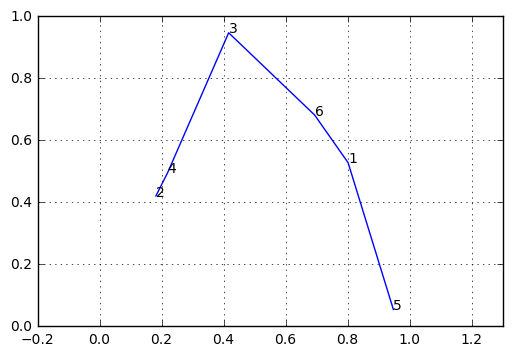

--- 0.0005004405975341797 seconds ---


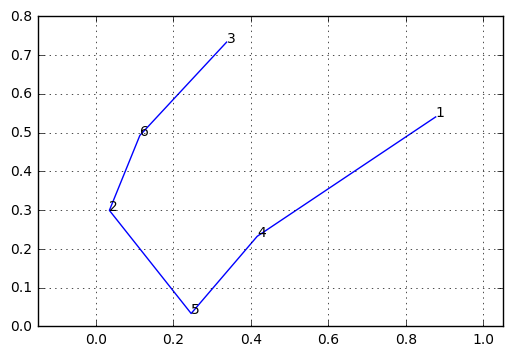

--- 0.0 seconds ---


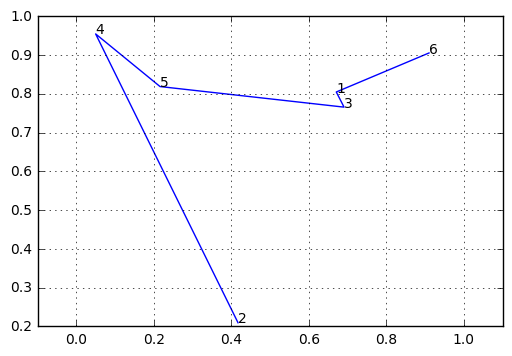

--- 0.0005011558532714844 seconds ---


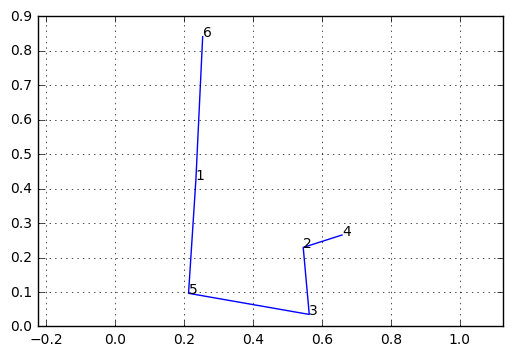

--- 0.0005009174346923828 seconds ---


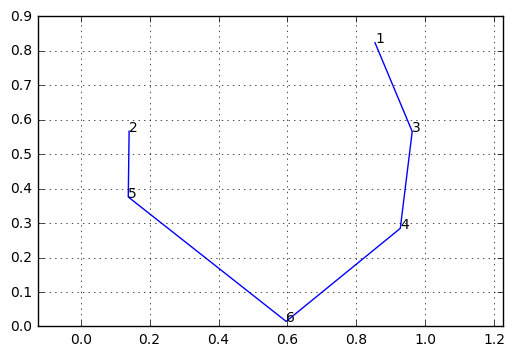

--- 0.0 seconds ---


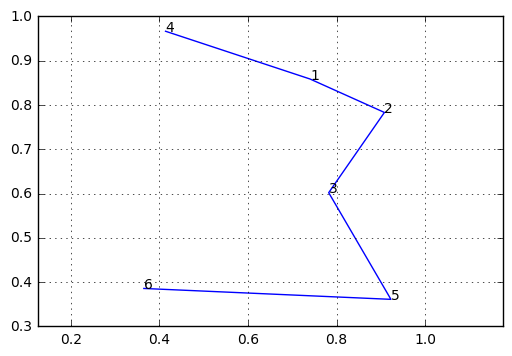

--- 0.0 seconds ---


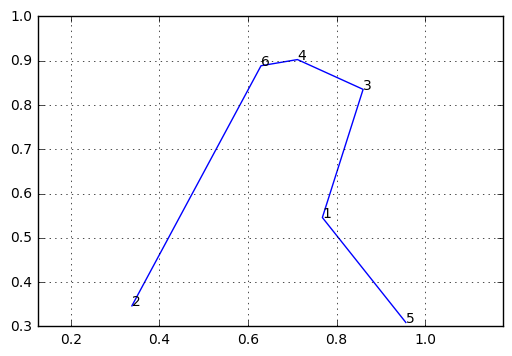

--- 0.0 seconds ---


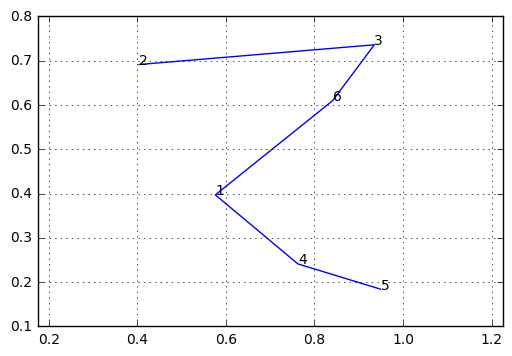

--- 0.0 seconds ---


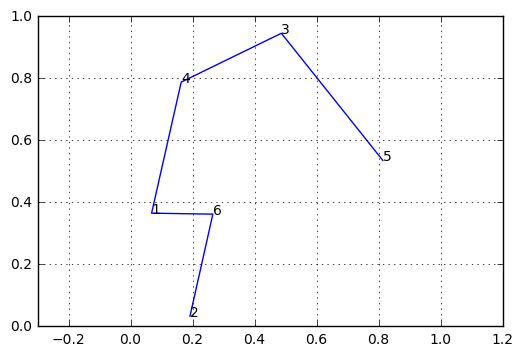

--- 0.0004999637603759766 seconds ---


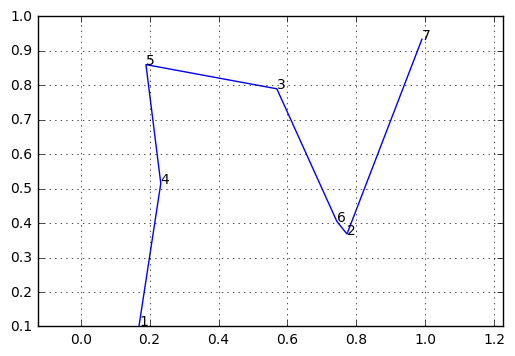

--- 0.0 seconds ---


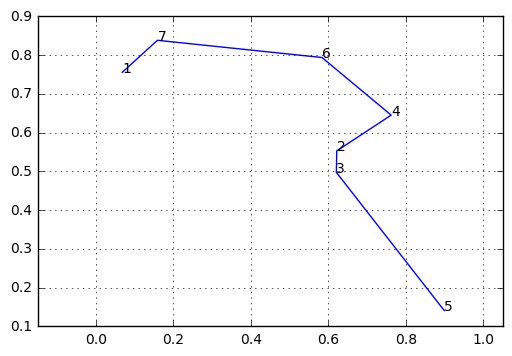

--- 0.0 seconds ---


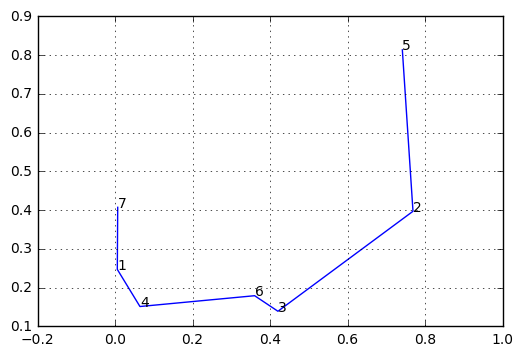

--- 0.0 seconds ---


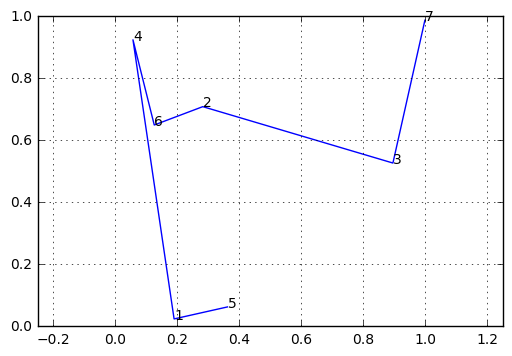

--- 0.0005009174346923828 seconds ---


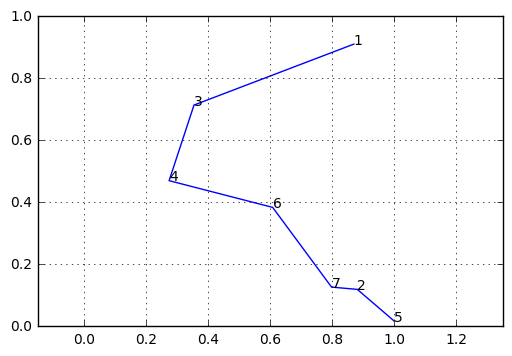

--- 0.0005004405975341797 seconds ---


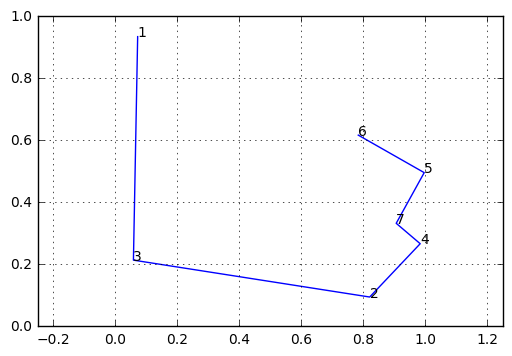

--- 0.0005033016204833984 seconds ---


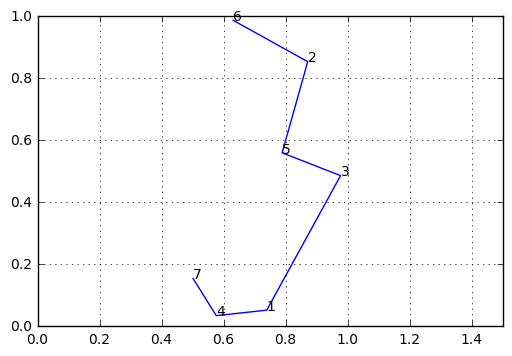

--- 0.0 seconds ---


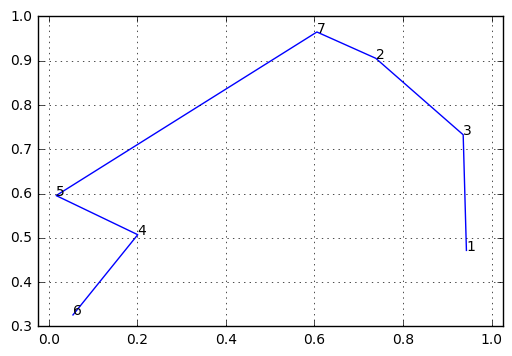

--- 0.0 seconds ---


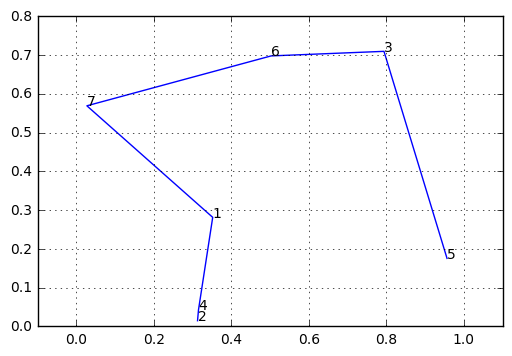

--- 0.0 seconds ---


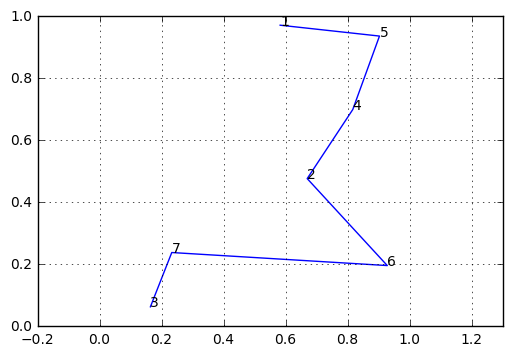

--- 0.0 seconds ---


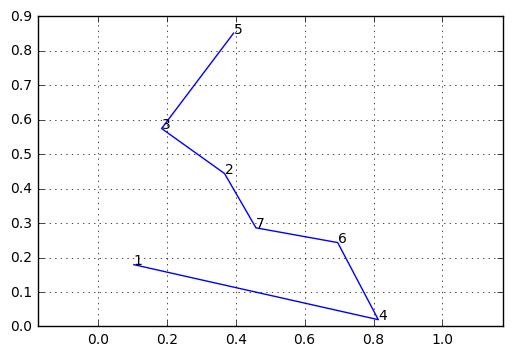

--- 0.0 seconds ---


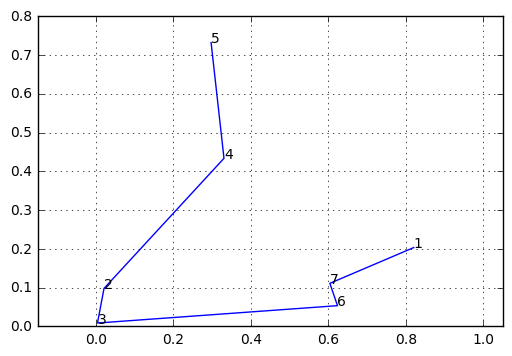

--- 0.0 seconds ---


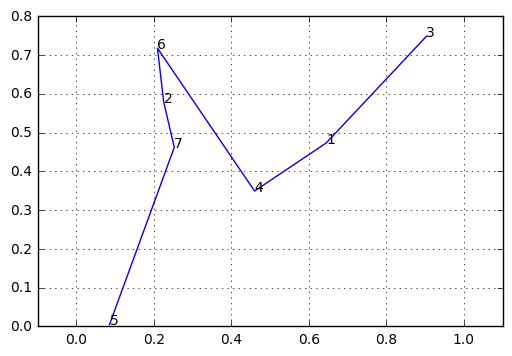

--- 0.0 seconds ---


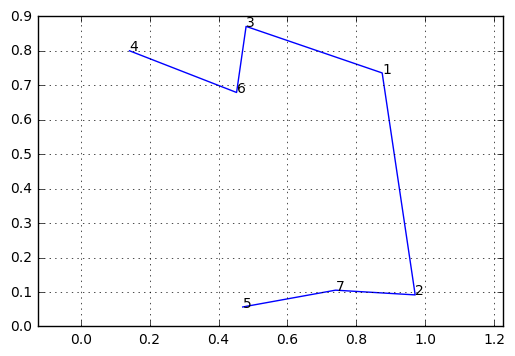

--- 0.0 seconds ---


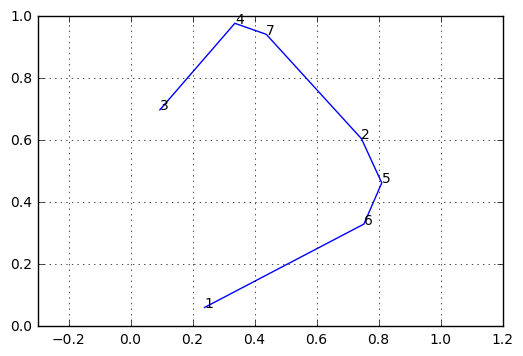

--- 0.0 seconds ---


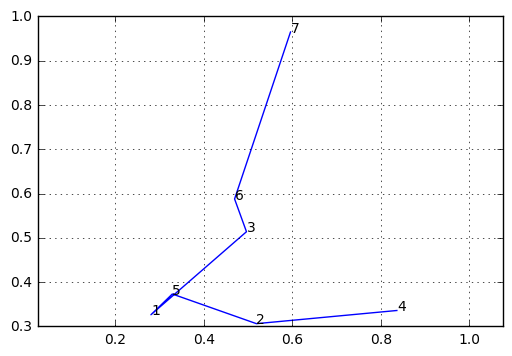

--- 0.0 seconds ---


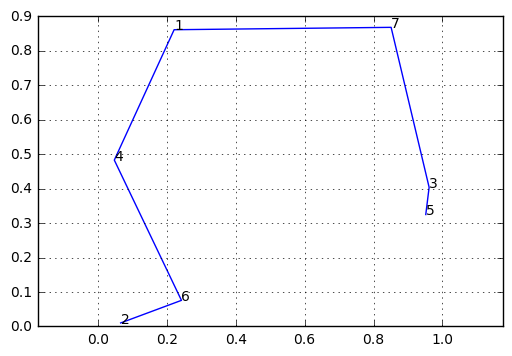

--- 0.0 seconds ---


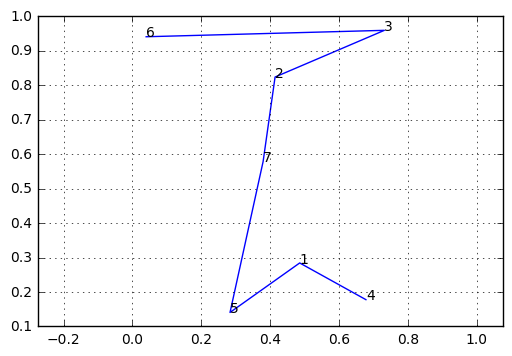

--- 0.0 seconds ---


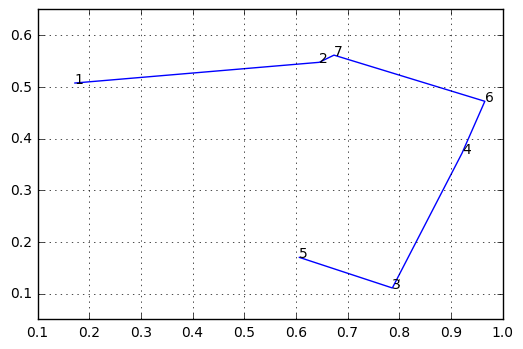

--- 0.0005004405975341797 seconds ---


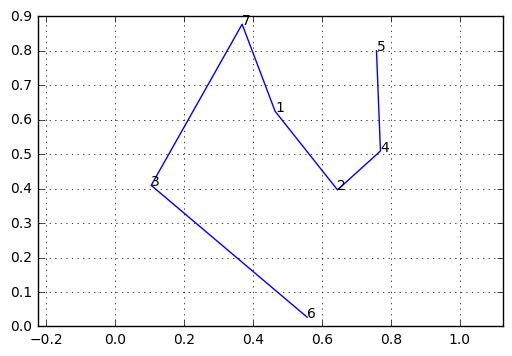

--- 0.0005002021789550781 seconds ---


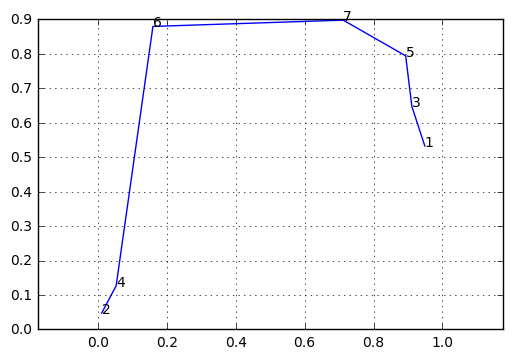

--- 0.0 seconds ---


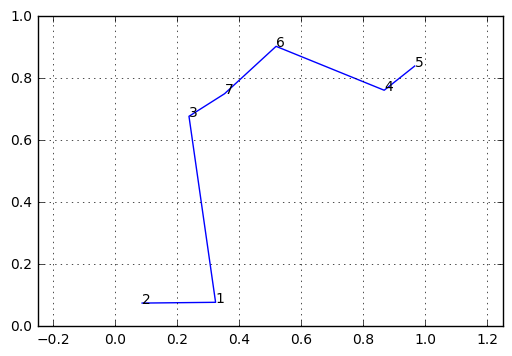

--- 0.0 seconds ---


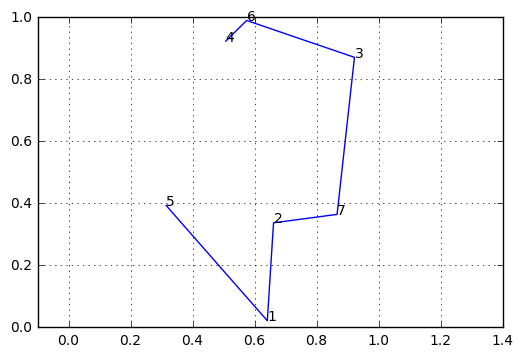

--- 0.0004999637603759766 seconds ---


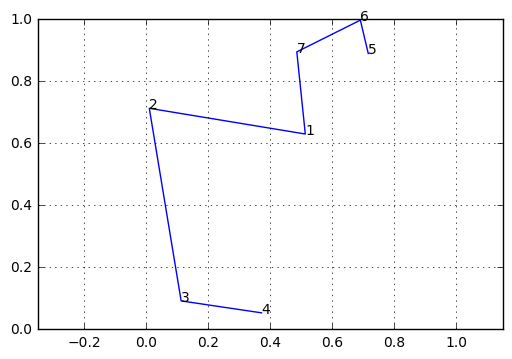

--- 0.0005006790161132812 seconds ---


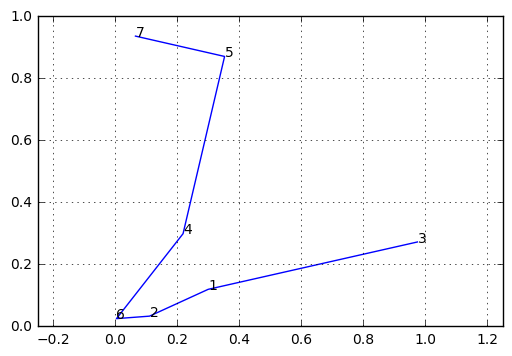

--- 0.0 seconds ---


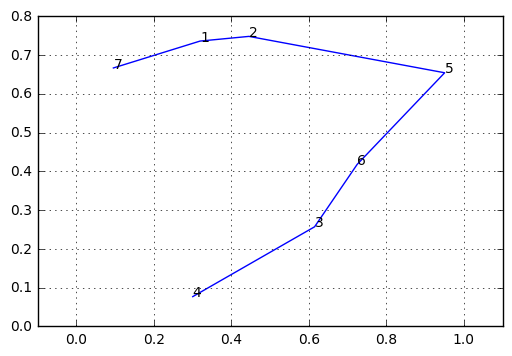

--- 0.0004992485046386719 seconds ---


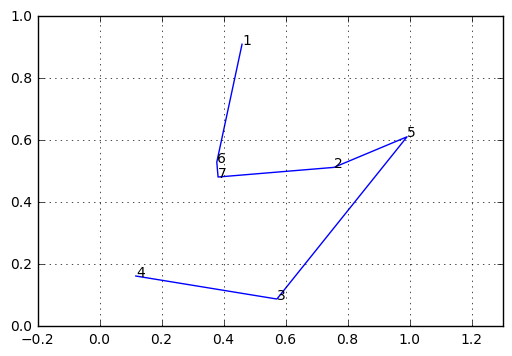

--- 0.0 seconds ---


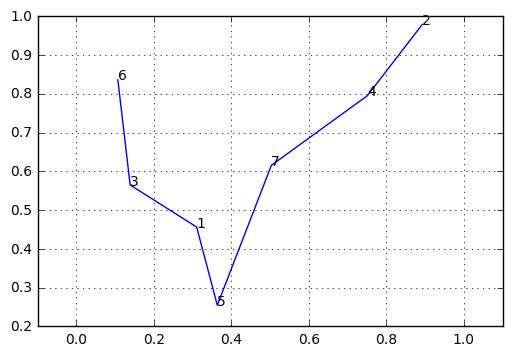

--- 0.0 seconds ---


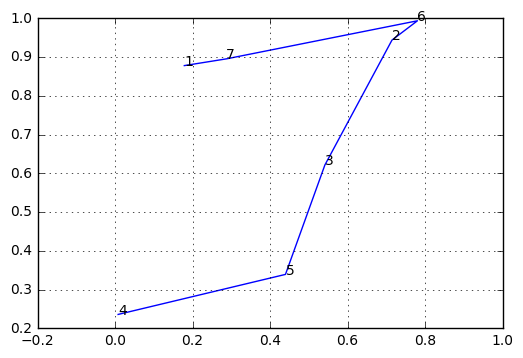

--- 0.0 seconds ---


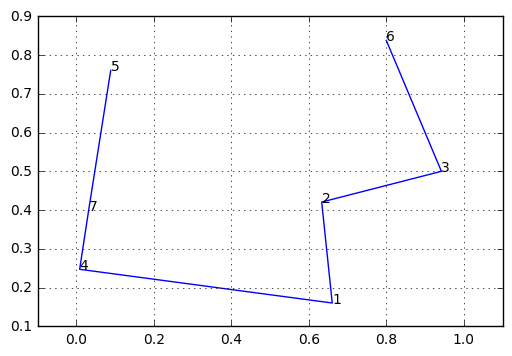

--- 0.0 seconds ---


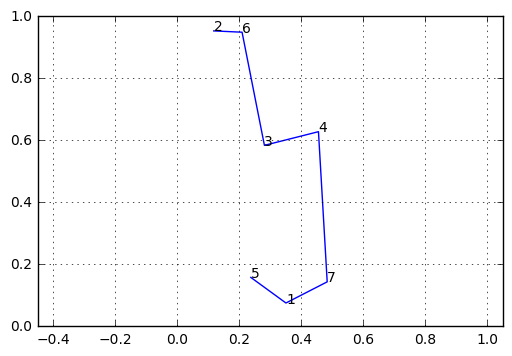

--- 0.0 seconds ---


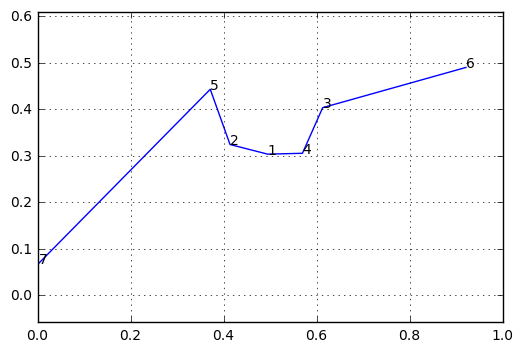

--- 0.0 seconds ---


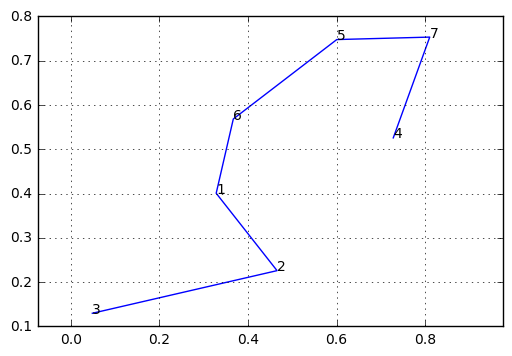

--- 0.0 seconds ---


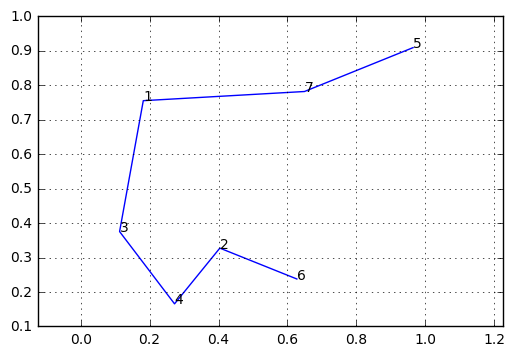

--- 0.0 seconds ---


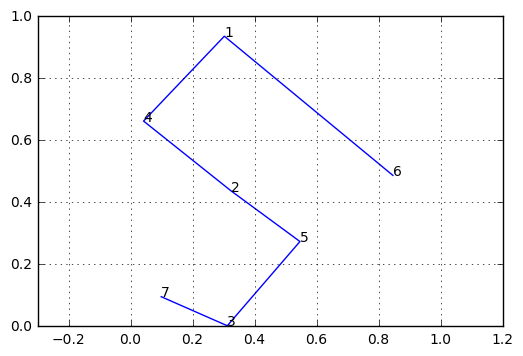

--- 0.0 seconds ---


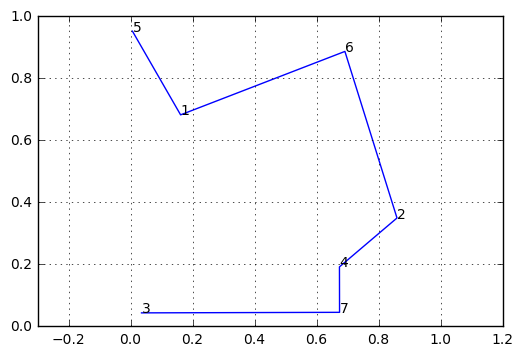

--- 0.0005059242248535156 seconds ---


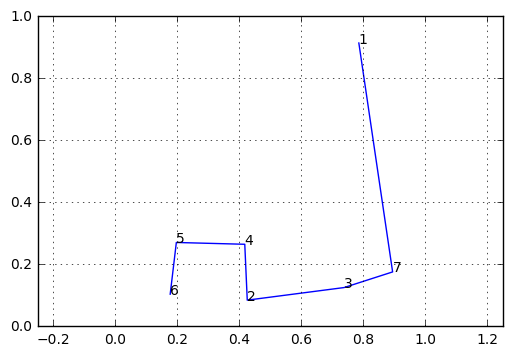

--- 0.0 seconds ---


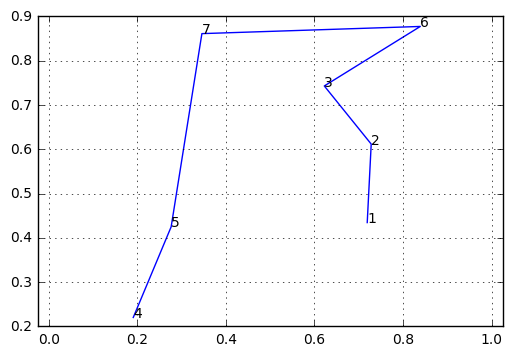

--- 0.0 seconds ---


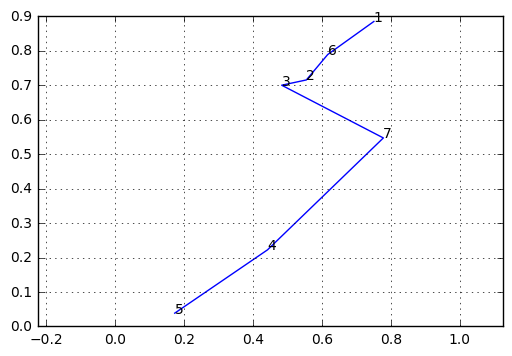

--- 0.0005009174346923828 seconds ---


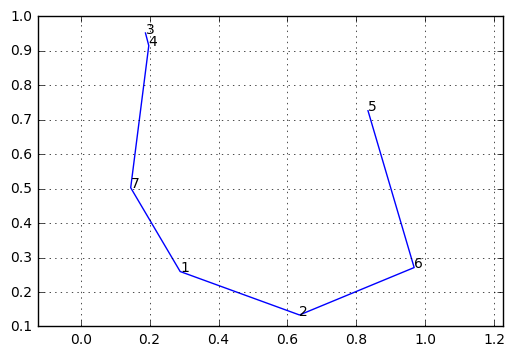

--- 0.0 seconds ---


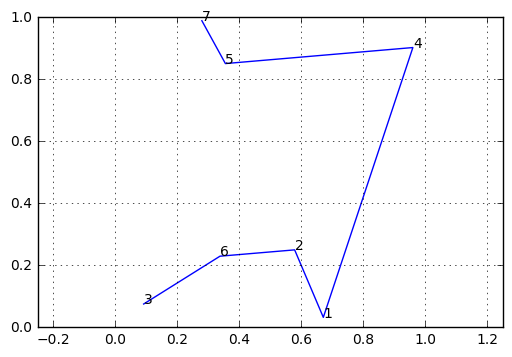

--- 0.0 seconds ---


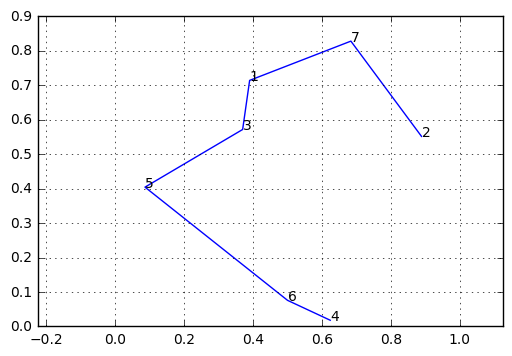

--- 0.0 seconds ---


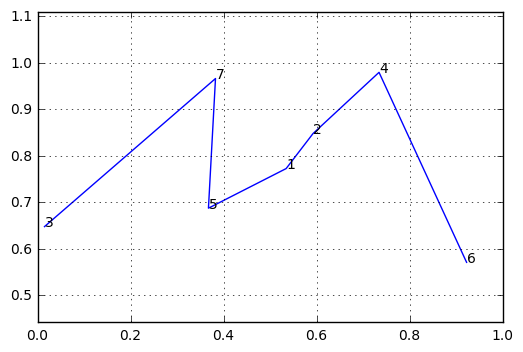

--- 0.0 seconds ---


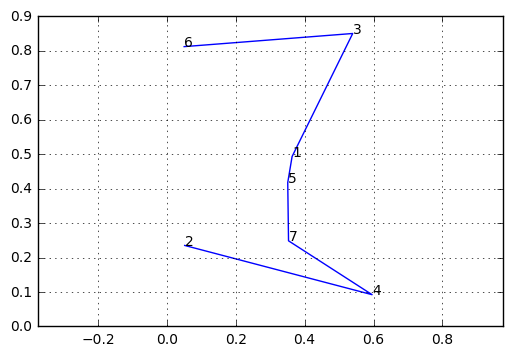

--- 0.0 seconds ---


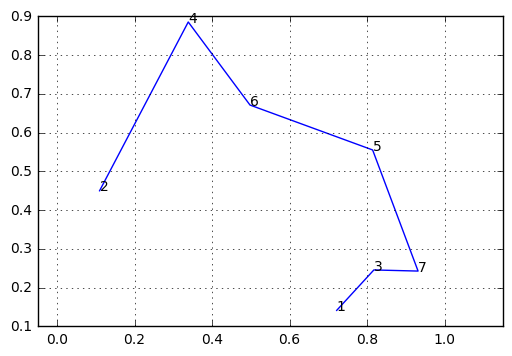

--- 0.0 seconds ---


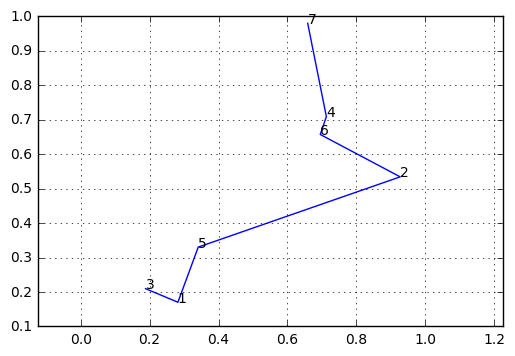

--- 0.0 seconds ---


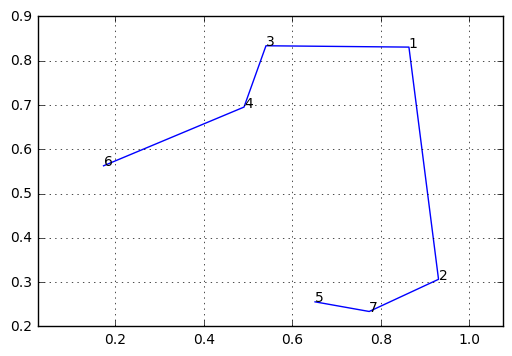

--- 0.0 seconds ---


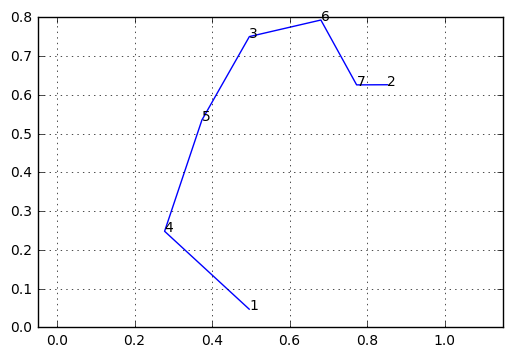

--- 0.0 seconds ---


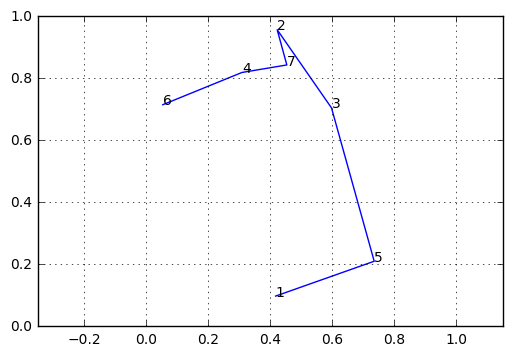

--- 0.0 seconds ---


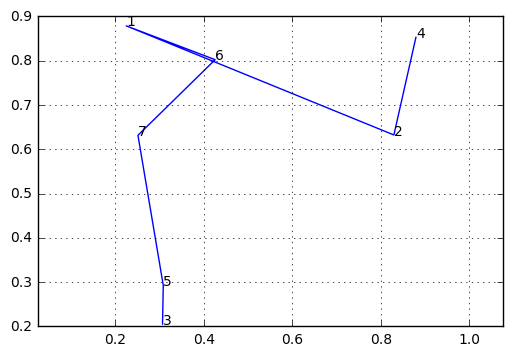

--- 0.0 seconds ---


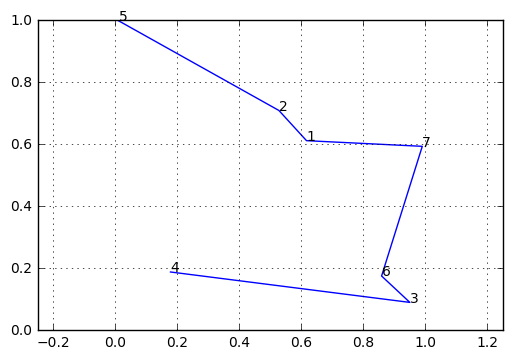

--- 0.0 seconds ---


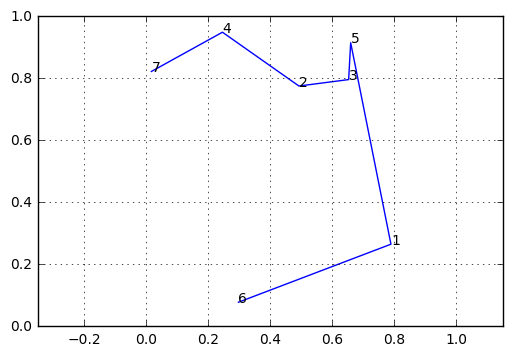

--- 0.0 seconds ---


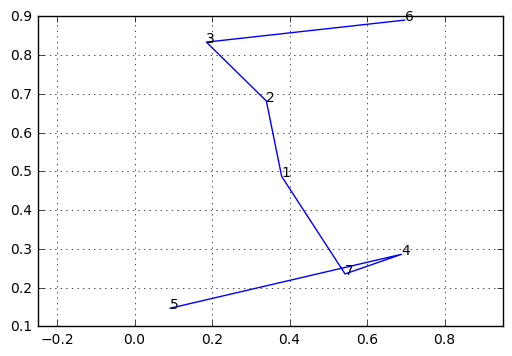

--- 0.0 seconds ---


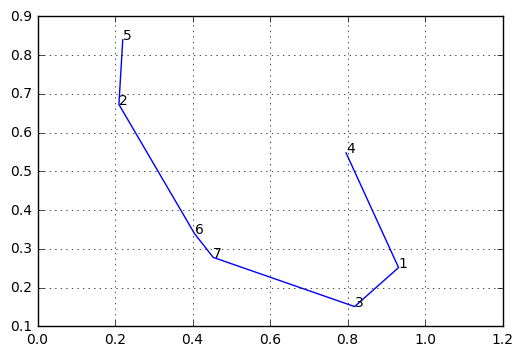

--- 0.0 seconds ---


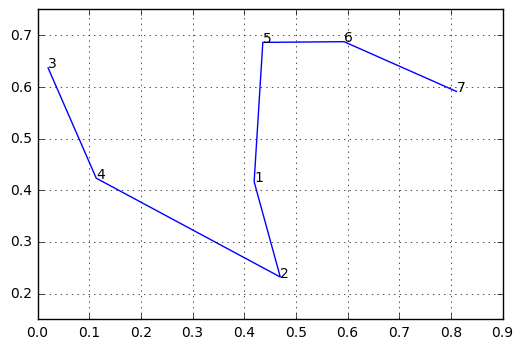

--- 0.0 seconds ---


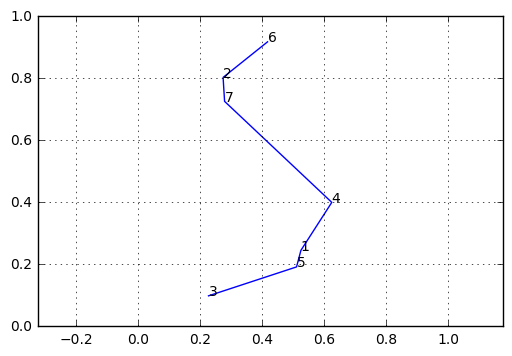

--- 0.0 seconds ---


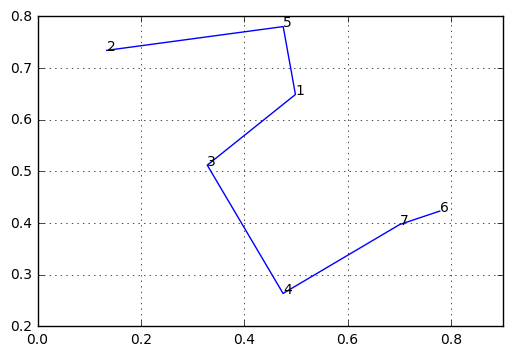

--- 0.0 seconds ---


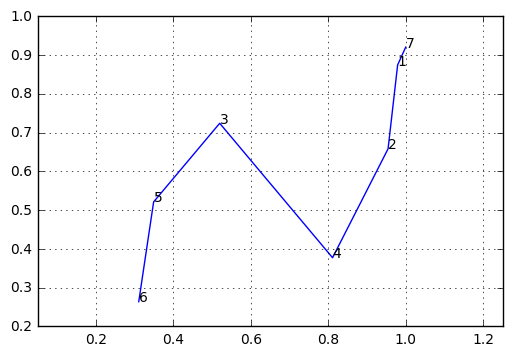

--- 0.0 seconds ---


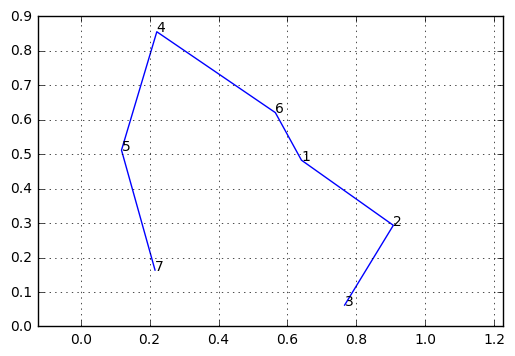

--- 0.0 seconds ---


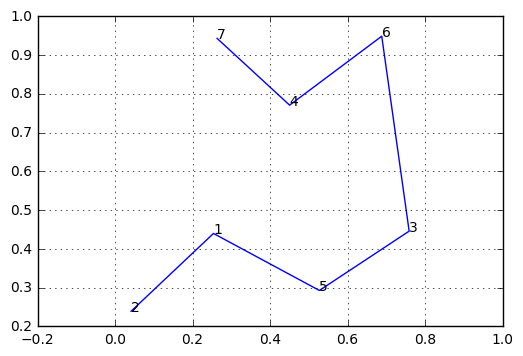

--- 0.0005004405975341797 seconds ---


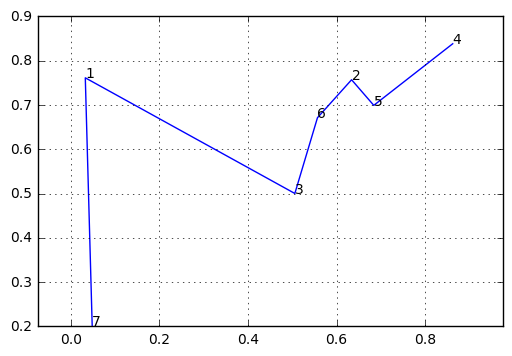

--- 0.0 seconds ---


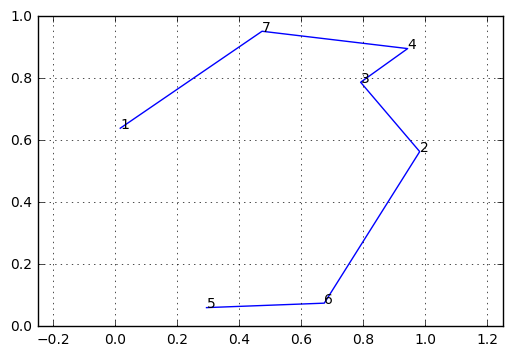

--- 0.0005006790161132812 seconds ---


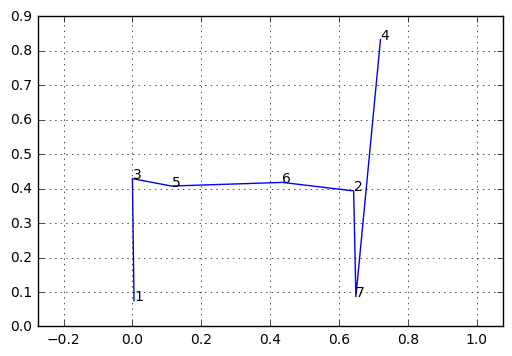

--- 0.0 seconds ---


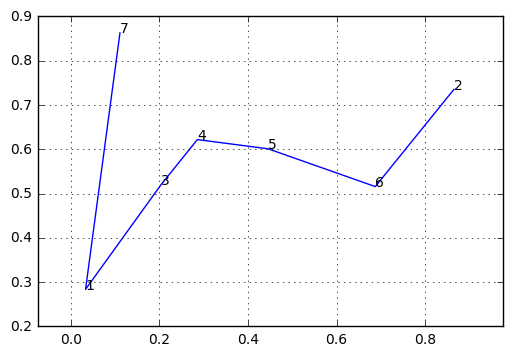

--- 0.0 seconds ---


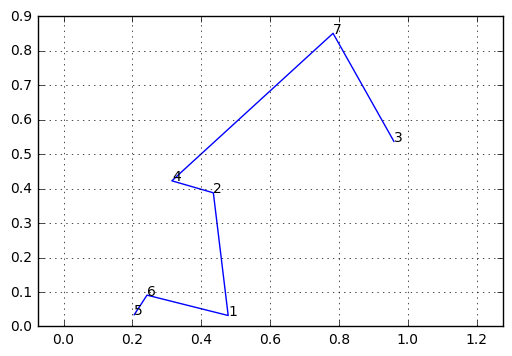

--- 0.0 seconds ---


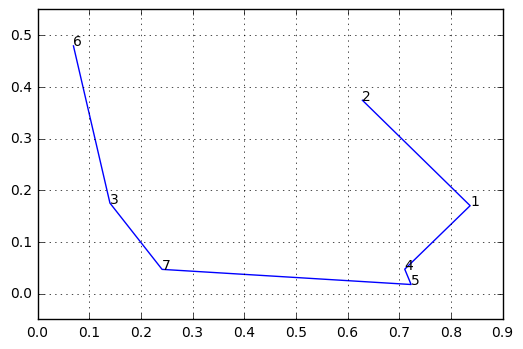

--- 0.0 seconds ---


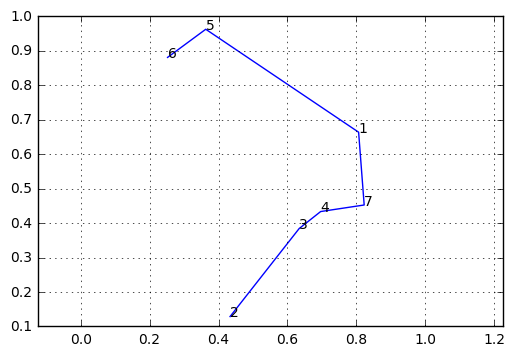

--- 0.0 seconds ---


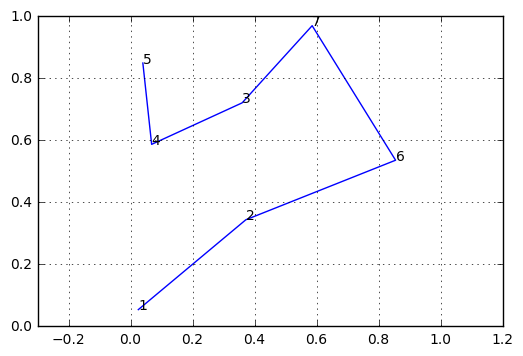

--- 0.0005006790161132812 seconds ---


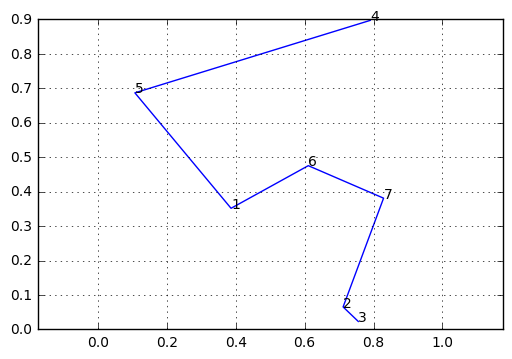

--- 0.0005004405975341797 seconds ---


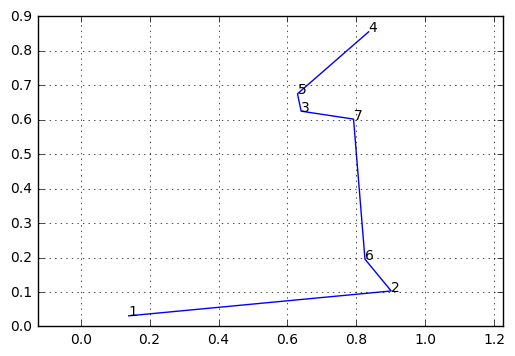

--- 0.0005016326904296875 seconds ---


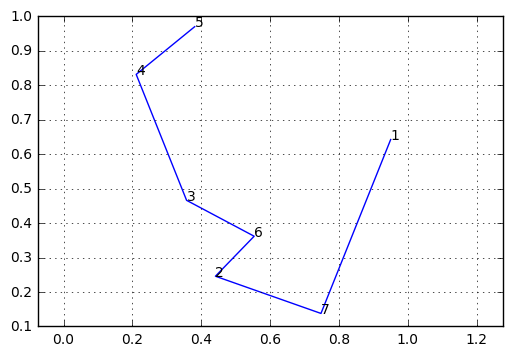

--- 0.0 seconds ---


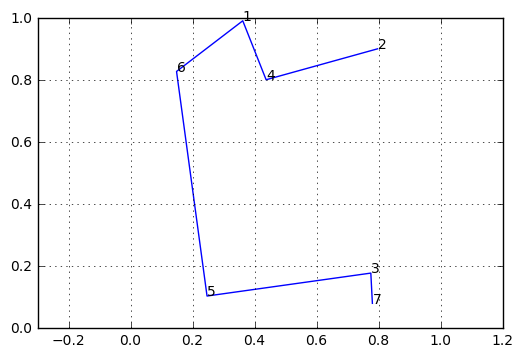

--- 0.0 seconds ---


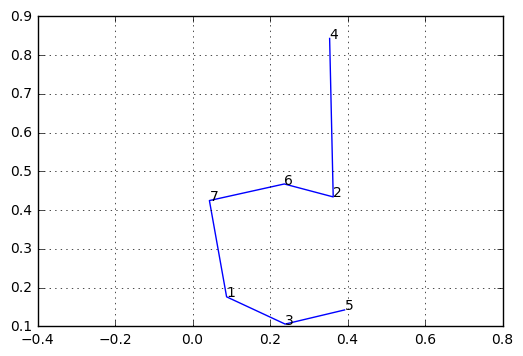

--- 0.0 seconds ---


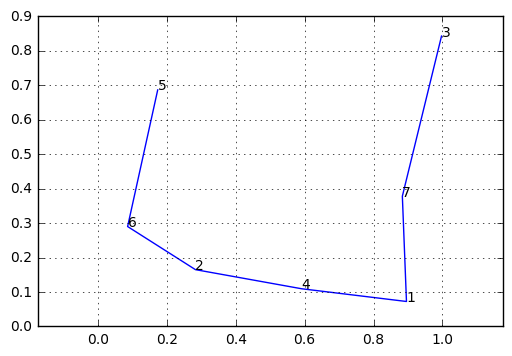

--- 0.0 seconds ---


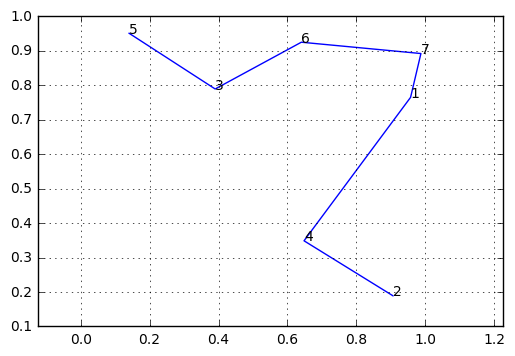

--- 0.0 seconds ---


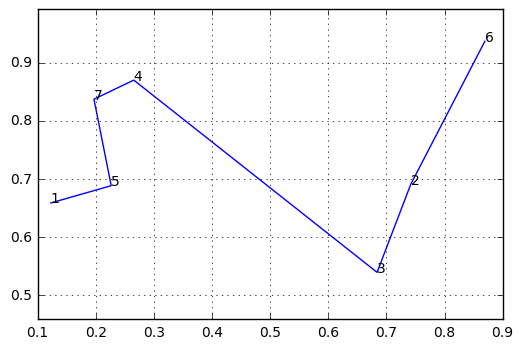

--- 0.000499725341796875 seconds ---


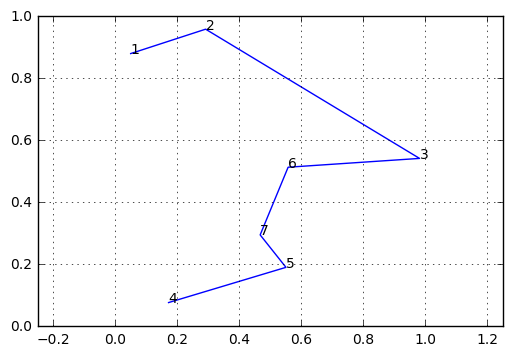

--- 0.0 seconds ---


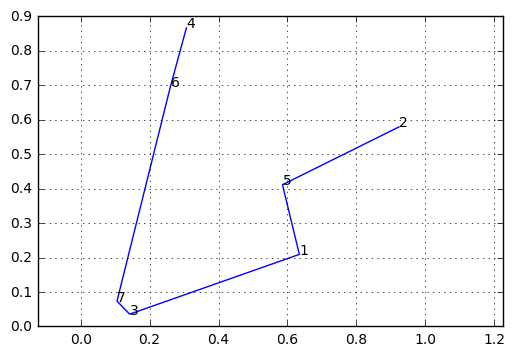

--- 0.0 seconds ---


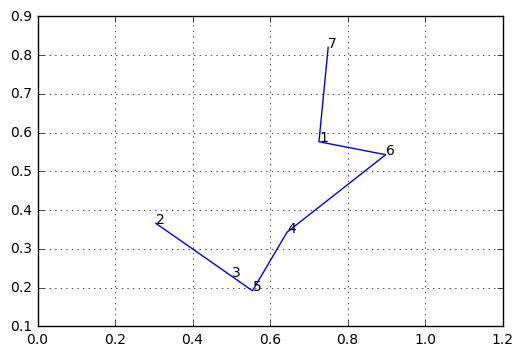

--- 0.0 seconds ---


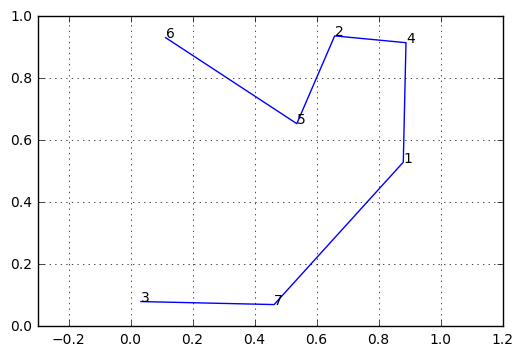

--- 0.0 seconds ---


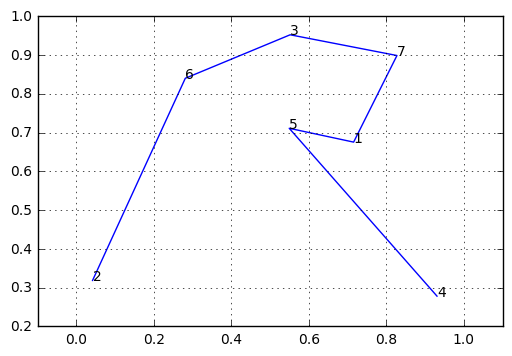

--- 0.0 seconds ---


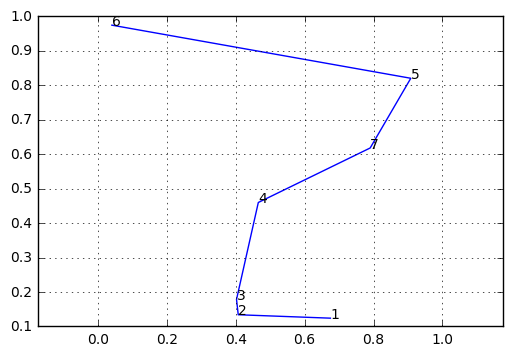

--- 0.0 seconds ---


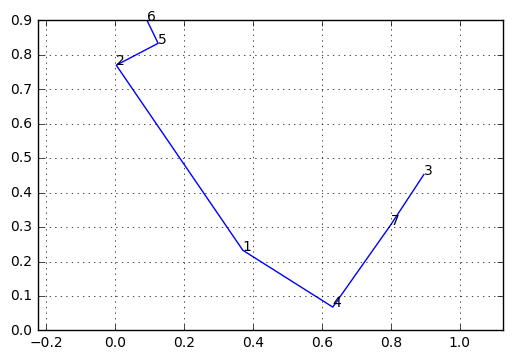

--- 0.0 seconds ---


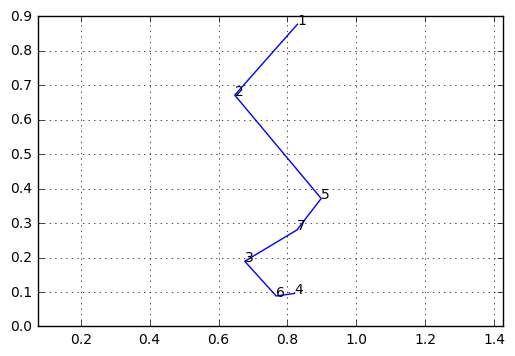

--- 0.0 seconds ---


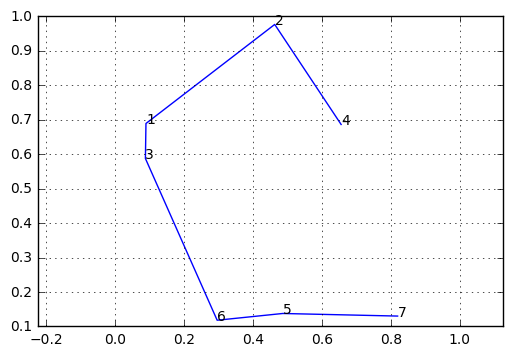

--- 0.0004999637603759766 seconds ---


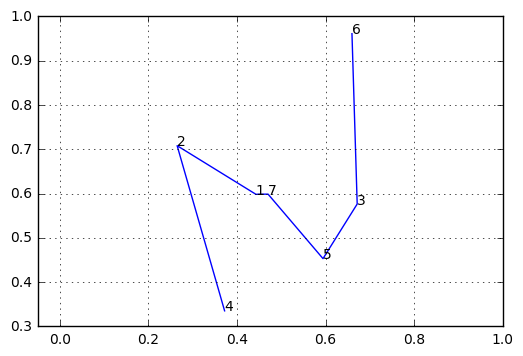

--- 0.0 seconds ---


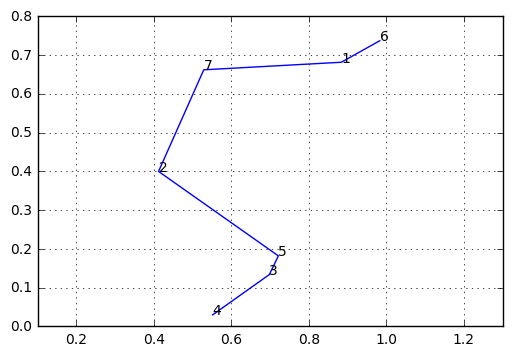

--- 0.0 seconds ---


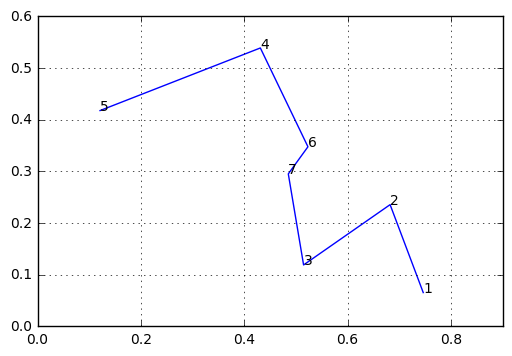

--- 0.0 seconds ---


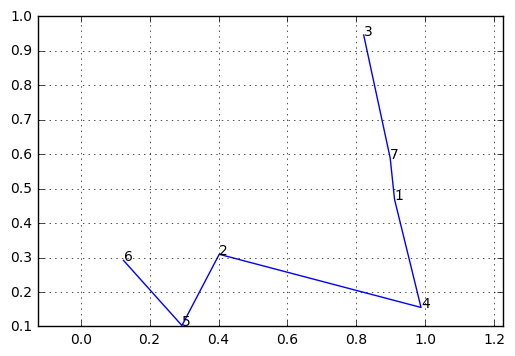

--- 0.0 seconds ---


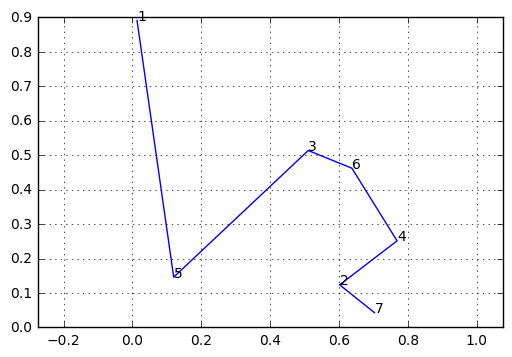

--- 0.0 seconds ---


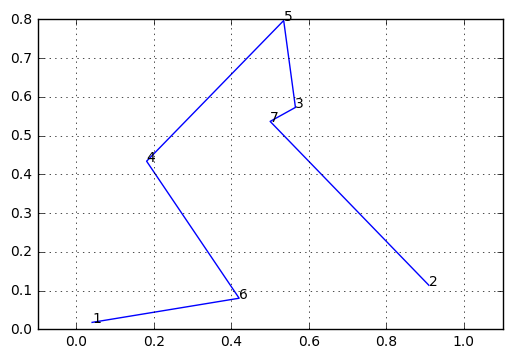

--- 0.0 seconds ---


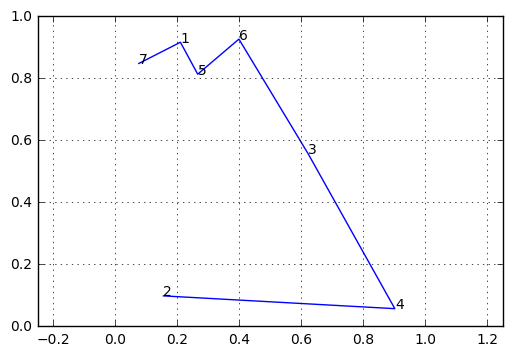

--- 0.0 seconds ---


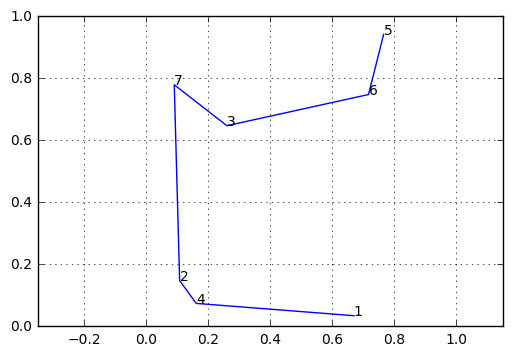

--- 0.0 seconds ---


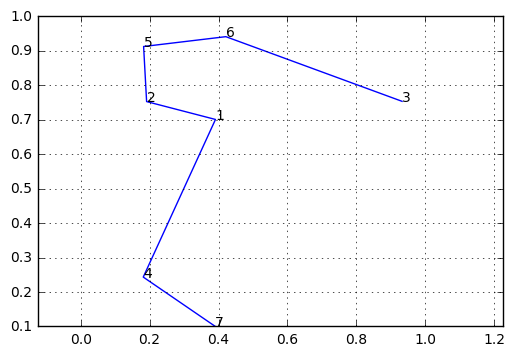

--- 0.0 seconds ---


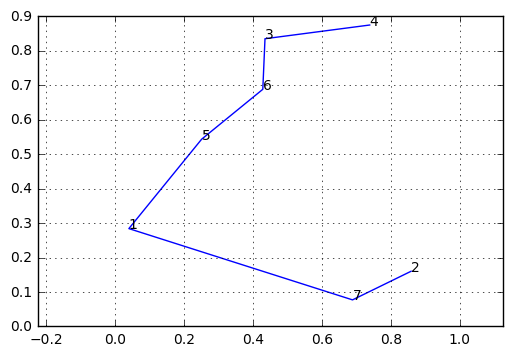

--- 0.000499725341796875 seconds ---


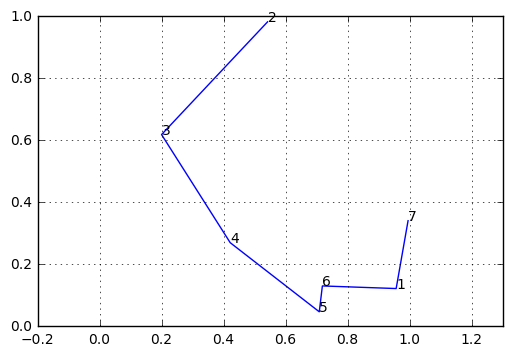

--- 0.0 seconds ---


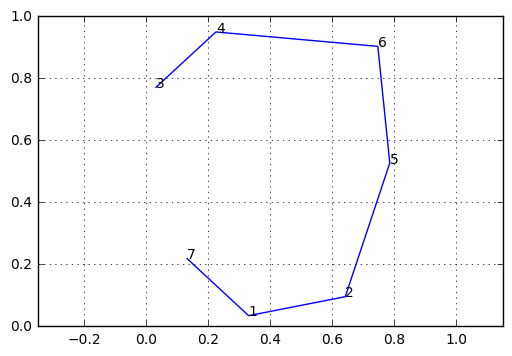

--- 0.000499725341796875 seconds ---


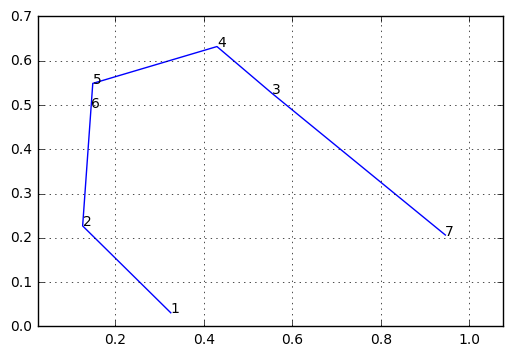

--- 0.0 seconds ---


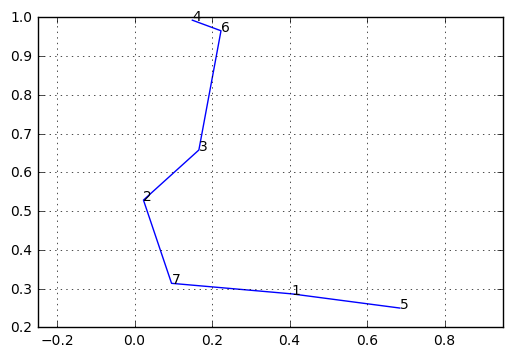

--- 0.0 seconds ---


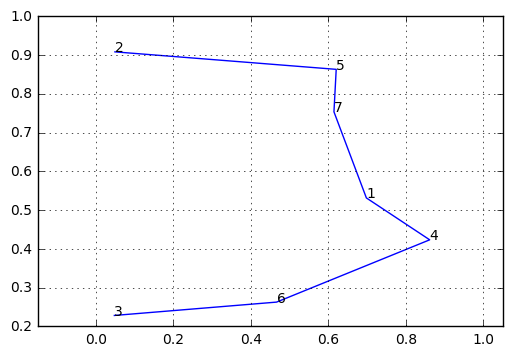

--- 0.0005004405975341797 seconds ---


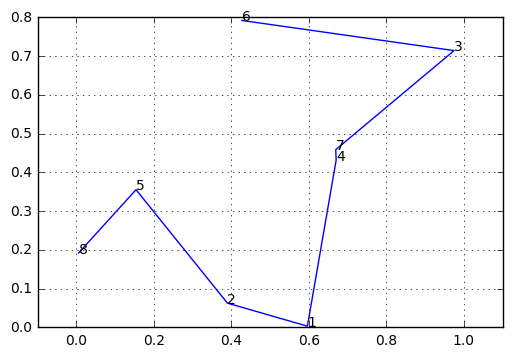

--- 0.0005013942718505859 seconds ---


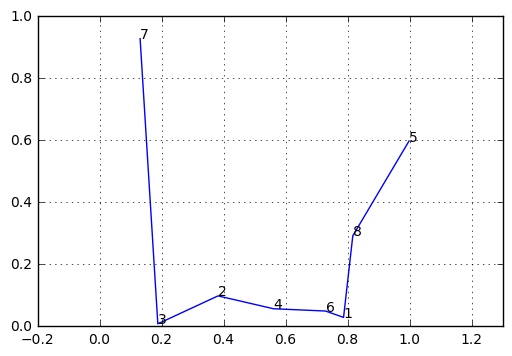

--- 0.0 seconds ---


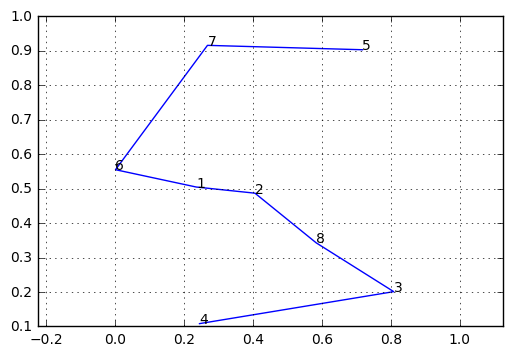

--- 0.0 seconds ---


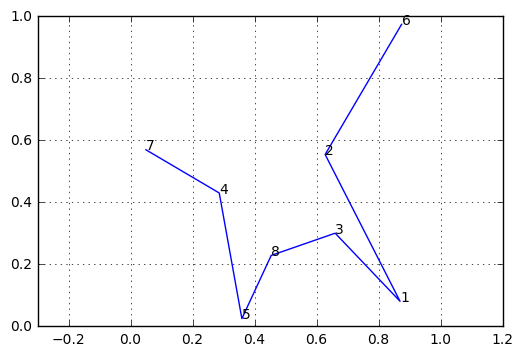

--- 0.0 seconds ---


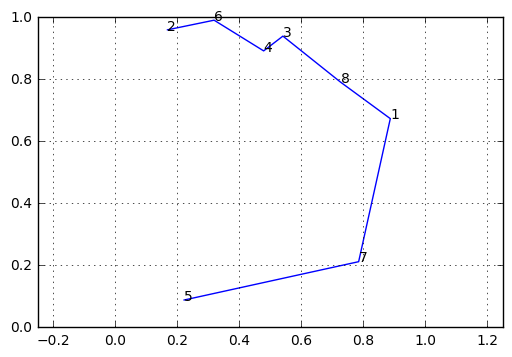

--- 0.0 seconds ---


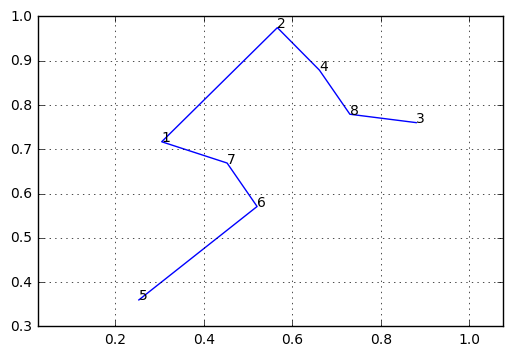

--- 0.0 seconds ---


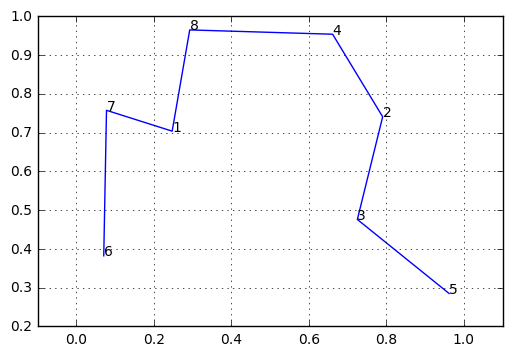

--- 0.0 seconds ---


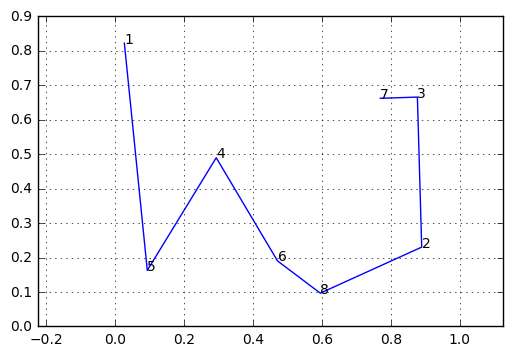

--- 0.0 seconds ---


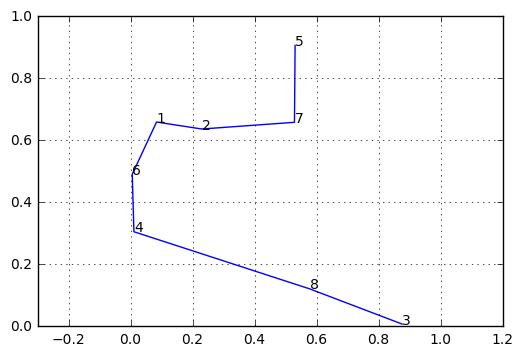

--- 0.0 seconds ---


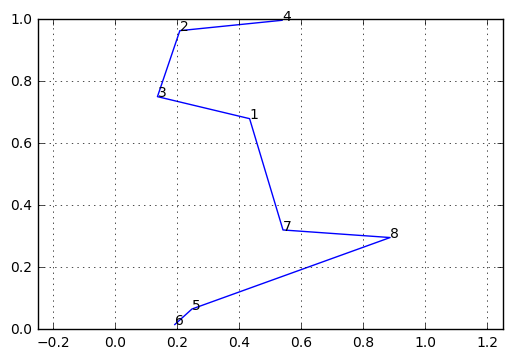

--- 0.0 seconds ---


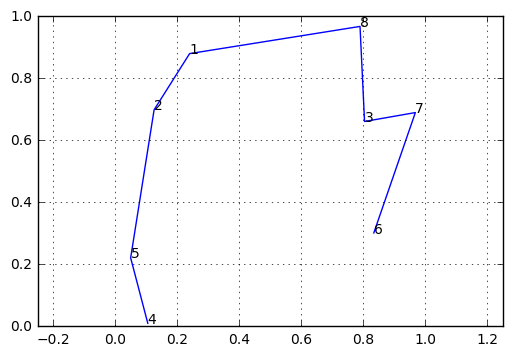

--- 0.0 seconds ---


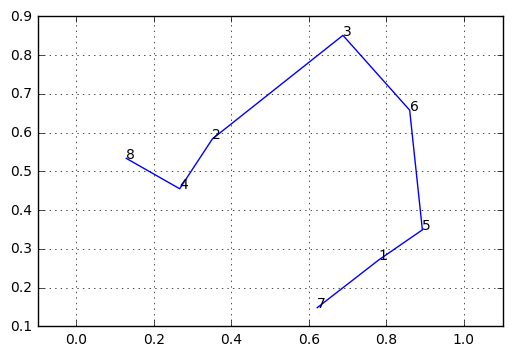

--- 0.0 seconds ---


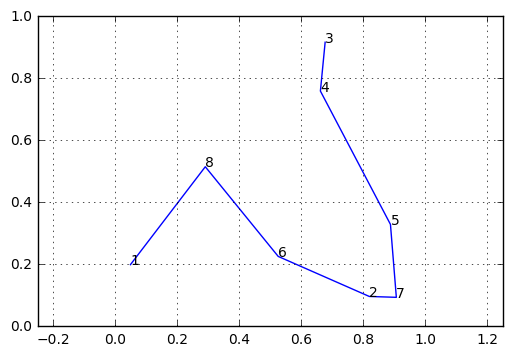

--- 0.0005004405975341797 seconds ---


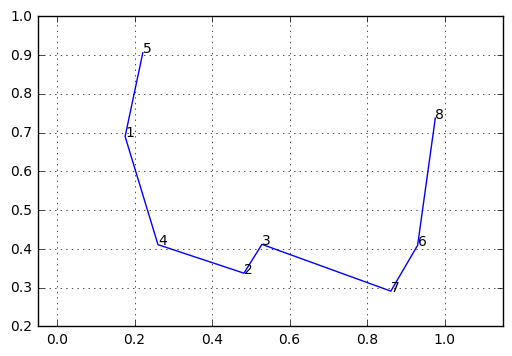

--- 0.0005004405975341797 seconds ---


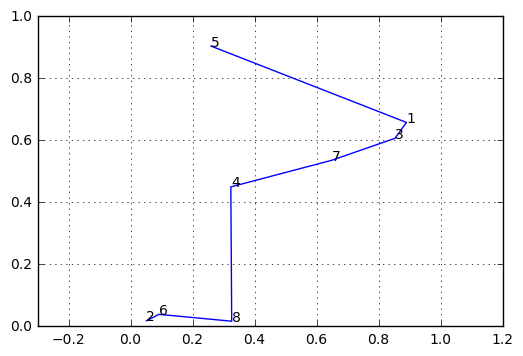

--- 0.0 seconds ---


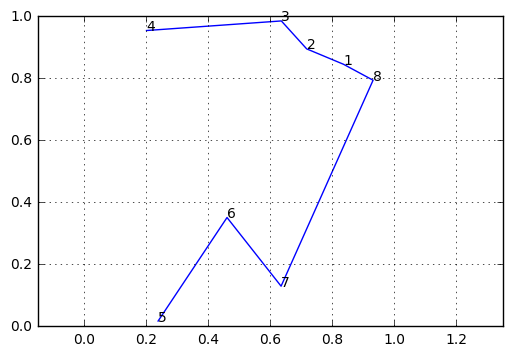

--- 0.0004999637603759766 seconds ---


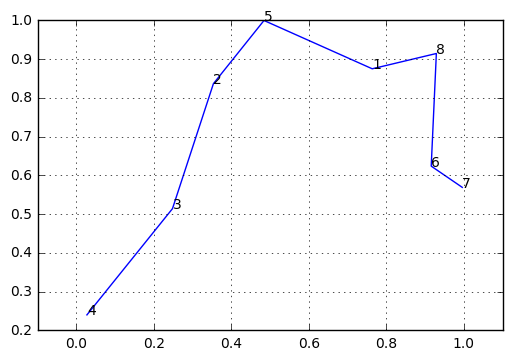

--- 0.0004961490631103516 seconds ---


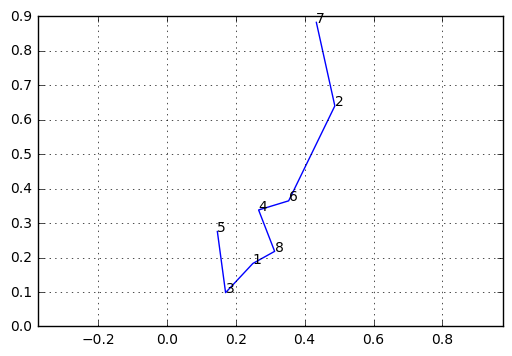

--- 0.0 seconds ---


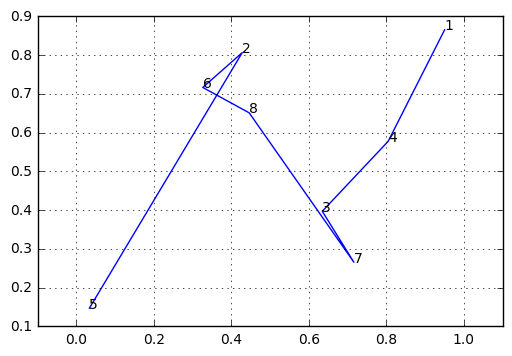

--- 0.0 seconds ---


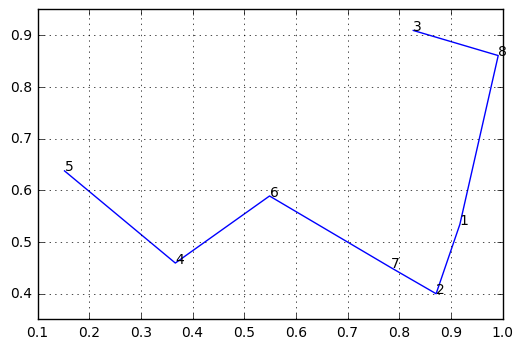

--- 0.0 seconds ---


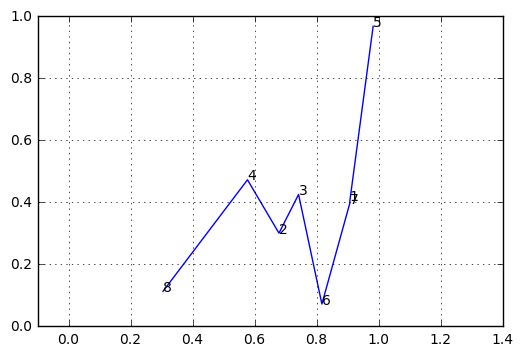

--- 0.0005164146423339844 seconds ---


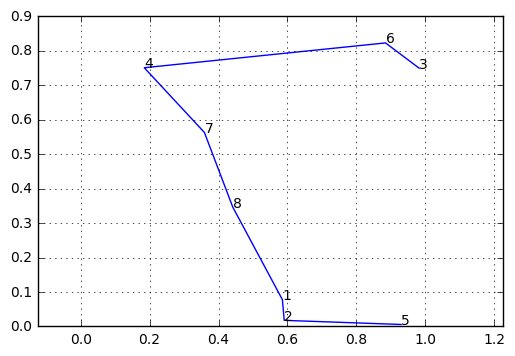

--- 0.0005009174346923828 seconds ---


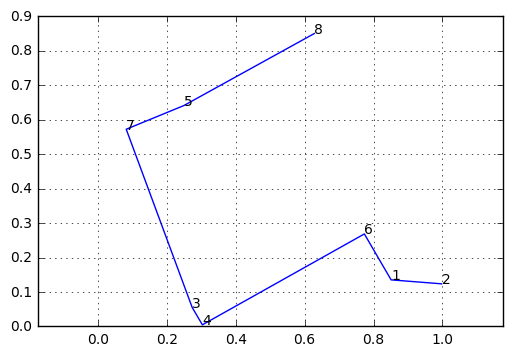

--- 0.0 seconds ---


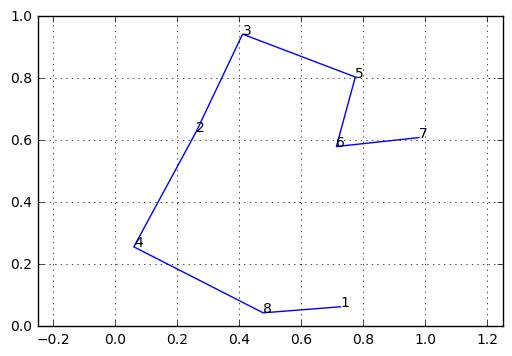

--- 0.0 seconds ---


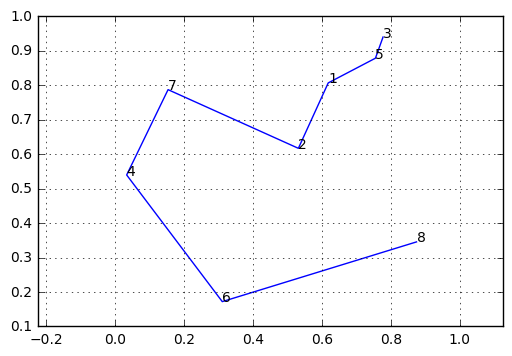

--- 0.00048279762268066406 seconds ---


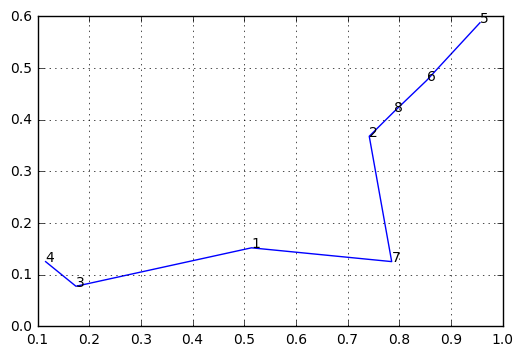

--- 0.0 seconds ---


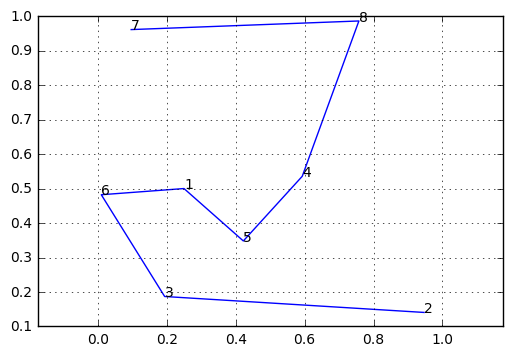

--- 0.0 seconds ---


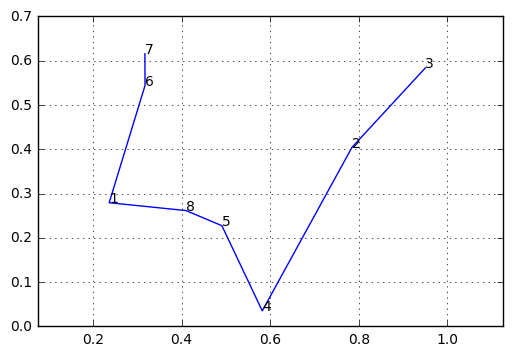

--- 0.0004999637603759766 seconds ---


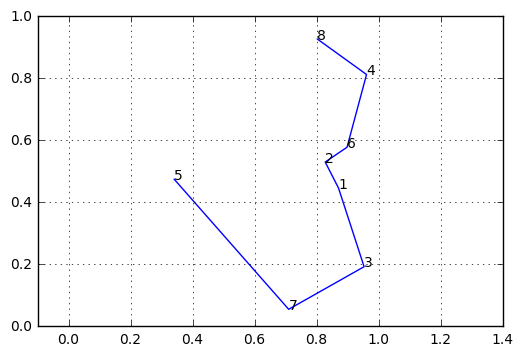

--- 0.0 seconds ---


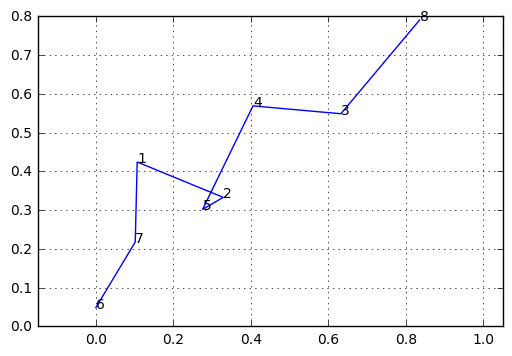

--- 0.0 seconds ---


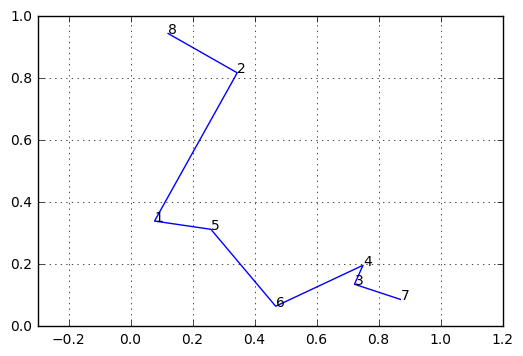

--- 0.0005006790161132812 seconds ---


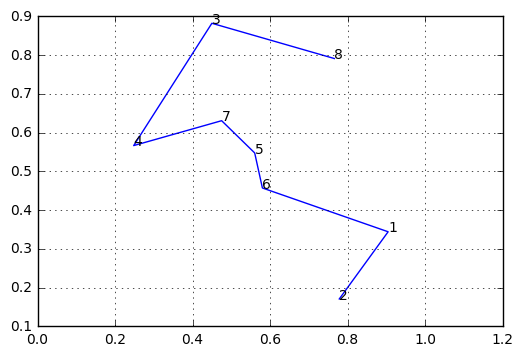

--- 0.0 seconds ---


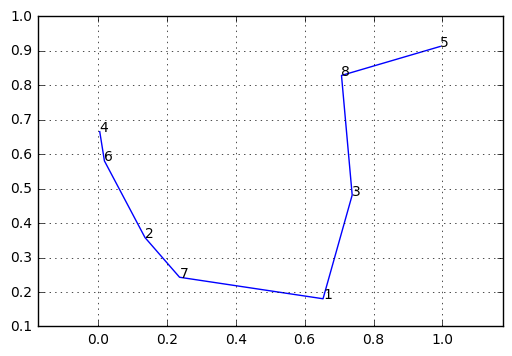

--- 0.0 seconds ---


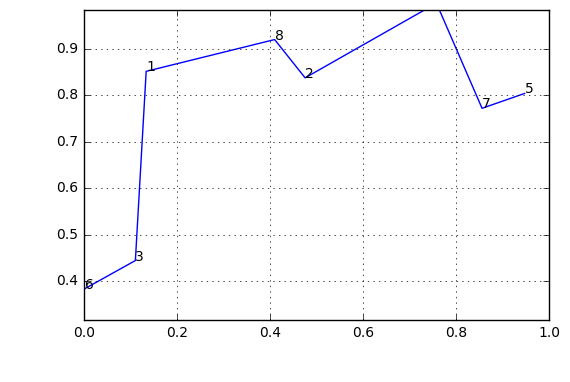

--- 0.0005002021789550781 seconds ---


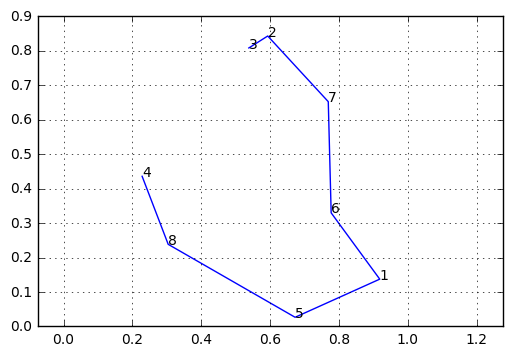

--- 0.0005004405975341797 seconds ---


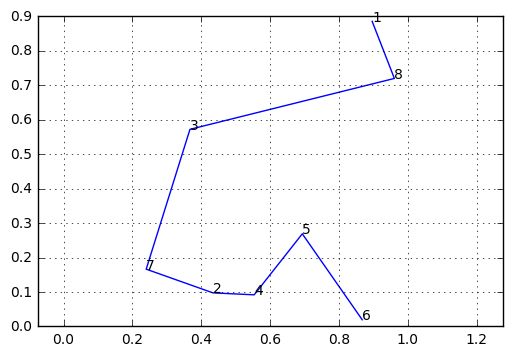

--- 0.0 seconds ---


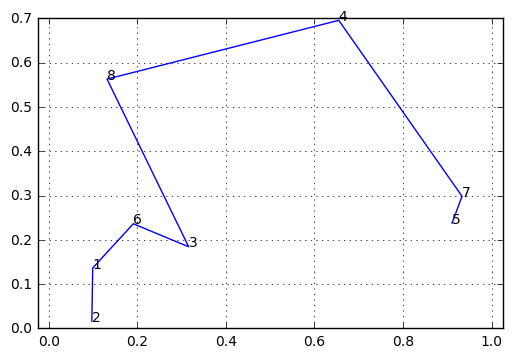

--- 0.0 seconds ---


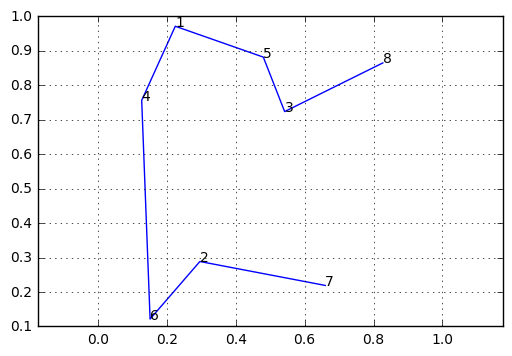

--- 0.0005002021789550781 seconds ---


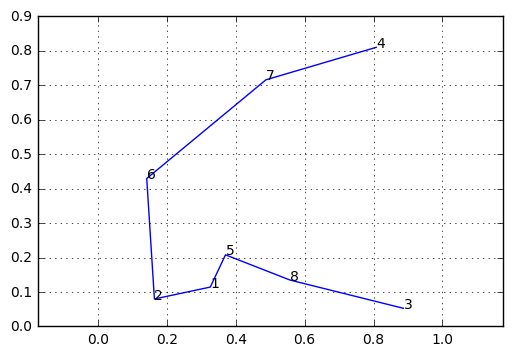

--- 0.0 seconds ---


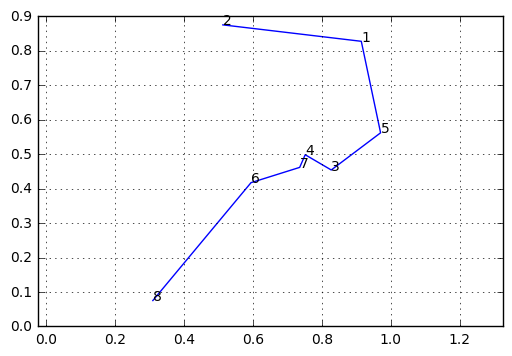

--- 0.000499725341796875 seconds ---


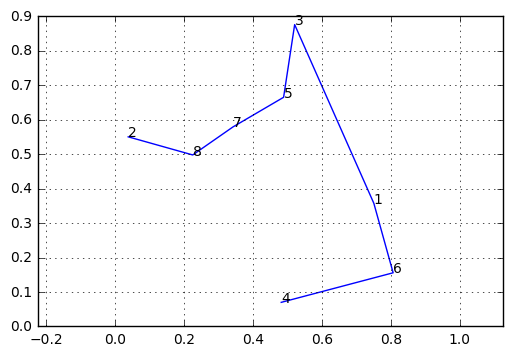

--- 0.0 seconds ---


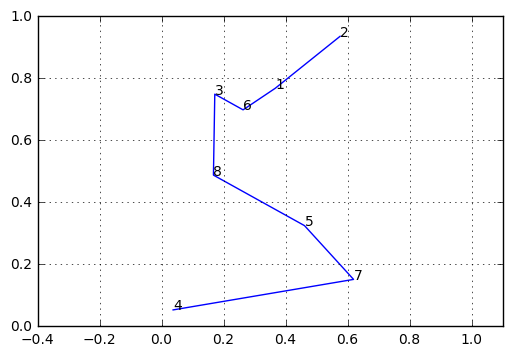

--- 0.0 seconds ---


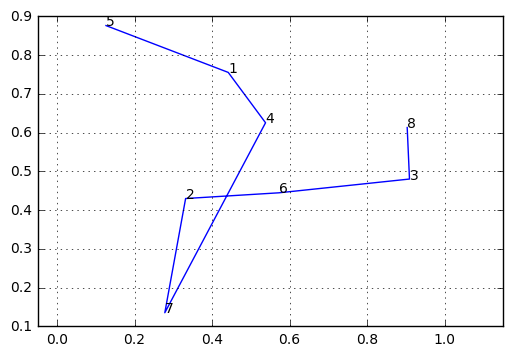

--- 0.0 seconds ---


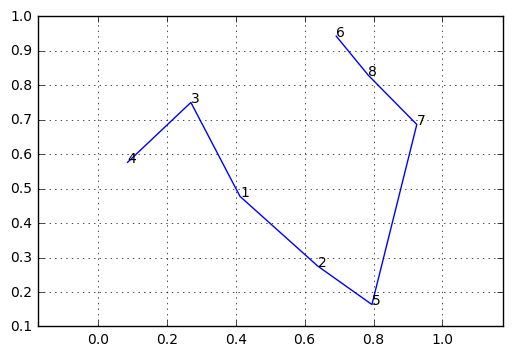

--- 0.0 seconds ---


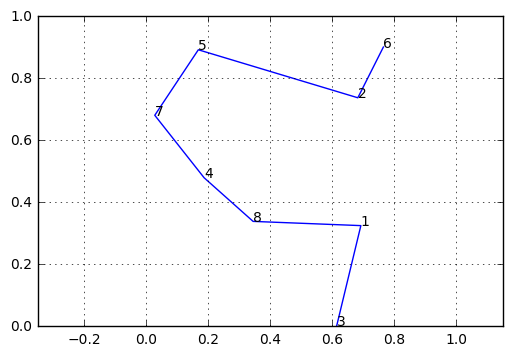

--- 0.0 seconds ---


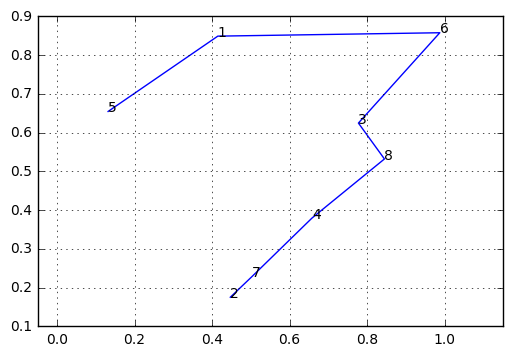

--- 0.0 seconds ---


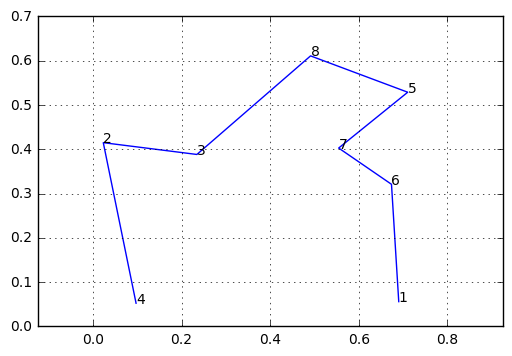

--- 0.0 seconds ---


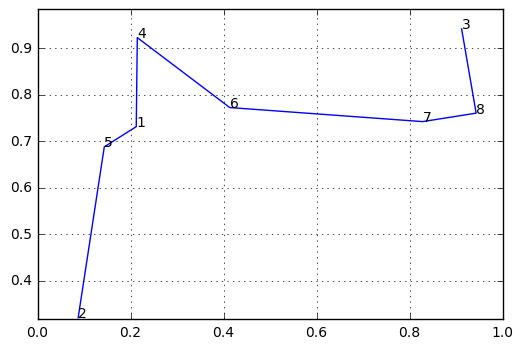

--- 0.0 seconds ---


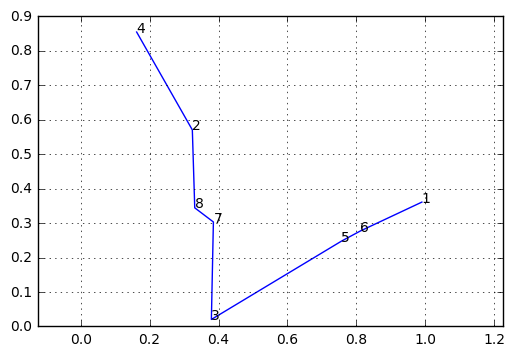

--- 0.0004923343658447266 seconds ---


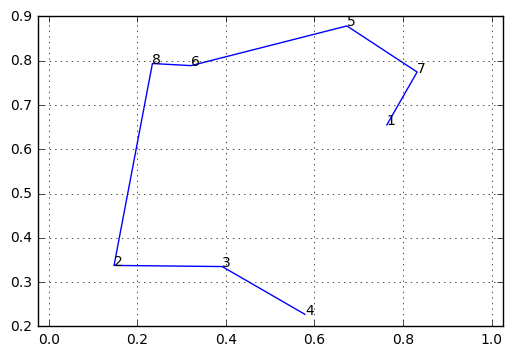

--- 0.0005021095275878906 seconds ---


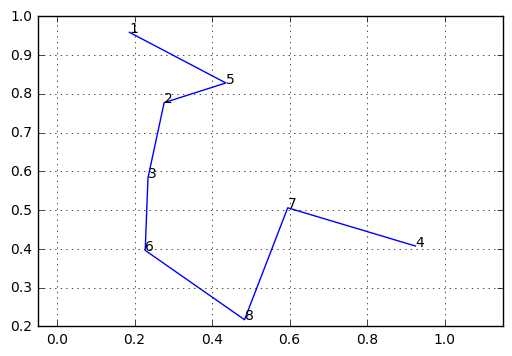

--- 0.0 seconds ---


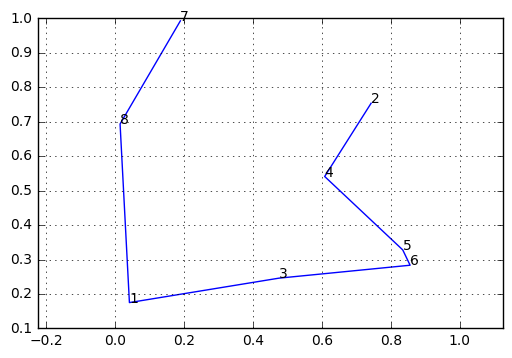

--- 0.0005004405975341797 seconds ---


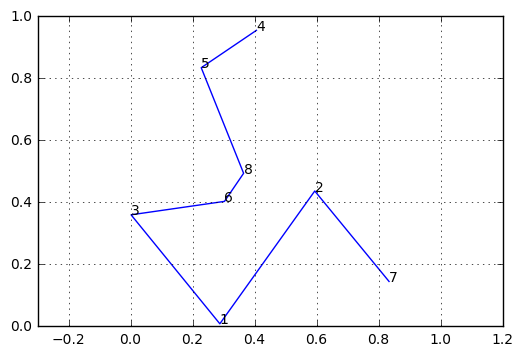

--- 0.0 seconds ---


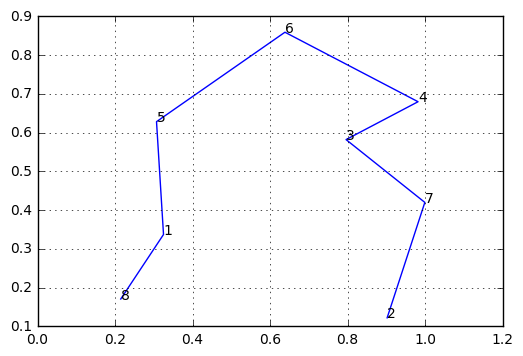

--- 0.0 seconds ---


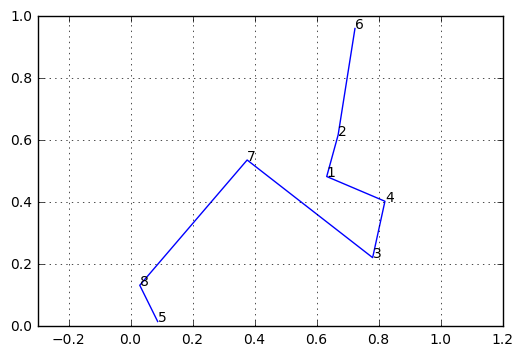

--- 0.0 seconds ---


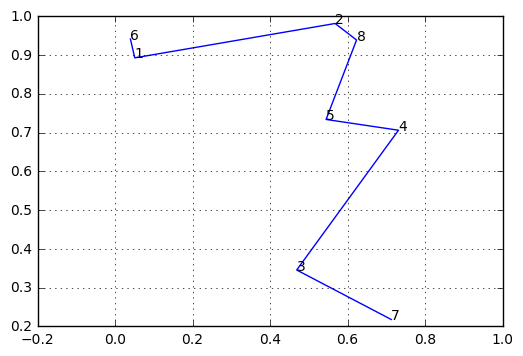

--- 0.0 seconds ---


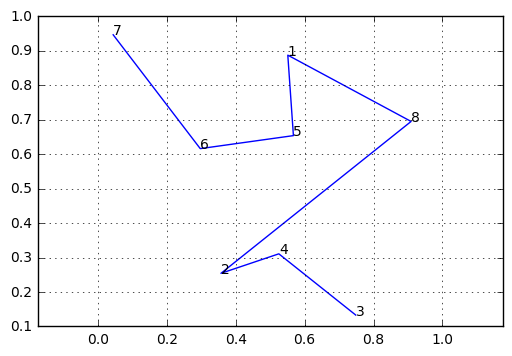

--- 0.0 seconds ---


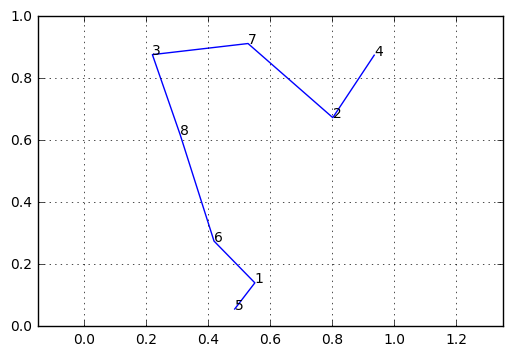

--- 0.0 seconds ---


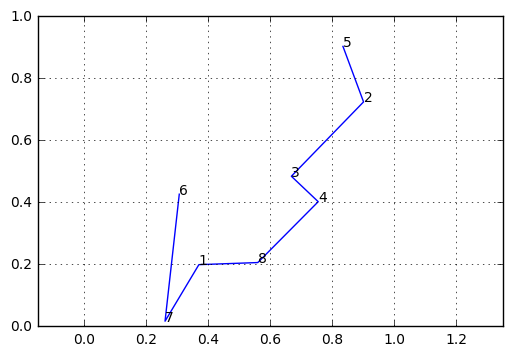

--- 0.0 seconds ---


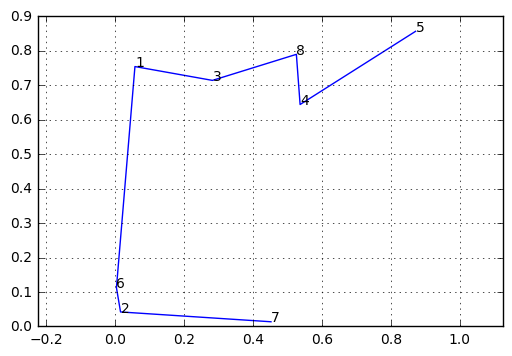

--- 0.0004999637603759766 seconds ---


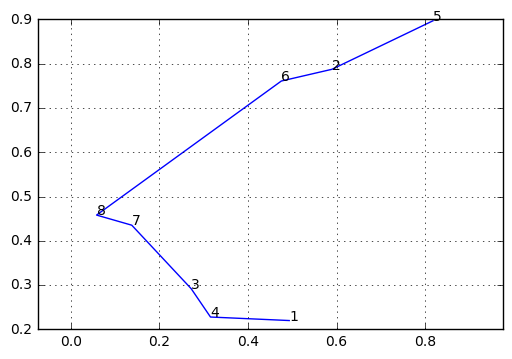

--- 0.0 seconds ---


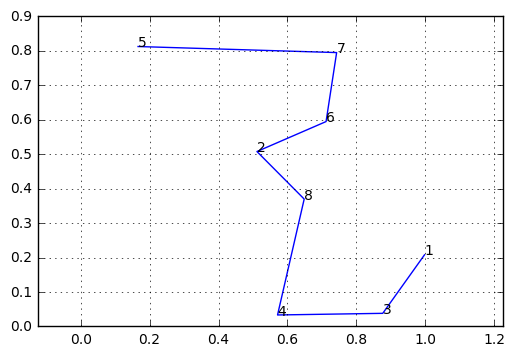

--- 0.0 seconds ---


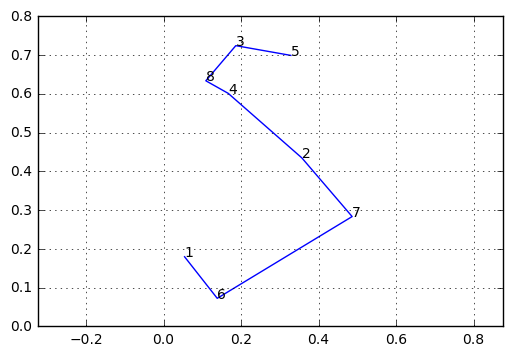

--- 0.0 seconds ---


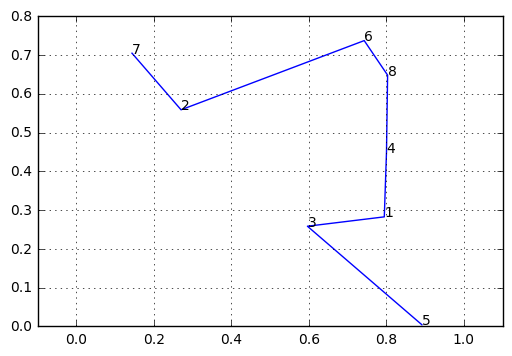

--- 0.0 seconds ---


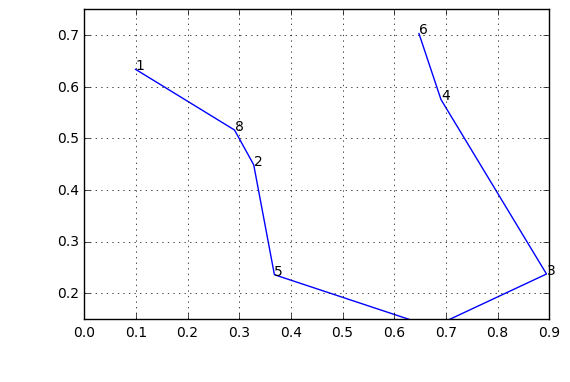

--- 0.0 seconds ---


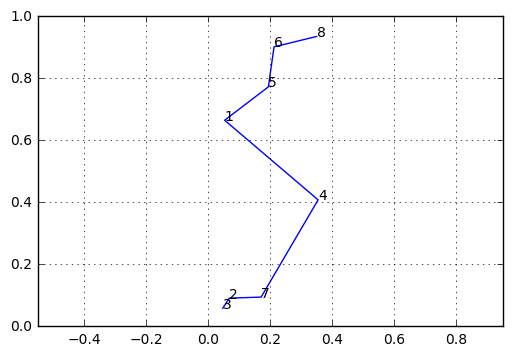

--- 0.0 seconds ---


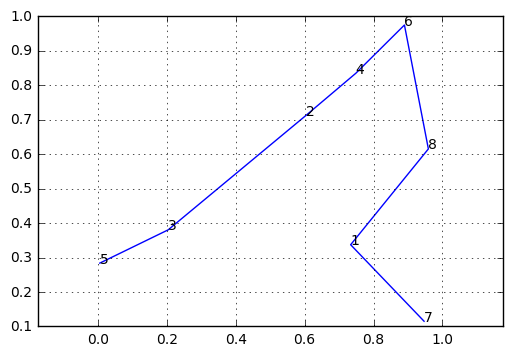

--- 0.0 seconds ---


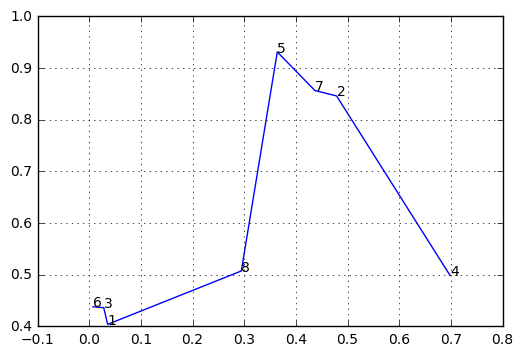

--- 0.0005006790161132812 seconds ---


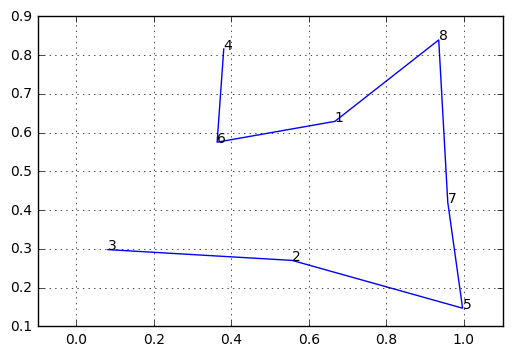

--- 0.0010006427764892578 seconds ---


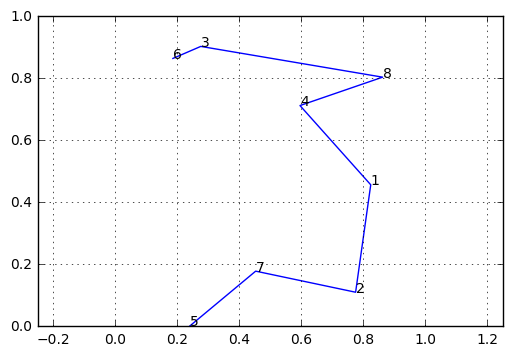

--- 0.0005002021789550781 seconds ---


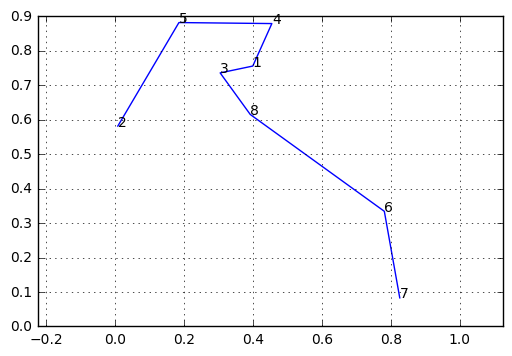

--- 0.0 seconds ---


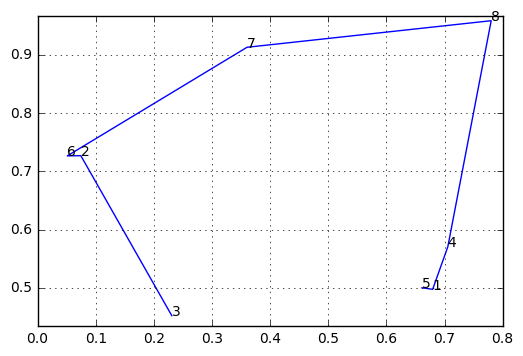

--- 0.0004897117614746094 seconds ---


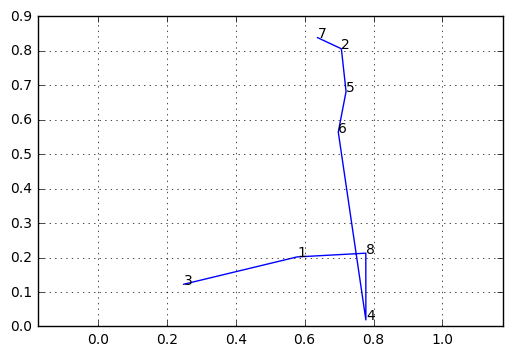

--- 0.0 seconds ---


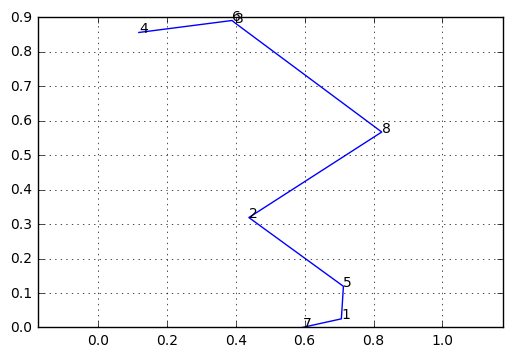

--- 0.0005004405975341797 seconds ---


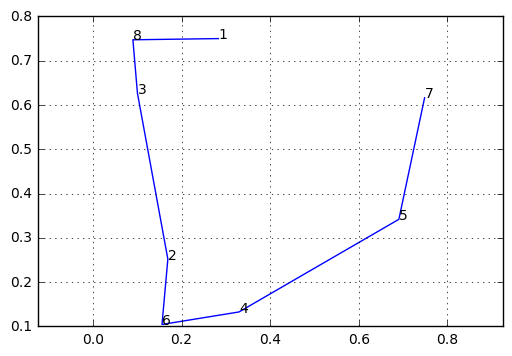

--- 0.0 seconds ---


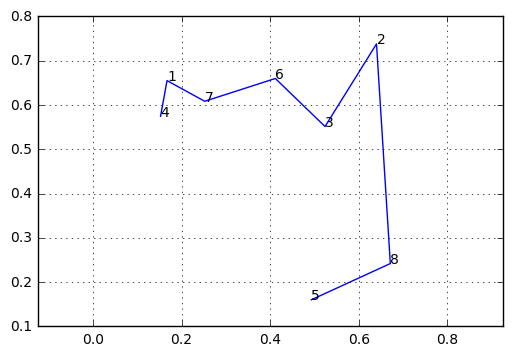

--- 0.0 seconds ---


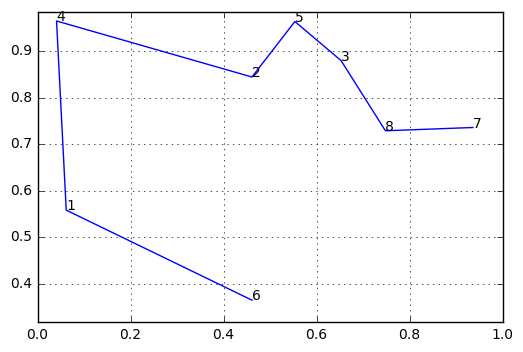

--- 0.0 seconds ---


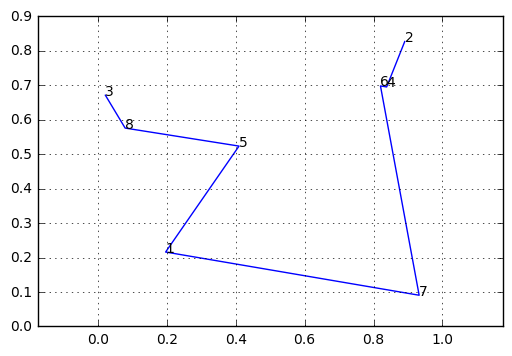

--- 0.0 seconds ---


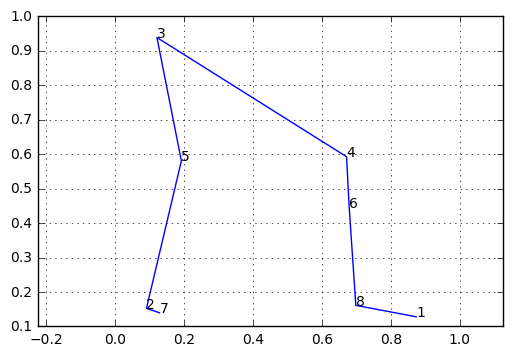

--- 0.0 seconds ---


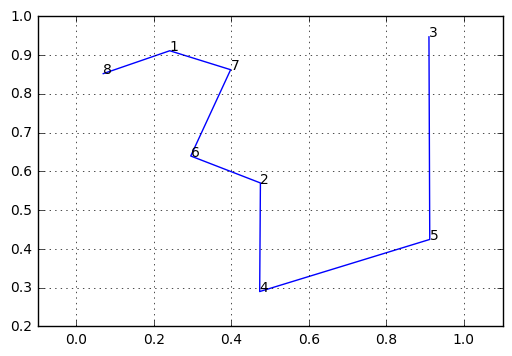

--- 0.0 seconds ---


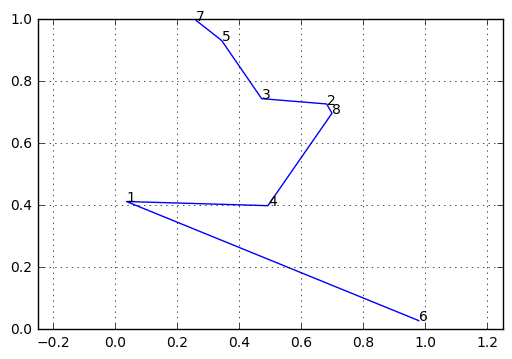

--- 0.0005097389221191406 seconds ---


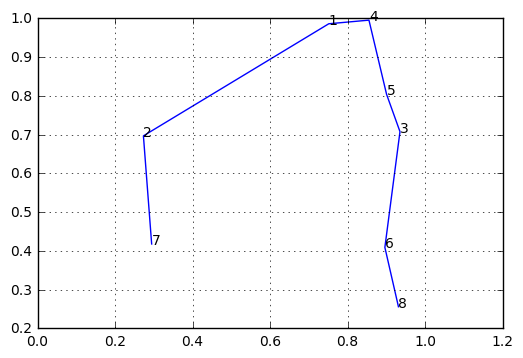

--- 0.0 seconds ---


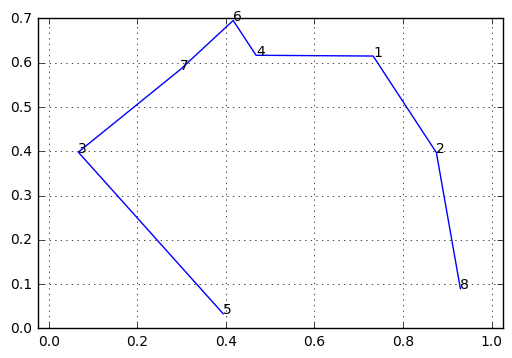

--- 0.0 seconds ---


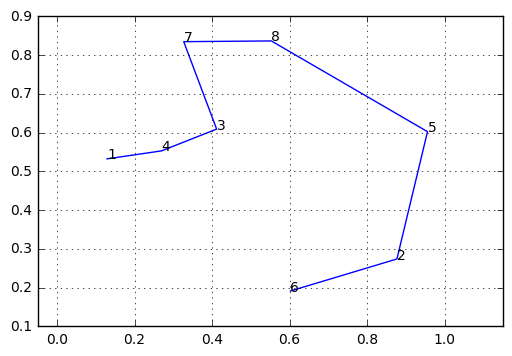

--- 0.0 seconds ---


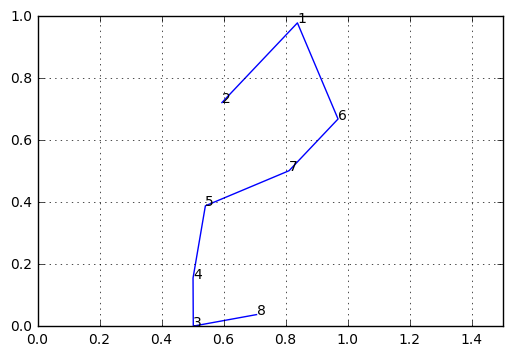

--- 0.0 seconds ---


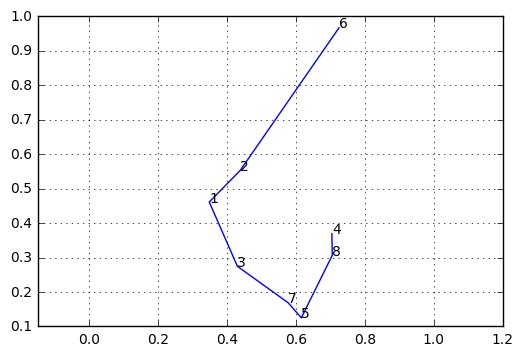

--- 0.0 seconds ---


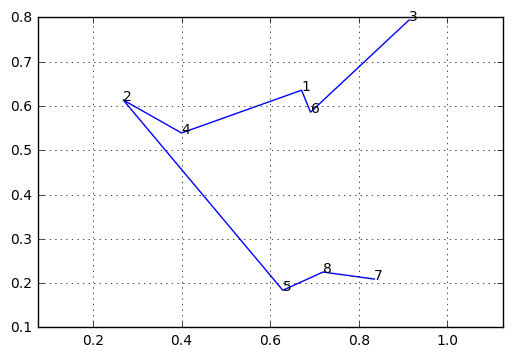

--- 0.0 seconds ---


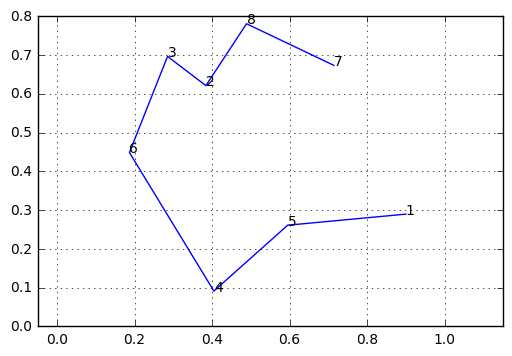

--- 0.000499725341796875 seconds ---


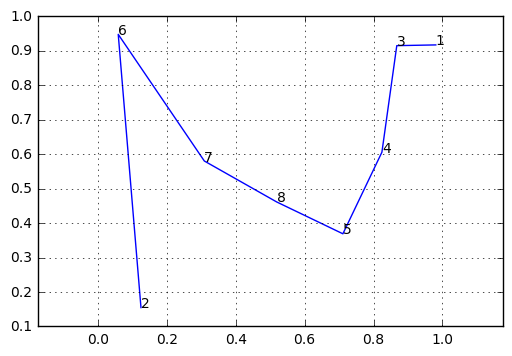

--- 0.0 seconds ---


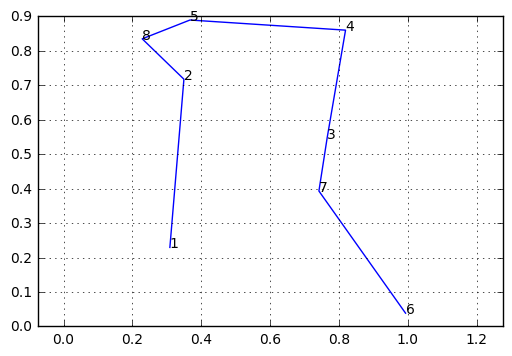

--- 0.0 seconds ---


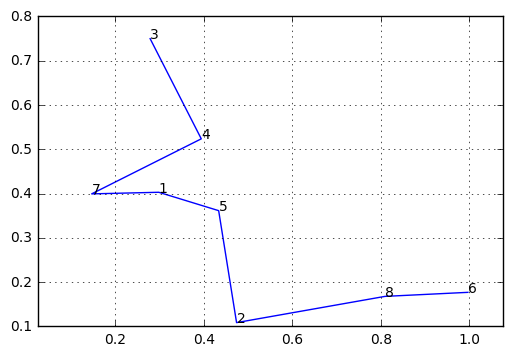

--- 0.0 seconds ---


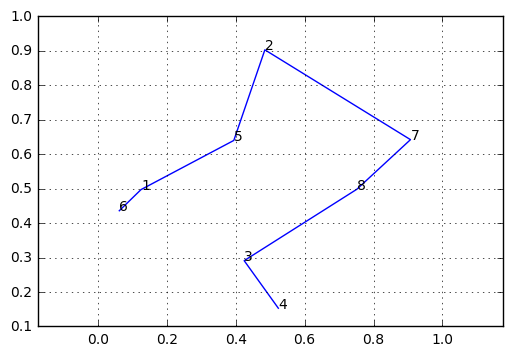

--- 0.0 seconds ---


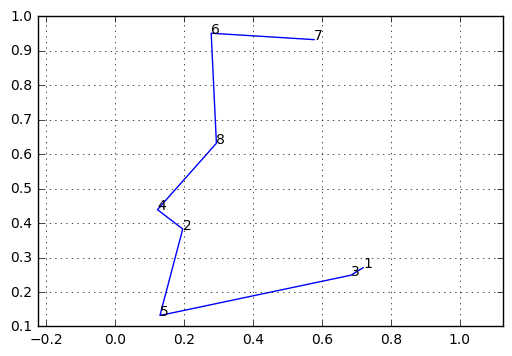

--- 0.0 seconds ---


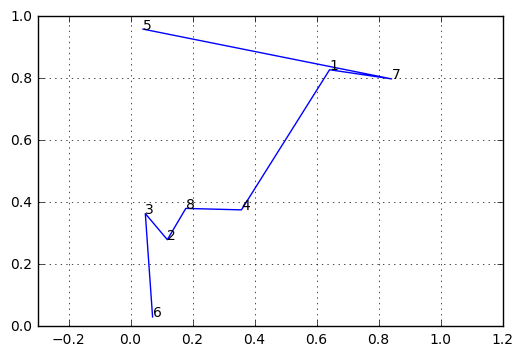

--- 0.0 seconds ---


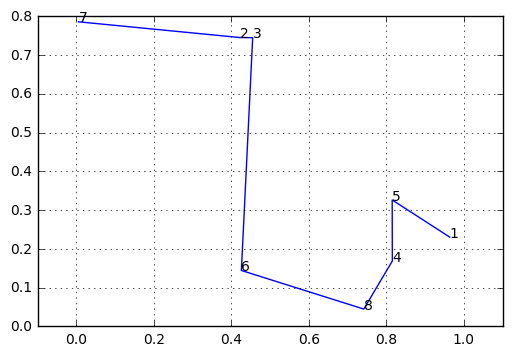

--- 0.0 seconds ---


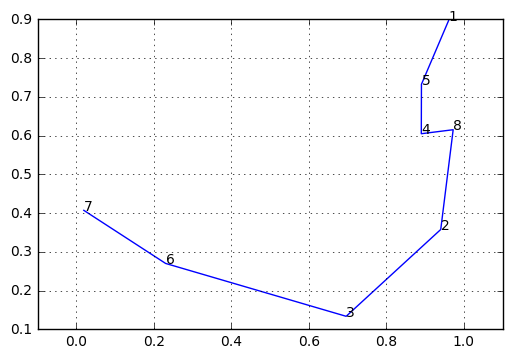

--- 0.0 seconds ---


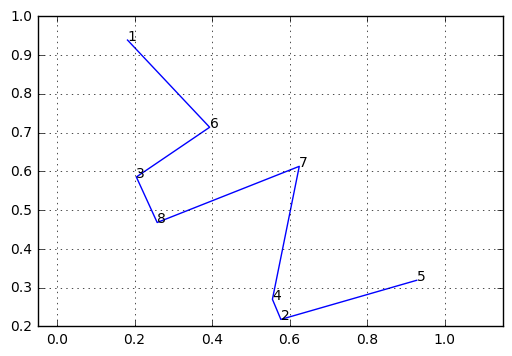

--- 0.0 seconds ---


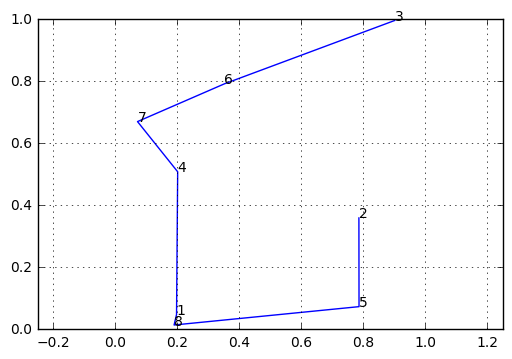

--- 0.0 seconds ---


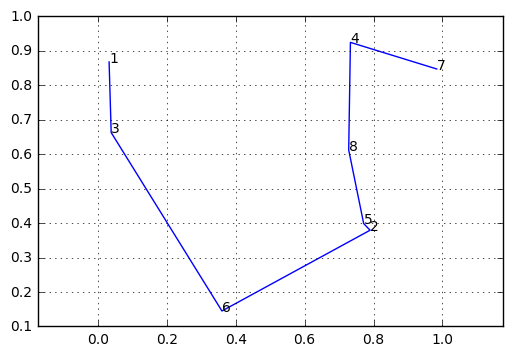

--- 0.0 seconds ---


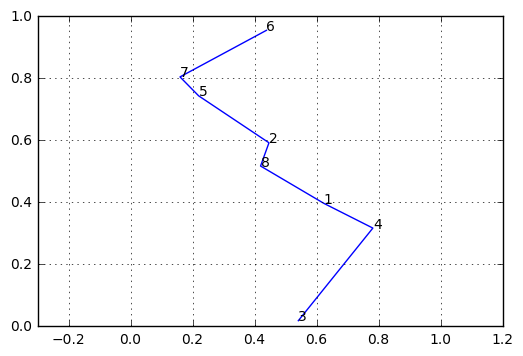

--- 0.0 seconds ---


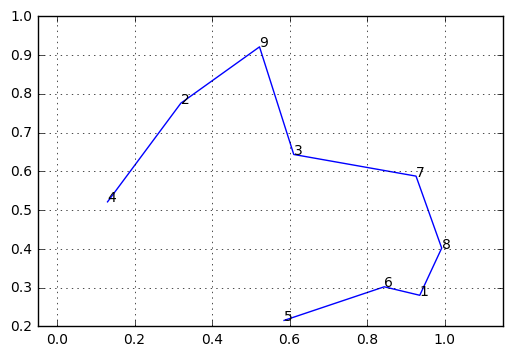

--- 0.0005004405975341797 seconds ---


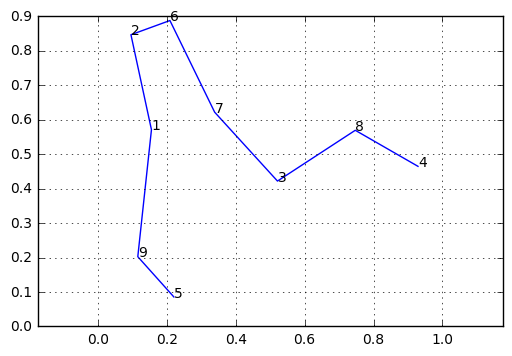

--- 0.0 seconds ---


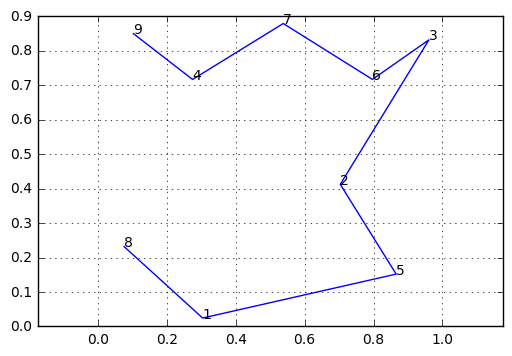

--- 0.0 seconds ---


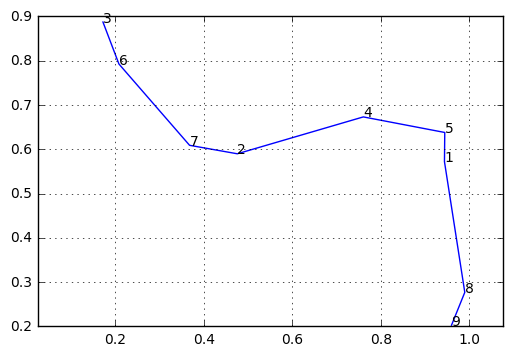

--- 0.0 seconds ---


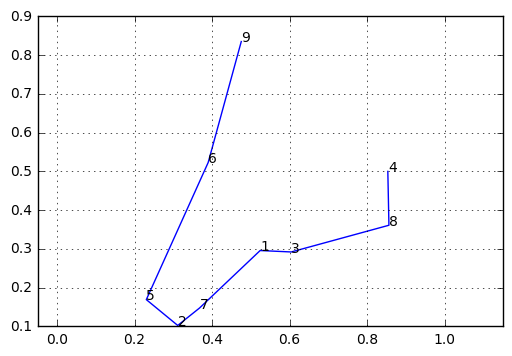

--- 0.0 seconds ---


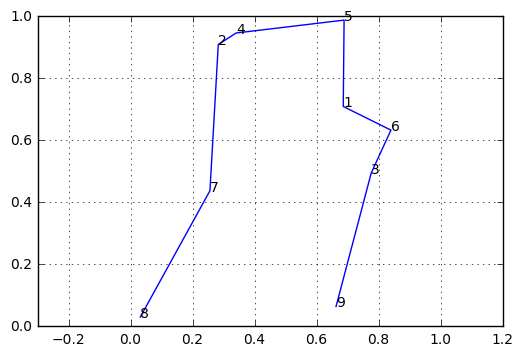

--- 0.0 seconds ---


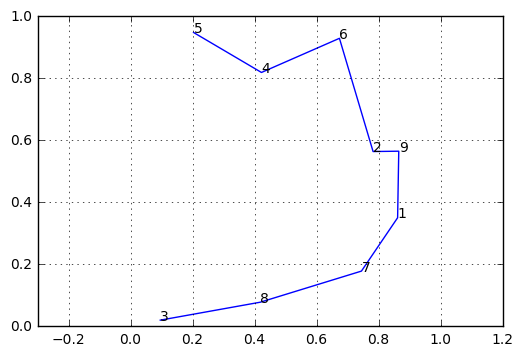

--- 0.0 seconds ---


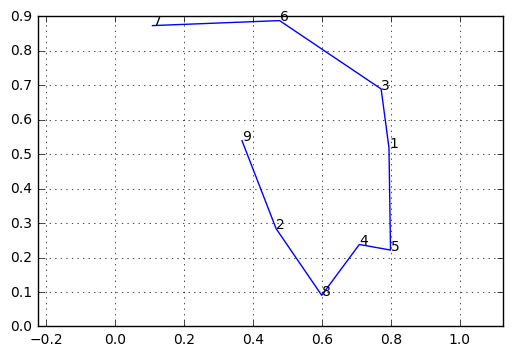

--- 0.0 seconds ---


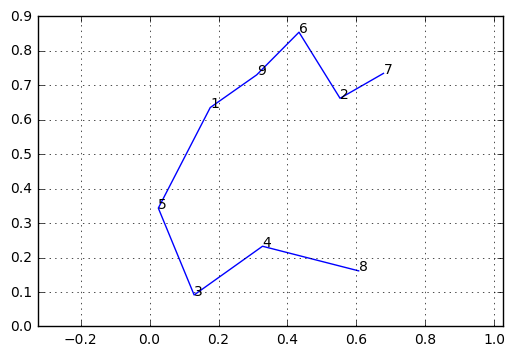

--- 0.0 seconds ---


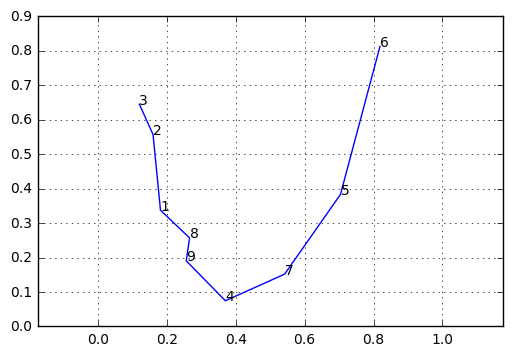

--- 0.0004999637603759766 seconds ---


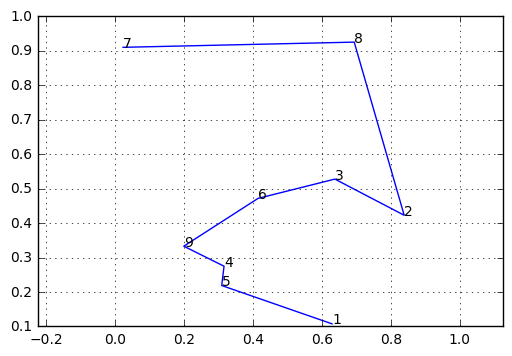

--- 0.0005002021789550781 seconds ---


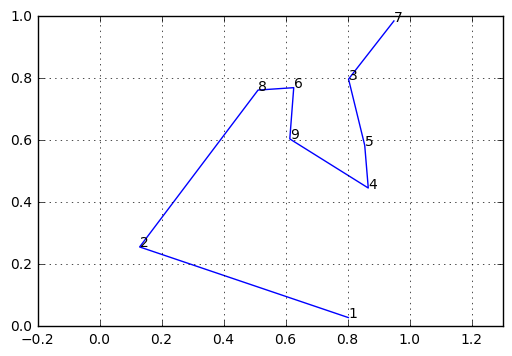

--- 0.0 seconds ---


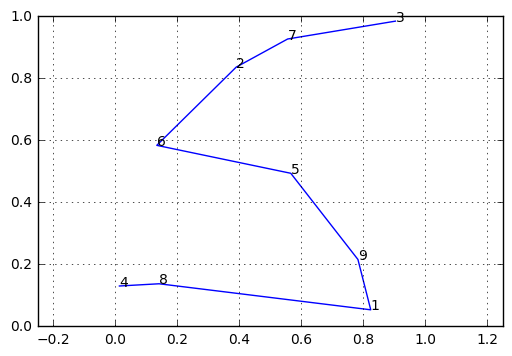

--- 0.0 seconds ---


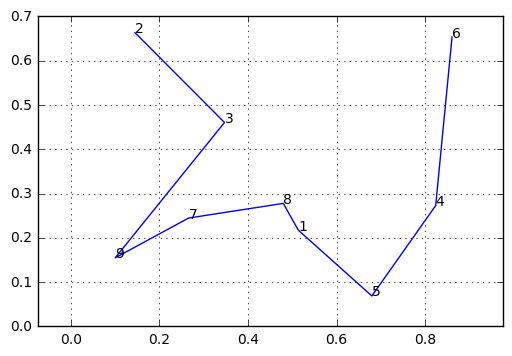

--- 0.0 seconds ---


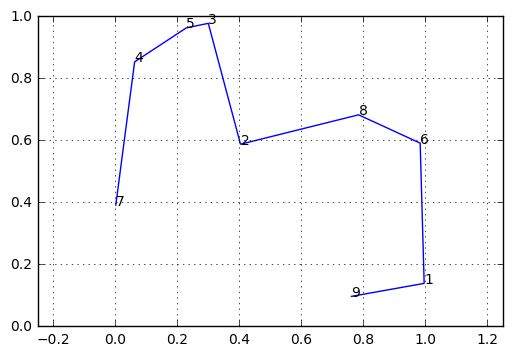

--- 0.0004999637603759766 seconds ---


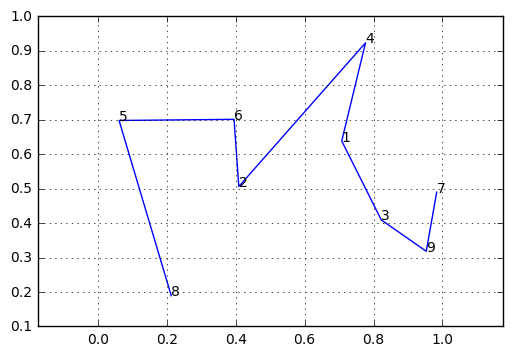

--- 0.0 seconds ---


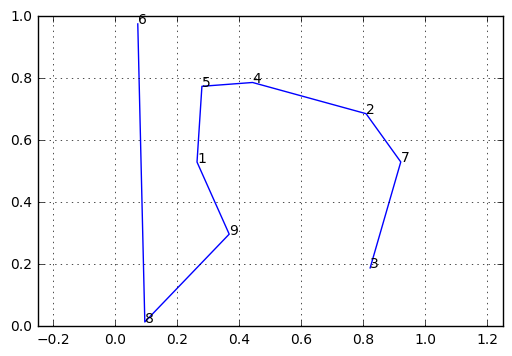

--- 0.0 seconds ---


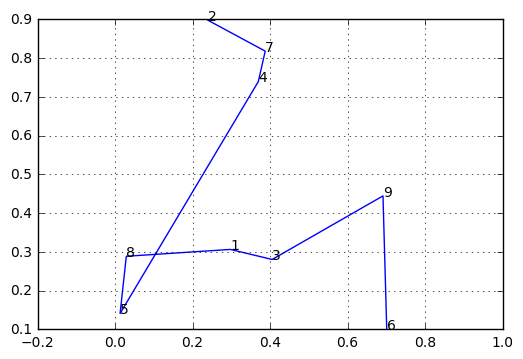

--- 0.0 seconds ---


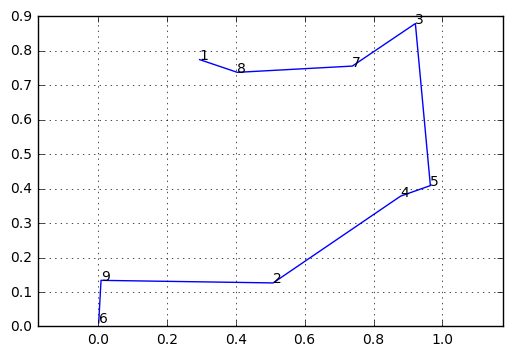

--- 0.0 seconds ---


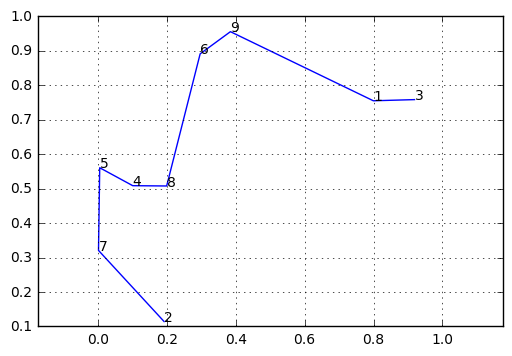

--- 0.0004999637603759766 seconds ---


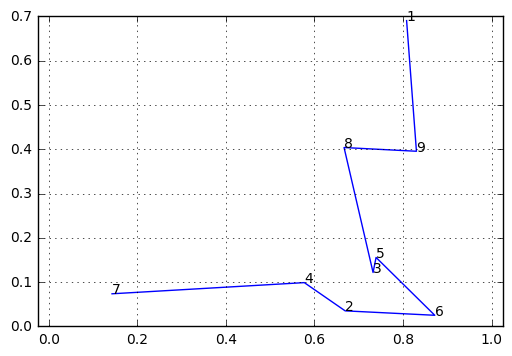

--- 0.0005004405975341797 seconds ---


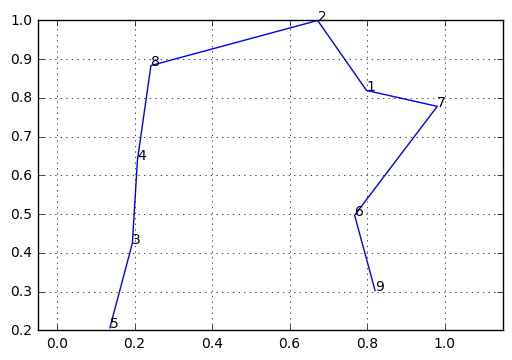

--- 0.0005002021789550781 seconds ---


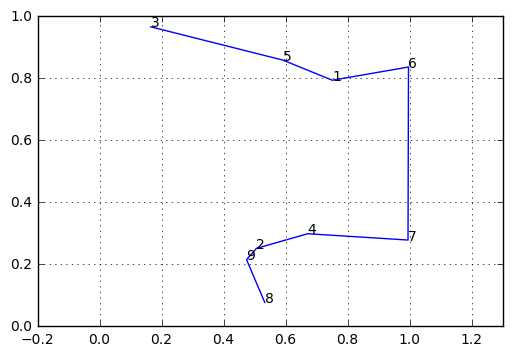

--- 0.0 seconds ---


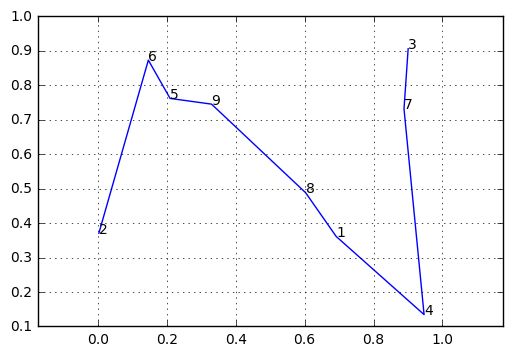

--- 0.0 seconds ---


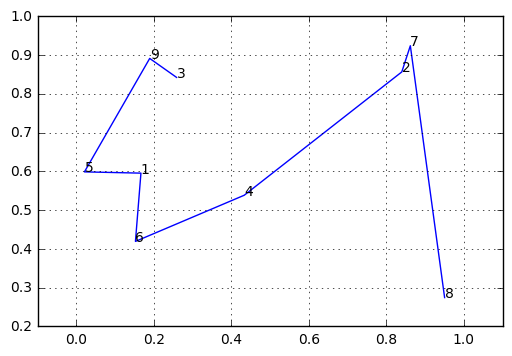

--- 0.0 seconds ---


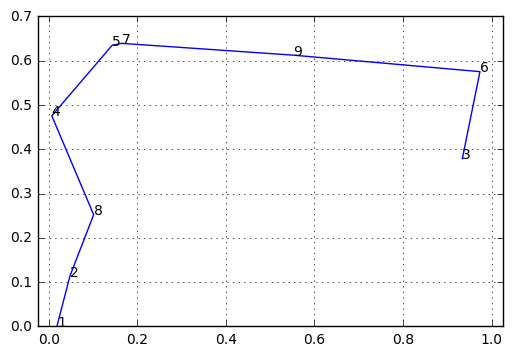

--- 0.0 seconds ---


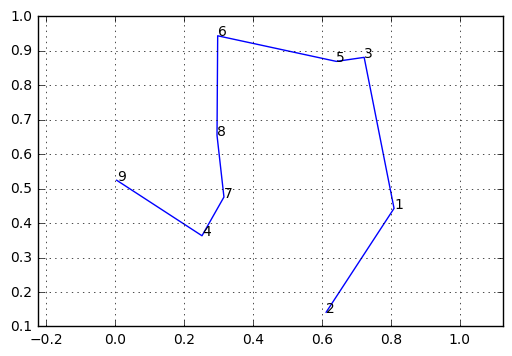

--- 0.0 seconds ---


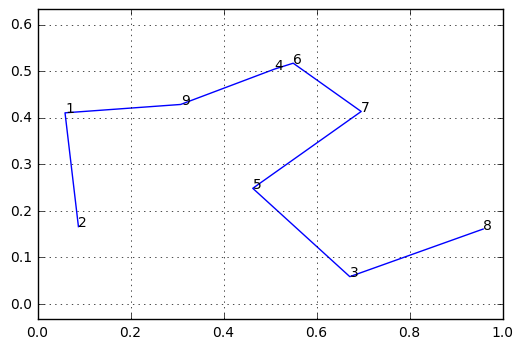

--- 0.0005006790161132812 seconds ---


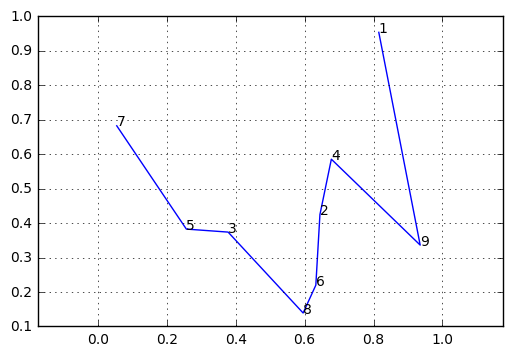

--- 0.0 seconds ---


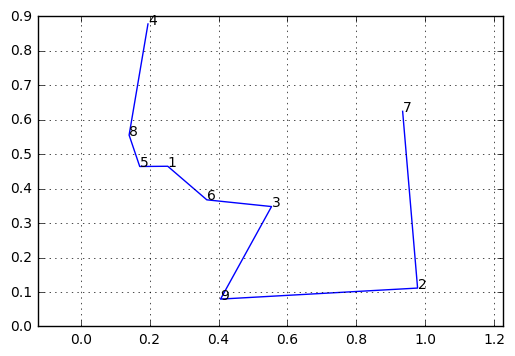

--- 0.0 seconds ---


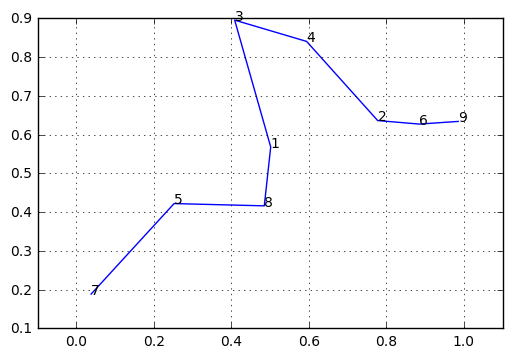

--- 0.0 seconds ---


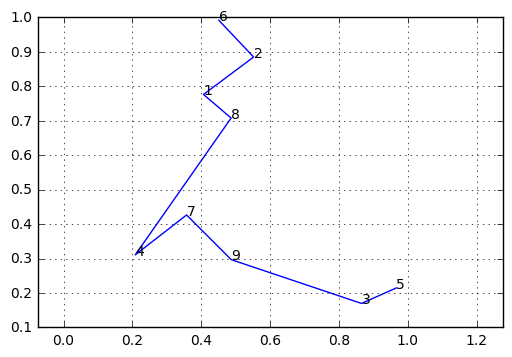

--- 0.0 seconds ---


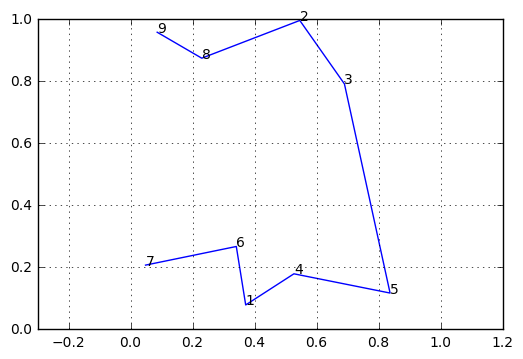

--- 0.0 seconds ---


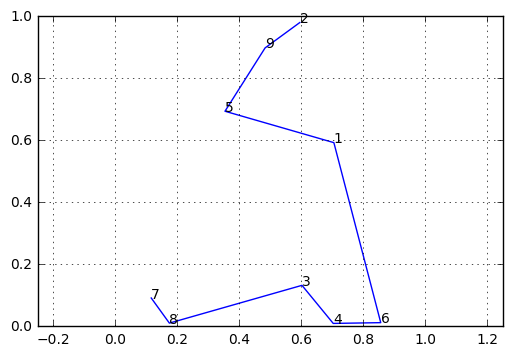

--- 0.0 seconds ---


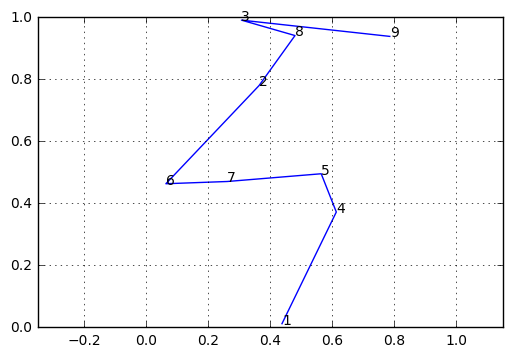

--- 0.0 seconds ---


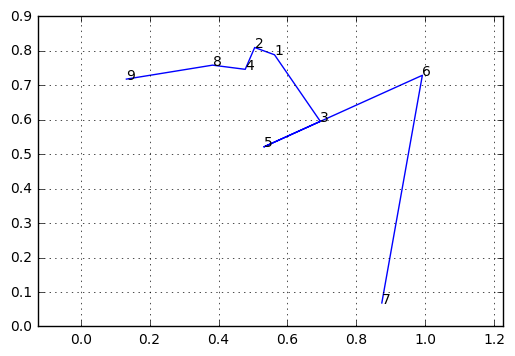

--- 0.0 seconds ---


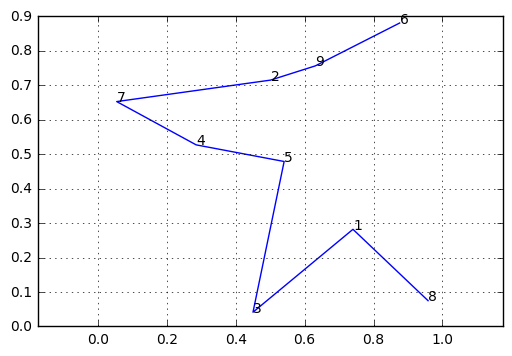

--- 0.0004999637603759766 seconds ---


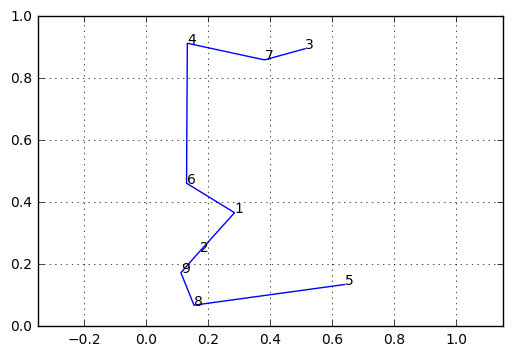

--- 0.0 seconds ---


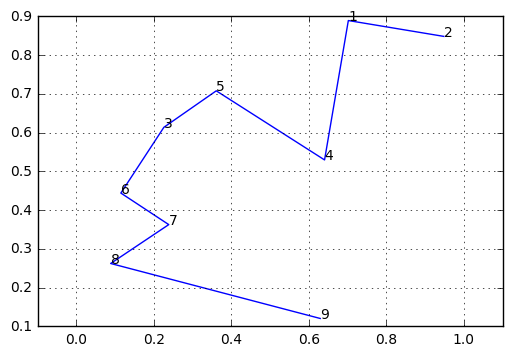

--- 0.0 seconds ---


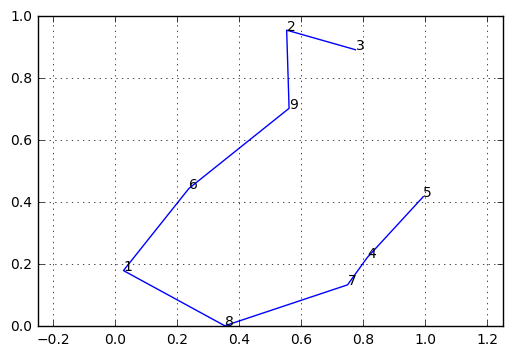

--- 0.0 seconds ---


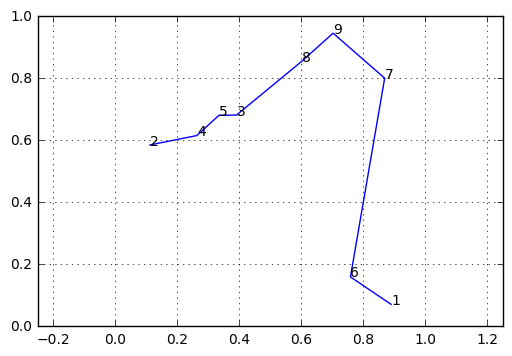

--- 0.0 seconds ---


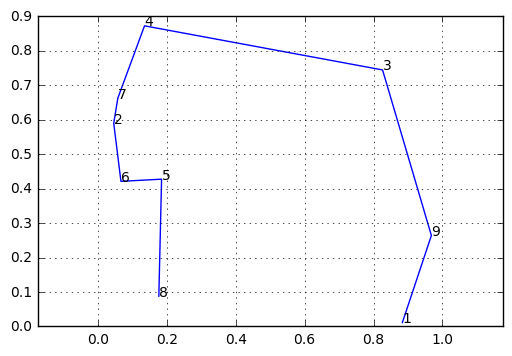

--- 0.0 seconds ---


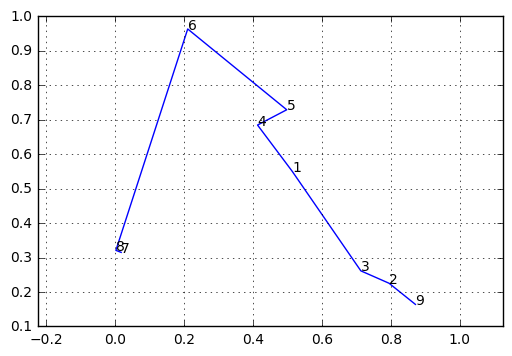

--- 0.0 seconds ---


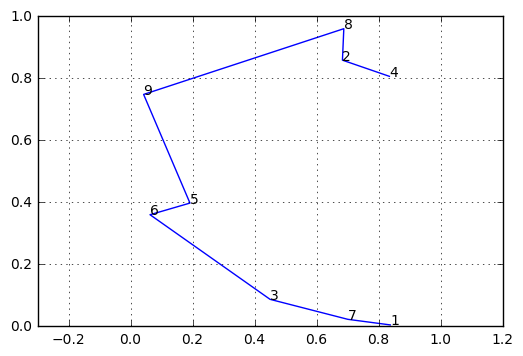

--- 0.0 seconds ---


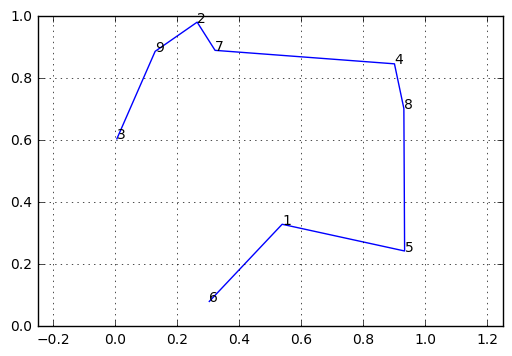

--- 0.0 seconds ---


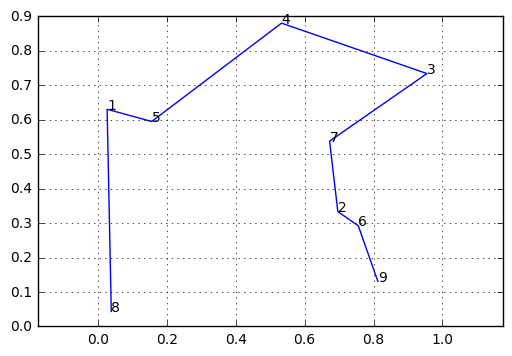

--- 0.0005021095275878906 seconds ---


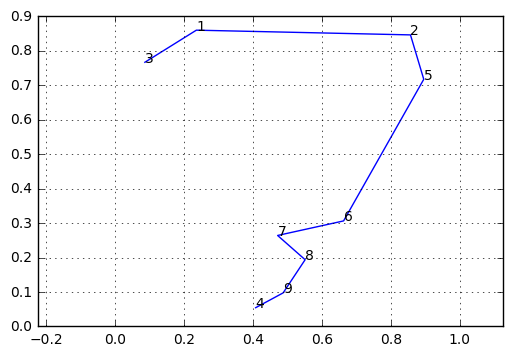

--- 0.0 seconds ---


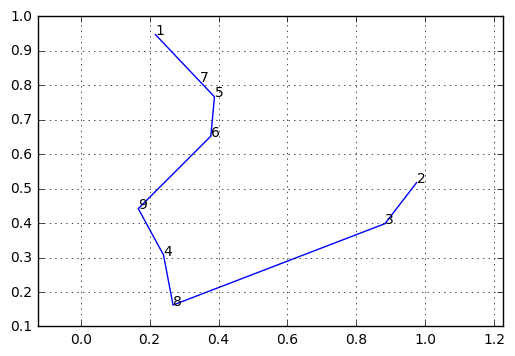

--- 0.0 seconds ---


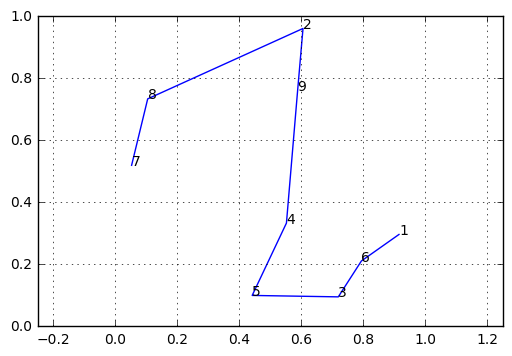

--- 0.0 seconds ---


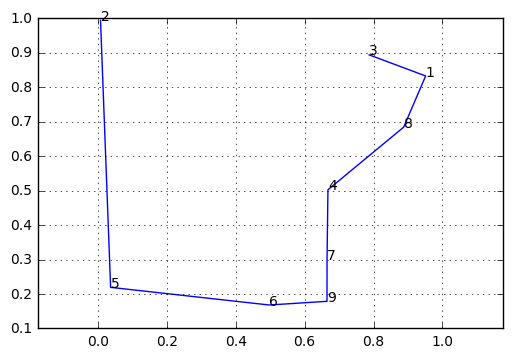

--- 0.0 seconds ---


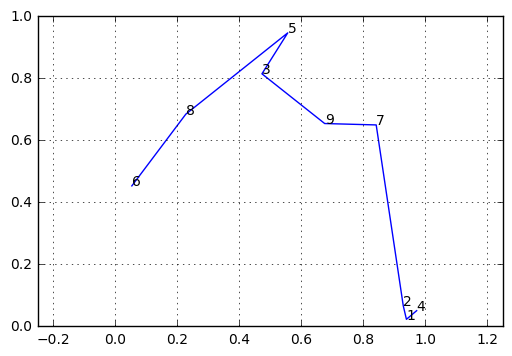

--- 0.0005004405975341797 seconds ---


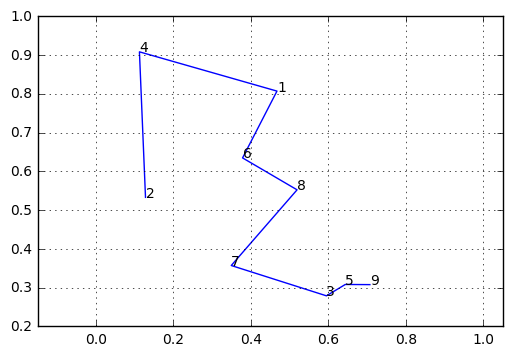

--- 0.0 seconds ---


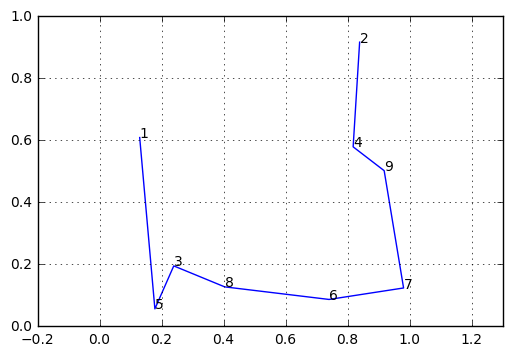

--- 0.0005002021789550781 seconds ---


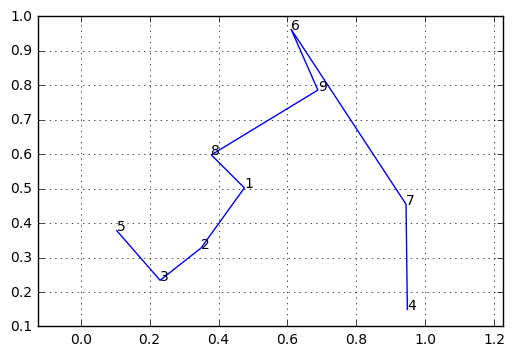

--- 0.0 seconds ---


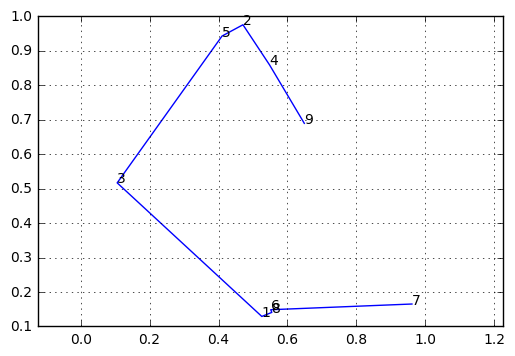

--- 0.0 seconds ---


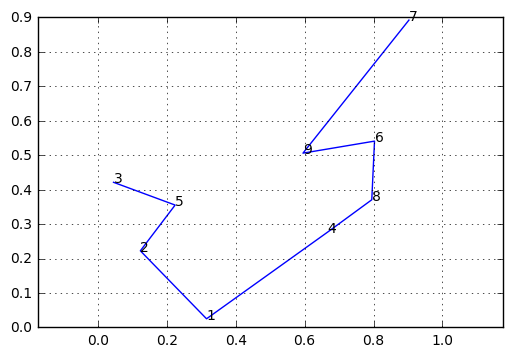

--- 0.0 seconds ---


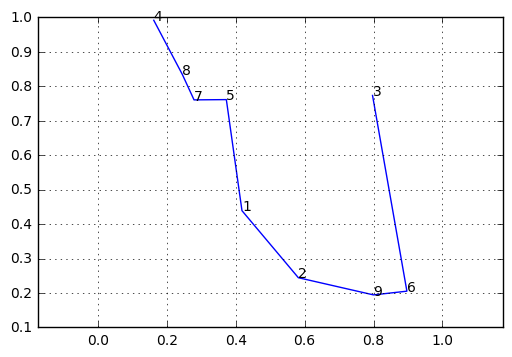

--- 0.0 seconds ---


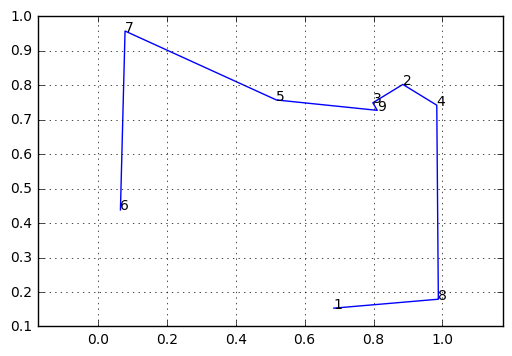

--- 0.0 seconds ---


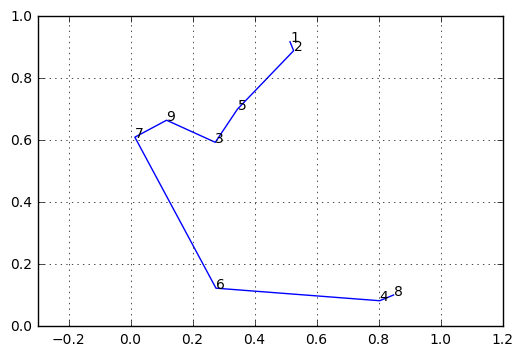

--- 0.0 seconds ---


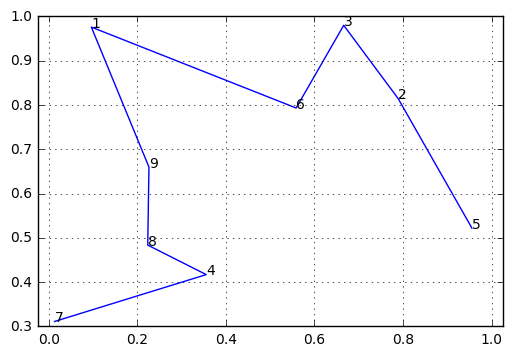

--- 0.0005004405975341797 seconds ---


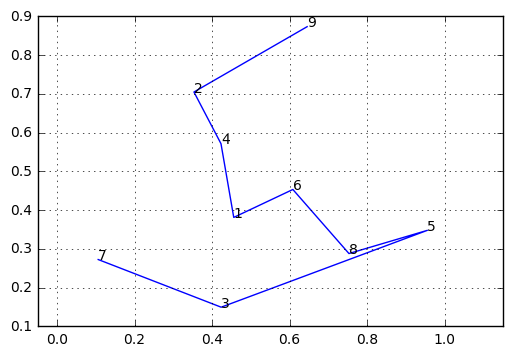

--- 0.0 seconds ---


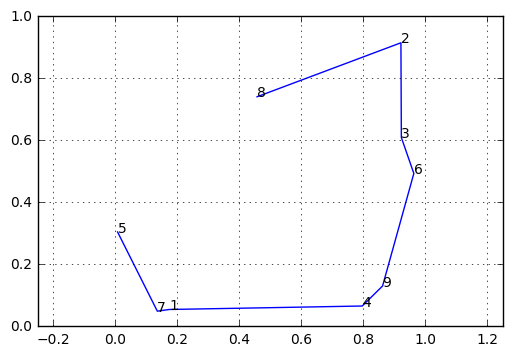

--- 0.0 seconds ---


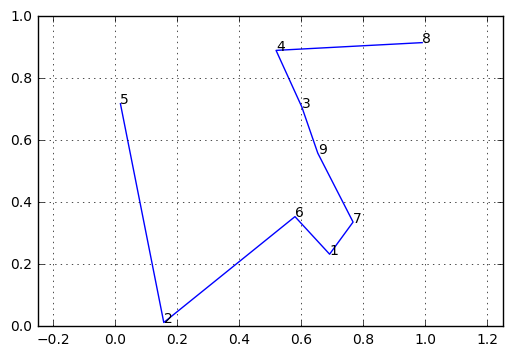

--- 0.0004994869232177734 seconds ---


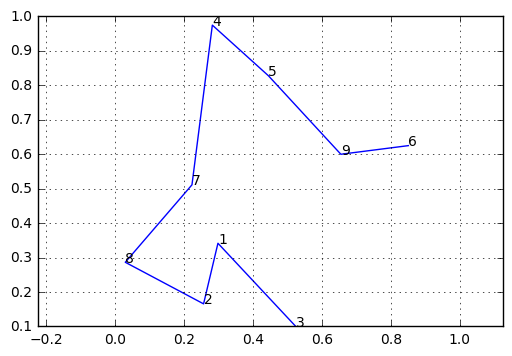

--- 0.0 seconds ---


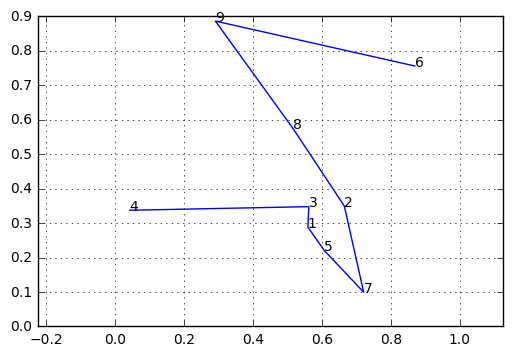

--- 0.0 seconds ---


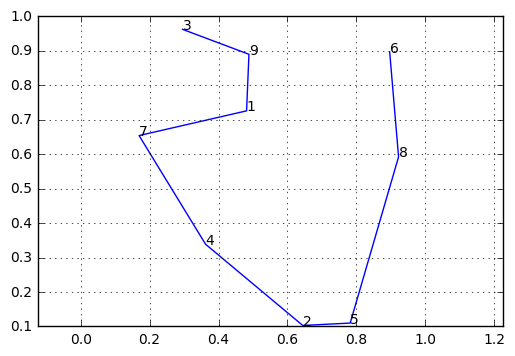

--- 0.0 seconds ---


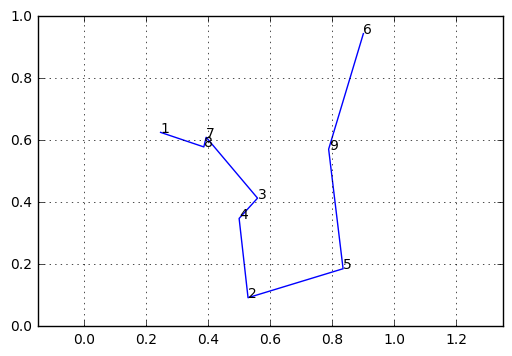

--- 0.0005006790161132812 seconds ---


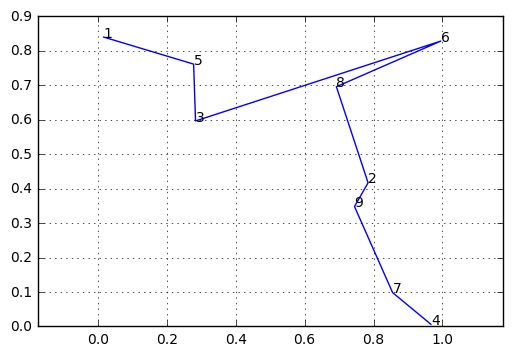

--- 0.0 seconds ---


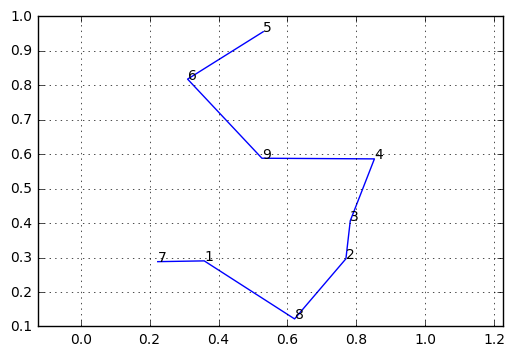

--- 0.0 seconds ---


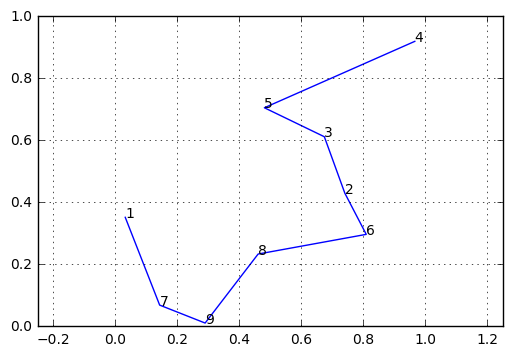

--- 0.0 seconds ---


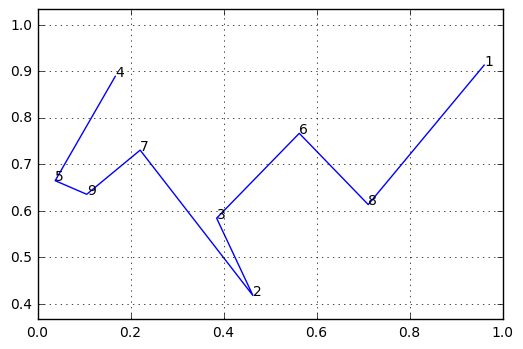

--- 0.0 seconds ---


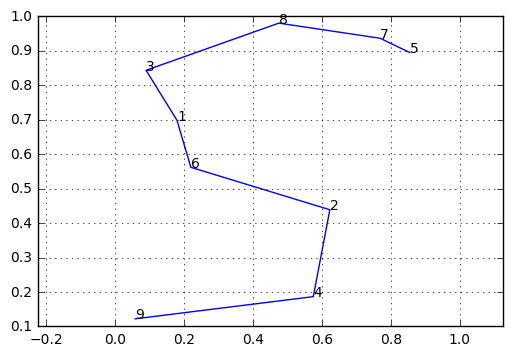

--- 0.0 seconds ---


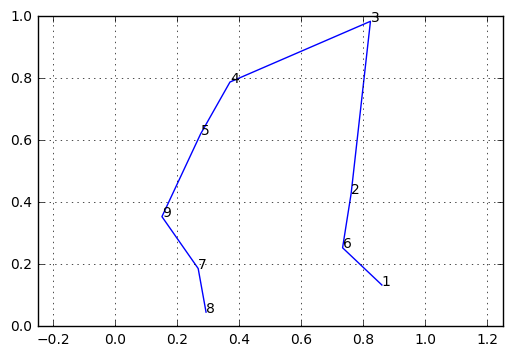

--- 0.0 seconds ---


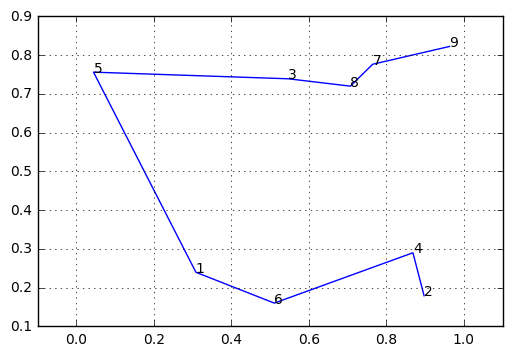

--- 0.0 seconds ---


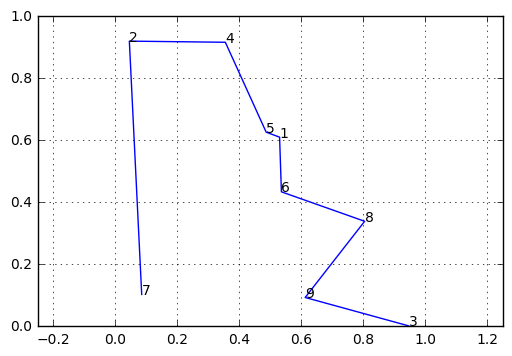

--- 0.0 seconds ---


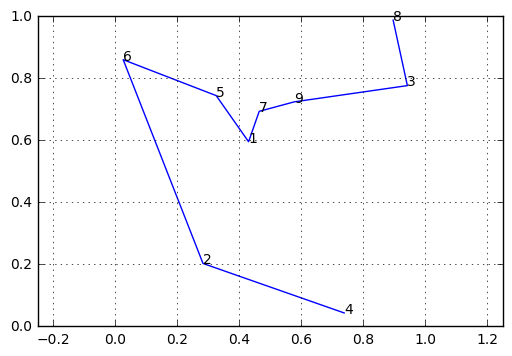

--- 0.0005004405975341797 seconds ---


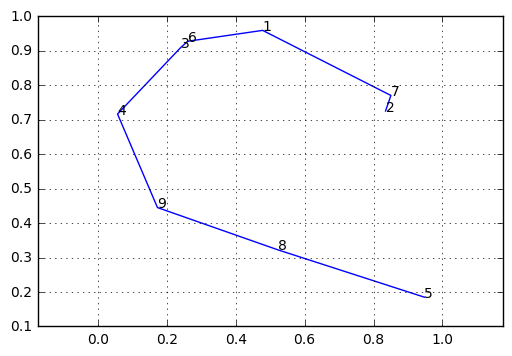

--- 0.0 seconds ---


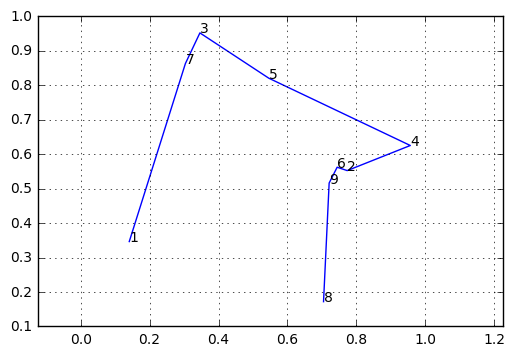

--- 0.0 seconds ---


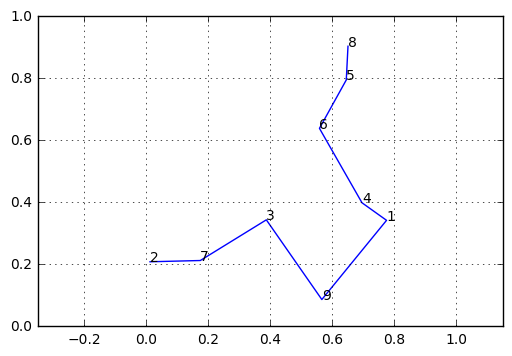

--- 0.0 seconds ---


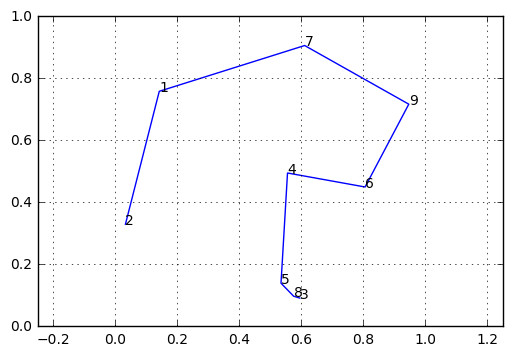

--- 0.0 seconds ---


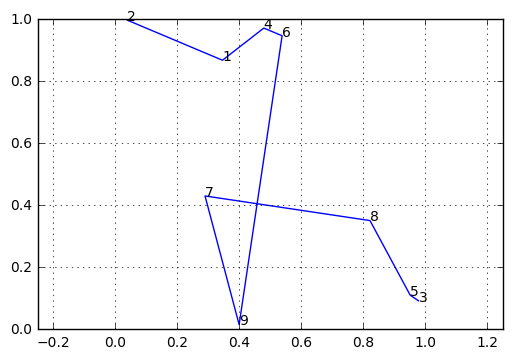

--- 0.0 seconds ---


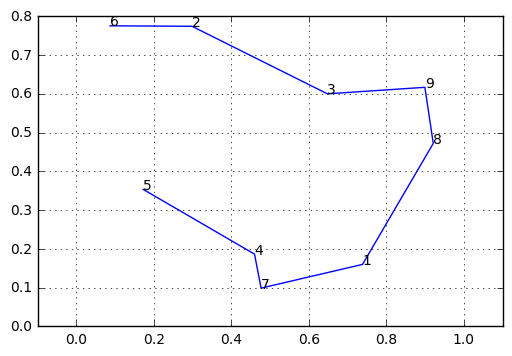

--- 0.0 seconds ---


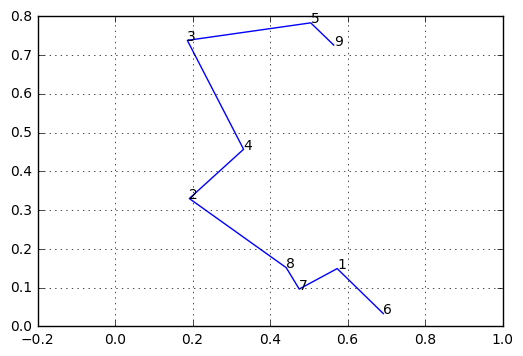

--- 0.0 seconds ---


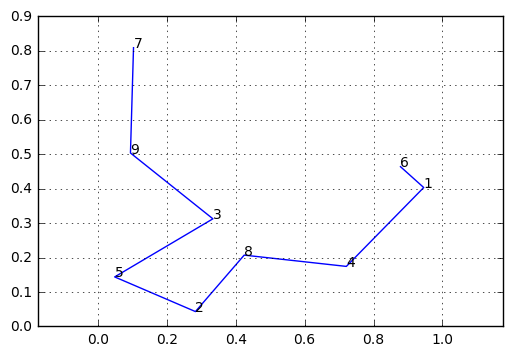

--- 0.0004999637603759766 seconds ---


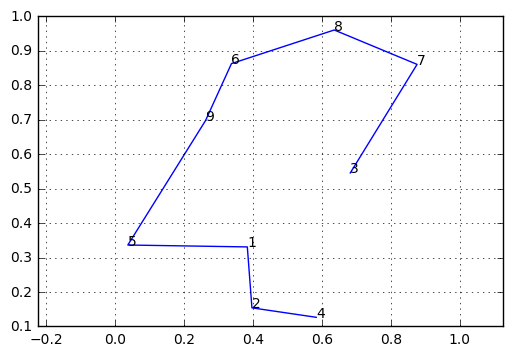

--- 0.0005009174346923828 seconds ---


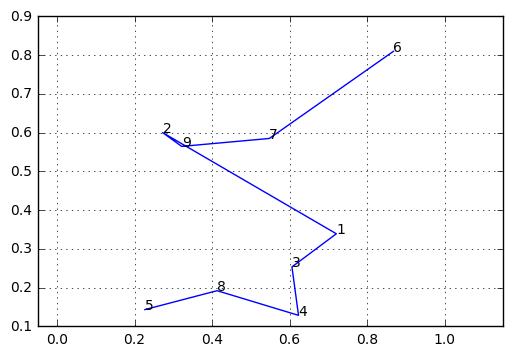

--- 0.0 seconds ---


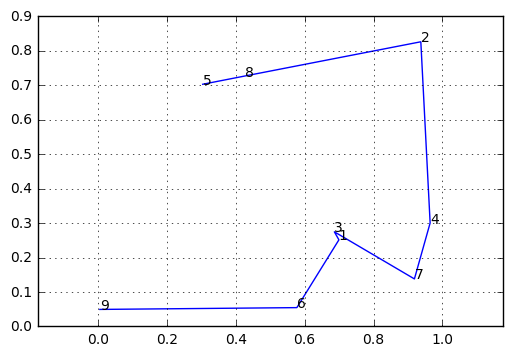

--- 0.0 seconds ---


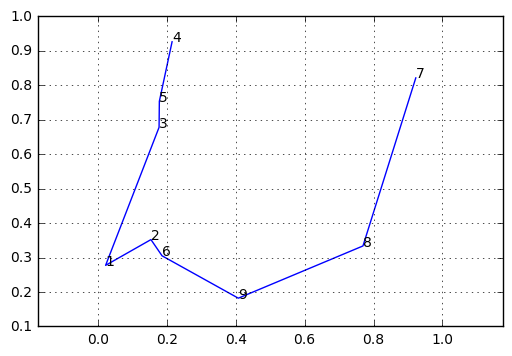

--- 0.0 seconds ---


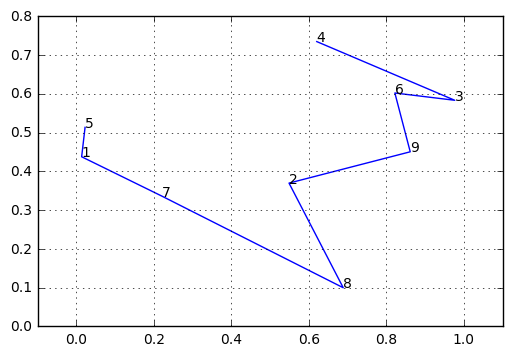

--- 0.0 seconds ---


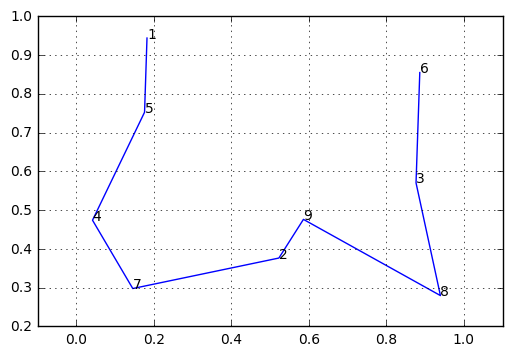

--- 0.0 seconds ---


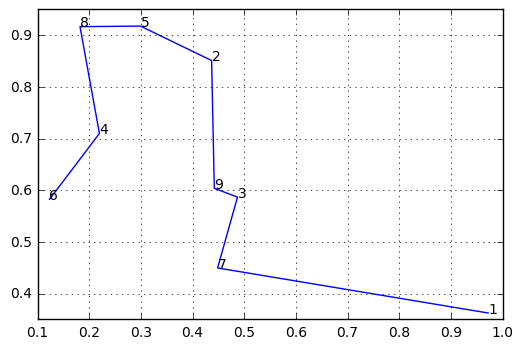

--- 0.0 seconds ---


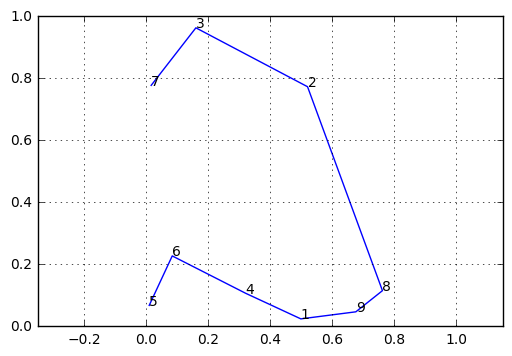

--- 0.0 seconds ---


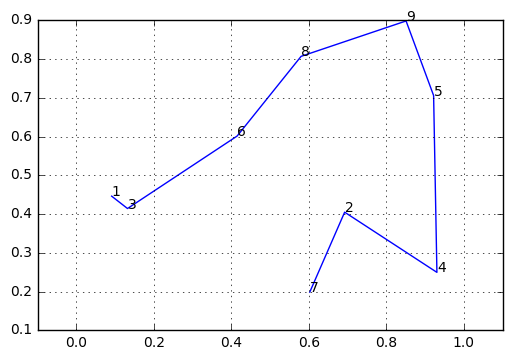

--- 0.0 seconds ---


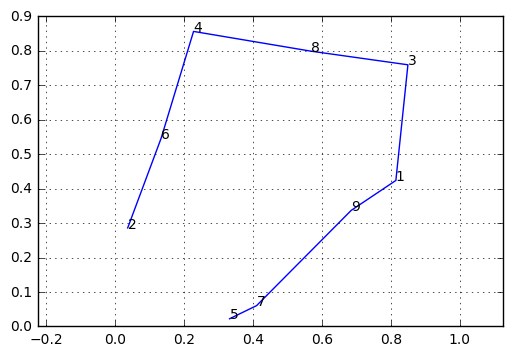

--- 0.0004837512969970703 seconds ---


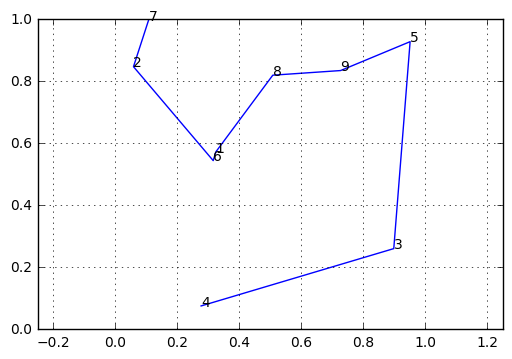

--- 0.0 seconds ---


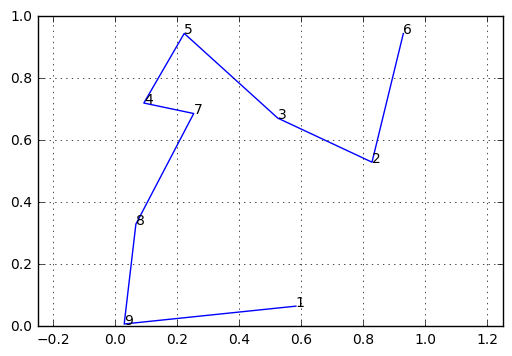

--- 0.0 seconds ---


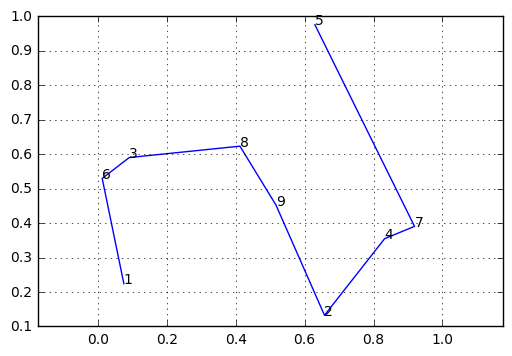

--- 0.0 seconds ---


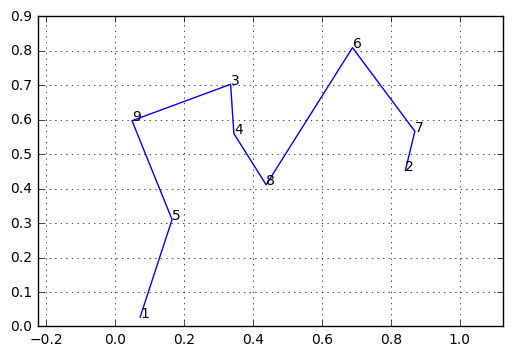

--- 0.0 seconds ---


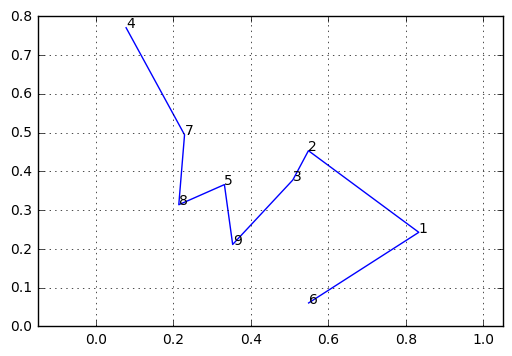

--- 0.0004999637603759766 seconds ---


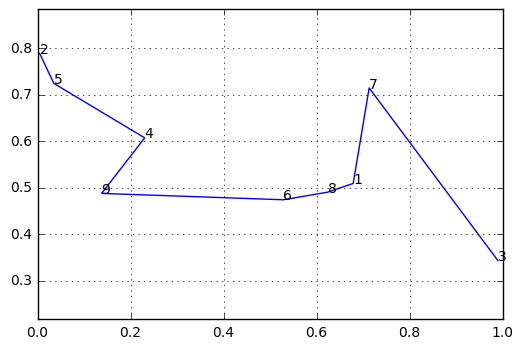

--- 0.0005002021789550781 seconds ---


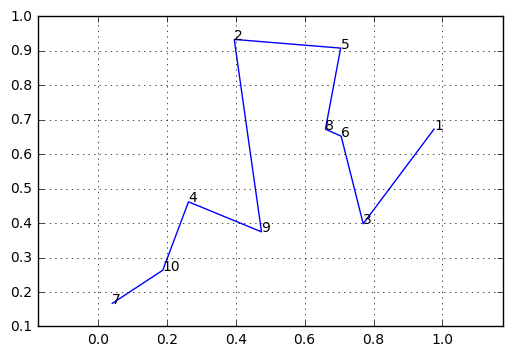

--- 0.0 seconds ---


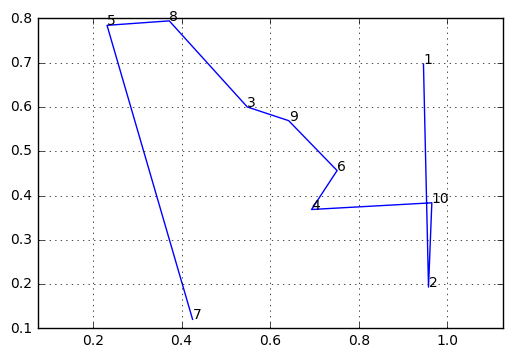

--- 0.0 seconds ---


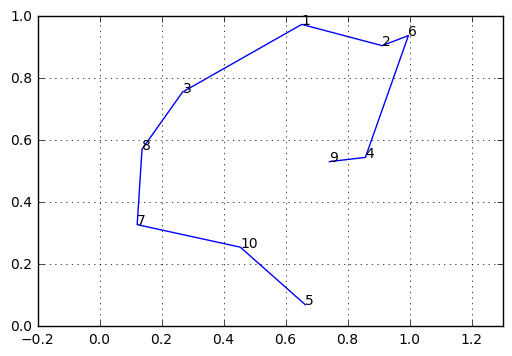

--- 0.0 seconds ---


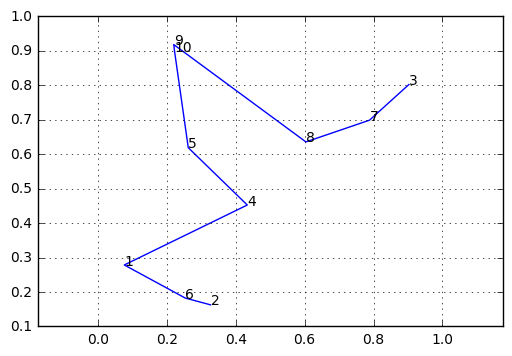

--- 0.0 seconds ---


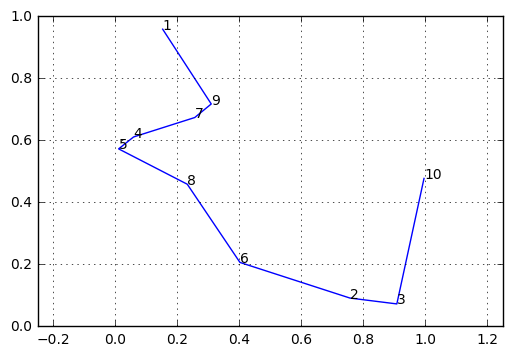

--- 0.0005004405975341797 seconds ---


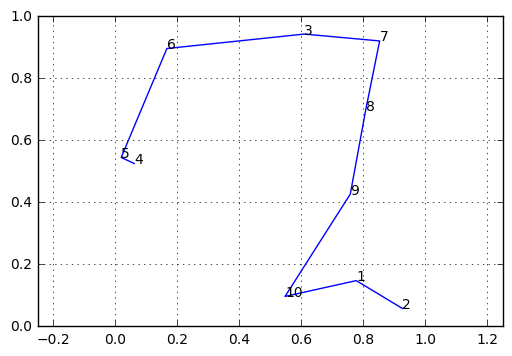

--- 0.0 seconds ---


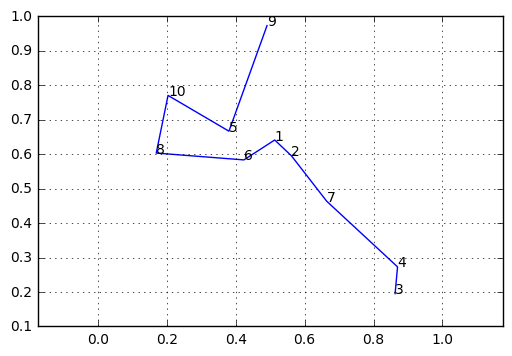

--- 0.0005004405975341797 seconds ---


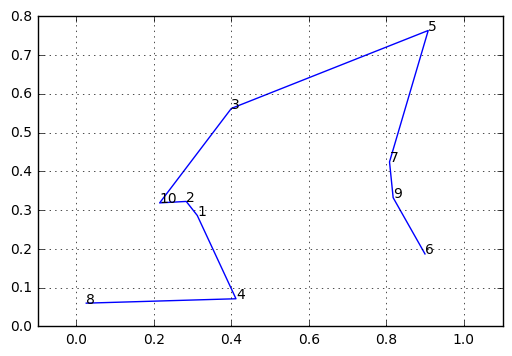

--- 0.0 seconds ---


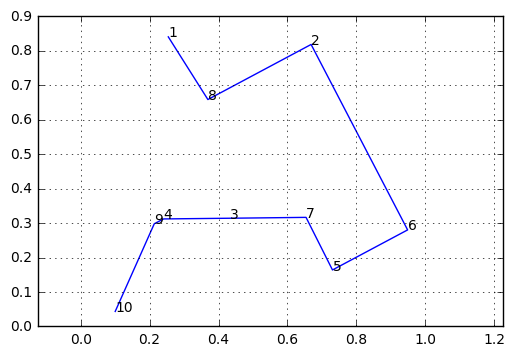

--- 0.0004999637603759766 seconds ---


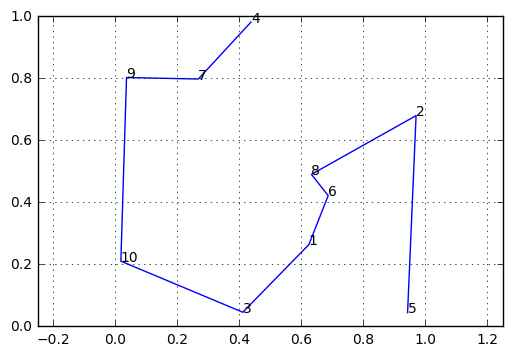

--- 0.0 seconds ---


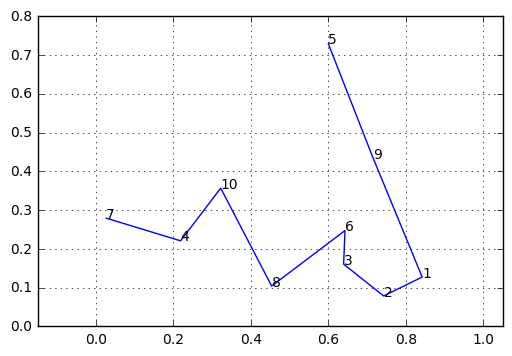

--- 0.0005002021789550781 seconds ---


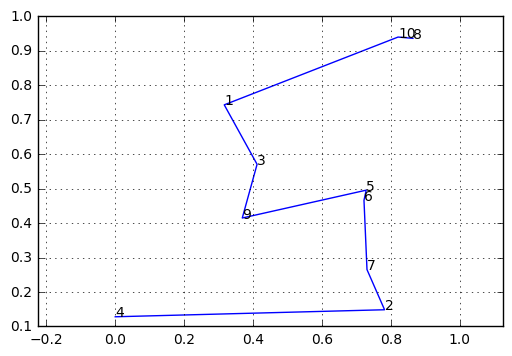

--- 0.0 seconds ---


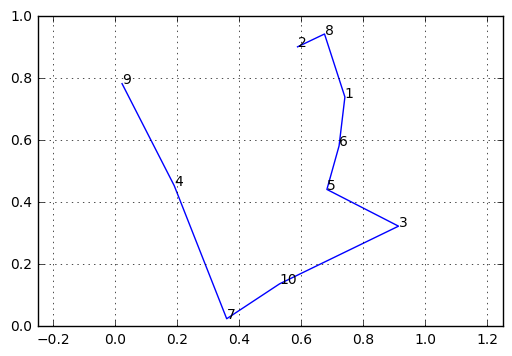

--- 0.0 seconds ---


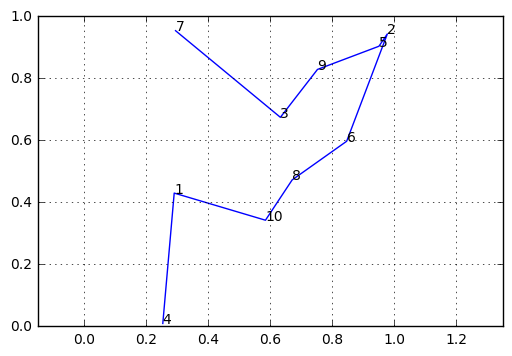

--- 0.0 seconds ---


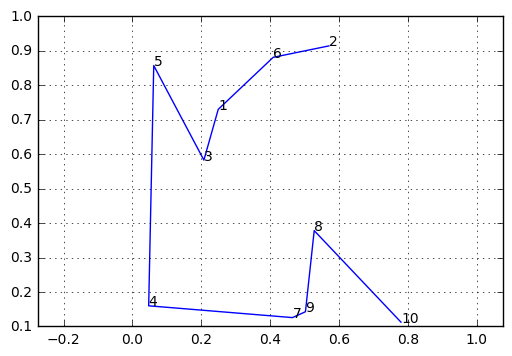

--- 0.0 seconds ---


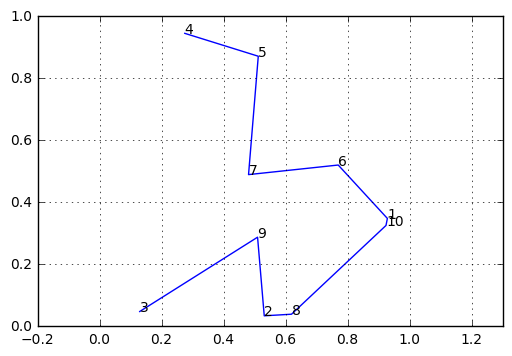

--- 0.0 seconds ---


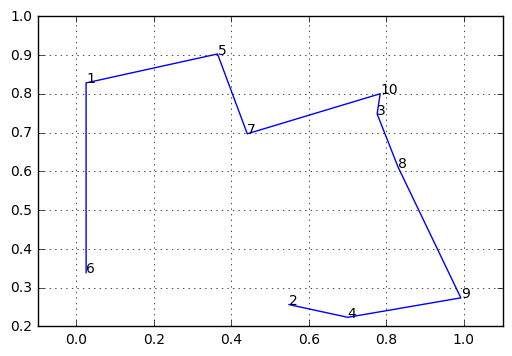

--- 0.0 seconds ---


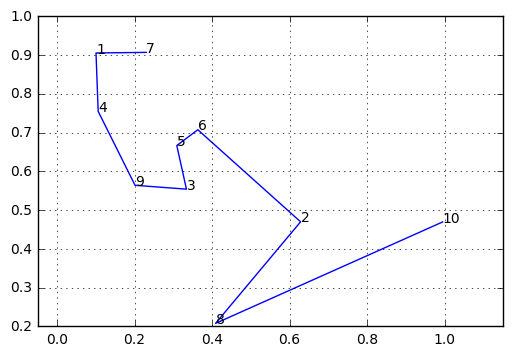

--- 0.0 seconds ---


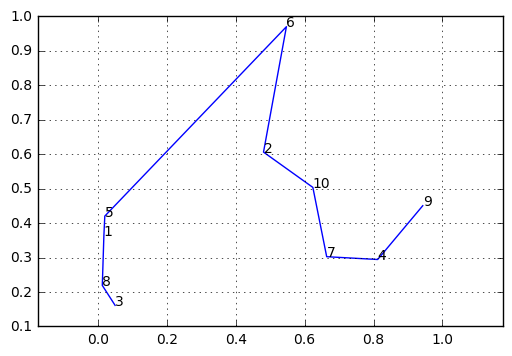

--- 0.0005004405975341797 seconds ---


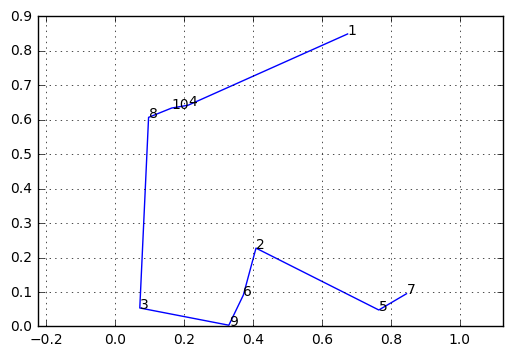

--- 0.0 seconds ---


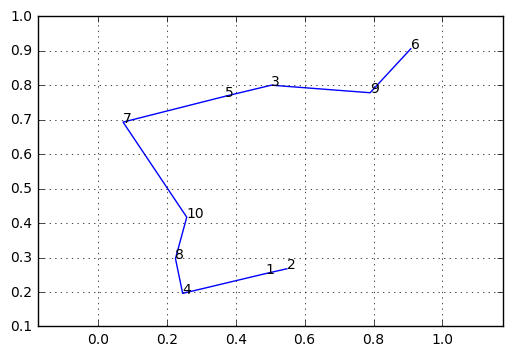

--- 0.0 seconds ---


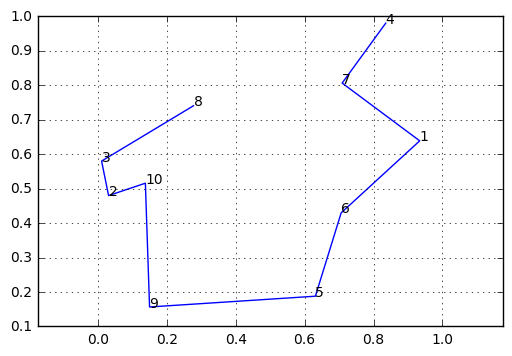

--- 0.0 seconds ---


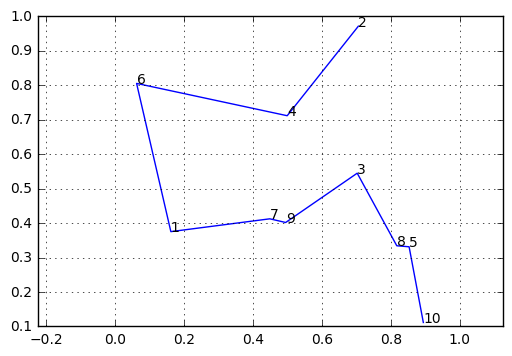

--- 0.0 seconds ---


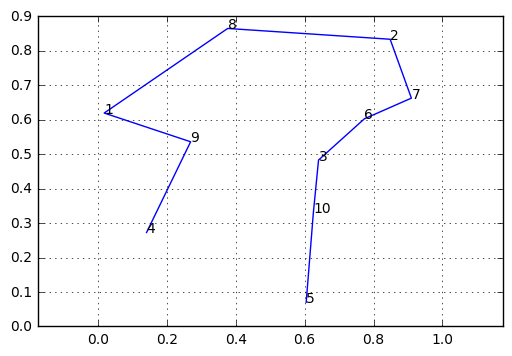

--- 0.0 seconds ---


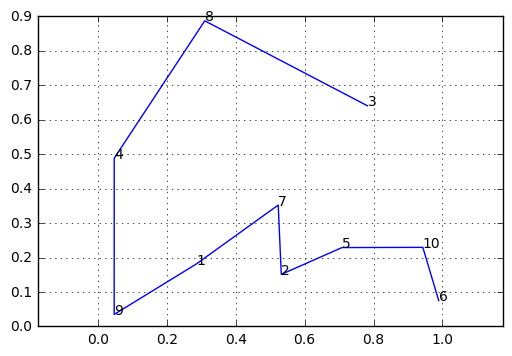

--- 0.0004994869232177734 seconds ---


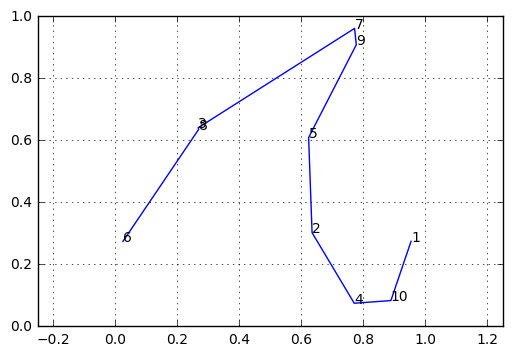

--- 0.0 seconds ---


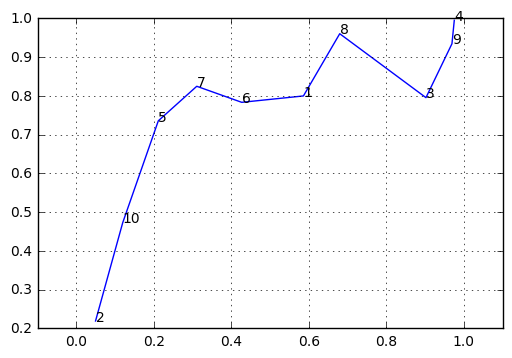

--- 0.0 seconds ---


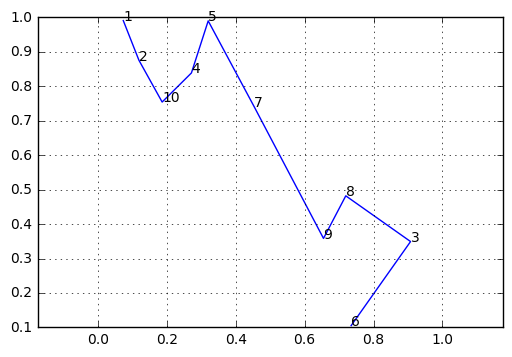

--- 0.0 seconds ---


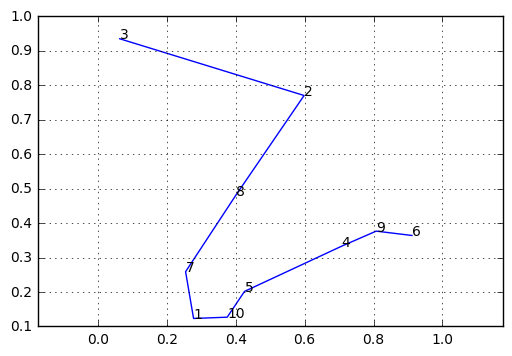

--- 0.0 seconds ---


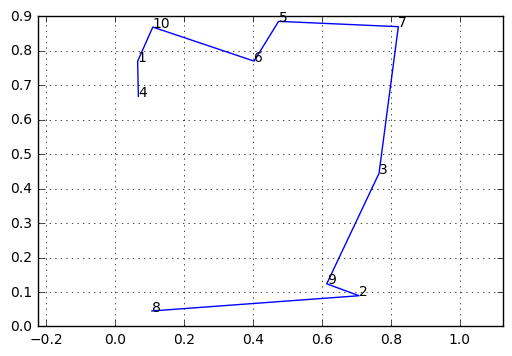

--- 0.0005004405975341797 seconds ---


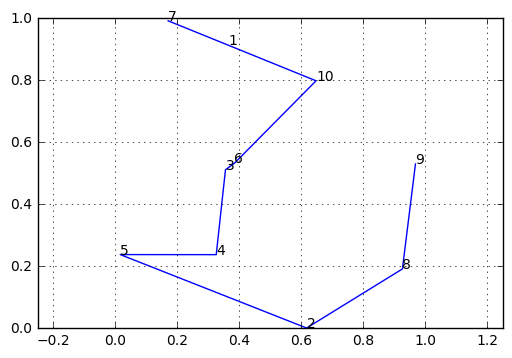

--- 0.0005002021789550781 seconds ---


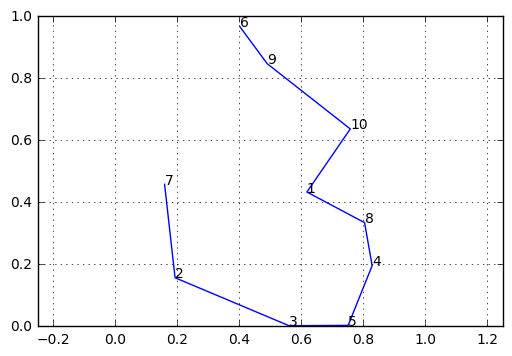

--- 0.0 seconds ---


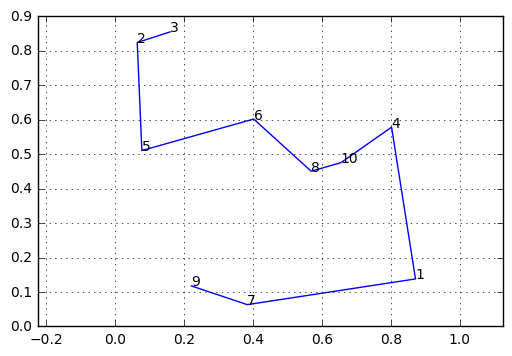

--- 0.0 seconds ---


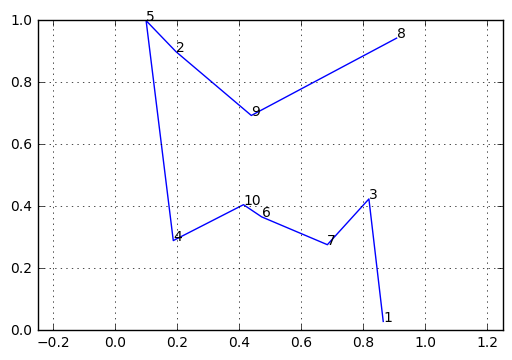

--- 0.0 seconds ---


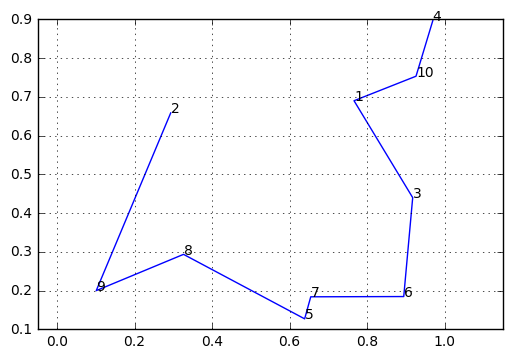

--- 0.0 seconds ---


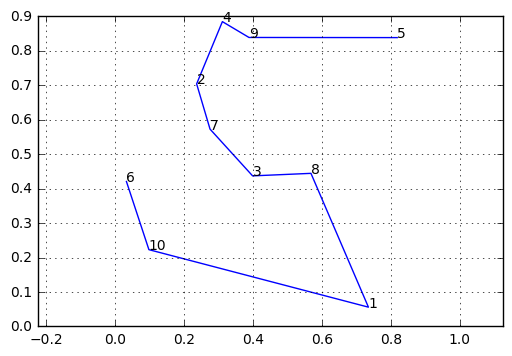

--- 0.0 seconds ---


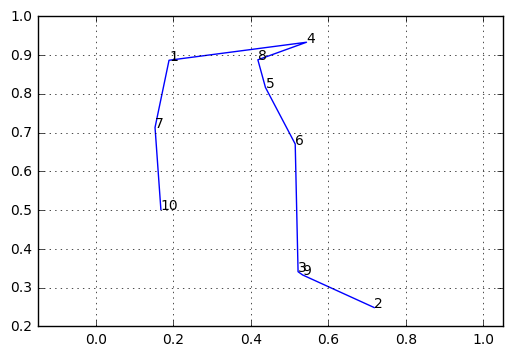

--- 0.0 seconds ---


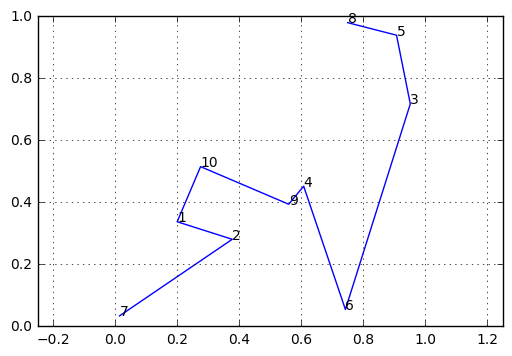

--- 0.0005004405975341797 seconds ---


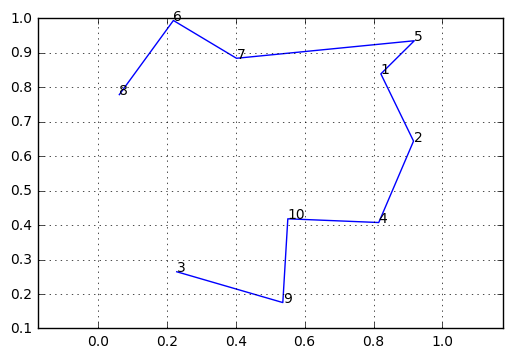

--- 0.0 seconds ---


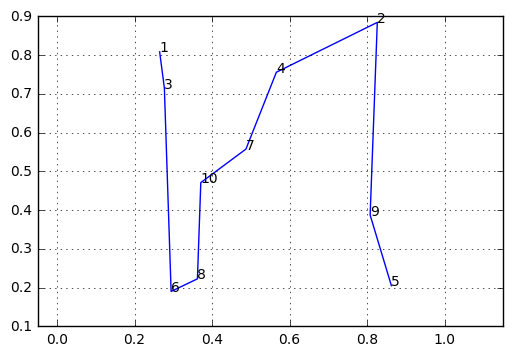

--- 0.0004999637603759766 seconds ---


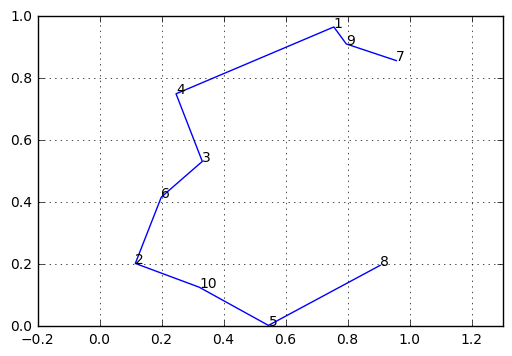

--- 0.0005011558532714844 seconds ---


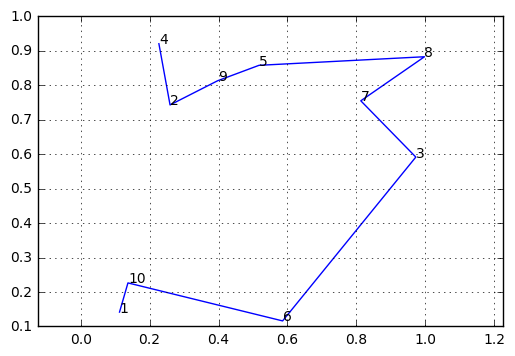

--- 0.0 seconds ---


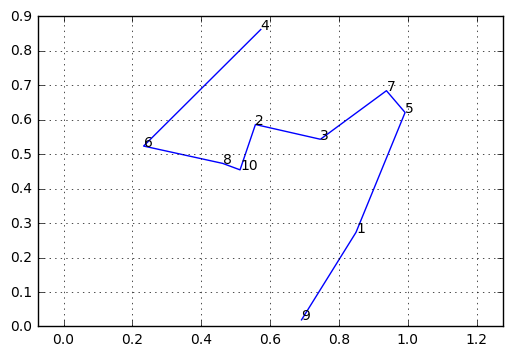

--- 0.0005004405975341797 seconds ---


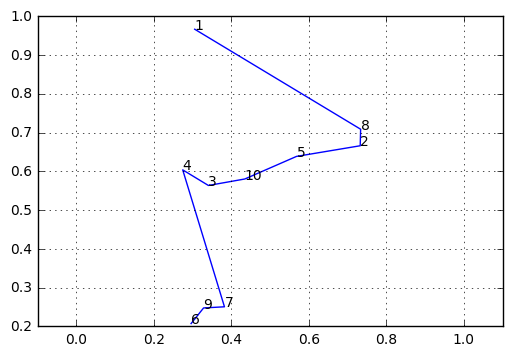

--- 0.0 seconds ---


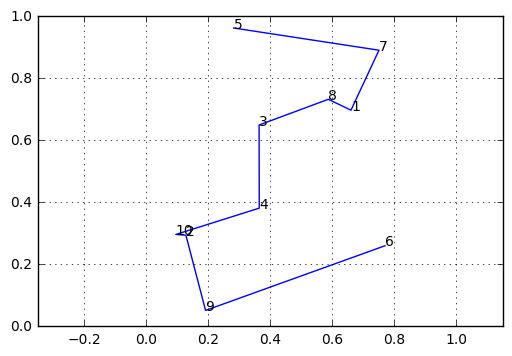

--- 0.0005004405975341797 seconds ---


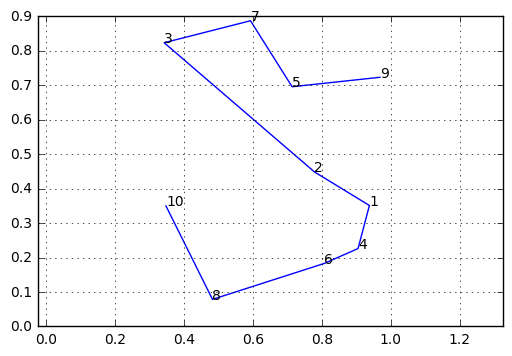

--- 0.0004904270172119141 seconds ---


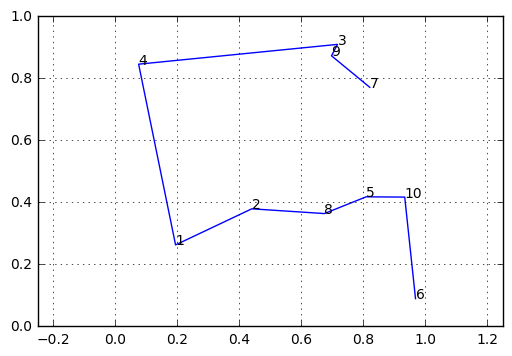

--- 0.0 seconds ---


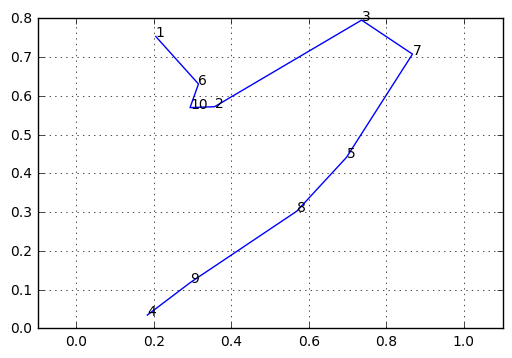

--- 0.0004951953887939453 seconds ---


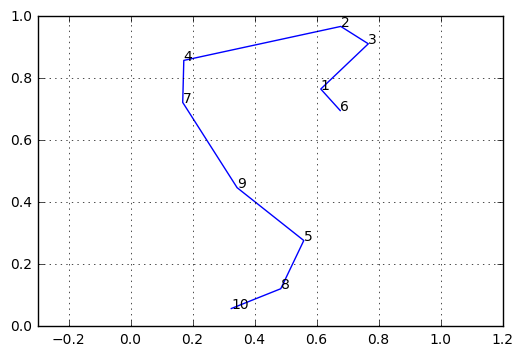

--- 0.0 seconds ---


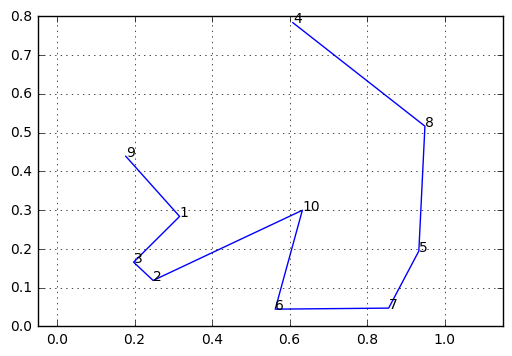

--- 0.0 seconds ---


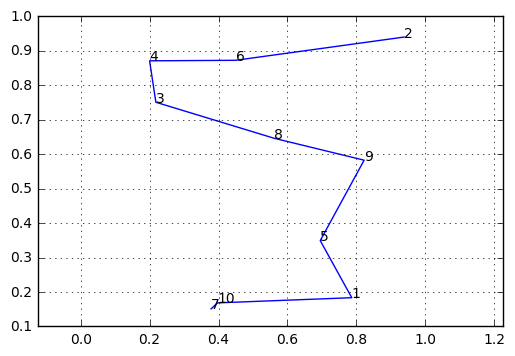

--- 0.0 seconds ---


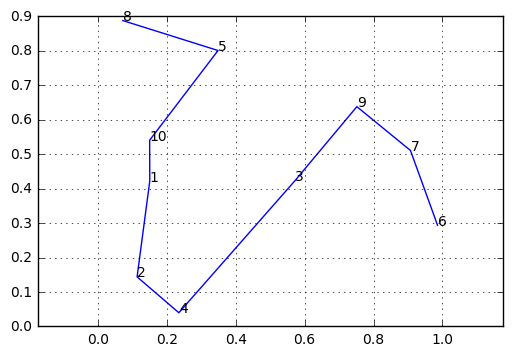

--- 0.0 seconds ---


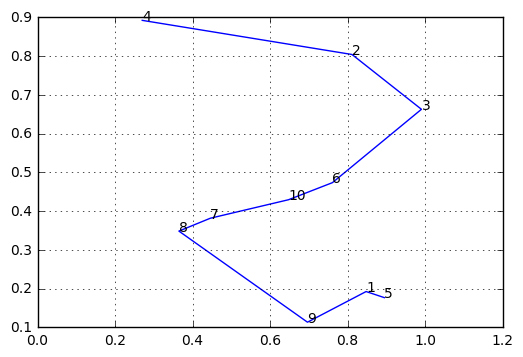

--- 0.0010006427764892578 seconds ---


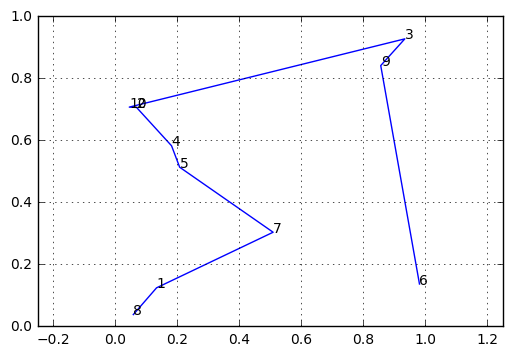

--- 0.0 seconds ---


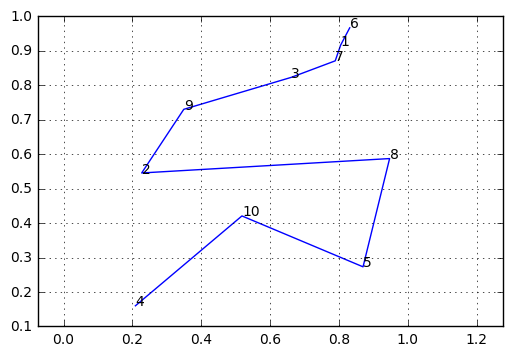

--- 0.0 seconds ---


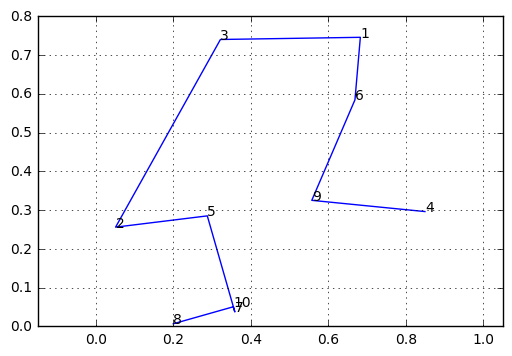

--- 0.0 seconds ---


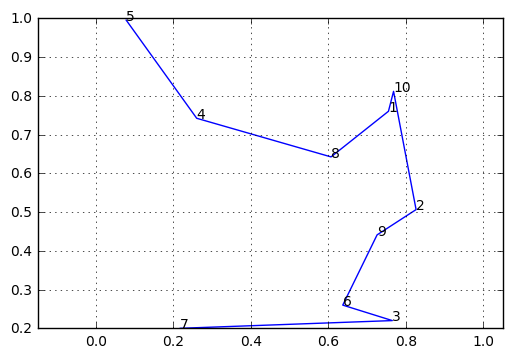

--- 0.0004999637603759766 seconds ---


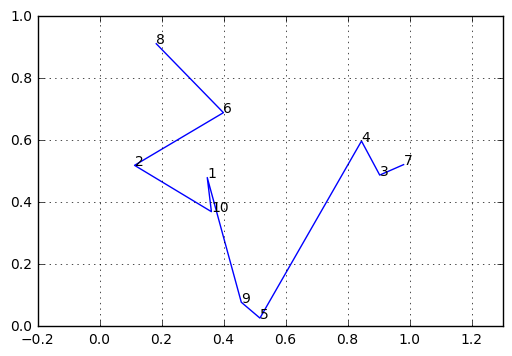

--- 0.0005002021789550781 seconds ---


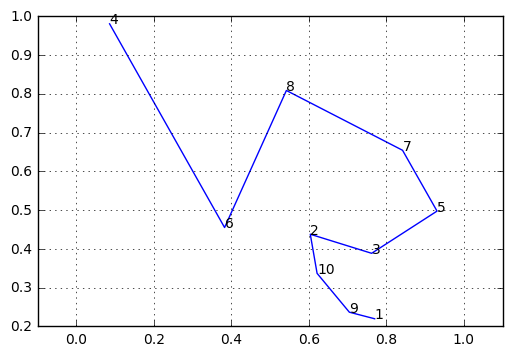

--- 0.0 seconds ---


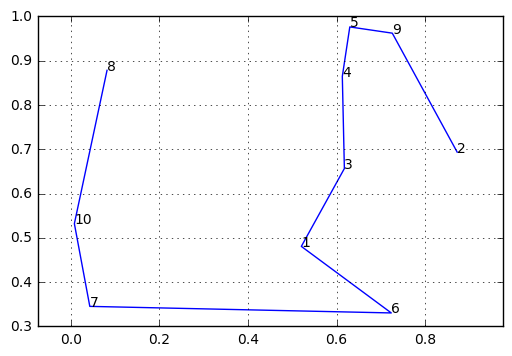

--- 0.0 seconds ---


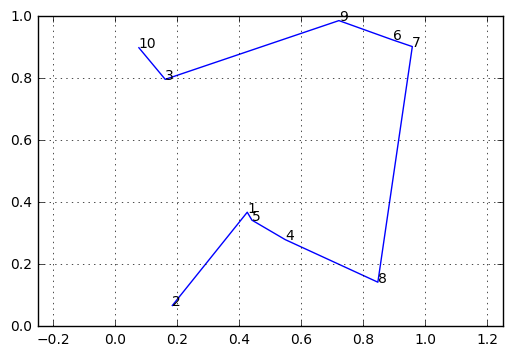

--- 0.0 seconds ---


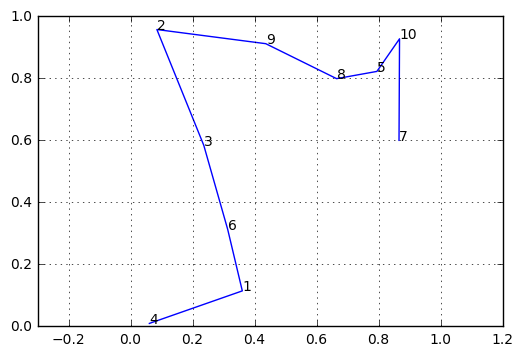

--- 0.0 seconds ---


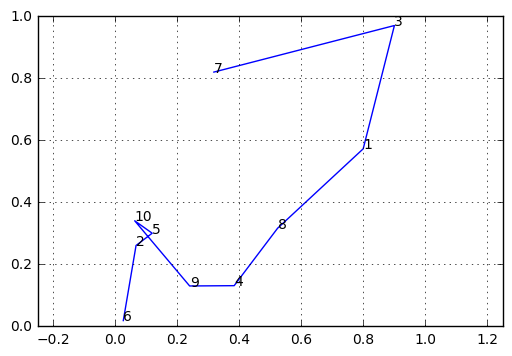

--- 0.0004999637603759766 seconds ---


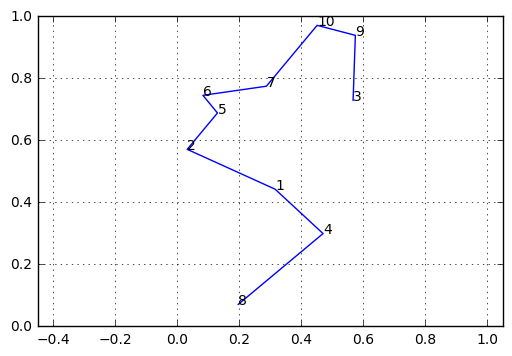

--- 0.0 seconds ---


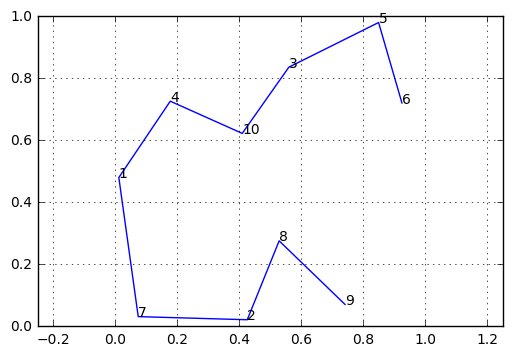

--- 0.0 seconds ---


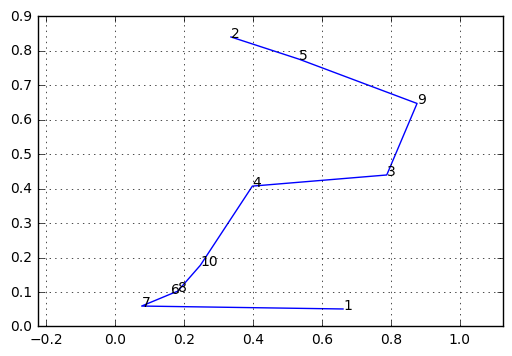

--- 0.0 seconds ---


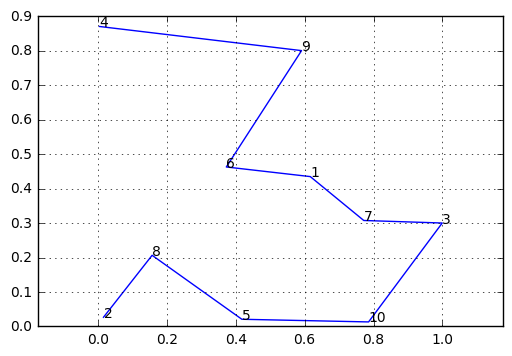

--- 0.0 seconds ---


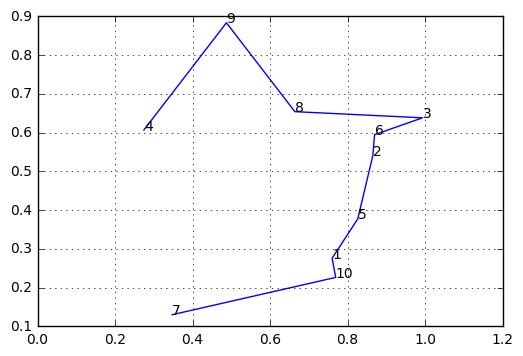

--- 0.0 seconds ---


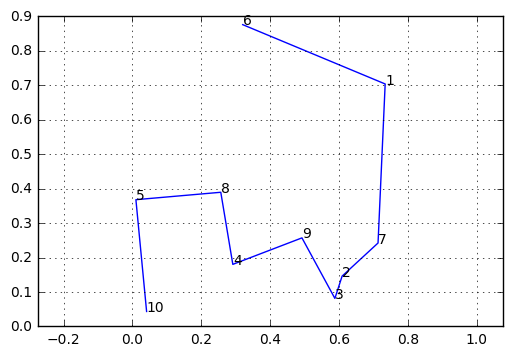

--- 0.0 seconds ---


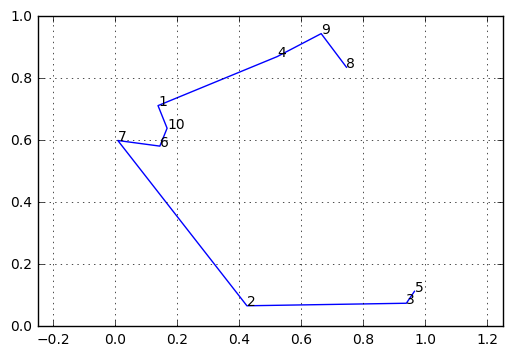

--- 0.0 seconds ---


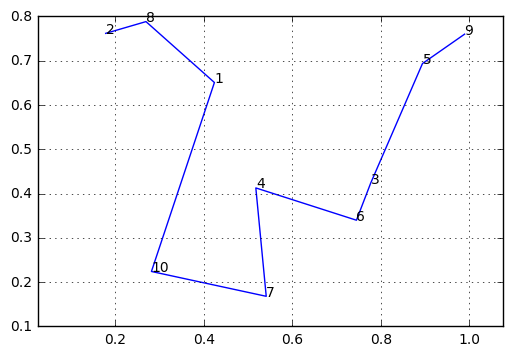

--- 0.0005004405975341797 seconds ---


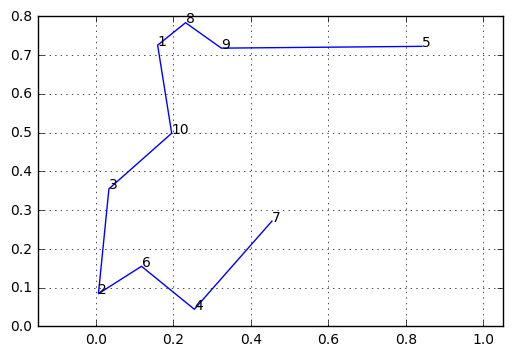

--- 0.0005004405975341797 seconds ---


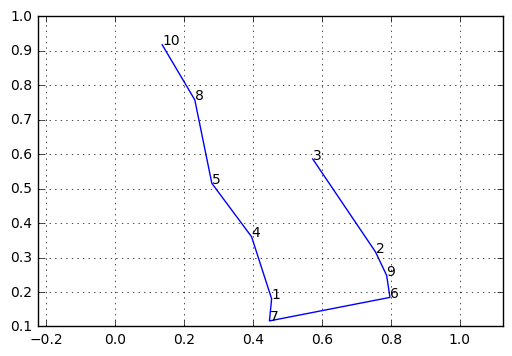

--- 0.0 seconds ---


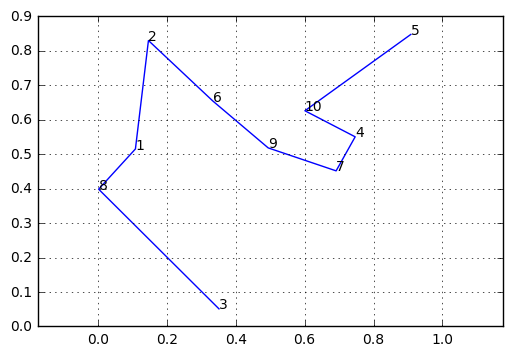

--- 0.0 seconds ---


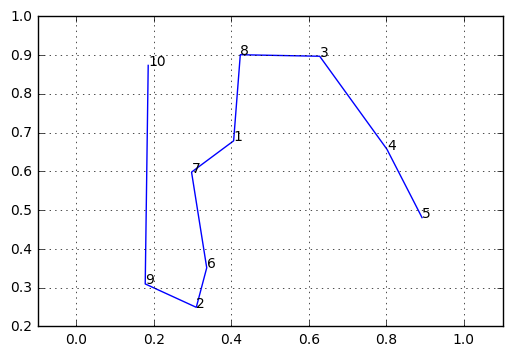

--- 0.0 seconds ---


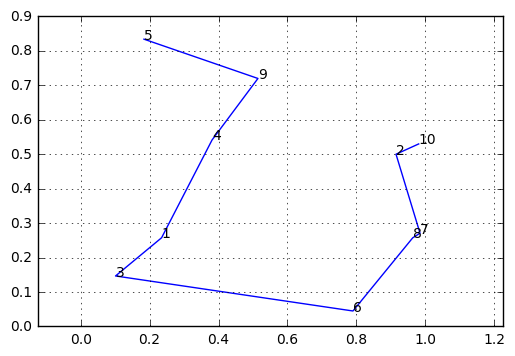

--- 0.0 seconds ---


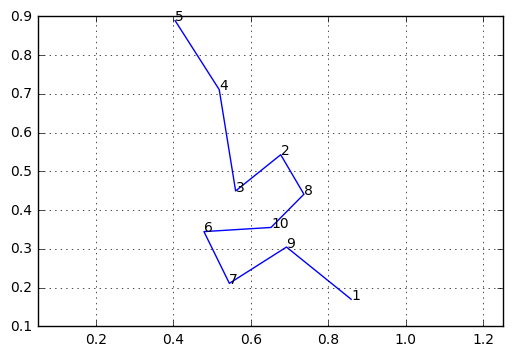

--- 0.0 seconds ---


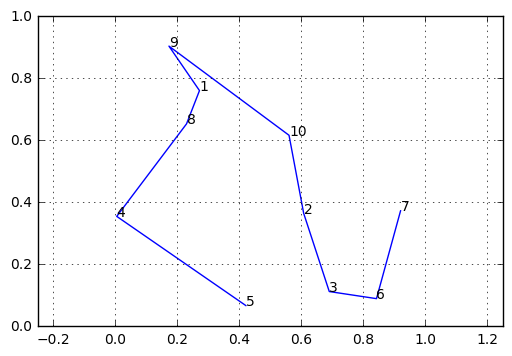

--- 0.0 seconds ---


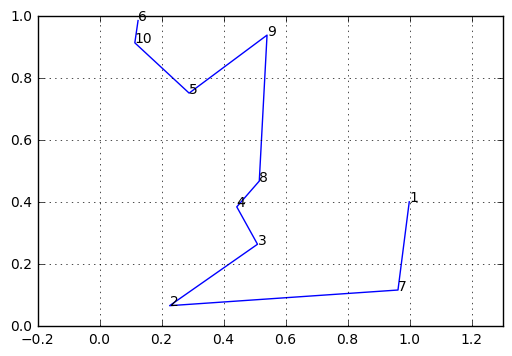

--- 0.0 seconds ---


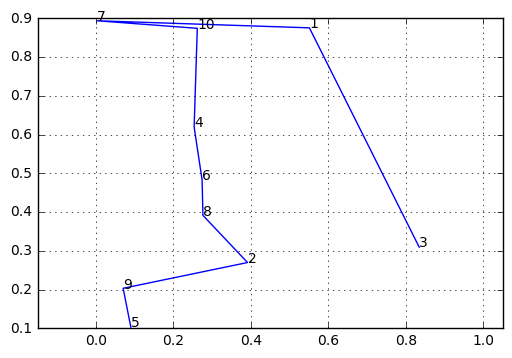

--- 0.0 seconds ---


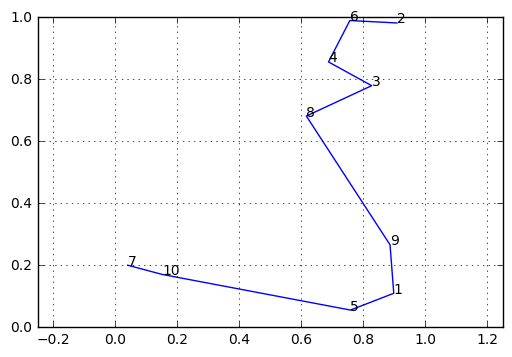

--- 0.0 seconds ---


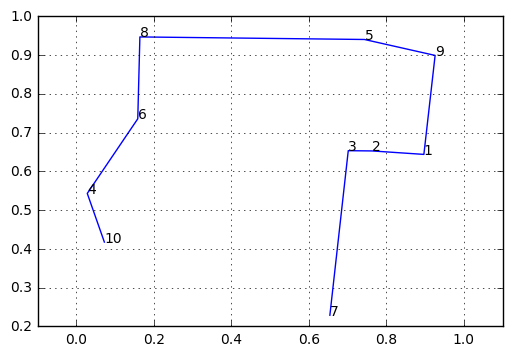

--- 0.0005002021789550781 seconds ---


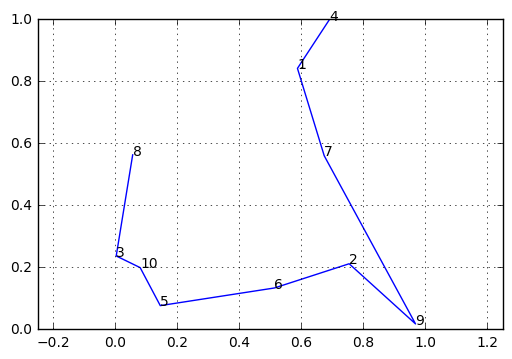

--- 0.0005004405975341797 seconds ---


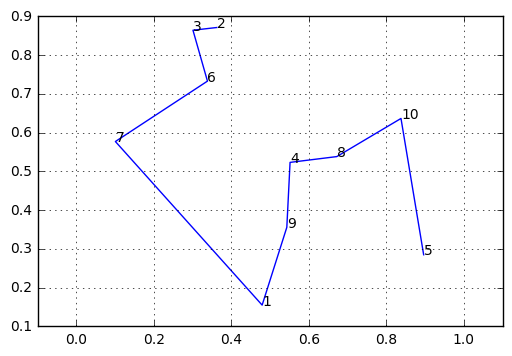

--- 0.0 seconds ---


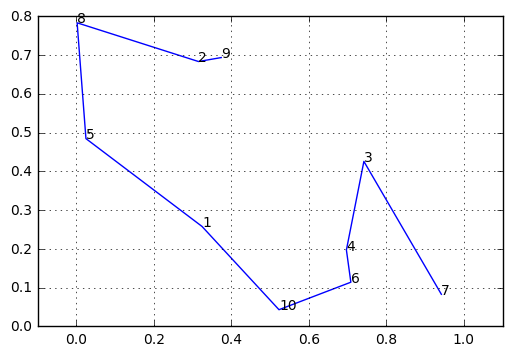

--- 0.0005002021789550781 seconds ---


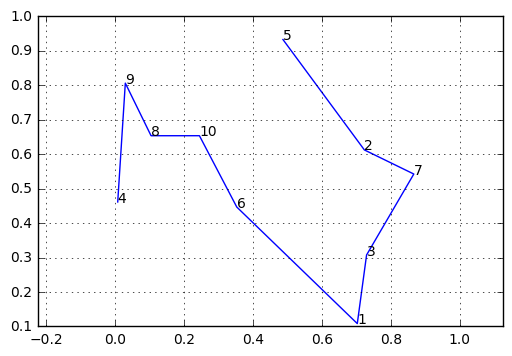

--- 0.0005006790161132812 seconds ---


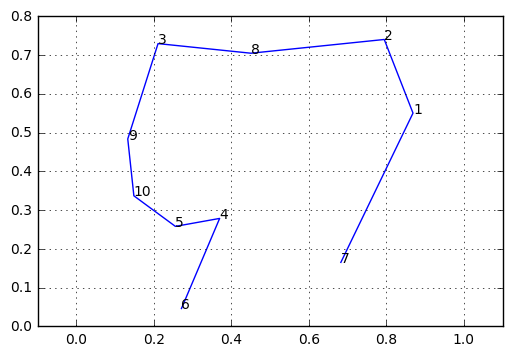

--- 0.0 seconds ---


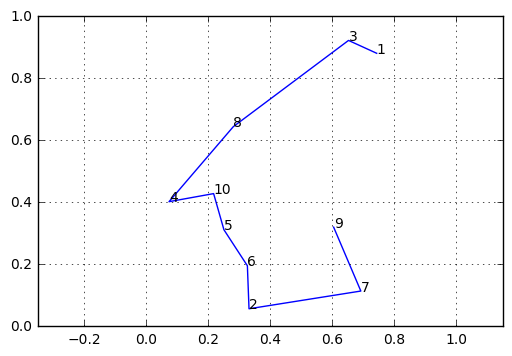

--- 0.0004901885986328125 seconds ---


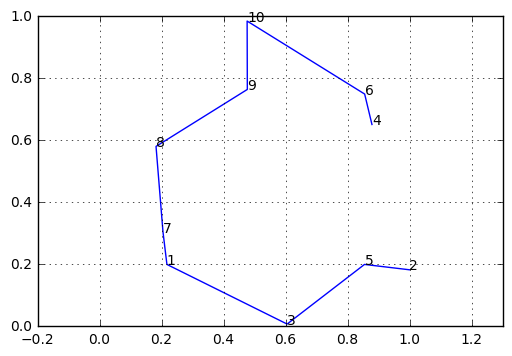

--- 0.0 seconds ---


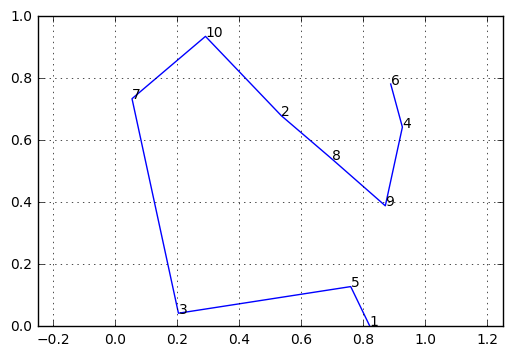

--- 0.0005004405975341797 seconds ---


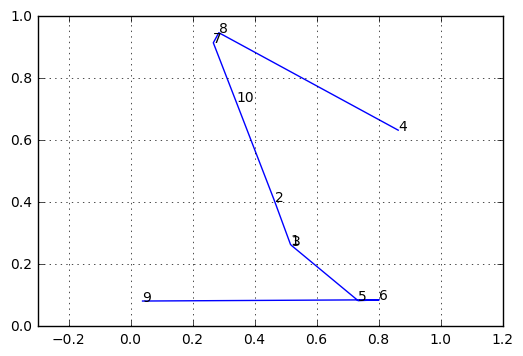

--- 0.0 seconds ---


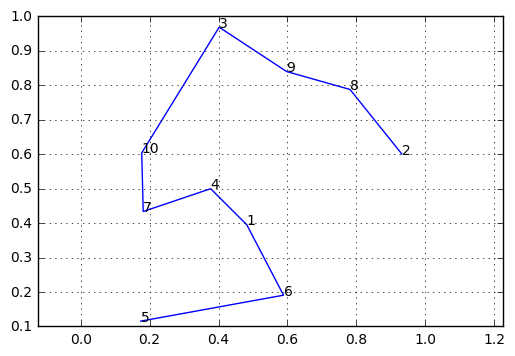

--- 0.0 seconds ---


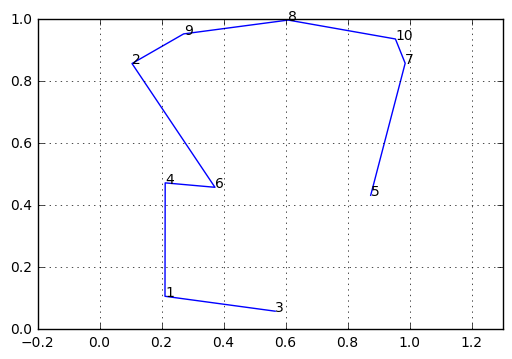

--- 0.0 seconds ---


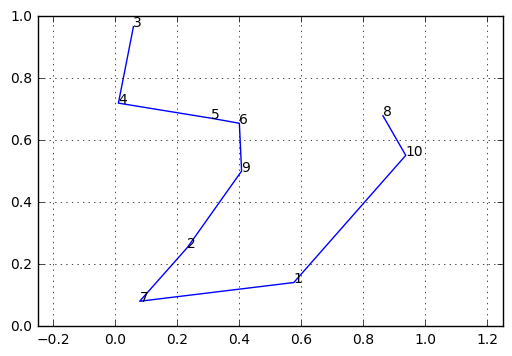

--- 0.0005002021789550781 seconds ---


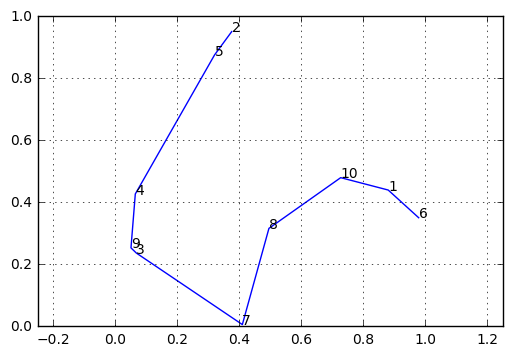

--- 0.0 seconds ---


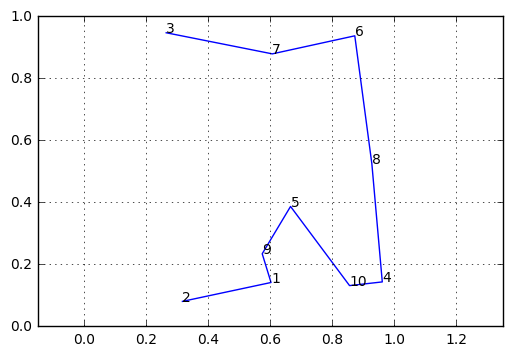

--- 0.0 seconds ---


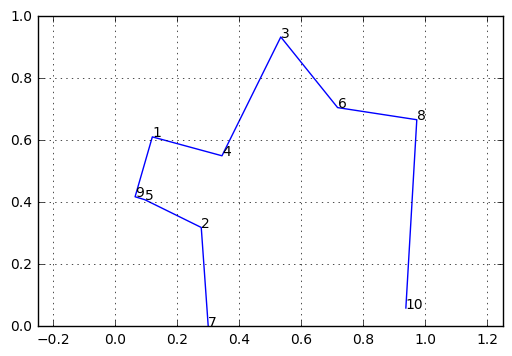

--- 0.0 seconds ---


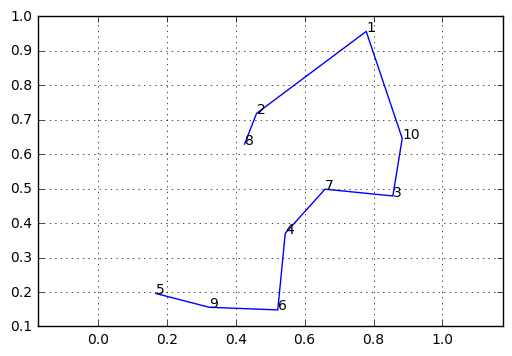

--- 0.0004990100860595703 seconds ---


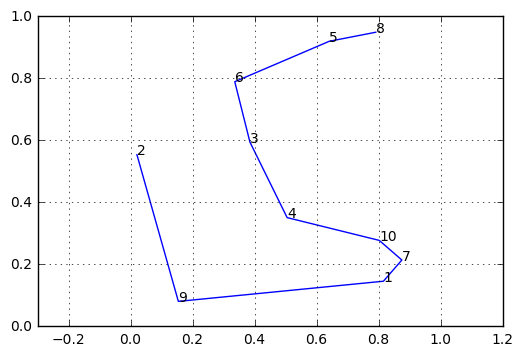

--- 0.0005006790161132812 seconds ---


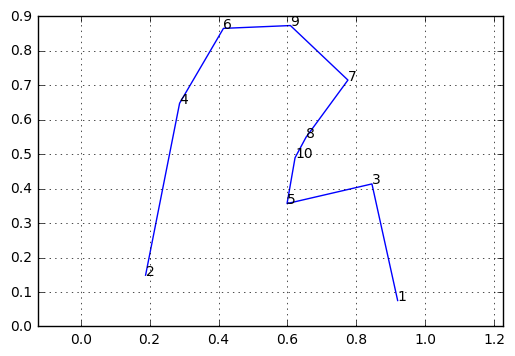

In [59]:
l_etape = []
l=[]

for i in range(3,11):
    for j in range(100):  
        villes = gen_villes(i)
        S_tsp = tsp_solver(villes)
        start_time = time.time()
        S_etape = solution_traveling_salesman_problem_dirichlet(villes,10000)
        timing_etape = time.time() - start_time
        l_etape.append(S_etape[-2])
        l_etape.append(timing_etape)
    #l_etape.append(S_tsp[0])
    l.append(l_etape)
    l_etape=[]


In [64]:
dataf = pd.DataFrame(l, index =   [i for i in range(3,11)])
dataf.index.names = ['Nombre de villes']
dataf

,0,1,2,3,4,5,6,7,8,9,...,191,192,193,194,195,196,197,198,199,200
Nombre de villes,,,,,,,,,,,,,,,,,,,,,
3,1.151815,0.897135,0.678898,1.087372,0.708525,0.916138,0.906271,0.875202,1.265210,0.929904,...,0.968184,1.112111,0.904168,0.866304,0.852802,0.815111,0.904656,0.972303,0.964750,0.972303
4,1.194261,2.429909,1.348693,2.537661,1.060496,2.431022,0.846285,2.488667,1.242889,1.237358,...,2.532580,0.964053,2.486818,1.070663,2.517962,1.221025,2.468308,1.559981,2.424835,1.559981
5,1.969149,5.022666,1.680112,3.329433,1.596914,4.973173,1.732220,3.530665,1.038671,3.351792,...,5.124197,1.470203,5.230681,1.037565,3.377856,1.068075,3.516032,0.975929,5.248743,0.975929
6,1.668450,11.198643,1.509793,13.408495,1.687529,6.733326,2.003707,9.032845,1.570784,12.920213,...,8.769612,1.585658,6.697002,1.468371,11.034925,1.381282,11.086375,1.852613,8.836341,1.852613
7,2.226071,16.743953,1.457997,11.057234,1.493029,16.670895,2.463861,16.668363,2.063909,19.505486,...,13.855353,2.208675,16.807144,1.563220,13.869501,1.404097,16.717727,2.216243,19.806251,1.962536
8,2.215880,23.851622,2.169530,17.319871,2.442027,27.453029,2.320766,24.157081,1.905861,24.276785,...,20.574670,1.787438,20.598701,2.655425,27.649442,2.124017,20.608900,1.552477,24.125070,1.552477
9,1.877231,29.677422,2.065856,42.033443,2.877448,37.642839,1.382298,33.885082,1.661195,30.559999,...,25.143464,2.435695,29.819155,2.226641,43.697400,1.756746,25.492654,2.122337,33.670608,1.667250
10,2.125951,45.975237,2.141336,35.042816,2.803134,49.377568,1.876336,40.075157,2.118210,40.937966,...,46.127091,2.576173,36.195591,1.954802,40.971436,2.674645,46.290930,2.536724,56.014362,2.193514


In [88]:
dataf
distance = [i for i in range(0,200,2)]
time = [i+1 for i in range(0,200,2)]

In [94]:
dataf_time= dataf.drop(distance, axis=1)
dataf_distance = dataf.drop(time, axis=1)

dataf_time['Mean'] = dataf_time.mean(numeric_only=True, axis=1)
dataf_time['Std'] = dataf_time.std(numeric_only = True, axis=1)

dataf_distance['Mean'] = dataf_distance.mean(numeric_only=True, axis=1)
dataf_distance['Std'] = dataf_distance.std(numeric_only = True, axis=1)

dataf_distance

,0,2,4,6,8,10,12,14,16,18,...,184,186,188,190,192,194,196,198,Mean,Std
Nombre de villes,,,,,,,,,,,,,,,,,,,,,
3,1.151815,0.678898,0.708525,0.906271,1.265210,0.294724,0.635389,1.102280,0.911892,0.525230,...,0.537183,0.880761,0.809888,0.869069,1.112111,0.866304,0.815111,0.972303,0.873429,0.267188
4,1.194261,1.348693,1.060496,0.846285,1.242889,0.880792,1.116591,1.313508,1.184823,1.443317,...,1.974299,1.034862,1.332125,1.519606,0.964053,1.070663,1.221025,1.559981,1.116145,0.274256
5,1.969149,1.680112,1.596914,1.732220,1.038671,1.589764,1.543159,1.533682,1.623446,1.526347,...,1.108592,0.892493,1.319100,1.353607,1.470203,1.037565,1.068075,0.975929,1.420662,0.307862
6,1.668450,1.509793,1.687529,2.003707,1.570784,2.259780,1.628938,1.489569,1.580594,1.081626,...,1.693580,1.780114,1.415600,1.764879,1.585658,1.468371,1.381282,1.852613,1.592313,0.329772
7,2.226071,1.457997,1.493029,2.463861,2.063909,2.262409,1.582627,1.756491,2.046154,2.107355,...,2.115850,1.907290,1.931496,1.806210,2.208675,1.563220,1.404097,2.216243,1.822478,0.337443
8,2.215880,2.169530,2.442027,2.320766,1.905861,1.388766,2.013532,2.210978,1.982017,2.265648,...,1.837316,2.136174,1.816439,1.717362,1.787438,2.655425,2.124017,1.552477,1.901698,0.327924
9,1.877231,2.065856,2.877448,1.382298,1.661195,2.404942,2.084539,1.978199,1.843782,1.579351,...,2.081480,2.313693,2.609553,2.947860,2.435695,2.226641,1.756746,2.122337,2.169477,0.311388
10,2.125951,2.141336,2.803134,1.876336,2.118210,2.637810,1.535755,2.323317,2.302586,3.063507,...,2.907595,2.578277,2.369867,2.473630,2.576173,1.954802,2.674645,2.536724,2.355677,0.333405


In [102]:
from bokeh.plotting import figure, show, output_file


xs = dataf_time.index
yerrs = dataf_time["Std"]
ys = dataf_time["Mean"]


# plot the points
p = figure(title='Moyenne pour 100 simulations et intervalles de Deux Ecart-Types', width=800, height=400)

p.xaxis.axis_label = 'Nombres de Villes'
p.yaxis.axis_label = 'Moyenne de temps pour 100 villes'

p.line(dataf_time.index, ys,
        color='blue', legend='Moyenne pour 100 simulations')
p.circle(xs, ys, color='blue', size=5, line_alpha=0)

p.legend.location = "top_left"

# create the coordinates for the errorbars
err_xs = []
err_ys = []

for x, y, yerr in zip(xs, ys, yerrs):
    err_xs.append((x, x))
    err_ys.append((y - 2*yerr, y + 2*yerr))

# plot them
p.multi_line(err_xs, err_ys, color='red')

show(p)

In [103]:
xs = dataf_distance.index
yerrs = dataf_distance["Std"]
ys = dataf_distance["Mean"]


# plot the points
p = figure(title='Moyenne pour 100 simulations et intervalles de Deux Ecart-Types', width=800, height=400)

p.xaxis.axis_label = 'Nombres de Villes'
p.yaxis.axis_label = 'Moyenne des distances pour 100 villes'

p.line(dataf_time.index, ys,
        color='blue', legend='Moyenne pour 100 simulations')
p.circle(xs, ys, color='blue', size=5, line_alpha=0)

p.legend.location = "top_left"

# create the coordinates for the errorbars
err_xs = []
err_ys = []

for x, y, yerr in zip(xs, ys, yerrs):
    err_xs.append((x, x))
    err_ys.append((y - 2*yerr, y + 2*yerr))

# plot them
p.multi_line(err_xs, err_ys, color='red')

show(p)

## Avec les villes du Tour de France

In [1]:
from geopy.geocoders import Nominatim
geolocator = Nominatim()
villes_étapes = ["Liège","Seraing-sur-Meuse","Visé","Tournai","Boulogne-sur-Mer","Abbeville","Rouen","Saint-Quentin",
                 "Epernay","Metz","Tomblaine","Belfort","Porrentruy","Besançon","Arc-et-Senans","Mâcon",
                 "Bellegarde-sur-Valserine","Albertville","La Toussuire","Saint-Jean-de-Maurienne","Annonay",
                "Saint-Paul-Trois-Châteaux","Le Cap d'Agde","Limoux","Foix","Samatan","Pau","Bagnères-de-Luchon",
                "Peyragudes","Blagnac","Brive-la-Gaillarde","Bonneval","Chartres","Rambouillet","Paris"]
Etapes = []
for ville in villes_étapes:
    Etapes.append([ville,(geolocator.geocode(ville).latitude,geolocator.geocode(ville).longitude)])
print(Etapes)

[['Liège', (50.6451381, 5.5734203)], ['Seraing-sur-Meuse', (50.5966392, 5.5083375)], ['Visé', (50.7336644, 5.695536)], ['Tournai', (50.60566, 3.3878259)], ['Boulogne-sur-Mer', (50.7259985, 1.6118771)], ['Abbeville', (50.1060835, 1.8337029)], ['Rouen', (49.4404591, 1.0939658)], ['Saint-Quentin', (49.8486111, 3.2863888)], ['Epernay', (45.4523623, 5.8840111)], ['Metz', (49.1196964, 6.1763552)], ['Tomblaine', (48.6864409, 6.2106707)], ['Belfort', (47.6379599, 6.8628942)], ['Porrentruy', (47.4171297, 7.0761342)], ['Besançon', (47.237953, 6.0243246)], ['Arc-et-Senans', (47.0332329, 5.7818173)], ['Mâcon', (46.3036683, 4.8322266)], ['Bellegarde-sur-Valserine', (46.1085565, 5.8259295)], ['Albertville', (45.6754622, 6.3925417)], ['La Toussuire', (45.2557745, 6.2626689)], ['Saint-Jean-de-Maurienne', (45.2775258, 6.3453329)], ['Annonay', (45.2399639, 4.6675475)], ['Saint-Paul-Trois-Châteaux', (44.3475554, 4.7707325)], ["Le Cap d'Agde", (43.2845374, 3.5117752)], ['Limoux', (43.0538068, 2.2176533)],

Au cas où le module geopy n'est pas installé :

In [4]:
Etapes = [['Liège', (50.6451381, 5.5734203)], ['Seraing-sur-Meuse', (50.5966392, 5.5083375)], ['Visé', (50.7336644, 5.695536)], ['Tournai', (50.60566, 3.3878259)], ['Boulogne-sur-Mer', (50.7259985, 1.6118771)], ['Abbeville', (50.1060835, 1.8337029)], ['Rouen', (49.4404591, 1.0939658)], ['Saint-Quentin', (49.8486111, 3.2863888)], ['Epernay', (49.0436181, 3.9551593)], ['Metz', (49.1196964, 6.1763552)], ['Tomblaine', (48.6864409, 6.2106707)], ['Belfort', (47.6379599, 6.8628942)], ['Porrentruy', (47.4171297, 7.0761342)], ['Besançon', (47.237953, 6.0243246)], ['Arc-et-Senans', (47.0332329, 5.7818173)], ['Mâcon', (46.3036683, 4.8322266)], ['Bellegarde-sur-Valserine', (46.1085565, 5.8259295)], ['Albertville', (45.6754622, 6.3925417)], ['La Toussuire', (45.2557745, 6.2626689)], ['Saint-Jean-de-Maurienne', (45.2775258, 6.3453329)], ['Annonay', (45.2399639, 4.6675475)], ['Saint-Paul-Trois-Châteaux', (44.3475554, 4.7707325)], ["Le Cap d'Agde", (43.2845374, 3.5117752)], ['Limoux', (43.0538068, 2.2176533)], ['Foix', (42.9660039, 1.6096025)], ['Samatan', (43.4936111, 0.9316667)], ['Pau', (43.2957547, -0.3685667)], ['Bagnères-de-Luchon', (42.7910656, 0.5916857)], ['Peyragudes', (42.787583, 0.4766419)], ['Blagnac', (43.6434, 1.37799)], ['Brive-la-Gaillarde', (45.1584982, 1.5332389)], ['Bonneval', (45.3120931, 3.7409368)], ['Chartres', (48.4470039, 1.4866387)], ['Rambouillet', (48.6482463, 1.8328853)], ['Paris', (48.8566101, 2.3514992)]]

In [5]:
import matplotlib.pyplot as plt

C:\Users\User\Anaconda3\lib\site-packages\mpl_toolkits\basemap\__init__.py:1704: MatplotlibDeprecationWarning: The axesPatch function was deprecated in version 2.1. Use Axes.patch instead.
  limb = ax.axesPatch
C:\Users\User\Anaconda3\lib\site-packages\mpl_toolkits\basemap\__init__.py:1707: MatplotlibDeprecationWarning: The axesPatch function was deprecated in version 2.1. Use Axes.patch instead.
  if limb is not ax.axesPatch:


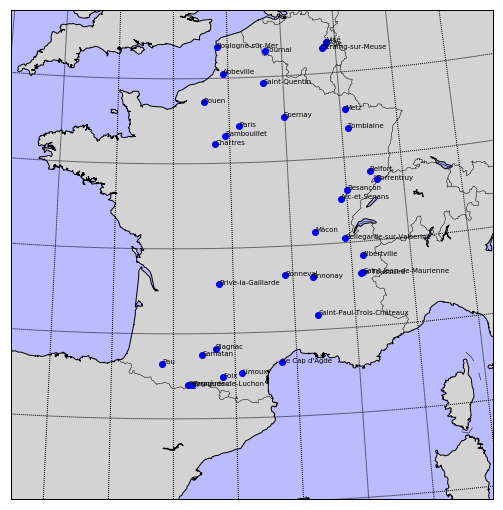

In [6]:

from mpl_toolkits.basemap import Basemap
import numpy

import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 1, figsize=(9,9))

m = Basemap(llcrnrlon=-5, llcrnrlat=40, urcrnrlon=12, urcrnrlat=51,
            resolution='i',projection='cass',lon_0=0,lat_0=0,
           ax=axes)
m.drawcoastlines()
m.drawcountries()
m.fillcontinents(color='lightgrey', lake_color='#AAAAFF')

m.drawparallels(numpy.arange(-40,61.,2.))
m.drawmeridians(numpy.arange(-20.,21.,2.))
m.drawmapboundary(fill_color='#BBBBFF')

Etapes =[['Liège', (50.6451381, 5.5734203)], ['Seraing-sur-Meuse', (50.5966392, 5.5083375)], ['Visé', (50.7336644, 5.695536)], ['Tournai', (50.60566, 3.3878259)], ['Boulogne-sur-Mer', (50.7259985, 1.6118771)], ['Abbeville', (50.1060835, 1.8337029)], ['Rouen', (49.4404591, 1.0939658)], ['Saint-Quentin', (49.8486111, 3.2863888)], ['Epernay', (49.0436181, 3.9551593)], ['Metz', (49.1196964, 6.1763552)], ['Tomblaine', (48.6864409, 6.2106707)], ['Belfort', (47.6379599, 6.8628942)], ['Porrentruy', (47.4171297, 7.0761342)], ['Besançon', (47.237953, 6.0243246)], ['Arc-et-Senans', (47.0332329, 5.7818173)], ['Mâcon', (46.3036683, 4.8322266)], ['Bellegarde-sur-Valserine', (46.1085565, 5.8259295)], ['Albertville', (45.6754622, 6.3925417)], ['La Toussuire', (45.2557745, 6.2626689)], ['Saint-Jean-de-Maurienne', (45.2775258, 6.3453329)], ['Annonay', (45.2399639, 4.6675475)], ['Saint-Paul-Trois-Châteaux', (44.3475554, 4.7707325)], ["Le Cap d'Agde", (43.2845374, 3.5117752)], ['Limoux', (43.0538068, 2.2176533)], ['Foix', (42.9660039, 1.6096025)], ['Samatan', (43.4936111, 0.9316667)], ['Pau', (43.2957547, -0.3685667)], ['Bagnères-de-Luchon', (42.7910656, 0.5916857)], ['Peyragudes', (42.787583, 0.4766419)], ['Blagnac', (43.6434, 1.37799)], ['Brive-la-Gaillarde', (45.1584982, 1.5332389)], ['Bonneval', (45.3120931, 3.7409368)], ['Chartres', (48.4470039, 1.4866387)], ['Rambouillet', (48.6482463, 1.8328853)], ['Paris', (48.8566101, 2.3514992)]]


X = [Etapes[i][1][1] for i in range(len(Etapes))]
Y = [Etapes[i][1][0] for i in range(len(Etapes))]
N =[Etapes[i][0] for i in range(len(Etapes))]


for z,t,n in zip(X,Y,N):
    lon = z
    lat = t
    x,y = m(lon, lat)
    m.plot(x, y, 'bo',  markersize=6)
    plt.text(x, y,n, fontsize = 7)

plt.show() 
   

On rajoute le trajet trouvé.

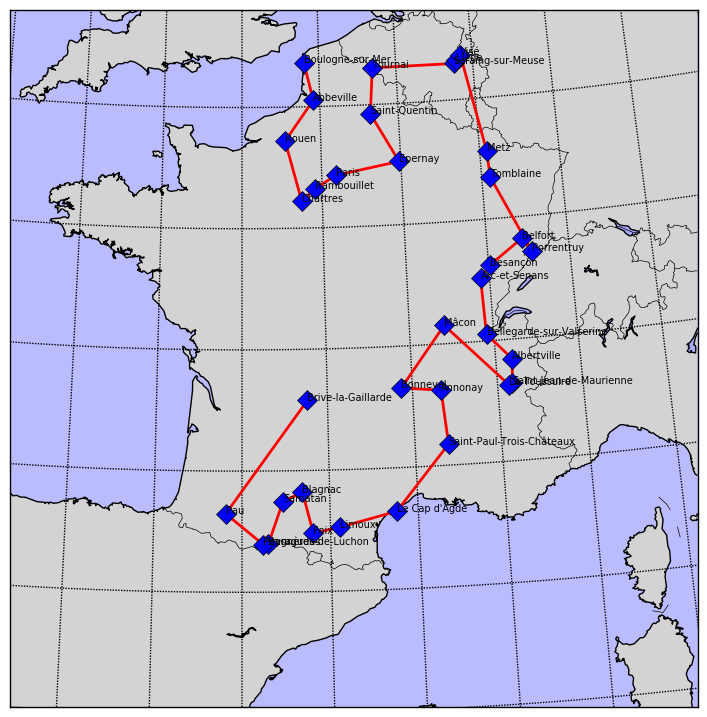

In [5]:
fig, axes = plt.subplots(1, 1, figsize=(9,9))

m = Basemap(llcrnrlon=-5, llcrnrlat=40, urcrnrlon=12, urcrnrlat=51,
            resolution='i',projection='cass',lon_0=0,lat_0=0,
           ax=axes)
m.drawcoastlines()
m.drawcountries()
m.fillcontinents(color='lightgrey', lake_color='#AAAAFF')

m.drawparallels(numpy.arange(-40,61.,2.))
m.drawmeridians(numpy.arange(-20.,21.,2.))
m.drawmapboundary(fill_color='#BBBBFF')

path = [4, 5, 6, 32, 33, 34, 8, 7, 3, 1, 0, 2, 9, 10, 12, 11, 13, 14, 16, 17, 19, 18, 15, 31, 20, 21, 22, 23, 24, 29, 25, 27, 28, 26, 30]
#Obtenu avec TSP_Solver

villes_sorted_pack = []
for i in range(len(path)):
    villes_sorted_pack.append(Etapes[path[i]][1])
    

E = [villes_sorted_pack[i][1] for i in range(len(villes_sorted_pack))]
F = [villes_sorted_pack[i][0] for i in range(len(villes_sorted_pack))]
n=[villes_sorted_pack[i][0] for i in range(len(villes_sorted_pack))]



for z,t,n in zip(X,Y,N):
    lon = z
    lat = t
    x,y = m(lon, lat)
    m.plot(x, y, 'bo',  markersize=6)
    plt.text(x, y,n, fontsize = 7)

x, y = m(E, F) 
m.plot(x, y, 'D-', markersize=10, linewidth=2, color='r', markerfacecolor='b') 


plt.show()